# Step 1: Import Libraries

In [1]:
import import_ipynb
from SmartTraderLibrary import *

importing Jupyter notebook from requirements_for_wrapper.ipynb


In [2]:
import os
import time
import copy
import warnings
warnings.filterwarnings("ignore")

In [3]:
#TA-Lib Python wrapper for TA-Lib (http://ta-lib.org/).
#https://mrjbq7.github.io/ta-lib/func_groups/momentum_indicators.html

import talib as ta

In [4]:
import matplotlib.pyplot as plt

# Step 2: Explore Dataset

In [5]:
#choose stock dataset to use
data = "goog.us.txt"

main_folder_dir = os.getcwd()
print (main_folder_dir)
stockdata_folder_dir = os.path.join(os.path.join(main_folder_dir, "Data"), "Stocks")
print (stockdata_folder_dir)
data_dir = os.path.join(stockdata_folder_dir, data)
print(data_dir)
print("")

data = pd.read_csv(data_dir)
data['Date'] = pd.to_datetime(data['Date'])
data = data.set_index('Date')
print(data.index.min(), data.index.max())
print(data.count())
print(data.head())

#choose dataset to compare RL performance
market = "voo.us.txt"
etfdata_folder_dir = os.path.join(os.path.join(main_folder_dir, "Data"), "ETFs")
print (etfdata_folder_dir)
market_dir = os.path.join(etfdata_folder_dir, market)
print(market_dir)
print("")

market = pd.read_csv(market_dir)
market['Date'] = pd.to_datetime(market['Date'])
market = market.set_index('Date')
print(market.index.min(), market.index.max())
print(market.count())
print(market.head())

C:\Users\onnwe\Desktop\ISA-PM-SLS-2021-01-09-IS02PT-GRP-StockTradingRL
C:\Users\onnwe\Desktop\ISA-PM-SLS-2021-01-09-IS02PT-GRP-StockTradingRL\Data\Stocks
C:\Users\onnwe\Desktop\ISA-PM-SLS-2021-01-09-IS02PT-GRP-StockTradingRL\Data\Stocks\goog.us.txt

2014-03-27 00:00:00 2017-11-10 00:00:00
Open       916
High       916
Low        916
Close      916
Volume     916
OpenInt    916
dtype: int64
              Open    High     Low   Close  Volume  OpenInt
Date                                                       
2014-03-27  568.00  568.00  552.92  558.46   13052        0
2014-03-28  561.20  566.43  558.67  559.99   41003        0
2014-03-31  566.89  567.00  556.93  556.97   10772        0
2014-04-01  558.71  568.45  558.71  567.16    7932        0
2014-04-02  599.99  604.83  562.19  567.00  146697        0
C:\Users\onnwe\Desktop\ISA-PM-SLS-2021-01-09-IS02PT-GRP-StockTradingRL\Data\ETFs
C:\Users\onnwe\Desktop\ISA-PM-SLS-2021-01-09-IS02PT-GRP-StockTradingRL\Data\ETFs\voo.us.txt

2010-09-14 00

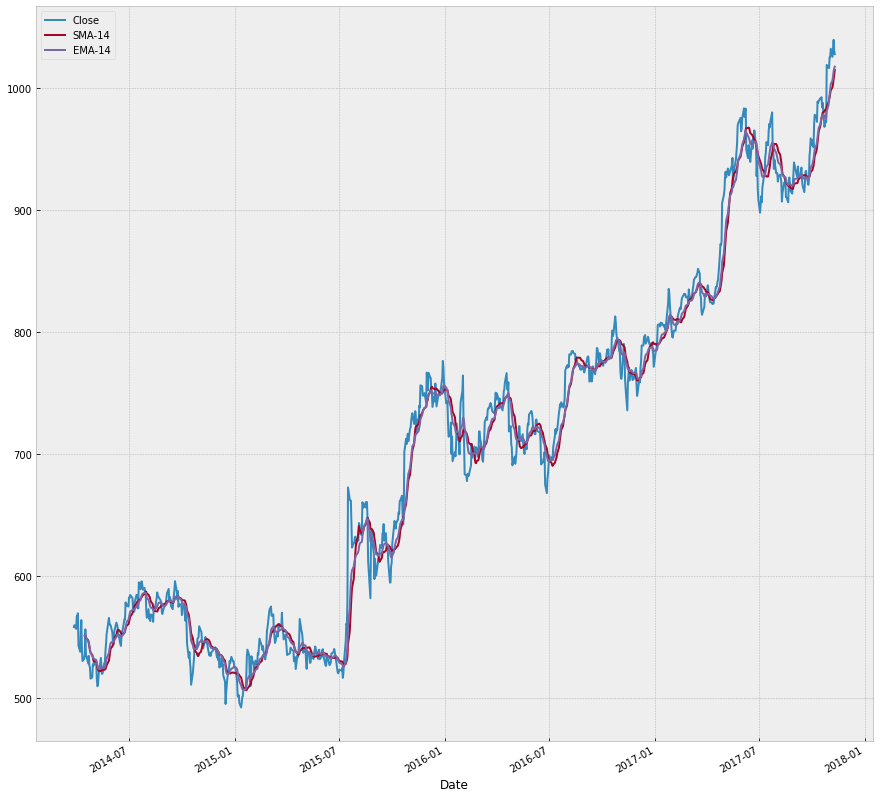

In [6]:
plt.style.use('bmh')

data['SMA-14'] = ta.SMA(data['Close'],14)
data['EMA-14'] = ta.EMA(data['Close'], timeperiod = 14)

# Plot
data[['Close','SMA-14','EMA-14']].plot(figsize=(15,15))
plt.show()

Bollinger Bands 
https://blog.quantinsti.com/bollinger-bands/

Bollinger band is used to analyse if stock it is overbought or oversold.

Bollinger Bands actually consist of three bands:

- 20-day moving average
- Upper Bollinger band - 2 standard deviations above
- Lower Bollinger band - 2 standard deviations below

Used for trading strategies:
- Reversal
- Band squeeze
- double top / bottoms
- Trading in the bands

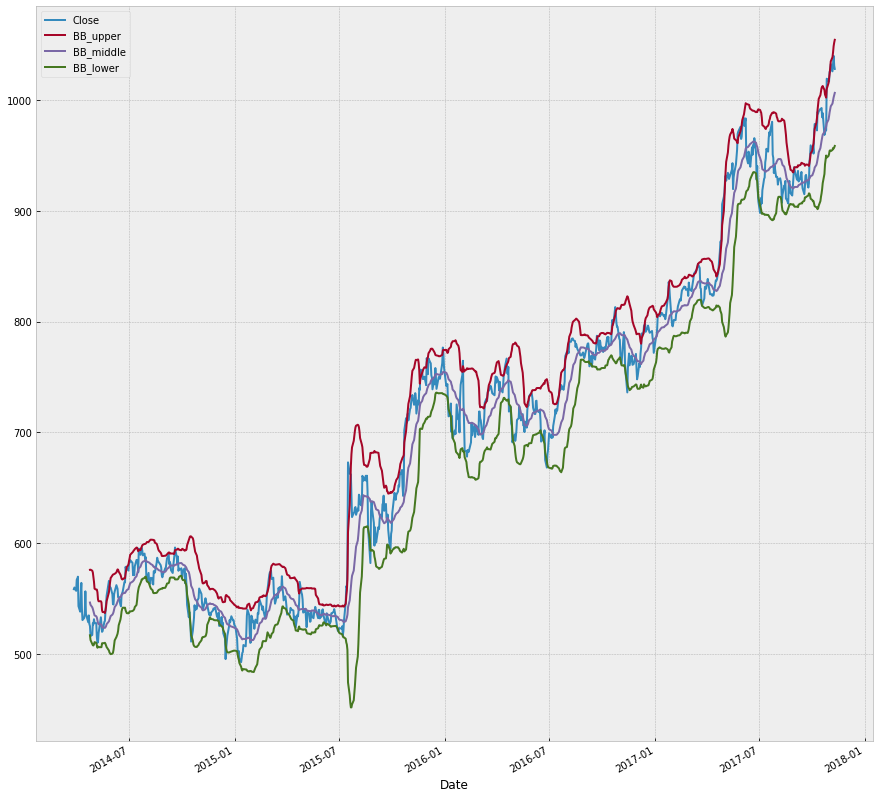

In [7]:
# Bollinger Bands
data['BB_upper'], data['BB_middle'], data['BB_lower'] = ta.BBANDS(data['Close'], timeperiod =20)
# Plot
data[['Close','BB_upper','BB_middle','BB_lower']].plot(figsize=(15,15))
plt.show()

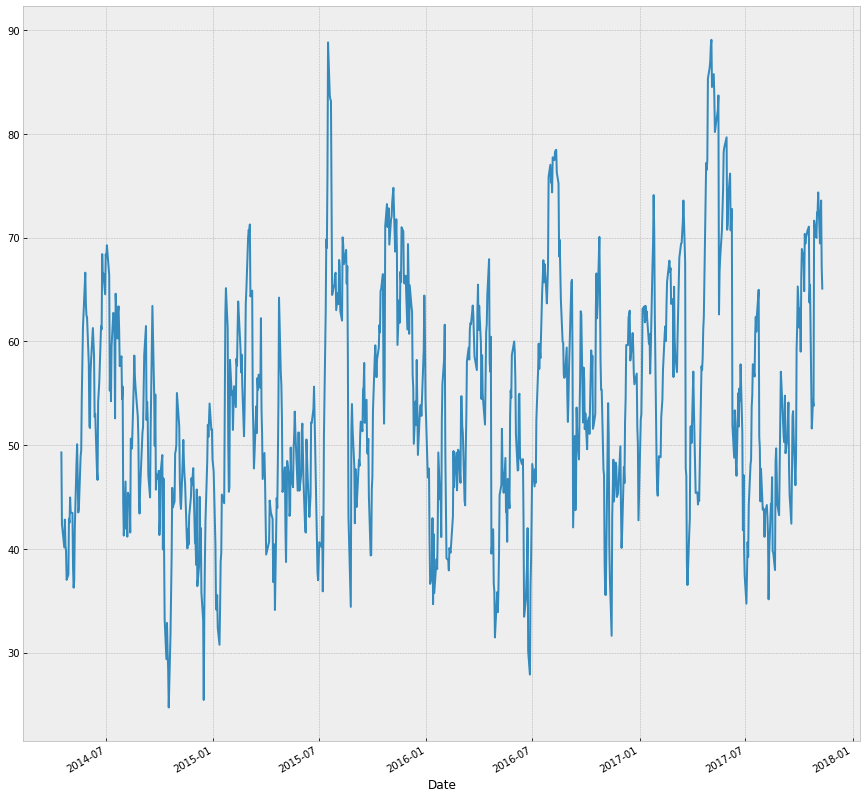

In [8]:
data['RSI'] = ta.RSI(data['Close'],14)
data['RSI'].plot(figsize=(15,15))
plt.show()

Stochastic Oscillator
https://blog.quantinsti.com/stochastic-oscillator/

Stochastic Oscillator is a momentum indicator which compares the recent closing price of an asset to a range of its prices over a specific period of time. 

It is an indicator which does not follow price or volume but signifies the speed, or momentum of a price. Helps to identify a bullish or bearish trend in the market.

The Stochastic oscillator indicator is used in the following manner:

Overbought and Oversold signals
Divergence indicator (Bulls and Bears)
Crossover strategy

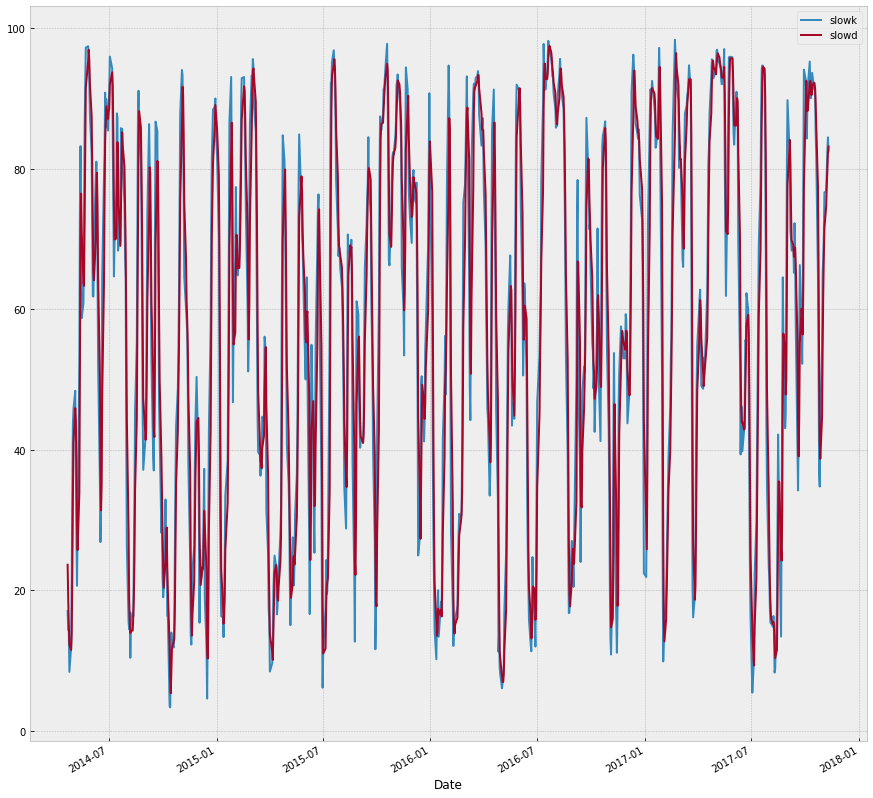

In [9]:
data['slowk'], data['slowd'] = ta.STOCH(data['High'], data['Low'], data['Close'], fastk_period=14, slowk_period=3, slowk_matype=0, slowd_period=3, slowd_matype=0)
data[['slowk','slowd']].plot(figsize=(15,15))
plt.show()

What is a fast Stochastic oscillator? And what is a slow Stochastic oscillator?
The reason we use two lines is that we can use the crossover of the two lines as a signal, more specifically, the %D line can be called the signal line.

To emphasize the importance of the %D line, the stochastic oscillator was modified into two types:

Fast Stochastic Oscillator, and
Slow Stochastic Oscillator

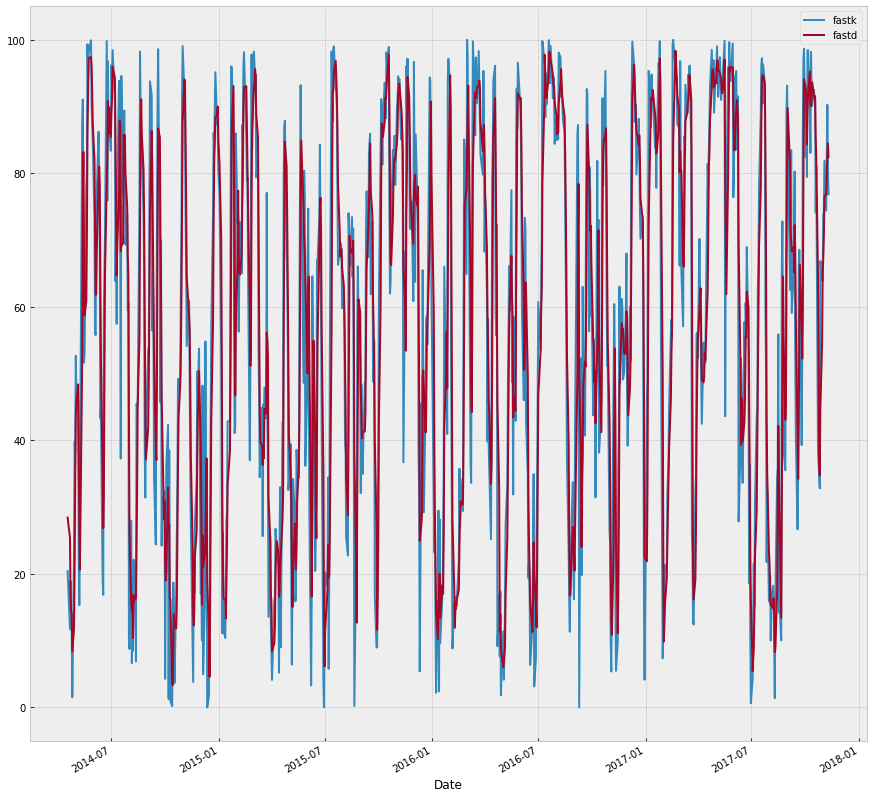

In [10]:
data['fastk'], data['fastd'] = ta.STOCHF(data['High'], data['Low'], data['Close'], fastk_period=14, fastd_period=3, fastd_matype=0)
data[['fastk','fastd']].plot(figsize=(15,15))
plt.show()

In [11]:
data.describe()

,Open,High,Low,Close,Volume,OpenInt,SMA-14,EMA-14,BB_upper,BB_middle,BB_lower,RSI,slowk,slowd,fastk,fastd
count,916.000000,916.000000,916.000000,916.000000,9.160000e+02,916.0,903.000000,903.000000,897.000000,897.000000,897.000000,902.000000,899.000000,899.000000,901.000000,901.000000
mean,702.895757,708.114831,697.058311,702.812259,1.725988e+06,0.0,701.525454,701.634045,729.682251,701.054460,672.426669,53.997804,57.854112,57.791033,57.831730,57.785478
std,144.142510,144.697658,143.888208,144.496999,9.540722e+05,0.0,141.648913,141.471531,144.137476,140.533566,138.762674,11.388402,27.001472,26.049248,29.203824,27.010815
min,494.650000,495.980000,487.560000,492.550000,7.932000e+03,0.0,506.528571,507.036802,536.946353,512.012000,451.724236,24.708832,3.326388,5.350990,0.000000,3.326388
25%,560.525000,565.097500,555.627500,559.792500,1.173610e+06,0.0,556.667143,555.816546,581.506256,556.720500,532.203221,45.648342,34.993324,35.805223,34.224430,34.882230
50%,710.780000,718.380000,703.450000,711.005000,1.511322e+06,0.0,711.674286,712.946076,747.206693,711.952000,677.577698,52.736557,59.865795,59.563281,60.419849,59.716599
75%,793.825000,798.057500,787.887750,794.257500,1.988164e+06,0.0,790.365357,787.371430,813.734024,787.744500,766.228839,61.824534,83.165229,81.385981,85.074169,83.119102
max,1033.990000,1048.390000,1028.450000,1039.850000,1.116490e+07,0.0,1015.086429,1017.865629,1054.364401,1006.465000,958.565599,89.070171,98.351978,97.495037,100.000000,98.351978


In [12]:
date_split = '2016-01-01'
train = data[:date_split]
test = data[date_split:]
print(len(train), len(test))

market_extra = market[:date_split]
market_compare = market[date_split:]
print(len(market_extra), len(market_compare))

446 470
1334 470


In [13]:
#plot_train_test function imported
plot_train_test(train, test, date_split)

# Step 3: Set up Environment

In [14]:
tnx_cost=-0.01
funding_cost=-0.001
clip_rewards=False
debug=True
history_t=90

In [15]:
#Environment class imported
env = Environment1(train, tnx_cost=tnx_cost, 
                   funding_cost=funding_cost, 
                   clip_rewards=clip_rewards, 
                   debug=debug, 
                   history_t=history_t)
env.reset()
simulate_action = ['BUY','BUY','BUY','HOLD','HOLD','BUY','SELL']
for n in range(len(simulate_action)):
    action = list(act_dict.keys())[list(act_dict.values()).index(simulate_action[n])]  # select simulated action
    env.step(action)



Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: HOLD
HOLD Curr Position:[559.99, 556.97, 567.16] InvestedCap:1684.12 MTM:16.879999999999995 Reward:-1.6841199999999998
Raw Reward:-1.6841199999999998  Actual Reward:-1.6841199999999998


Step:4 Action: HOLD
HOLD Curr Position:[559.99, 556.97, 567.16] InvestedCap:1684.12 MTM:25.100000000000023 Reward:-1.6841199999999998
Raw Reward:-1.6841199999999998  Actual Reward:-1.6841199999999998


Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: SELL
SELL @ 538.15 for purchase @ 559.99. Profit: -21.840000000000032. Cumm step profit: -21.840000000000032
SELL @ 538.15 for purchase

# Step 4: Training of DQN

In [16]:
def train_dqn(env):

    # Q_Network class imported
    Policy_Network = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Target_Network = copy.deepcopy(Policy_Network)
    optimizer = chainer.optimizers.Adam()
    optimizer.setup(Policy_Network)

    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 20
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5

    memory = []
    total_step = 0
    total_rewards = []
    total_losses = []

    start = time.time()
    for epoch in range(epoch_num):

        state = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0

        while not done and step < step_max:
            
            # select action - epsilion greedy policy
            # Includes Hard Constraint: If there are no positions to sell, limit options to "Buy" or "Hold" only
            if len(env.positions) == 0:
                action = np.random.randint(2) # Initialize action to be random at first
            else:
                action = np.random.randint(3)
                
            if np.random.rand() > epsilon:
                action_value = Policy_Network(np.array(state, dtype=np.float32).reshape(1, -1))
                
                # if there are no positions to sell and highest action value is "Sell", choose second best action
                if len(env.positions) == 0 and np.argmax(action_value.data) == 2:
                    action_value.data[0][np.argmax(action_value.data)] = np.min(action_value.data)

                action = np.argmax(action_value.data)

            # act based on selected action
            next_state, reward, done = env.step(action)
            
            # fill up the history before starting the training
            if step < env.history_t - 1:
                step += 1
                continue

            # add memory
            memory.append((state, action, reward, next_state, done)) 
            if len(memory) > memory_size:
                memory.pop(0)

            # train or update q network
            if len(memory) == memory_size: 
                if total_step % train_freq == 0:
                    shuffled_memory = np.random.permutation(memory)
                    memory_idx = range(len(shuffled_memory))
                    for i in memory_idx[::batch_size]: 
                        batch = np.array(shuffled_memory[i:i+batch_size])
                        b_state = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_action = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_next_state = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        #Policy Network
                        action_value = Policy_Network(b_state)
                        
                        #Target Network
                        max_next_action_value = np.max(Target_Network(b_next_state).data, axis=1)
                        target_action_value = copy.deepcopy(action_value.data)
                        for j in range(batch_size):
                            target_action_value[j, b_action[j]] = b_reward[j]+gamma*max_next_action_value[j]*(not b_done[j]) 
                        
                        Policy_Network.reset()
                        loss = F.mean_squared_error(action_value, target_action_value) # here the difference in action values are compared. However, all actions values are included in the loss function as compared to reference code
                        total_loss += loss.data
                        loss.backward()
                        optimizer.update()

                if total_step % update_q_freq == 0:
                    Target_Network = copy.deepcopy(Policy_Network)

            # epsilon
            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            # next step
            total_reward += reward
            state = next_state
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)

        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[((epoch+1)-show_log_freq):])/show_log_freq
            log_loss = sum(total_losses[((epoch+1)-show_log_freq):])/show_log_freq
            elapsed_time = time.time()-start
            print('\t'.join(map(str, [epoch+1, epsilon, total_step, log_reward, log_loss, elapsed_time])))
            start = time.time()
            
    return Policy_Network, total_losses, total_rewards
    

In [17]:
Policy_Network, total_losses, total_rewards = train_dqn(Environment1(train, 
                                                                     tnx_cost=tnx_cost, 
                                                                     funding_cost=funding_cost, 
                                                                     clip_rewards=clip_rewards, 
                                                                     debug=debug, 
                                                                     history_t=history_t))



Step:0 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:1 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:2 Action: BUY
BUY @ 567.16 New Position: [567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: HOLD
HOLD Curr Position:[567.16] InvestedCap:567.16 MTM:-0.15999999999996817 Reward:-0.56716
Raw Reward:-0.56716  Actual Reward:-0.56716


Step:4 Action: SELL
SELL @ 569.74 for purchase @ 567.16. Profit: 2.580000000000041. Cumm step profit: 2.580000000000041
Step Profit = Step Reward:2.580000000000041 Cummulative Strategy Profits:2.580000000000041
Raw Reward:2.580000000000041  Actual Reward:2.580000000000041


Step:5 Action: BUY
BUY @ 543.14 New Position: [543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: HOLD
HOLD Curr Position:[543.14] InvestedCap:543.14 MTM:-4.990000000000009 Reward:-0.54314
Raw Reward:-0.54314  Actual Reward:-0.543



Step:290 Action: BUY
BUY @ 540.11 New Position: [532.3, 539.27, 542.51, 540.11]
Raw Reward:-5.4011000000000005  Actual Reward:-5.4011000000000005


Step:291 Action: BUY
BUY @ 532.32 New Position: [532.3, 539.27, 542.51, 540.11, 532.32]
Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: BUY
BUY @ 539.79 New Position: [532.3, 539.27, 542.51, 540.11, 532.32, 539.79]
Raw Reward:-5.3979  Actual Reward:-5.3979


Step:293 Action: HOLD
HOLD Curr Position:[532.3, 539.27, 542.51, 540.11, 532.32, 539.79] InvestedCap:3226.3 MTM:12.379999999999882 Reward:-3.2263
Raw Reward:-3.2263  Actual Reward:-3.2263


Step:294 Action: HOLD
HOLD Curr Position:[532.3, 539.27, 542.51, 540.11, 532.32, 539.79] InvestedCap:3226.3 MTM:-33.63999999999987 Reward:-3.2263
Raw Reward:-3.2263  Actual Reward:-3.2263


Step:295 Action: SELL
SELL @ 533.99 for purchase @ 532.3. Profit: 1.6900000000000546. Cumm step profit: 1.6900000000000546
SELL @ 533.99 for purchase @ 539.27. Profit: -5.27999



Step:350 Action: BUY
BUY @ 656.13 New Position: [656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: SELL
SELL @ 660.9 for purchase @ 656.13. Profit: 4.769999999999982. Cumm step profit: 4.769999999999982
Step Profit = Step Reward:4.769999999999982 Cummulative Strategy Profits:-0.10999999999950205
Raw Reward:4.769999999999982  Actual Reward:4.769999999999982


Step:352 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:353 Action: BUY
BUY @ 612.48 New Position: [612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: HOLD
HOLD Curr Position:[612.48] InvestedCap:612.48 MTM:-22.870000000000005 Reward:-0.61248
Raw Reward:-0.61248  Actual Reward:-0.61248


Step:355 Action: SELL
SELL @ 582.06 for purchase @ 612.48. Profit: -30.420000000000073. Cumm step profit: -30.420000000000073
Step Profit = Step Reward:-30.420000000000073 Cummulative Strategy Profits:-30.529999999999575
Raw



Step:410 Action: BUY
BUY @ 735.4 New Position: [735.4]
Raw Reward:-7.354  Actual Reward:-7.354


Step:411 Action: SELL
SELL @ 731.23 for purchase @ 735.4. Profit: -4.169999999999959. Cumm step profit: -4.169999999999959
Step Profit = Step Reward:-4.169999999999959 Cummulative Strategy Profits:-31.87999999999937
Raw Reward:-4.169999999999959  Actual Reward:-4.169999999999959


Step:412 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:413 Action: BUY
BUY @ 728.96 New Position: [728.96]
Raw Reward:-7.2896  Actual Reward:-7.2896


Step:414 Action: SELL
SELL @ 725.3 for purchase @ 728.96. Profit: -3.660000000000082. Cumm step profit: -3.660000000000082
Step Profit = Step Reward:-3.660000000000082 Cummulative Strategy Profits:-35.53999999999945
Raw Reward:-3.660000000000082  Actual Reward:-3.660000000000082


Step:415 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:416

BUY @ 574.78 New Position: [568.77, 567.88, 562.73, 574.78]
Raw Reward:-5.7478  Actual Reward:-5.7478


Step:96 Action: BUY
BUY @ 574.65 New Position: [568.77, 567.88, 562.73, 574.78, 574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: HOLD
HOLD Curr Position:[568.77, 567.88, 562.73, 574.78, 574.65] InvestedCap:2848.81 MTM:18.590000000000146 Reward:-2.84881
Raw Reward:-2.84881  Actual Reward:-2.84881


Step:98 Action: SELL
SELL @ 582.16 for purchase @ 568.77. Profit: 13.389999999999986. Cumm step profit: 13.389999999999986
SELL @ 582.16 for purchase @ 567.88. Profit: 14.279999999999973. Cumm step profit: 27.66999999999996
SELL @ 582.16 for purchase @ 562.73. Profit: 19.42999999999995. Cumm step profit: 47.09999999999991
SELL @ 582.16 for purchase @ 574.78. Profit: 7.3799999999999955. Cumm step profit: 54.479999999999905
SELL @ 582.16 for purchase @ 574.65. Profit: 7.509999999999991. Cumm step profit: 61.989999999999895
Step Profit = Step Reward:61.989999999999895 Cummul



Step:154 Action: BUY
BUY @ 545.92 New Position: [545.92]
Raw Reward:-5.4592  Actual Reward:-5.4592


Step:155 Action: HOLD
HOLD Curr Position:[545.92] InvestedCap:545.92 MTM:-3.8799999999999955 Reward:-0.54592
Raw Reward:-0.54592  Actual Reward:-0.54592


Step:156 Action: BUY
BUY @ 541.01 New Position: [545.92, 541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: SELL
SELL @ 547.49 for purchase @ 545.92. Profit: 1.57000000000005. Cumm step profit: 1.57000000000005
SELL @ 547.49 for purchase @ 541.01. Profit: 6.480000000000018. Cumm step profit: 8.050000000000068
Step Profit = Step Reward:8.050000000000068 Cummulative Strategy Profits:-97.7299999999999
Raw Reward:8.050000000000068  Actual Reward:8.050000000000068


Step:158 Action: BUY
BUY @ 550.29 New Position: [550.29]
Raw Reward:-5.5028999999999995  Actual Reward:-5.5028999999999995


Step:159 Action: BUY
BUY @ 547.31 New Position: [550.29, 547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: SELL
SE



Step:205 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:206 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:207 Action: BUY
BUY @ 539.95 New Position: [539.95]
Raw Reward:-5.399500000000001  Actual Reward:-5.399500000000001


Step:208 Action: SELL
SELL @ 535.21 for purchase @ 539.95. Profit: -4.740000000000009. Cumm step profit: -4.740000000000009
Step Profit = Step Reward:-4.740000000000009 Cummulative Strategy Profits:-59.380000000000166
Raw Reward:-4.740000000000009  Actual Reward:-4.740000000000009


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: BUY
BUY @ 510.0 New Position: [510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: SELL
SELL @ 510.66 for purchase @ 510.0. Profit: 0.660000000000025. Cumm step profit: 0.660000000000025
Step 



Step:261 Action: BUY
BUY @ 539.17 New Position: [540.78, 539.17]
Raw Reward:-5.391699999999999  Actual Reward:-5.391699999999999


Step:262 Action: SELL
SELL @ 530.39 for purchase @ 540.78. Profit: -10.389999999999986. Cumm step profit: -10.389999999999986
SELL @ 530.39 for purchase @ 539.17. Profit: -8.779999999999973. Cumm step profit: -19.16999999999996
Step Profit = Step Reward:-19.16999999999996 Cummulative Strategy Profits:6.360000000000468
Raw Reward:-19.16999999999996  Actual Reward:-19.16999999999996


Step:263 Action: BUY
BUY @ 532.53 New Position: [532.53]
Raw Reward:-5.3252999999999995  Actual Reward:-5.3252999999999995


Step:264 Action: HOLD
HOLD Curr Position:[532.53] InvestedCap:532.53 MTM:1.2699999999999818 Reward:-0.53253
Raw Reward:-0.53253  Actual Reward:-0.53253


Step:265 Action: SELL
SELL @ 524.05 for purchase @ 532.53. Profit: -8.480000000000018. Cumm step profit: -8.480000000000018
Step Profit = Step Reward:-8.480000000000018 Cummulative Strategy Profits:-2.1



Step:358 Action: SELL
SELL @ 630.38 for purchase @ 589.61. Profit: 40.76999999999998. Cumm step profit: 40.76999999999998
SELL @ 630.38 for purchase @ 628.62. Profit: 1.759999999999991. Cumm step profit: 42.52999999999997
Step Profit = Step Reward:42.52999999999997 Cummulative Strategy Profits:222.63000000000056
Raw Reward:42.52999999999997  Actual Reward:42.52999999999997


Step:359 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:360 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:361 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:362 Action: BUY
BUY @ 606.25 New Position: [606.25]
Raw Reward:-6.0625  Actual Reward:-6.0625


Step:363 Action: HOLD
HOLD Curr Position:[606.25] InvestedCap:606.25 MTM:-5.5499999999999545 Reward:-0.6062500000000001
Raw Reward:-0.6062500000000001  Actual Reward:-0.60625000



Step:44 Action: HOLD
HOLD Curr Position:[545.06] InvestedCap:545.06 MTM:8.870000000000005 Reward:-0.54506
Raw Reward:-0.54506  Actual Reward:-0.54506


Step:45 Action: HOLD
HOLD Curr Position:[545.06] InvestedCap:545.06 MTM:-0.11999999999989086 Reward:-0.54506
Raw Reward:-0.54506  Actual Reward:-0.54506


Step:46 Action: SELL
SELL @ 544.66 for purchase @ 545.06. Profit: -0.39999999999997726. Cumm step profit: -0.39999999999997726
Step Profit = Step Reward:-0.39999999999997726 Cummulative Strategy Profits:-16.480000000000018
Raw Reward:-0.39999999999997726  Actual Reward:-0.39999999999997726


Step:47 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:48 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:49 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:50 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MT



Step:131 Action: HOLD
HOLD Curr Position:[576.36] InvestedCap:576.36 MTM:-1.080000000000041 Reward:-0.57636
Raw Reward:-0.57636  Actual Reward:-0.57636


Step:132 Action: HOLD
HOLD Curr Position:[576.36] InvestedCap:576.36 MTM:0.9900000000000091 Reward:-0.57636
Raw Reward:-0.57636  Actual Reward:-0.57636


Step:133 Action: BUY
BUY @ 563.74 New Position: [576.36, 563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: BUY
BUY @ 572.5 New Position: [576.36, 563.74, 572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: BUY
BUY @ 560.88 New Position: [576.36, 563.74, 572.5, 560.88]
Raw Reward:-5.6088000000000005  Actual Reward:-5.6088000000000005


Step:136 Action: HOLD
HOLD Curr Position:[576.36, 563.74, 572.5, 560.88] InvestedCap:2273.48 MTM:-95.51999999999998 Reward:-2.27348
Raw Reward:-2.27348  Actual Reward:-2.27348


Step:137 Action: BUY
BUY @ 533.21 New Position: [576.36, 563.74, 572.5, 560.88, 533.21]
Raw Reward:-5.33210000000000



Step:181 Action: BUY
BUY @ 513.8 New Position: [528.34, 518.66, 513.8]
Raw Reward:-5.138  Actual Reward:-5.138


Step:182 Action: HOLD
HOLD Curr Position:[528.34, 518.66, 513.8] InvestedCap:1560.8 MTM:-74.63 Reward:-1.5608
Raw Reward:-1.5608  Actual Reward:-1.5608


Step:183 Action: BUY
BUY @ 504.89 New Position: [528.34, 518.66, 513.8, 504.89]
Raw Reward:-5.0489  Actual Reward:-5.0489


Step:184 Action: HOLD
HOLD Curr Position:[528.34, 518.66, 513.8, 504.89] InvestedCap:2065.69 MTM:-21.28999999999985 Reward:-2.06569
Raw Reward:-2.06569  Actual Reward:-2.06569


Step:185 Action: HOLD
HOLD Curr Position:[528.34, 518.66, 513.8, 504.89] InvestedCap:2065.69 MTM:-0.28999999999984993 Reward:-2.06569
Raw Reward:-2.06569  Actual Reward:-2.06569


Step:186 Action: HOLD
HOLD Curr Position:[528.34, 518.66, 513.8, 504.89] InvestedCap:2065.69 MTM:33.79000000000008 Reward:-2.06569
Raw Reward:-2.06569  Actual Reward:-2.06569


Step:187 Action: BUY
BUY @ 530.59 New Position: [528.34, 518.66, 513.8, 

SELL @ 536.09 for purchase @ 538.95. Profit: -2.8600000000000136. Cumm step profit: -8.980000000000018
Step Profit = Step Reward:-8.980000000000018 Cummulative Strategy Profits:-46.95000000000056
Raw Reward:-8.980000000000018  Actual Reward:-8.980000000000018


Step:229 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:230 Action: BUY
BUY @ 555.48 New Position: [555.48]
Raw Reward:-5.5548  Actual Reward:-5.5548


Step:231 Action: HOLD
HOLD Curr Position:[555.48] InvestedCap:555.48 MTM:2.919999999999959 Reward:-0.5554800000000001
Raw Reward:-0.5554800000000001  Actual Reward:-0.5554800000000001


Step:232 Action: HOLD
HOLD Curr Position:[555.48] InvestedCap:555.48 MTM:15.860000000000014 Reward:-0.5554800000000001
Raw Reward:-0.5554800000000001  Actual Reward:-0.5554800000000001


Step:233 Action: HOLD
HOLD Curr Position:[555.48] InvestedCap:555.48 MTM:18.159999999999968 Reward:-0.5554800000000001
Raw Reward:-0.5554800000000001 



Step:281 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:282 Action: BUY
BUY @ 529.04 New Position: [529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: HOLD
HOLD Curr Position:[529.04, 529.62] InvestedCap:1058.6599999999999 MTM:18.139999999999986 Reward:-1.05866
Raw Reward:-1.05866  Actual Reward:-1.05866


Step:285 Action: SELL
SELL @ 533.85 for purchase @ 529.04. Profit: 4.810000000000059. Cumm step profit: 4.810000000000059
SELL @ 533.85 for purchase @ 529.62. Profit: 4.230000000000018. Cumm step profit: 9.040000000000077
Step Profit = Step Reward:9.040000000000077 Cummulative Strategy Profits:-12.840000000000884
Raw Reward:9.040000000000077  Actual Reward:9.040000000000077


Step:286 Action: BUY
BUY @ 532.3 New Position: [532.3]
Raw Reward:-5.3229999999999995  Actual Reward:-5.3229999999999995




Step:329 Action: BUY
BUY @ 663.02 New Position: [560.22, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: BUY
BUY @ 662.3 New Position: [560.22, 663.02, 662.3]
Raw Reward:-6.622999999999999  Actual Reward:-6.622999999999999


Step:331 Action: SELL
SELL @ 662.1 for purchase @ 560.22. Profit: 101.88. Cumm step profit: 101.88
SELL @ 662.1 for purchase @ 663.02. Profit: -0.9199999999999591. Cumm step profit: 100.96000000000004
SELL @ 662.1 for purchase @ 662.3. Profit: -0.1999999999999318. Cumm step profit: 100.7600000000001
Step Profit = Step Reward:100.7600000000001 Cummulative Strategy Profits:61.94999999999931
Raw Reward:100.7600000000001  Actual Reward:100.7600000000001


Step:332 Action: BUY
BUY @ 644.28 New Position: [644.28]
Raw Reward:-6.4428  Actual Reward:-6.4428


Step:333 Action: HOLD
HOLD Curr Position:[644.28] InvestedCap:644.28 MTM:-20.720000000000027 Reward:-0.64428
Raw Reward:-0.64428  Actual Reward:-0.64428


Step:334 Action: BUY
BUY @ 627.26 New Po



Step:379 Action: SELL
SELL @ 594.97 for purchase @ 611.97. Profit: -17.0. Cumm step profit: -17.0
SELL @ 594.97 for purchase @ 594.89. Profit: 0.08000000000004093. Cumm step profit: -16.91999999999996
Step Profit = Step Reward:-16.91999999999996 Cummulative Strategy Profits:297.0399999999991
Raw Reward:-16.91999999999996  Actual Reward:-16.91999999999996


Step:380 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:381 Action: BUY
BUY @ 611.29 New Position: [611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: SELL
SELL @ 626.91 for purchase @ 611.29. Profit: 15.620000000000005. Cumm step profit: 15.620000000000005
Step Profit = Step Reward:15.620000000000005 Cummulative Strategy Profits:312.6599999999991
Raw Reward:15.620000000000005  Actual Reward:15.620000000000005


Step:383 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:384 Action: BUY
BUY @ 6



Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: SELL
SELL @ 749.46 for purchase @ 751.61. Profit: -2.1499999999999773. Cumm step profit: -2.1499999999999773
Step Profit = Step Reward:-2.1499999999999773 Cummulative Strategy Profits:391.7899999999992
Raw Reward:-2.1499999999999773  Actual Reward:-2.1499999999999773


Step:431 Action: BUY
BUY @ 738.87 New Position: [738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: HOLD
HOLD Curr Position:[738.87] InvestedCap:738.87 MTM:8.899999999999977 Reward:-0.73887
Raw Reward:-0.73887  Actual Reward:-0.73887


Step:433 Action: HOLD
HOLD Curr Position:[738.87] InvestedCap:738.87 MTM:4.529999999999973 Reward:-0.73887
Raw Reward:-0.73887  Actual Reward:-0.73887


Step:434 Action: SELL
SELL @ 758.09 for purchase @ 738.87. Profit: 19.220000000000027. Cumm step profit: 19.220000000000027
Step Profit = Step Reward:19.220000000000027 Cummulative 



Step:102 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-1.9300000000000637 Reward:-0.5844900000000001
Raw Reward:-0.5844900000000001  Actual Reward:-0.5844900000000001


Step:103 Action: BUY
BUY @ 580.2 New Position: [584.49, 580.2]
Raw Reward:-5.8020000000000005  Actual Reward:-5.8020000000000005


Step:104 Action: BUY
BUY @ 577.86 New Position: [584.49, 580.2, 577.86]
Raw Reward:-5.7786  Actual Reward:-5.7786


Step:105 Action: HOLD
HOLD Curr Position:[584.49, 580.2, 577.86] InvestedCap:1742.5500000000002 MTM:-29.550000000000068 Reward:-1.7425500000000003
Raw Reward:-1.7425500000000003  Actual Reward:-1.7425500000000003


Step:106 Action: HOLD
HOLD Curr Position:[584.49, 580.2, 577.86] InvestedCap:1742.5500000000002 MTM:-34.94999999999993 Reward:-1.7425500000000003
Raw Reward:-1.7425500000000003  Actual Reward:-1.7425500000000003


Step:107 Action: BUY
BUY @ 571.6 New Position: [584.49, 580.2, 577.86, 571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:108 Actio



Step:153 Action: BUY
BUY @ 554.11 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 533.21, 526.54, 554.11]
Raw Reward:-5.5411  Actual Reward:-5.5411


Step:154 Action: BUY
BUY @ 545.92 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 533.21, 526.54, 554.11, 545.92]
Raw Reward:-5.4592  Actual Reward:-5.4592


Step:155 Action: BUY
BUY @ 542.04 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 533.21, 526.54, 554.11, 545.92, 542.04]
Raw Reward:-5.4204  Actual Reward:-5.4204


Step:156 Action: BUY
BUY @ 541.01 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 533.21, 526.54, 554.11, 545.92, 542.04, 541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: BUY
BUY @ 547.49 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 533.21, 526.54, 554.11, 545.92, 542.04, 541.01, 547.49]
Raw Reward:-5.4749  Actual Reward:-5.4749


Step:158 Action: BUY
BUY @ 550.29 New Position: [596.08, 577.1, 576.36, 577.36, 570.08, 563.74, 53



Step:203 Action: SELL
SELL @ 508.08 for purchase @ 502.68. Profit: 5.399999999999977. Cumm step profit: 5.399999999999977
SELL @ 508.08 for purchase @ 496.17. Profit: 11.909999999999968. Cumm step profit: 17.309999999999945
SELL @ 508.08 for purchase @ 492.55. Profit: 15.529999999999973. Cumm step profit: 32.83999999999992
SELL @ 508.08 for purchase @ 496.18. Profit: 11.899999999999977. Cumm step profit: 44.739999999999895
SELL @ 508.08 for purchase @ 501.79. Profit: 6.289999999999964. Cumm step profit: 51.02999999999986
Step Profit = Step Reward:51.02999999999986 Cummulative Strategy Profits:-186.35000000000014
Raw Reward:51.02999999999986  Actual Reward:51.02999999999986


Step:204 Action: BUY
BUY @ 506.9 New Position: [506.9]
Raw Reward:-5.069  Actual Reward:-5.069


Step:205 Action: SELL
SELL @ 518.04 for purchase @ 506.9. Profit: 11.139999999999986. Cumm step profit: 11.139999999999986
Step Profit = Step Reward:11.139999999999986 Cummulative Strategy Profits:-175.21000000000015




Step:255 Action: BUY
BUY @ 535.53 New Position: [560.36, 570.19, 555.17, 548.0, 535.53]
Raw Reward:-5.3553  Actual Reward:-5.3553


Step:256 Action: HOLD
HOLD Curr Position:[560.36, 570.19, 555.17, 548.0, 535.53] InvestedCap:2769.25 MTM:-85.40000000000009 Reward:-2.76925
Raw Reward:-2.76925  Actual Reward:-2.76925


Step:257 Action: BUY
BUY @ 537.02 New Position: [560.36, 570.19, 555.17, 548.0, 535.53, 537.02]
Raw Reward:-5.3702  Actual Reward:-5.3702


Step:258 Action: HOLD
HOLD Curr Position:[560.36, 570.19, 555.17, 548.0, 535.53, 537.02] InvestedCap:3306.27 MTM:-56.6099999999999 Reward:-3.30627
Raw Reward:-3.30627  Actual Reward:-3.30627


Step:259 Action: BUY
BUY @ 540.78 New Position: [560.36, 570.19, 555.17, 548.0, 535.53, 537.02, 540.78]
Raw Reward:-5.4078  Actual Reward:-5.4078


Step:260 Action: HOLD
HOLD Curr Position:[560.36, 570.19, 555.17, 548.0, 535.53, 537.02, 540.78] InvestedCap:3847.05 MTM:-66.98000000000002 Reward:-3.8470500000000003
Raw Reward:-3.8470500000000003  



Step:303 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 536.69] InvestedCap:1606.7200000000003 MTM:-2.8900000000001 Reward:-1.6067200000000004
Raw Reward:-1.6067200000000004  Actual Reward:-1.6067200000000004


Step:304 Action: BUY
BUY @ 532.33 New Position: [536.7, 533.33, 536.69, 532.33]
Raw Reward:-5.323300000000001  Actual Reward:-5.323300000000001


Step:305 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 536.69, 532.33] InvestedCap:2139.05 MTM:-30.25 Reward:-2.13905
Raw Reward:-2.13905  Actual Reward:-2.13905


Step:306 Action: BUY
BUY @ 528.15 New Position: [536.7, 533.33, 536.69, 532.33, 528.15]
Raw Reward:-5.2815  Actual Reward:-5.2815


Step:307 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 536.69, 532.33, 528.15] InvestedCap:2667.2000000000003 MTM:-20.900000000000205 Reward:-2.6672000000000002
Raw Reward:-2.6672000000000002  Actual Reward:-2.6672000000000002


Step:308 Action: BUY
BUY @ 536.73 New Position: [536.7, 533.33, 536.69, 532.33, 528.15, 536.73]
Raw Reward:-5.3



Step:348 Action: BUY
BUY @ 657.12 New Position: [657.12]
Raw Reward:-6.5712  Actual Reward:-6.5712


Step:349 Action: BUY
BUY @ 660.87 New Position: [657.12, 660.87]
Raw Reward:-6.6087  Actual Reward:-6.6087


Step:350 Action: SELL
SELL @ 656.13 for purchase @ 657.12. Profit: -0.9900000000000091. Cumm step profit: -0.9900000000000091
SELL @ 656.13 for purchase @ 660.87. Profit: -4.740000000000009. Cumm step profit: -5.730000000000018
Step Profit = Step Reward:-5.730000000000018 Cummulative Strategy Profits:502.689999999998
Raw Reward:-5.730000000000018  Actual Reward:-5.730000000000018


Step:351 Action: BUY
BUY @ 660.9 New Position: [660.9]
Raw Reward:-6.609  Actual Reward:-6.609


Step:352 Action: HOLD
HOLD Curr Position:[660.9] InvestedCap:660.9 MTM:-14.069999999999936 Reward:-0.6609
Raw Reward:-0.6609  Actual Reward:-0.6609


Step:353 Action: HOLD
HOLD Curr Position:[660.9] InvestedCap:660.9 MTM:-48.41999999999996 Reward:-0.6609
Raw Reward:-0.6609  Actual Reward:-0.6609


Step:35



Step:393 Action: BUY
BUY @ 666.1 New Position: [651.16, 661.74, 666.1]
Raw Reward:-6.6610000000000005  Actual Reward:-6.6610000000000005


Step:394 Action: BUY
BUY @ 650.28 New Position: [651.16, 661.74, 666.1, 650.28]
Raw Reward:-6.5028  Actual Reward:-6.5028


Step:395 Action: HOLD
HOLD Curr Position:[651.16, 661.74, 666.1, 650.28] InvestedCap:2629.2799999999997 MTM:-58.83999999999992 Reward:-2.6292799999999996
Raw Reward:-2.6292799999999996  Actual Reward:-2.6292799999999996


Step:396 Action: HOLD
HOLD Curr Position:[651.16, 661.74, 666.1, 650.28] InvestedCap:2629.2799999999997 MTM:-22.12000000000012 Reward:-2.6292799999999996
Raw Reward:-2.6292799999999996  Actual Reward:-2.6292799999999996


Step:397 Action: HOLD
HOLD Curr Position:[651.16, 661.74, 666.1, 650.28] InvestedCap:2629.2799999999997 MTM:178.72000000000003 Reward:-2.6292799999999996
Raw Reward:-2.6292799999999996  Actual Reward:-2.6292799999999996


Step:398 Action: BUY
BUY @ 712.78 New Position: [651.16, 661.74, 666.



Step:443 Action: BUY
BUY @ 771.0 New Position: [771.0]
Raw Reward:-7.71  Actual Reward:-7.71


Step:444 Action: BUY
BUY @ 758.88 New Position: [771.0, 758.88]
Raw Reward:-7.5888  Actual Reward:-7.5888


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: SELL
SELL @ 556.97 for purchase @ 559.99. Profit: -3.019999999999982. Cumm step profit: -3.019999999999982
Step Profit = Step Reward:-3.019999999999982 Cummulative Strategy Profits:-3.019999999999982
Raw Reward:-3.019999999999982  Actual Reward:-3.019999999999982


Step:2 Action: BUY
BUY @ 567.16 New Position: [567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: SELL
SELL @ 567.0 for purchase @ 567.16. Profit: -0.15999999999996817. Cumm step profit: -0.15999999999996817
Step Profit = Step Reward:-0.15999999999996817 Cummulative Strategy Profits:-3.17999999999995
Raw Reward:-0.15999999999996817  Actual Reward:-0.15999999999996817


Step:4 Action: BUY
BUY @ 56



Step:107 Action: HOLD
HOLD Curr Position:[582.56, 580.2, 571.0] InvestedCap:1733.76 MTM:-18.959999999999923 Reward:-1.73376
Raw Reward:-1.73376  Actual Reward:-1.73376


Step:108 Action: BUY
BUY @ 577.33 New Position: [582.56, 580.2, 571.0, 577.33]
Raw Reward:-5.773300000000001  Actual Reward:-5.773300000000001


Step:109 Action: HOLD
HOLD Curr Position:[582.56, 580.2, 571.0, 577.33] InvestedCap:2311.09 MTM:0.6700000000001864 Reward:-2.31109
Raw Reward:-2.31109  Actual Reward:-2.31109


Step:110 Action: SELL
SELL @ 581.98 for purchase @ 582.56. Profit: -0.5799999999999272. Cumm step profit: -0.5799999999999272
SELL @ 581.98 for purchase @ 580.2. Profit: 1.7799999999999727. Cumm step profit: 1.2000000000000455
SELL @ 581.98 for purchase @ 571.0. Profit: 10.980000000000018. Cumm step profit: 12.180000000000064
SELL @ 581.98 for purchase @ 577.33. Profit: 4.649999999999977. Cumm step profit: 16.83000000000004
Step Profit = Step Reward:16.83000000000004 Cummulative Strategy Profits:35.45



Step:157 Action: HOLD
HOLD Curr Position:[596.08, 587.99, 577.1, 576.36, 568.27, 570.08, 575.28, 563.74, 533.21, 520.84, 532.71, 543.98, 548.9, 559.08, 554.11, 545.92, 542.04] InvestedCap:9495.689999999999 MTM:-188.36 Reward:-9.49569
Raw Reward:-9.49569  Actual Reward:-9.49569


Step:158 Action: HOLD
HOLD Curr Position:[596.08, 587.99, 577.1, 576.36, 568.27, 570.08, 575.28, 563.74, 533.21, 520.84, 532.71, 543.98, 548.9, 559.08, 554.11, 545.92, 542.04] InvestedCap:9495.689999999999 MTM:-140.7600000000008 Reward:-9.49569
Raw Reward:-9.49569  Actual Reward:-9.49569


Step:159 Action: HOLD
HOLD Curr Position:[596.08, 587.99, 577.1, 576.36, 568.27, 570.08, 575.28, 563.74, 533.21, 520.84, 532.71, 543.98, 548.9, 559.08, 554.11, 545.92, 542.04] InvestedCap:9495.689999999999 MTM:-191.4200000000011 Reward:-9.49569
Raw Reward:-9.49569  Actual Reward:-9.49569


Step:160 Action: HOLD
HOLD Curr Position:[596.08, 587.99, 577.1, 576.36, 568.27, 570.08, 575.28, 563.74, 533.21, 520.84, 532.71, 543.98,



Step:208 Action: BUY
BUY @ 535.21 New Position: [535.21]
Raw Reward:-5.3521  Actual Reward:-5.3521


Step:209 Action: HOLD
HOLD Curr Position:[535.21] InvestedCap:535.21 MTM:-16.58000000000004 Reward:-0.5352100000000001
Raw Reward:-0.5352100000000001  Actual Reward:-0.5352100000000001


Step:210 Action: BUY
BUY @ 510.0 New Position: [535.21, 510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: BUY
BUY @ 510.66 New Position: [535.21, 510.0, 510.66]
Raw Reward:-5.1066  Actual Reward:-5.1066


Step:212 Action: BUY
BUY @ 534.52 New Position: [535.21, 510.0, 510.66, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: HOLD
HOLD Curr Position:[535.21, 510.0, 510.66, 534.52] InvestedCap:2090.3900000000003 MTM:23.53000000000003 Reward:-2.09039
Raw Reward:-2.09039  Actual Reward:-2.09039


Step:214 Action: BUY
BUY @ 529.24 New Position: [535.21, 510.0, 510.66, 534.52, 529.24]
Raw Reward:-5.2924  Actual Reward:-5.2924


Step:215 Action: HO



Step:257 Action: BUY
BUY @ 537.02 New Position: [548.34, 548.0, 542.56, 535.53, 536.77, 537.02]
Raw Reward:-5.3702  Actual Reward:-5.3702


Step:258 Action: BUY
BUY @ 541.61 New Position: [548.34, 548.0, 542.56, 535.53, 536.77, 537.02, 541.61]
Raw Reward:-5.4161  Actual Reward:-5.4161


Step:259 Action: HOLD
HOLD Curr Position:[548.34, 548.0, 542.56, 535.53, 536.77, 537.02, 541.61] InvestedCap:3789.8300000000004 MTM:-4.370000000000118 Reward:-3.7898300000000003
Raw Reward:-3.7898300000000003  Actual Reward:-3.7898300000000003


Step:260 Action: BUY
BUY @ 540.01 New Position: [548.34, 548.0, 542.56, 535.53, 536.77, 537.02, 541.61, 540.01]
Raw Reward:-5.4001  Actual Reward:-5.4001


Step:261 Action: SELL
SELL @ 539.17 for purchase @ 548.34. Profit: -9.170000000000073. Cumm step profit: -9.170000000000073
SELL @ 539.17 for purchase @ 548.0. Profit: -8.830000000000041. Cumm step profit: -18.000000000000114
SELL @ 539.17 for purchase @ 542.56. Profit: -3.3899999999999864. Cumm step profit



Step:308 Action: SELL
SELL @ 536.73 for purchase @ 528.15. Profit: 8.580000000000041. Cumm step profit: 8.580000000000041
SELL @ 536.73 for purchase @ 529.26. Profit: 7.470000000000027. Cumm step profit: 16.050000000000068
Step Profit = Step Reward:16.050000000000068 Cummulative Strategy Profits:-313.36999999999927
Raw Reward:16.050000000000068  Actual Reward:16.050000000000068


Step:309 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:310 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:311 Action: BUY
BUY @ 540.48 New Position: [540.48]
Raw Reward:-5.404800000000001  Actual Reward:-5.404800000000001


Step:312 Action: BUY
BUY @ 537.84 New Position: [540.48, 537.84]
Raw Reward:-5.3784  Actual Reward:-5.3784


Step:313 Action: BUY
BUY @ 535.23 New Position: [540.48, 537.84, 535.23]
Raw Reward:-5.3523000000000005  Actual Reward:-5.3523000000000005


Step:314 Actio



Step:357 Action: SELL
SELL @ 637.61 for purchase @ 628.62. Profit: 8.990000000000009. Cumm step profit: 8.990000000000009
Step Profit = Step Reward:8.990000000000009 Cummulative Strategy Profits:-183.9599999999993
Raw Reward:8.990000000000009  Actual Reward:8.990000000000009


Step:358 Action: BUY
BUY @ 630.38 New Position: [630.38]
Raw Reward:-6.3038  Actual Reward:-6.3038


Step:359 Action: SELL
SELL @ 618.25 for purchase @ 630.38. Profit: -12.129999999999995. Cumm step profit: -12.129999999999995
Step Profit = Step Reward:-12.129999999999995 Cummulative Strategy Profits:-196.0899999999993
Raw Reward:-12.129999999999995  Actual Reward:-12.129999999999995


Step:360 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:361 Action: BUY
BUY @ 614.34 New Position: [614.34]
Raw Reward:-6.143400000000001  Actual Reward:-6.143400000000001


Step:362 Action: SELL
SELL @ 606.25 for purchase @ 614.34. Profit: -8.090000000000032. Cumm st



Step:407 Action: SELL
SELL @ 733.76 for purchase @ 731.25. Profit: 2.509999999999991. Cumm step profit: 2.509999999999991
Step Profit = Step Reward:2.509999999999991 Cummulative Strategy Profits:324.600000000001
Raw Reward:2.509999999999991  Actual Reward:2.509999999999991


Step:408 Action: BUY
BUY @ 724.89 New Position: [724.89]
Raw Reward:-7.2489  Actual Reward:-7.2489


Step:409 Action: BUY
BUY @ 728.32 New Position: [724.89, 728.32]
Raw Reward:-7.283200000000001  Actual Reward:-7.283200000000001


Step:410 Action: BUY
BUY @ 735.4 New Position: [724.89, 728.32, 735.4]
Raw Reward:-7.354  Actual Reward:-7.354


Step:411 Action: SELL
SELL @ 731.23 for purchase @ 724.89. Profit: 6.340000000000032. Cumm step profit: 6.340000000000032
SELL @ 731.23 for purchase @ 728.32. Profit: 2.909999999999968. Cumm step profit: 9.25
SELL @ 731.23 for purchase @ 735.4. Profit: -4.169999999999959. Cumm step profit: 5.080000000000041
Step Profit = Step Reward:5.080000000000041 Cummulative Strategy Pro



Step:49 Action: SELL
SELL @ 562.12 for purchase @ 556.33. Profit: 5.789999999999964. Cumm step profit: 5.789999999999964
Step Profit = Step Reward:5.789999999999964 Cummulative Strategy Profits:24.149999999999977
Raw Reward:5.789999999999964  Actual Reward:5.789999999999964


Step:50 Action: BUY
BUY @ 560.55 New Position: [560.55]
Raw Reward:-5.605499999999999  Actual Reward:-5.605499999999999


Step:51 Action: SELL
SELL @ 558.84 for purchase @ 560.55. Profit: -1.7099999999999227. Cumm step profit: -1.7099999999999227
Step Profit = Step Reward:-1.7099999999999227 Cummulative Strategy Profits:22.440000000000055
Raw Reward:-1.7099999999999227  Actual Reward:-1.7099999999999227


Step:52 Action: BUY
BUY @ 551.35 New Position: [551.35]
Raw Reward:-5.5135000000000005  Actual Reward:-5.5135000000000005


Step:53 Action: SELL
SELL @ 551.76 for purchase @ 551.35. Profit: 0.40999999999996817. Cumm step profit: 0.40999999999996817
Step Profit = Step Reward:0.40999999999996817 Cummulative Strat



Step:121 Action: BUY
BUY @ 596.08 New Position: [596.08]
Raw Reward:-5.960800000000001  Actual Reward:-5.960800000000001


Step:122 Action: SELL
SELL @ 587.37 for purchase @ 596.08. Profit: -8.710000000000036. Cumm step profit: -8.710000000000036
Step Profit = Step Reward:-8.710000000000036 Cummulative Strategy Profits:107.83000000000004
Raw Reward:-8.710000000000036  Actual Reward:-8.710000000000036


Step:123 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:124 Action: BUY
BUY @ 587.99 New Position: [587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: HOLD
HOLD Curr Position:[587.99] InvestedCap:587.99 MTM:-12.930000000000064 Reward:-0.58799
Raw Reward:-0.58799  Actual Reward:-0.58799


Step:126 Action: BUY
BUY @ 577.1 New Position: [587.99, 577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: SELL
SELL @ 576.36 for purchase @ 587.99. Profit: -11.629999999999995. Cumm step profit: -11.6299999



Step:171 Action: HOLD
HOLD Curr Position:[539.27] InvestedCap:539.27 MTM:-5.470000000000027 Reward:-0.53927
Raw Reward:-0.53927  Actual Reward:-0.53927


Step:172 Action: BUY
BUY @ 533.75 New Position: [539.27, 533.75]
Raw Reward:-5.3375  Actual Reward:-5.3375


Step:173 Action: HOLD
HOLD Curr Position:[539.27, 533.75] InvestedCap:1073.02 MTM:-10.379999999999882 Reward:-1.07302
Raw Reward:-1.07302  Actual Reward:-1.07302


Step:174 Action: HOLD
HOLD Curr Position:[539.27, 533.75] InvestedCap:1073.02 MTM:1.599999999999909 Reward:-1.07302
Raw Reward:-1.07302  Actual Reward:-1.07302


Step:175 Action: HOLD
HOLD Curr Position:[539.27, 533.75] InvestedCap:1073.02 MTM:-22.5 Reward:-1.07302
Raw Reward:-1.07302  Actual Reward:-1.07302


Step:176 Action: BUY
BUY @ 526.98 New Position: [539.27, 533.75, 526.98]
Raw Reward:-5.2698  Actual Reward:-5.2698


Step:177 Action: BUY
BUY @ 533.37 New Position: [539.27, 533.75, 526.98, 533.37]
Raw Reward:-5.3337  Actual Reward:-5.3337


Step:178 Action: 



Step:221 Action: SELL
SELL @ 542.93 for purchase @ 536.94. Profit: 5.989999999999895. Cumm step profit: 5.989999999999895
Step Profit = Step Reward:5.989999999999895 Cummulative Strategy Profits:-5.310000000000855
Raw Reward:5.989999999999895  Actual Reward:5.989999999999895


Step:222 Action: BUY
BUY @ 549.01 New Position: [549.01]
Raw Reward:-5.4901  Actual Reward:-5.4901


Step:223 Action: HOLD
HOLD Curr Position:[549.01] InvestedCap:549.01 MTM:-6.169999999999959 Reward:-0.54901
Raw Reward:-0.54901  Actual Reward:-0.54901


Step:224 Action: HOLD
HOLD Curr Position:[549.01] InvestedCap:549.01 MTM:-9.309999999999945 Reward:-0.54901
Raw Reward:-0.54901  Actual Reward:-0.54901


Step:225 Action: SELL
SELL @ 542.87 for purchase @ 549.01. Profit: -6.139999999999986. Cumm step profit: -6.139999999999986
Step Profit = Step Reward:-6.139999999999986 Cummulative Strategy Profits:-11.450000000000841
Raw Reward:-6.139999999999986  Actual Reward:-6.139999999999986


Step:226 Action: BUY
BUY @ 



Step:271 Action: BUY
BUY @ 555.37 New Position: [533.97, 539.36, 565.06, 555.37]
Raw Reward:-5.5537  Actual Reward:-5.5537


Step:272 Action: HOLD
HOLD Curr Position:[533.97, 539.36, 565.06, 555.37] InvestedCap:2193.7599999999998 MTM:20.95999999999981 Reward:-2.1937599999999997
Raw Reward:-2.1937599999999997  Actual Reward:-2.1937599999999997


Step:273 Action: BUY
BUY @ 549.08 New Position: [533.97, 539.36, 565.06, 555.37, 549.08]
Raw Reward:-5.4908  Actual Reward:-5.4908


Step:274 Action: HOLD
HOLD Curr Position:[533.97, 539.36, 565.06, 555.37, 549.08] InvestedCap:2742.8399999999997 MTM:-56.13999999999987 Reward:-2.7428399999999997
Raw Reward:-2.7428399999999997  Actual Reward:-2.7428399999999997


Step:275 Action: BUY
BUY @ 537.9 New Position: [533.97, 539.36, 565.06, 555.37, 549.08, 537.9]
Raw Reward:-5.379  Actual Reward:-5.379


Step:276 Action: HOLD
HOLD Curr Position:[533.97, 539.36, 565.06, 555.37, 549.08, 537.9] InvestedCap:3280.74 MTM:-36.06000000000017 Reward:-3.28073999



Step:321 Action: HOLD
HOLD Curr Position:[540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4] InvestedCap:4232.51 MTM:-97.86999999999978 Reward:-4.23251
Raw Reward:-4.23251  Actual Reward:-4.23251


Step:322 Action: BUY
BUY @ 520.68 New Position: [540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: HOLD
HOLD Curr Position:[540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 520.68] InvestedCap:4753.1900000000005 MTM:17.979999999999905 Reward:-4.753190000000001
Raw Reward:-4.753190000000001  Actual Reward:-4.753190000000001


Step:324 Action: SELL
SELL @ 546.55 for purchase @ 540.48. Profit: 6.069999999999936. Cumm step profit: 6.069999999999936
SELL @ 546.55 for purchase @ 537.84. Profit: 8.709999999999923. Cumm step profit: 14.779999999999859
SELL @ 546.55 for purchase @ 535.23. Profit: 11.319999999999936. Cumm step profit: 26.099999999999795
SELL @ 546.55 for 



Step:371 Action: SELL
SELL @ 642.9 for purchase @ 625.77. Profit: 17.129999999999995. Cumm step profit: 17.129999999999995
SELL @ 642.9 for purchase @ 635.14. Profit: 7.759999999999991. Cumm step profit: 24.889999999999986
SELL @ 642.9 for purchase @ 635.98. Profit: 6.919999999999959. Cumm step profit: 31.809999999999945
Step Profit = Step Reward:31.809999999999945 Cummulative Strategy Profits:449.0599999999987
Raw Reward:31.809999999999945  Actual Reward:31.809999999999945


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: BUY
BUY @ 635.44 New Position: [635.44]
Raw Reward:-6.354400000000001  Actual Reward:-6.354400000000001


Step:374 Action: BUY
BUY @ 622.69 New Position: [635.44, 622.69]
Raw Reward:-6.2269000000000005  Actual Reward:-6.2269000000000005


Step:375 Action: HOLD
HOLD Curr Position:[635.44, 622.69] InvestedCap:1258.13 MTM:-13.410000000000082 Reward:-1.2581300000000002
Raw Reward:-1.2581



Step:421 Action: BUY
BUY @ 750.26 New Position: [750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: BUY
BUY @ 742.6 New Position: [750.26, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: SELL
SELL @ 767.04 for purchase @ 750.26. Profit: 16.779999999999973. Cumm step profit: 16.779999999999973
SELL @ 767.04 for purchase @ 742.6. Profit: 24.43999999999994. Cumm step profit: 41.219999999999914
Step Profit = Step Reward:41.219999999999914 Cummulative Strategy Profits:908.0999999999985
Raw Reward:41.219999999999914  Actual Reward:41.219999999999914


Step:424 Action: BUY
BUY @ 762.38 New Position: [762.38]
Raw Reward:-7.6238  Actual Reward:-7.6238


Step:425 Action: BUY
BUY @ 752.54 New Position: [762.38, 752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: BUY
BUY @ 766.81 New Position: [762.38, 752.54, 766.81]
Raw Reward:-7.6681  Actual Reward:-7.6681


Step:427 Action: SELL
SELL @ 763.25 for purchase @ 762.38. Pr



Step:89 Action: BUY
BUY @ 565.07 New Position: [565.07]
Raw Reward:-5.6507000000000005  Actual Reward:-5.6507000000000005


Step:90 Action: SELL
SELL @ 566.37 for purchase @ 565.07. Profit: 1.2999999999999545. Cumm step profit: 1.2999999999999545
Step Profit = Step Reward:1.2999999999999545 Cummulative Strategy Profits:22.160000000000025
Raw Reward:1.2999999999999545  Actual Reward:1.2999999999999545


Step:91 Action: BUY
BUY @ 563.36 New Position: [563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: HOLD
HOLD Curr Position:[563.36] InvestedCap:563.36 MTM:5.409999999999968 Reward:-0.56336
Raw Reward:-0.56336  Actual Reward:-0.56336


Step:93 Action: SELL
SELL @ 567.88 for purchase @ 563.36. Profit: 4.519999999999982. Cumm step profit: 4.519999999999982
Step Profit = Step Reward:4.519999999999982 Cummulative Strategy Profits:26.680000000000007
Raw Reward:4.519999999999982  Actual Reward:4.519999999999982


Step:94 Action: BUY
BUY @ 562.73 New Position: [562.73]
Raw Rew



Step:135 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 570.08, 575.28, 563.74] InvestedCap:2854.7299999999996 MTM:-50.33000000000004 Reward:-2.8547299999999995
Raw Reward:-2.8547299999999995  Actual Reward:-2.8547299999999995


Step:136 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 570.08, 575.28, 563.74] InvestedCap:2854.7299999999996 MTM:-132.27999999999997 Reward:-2.8547299999999995
Raw Reward:-2.8547299999999995  Actual Reward:-2.8547299999999995


Step:137 Action: BUY
BUY @ 533.21 New Position: [577.36, 568.27, 570.08, 575.28, 563.74, 533.21]
Raw Reward:-5.3321000000000005  Actual Reward:-5.3321000000000005


Step:138 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 570.08, 575.28, 563.74, 533.21] InvestedCap:3387.9399999999996 MTM:-160.29999999999973 Reward:-3.3879399999999995
Raw Reward:-3.3879399999999995  Actual Reward:-3.3879399999999995


Step:139 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 570.08, 575.28, 563.74, 533.21] InvestedCap:3387.9399999999996 MTM:-207.



Step:185 Action: HOLD
HOLD Curr Position:[533.75, 531.32, 526.98, 533.37, 528.34, 518.66, 513.8, 495.39, 511.1] InvestedCap:4692.710000000001 MTM:-45.55999999999983 Reward:-4.692710000000001
Raw Reward:-4.692710000000001  Actual Reward:-4.692710000000001


Step:186 Action: HOLD
HOLD Curr Position:[533.75, 531.32, 526.98, 533.37, 528.34, 518.66, 513.8, 495.39, 511.1] InvestedCap:4692.710000000001 MTM:31.120000000000005 Reward:-4.692710000000001
Raw Reward:-4.692710000000001  Actual Reward:-4.692710000000001


Step:187 Action: SELL
SELL @ 530.59 for purchase @ 533.75. Profit: -3.159999999999968. Cumm step profit: -3.159999999999968
SELL @ 530.59 for purchase @ 531.32. Profit: -0.7300000000000182. Cumm step profit: -3.8899999999999864
SELL @ 530.59 for purchase @ 526.98. Profit: 3.6100000000000136. Cumm step profit: -0.2799999999999727
SELL @ 530.59 for purchase @ 533.37. Profit: -2.7799999999999727. Cumm step profit: -3.0599999999999454
SELL @ 530.59 for purchase @ 528.34. Profit: 2.25



Step:235 Action: BUY
BUY @ 575.33 New Position: [575.33]
Raw Reward:-5.7533  Actual Reward:-5.7533


Step:236 Action: HOLD
HOLD Curr Position:[575.33] InvestedCap:575.33 MTM:-7.650000000000091 Reward:-0.57533
Raw Reward:-0.57533  Actual Reward:-0.57533


Step:237 Action: BUY
BUY @ 568.85 New Position: [575.33, 568.85]
Raw Reward:-5.6885  Actual Reward:-5.6885


Step:238 Action: BUY
BUY @ 555.01 New Position: [575.33, 568.85, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: SELL
SELL @ 551.18 for purchase @ 575.33. Profit: -24.15000000000009. Cumm step profit: -24.15000000000009
SELL @ 551.18 for purchase @ 568.85. Profit: -17.670000000000073. Cumm step profit: -41.820000000000164
SELL @ 551.18 for purchase @ 555.01. Profit: -3.830000000000041. Cumm step profit: -45.650000000000205
Step Profit = Step Reward:-45.650000000000205 Cummulative Strategy Profits:407.66000000000014
Raw Reward:-45.650000000000205  Actual Reward:-45.650000000000205


Step:240 Action: BUY
BUY



Step:285 Action: BUY
BUY @ 533.85 New Position: [529.62, 538.4, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: SELL
SELL @ 532.3 for purchase @ 529.62. Profit: 2.67999999999995. Cumm step profit: 2.67999999999995
SELL @ 532.3 for purchase @ 538.4. Profit: -6.100000000000023. Cumm step profit: -3.4200000000000728
SELL @ 532.3 for purchase @ 533.85. Profit: -1.5500000000000682. Cumm step profit: -4.970000000000141
Step Profit = Step Reward:-4.970000000000141 Cummulative Strategy Profits:250.02999999999923
Raw Reward:-4.970000000000141  Actual Reward:-4.970000000000141


Step:287 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:288 Action: BUY
BUY @ 539.27 New Position: [539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: BUY
BUY @ 542.51 New Position: [539.27, 542.51]
Raw Reward:-5.4251  Actual Reward:-5.4251


Step:290 Action: BUY
BUY @ 540.11 New Position: [539.27



Step:335 Action: BUY
BUY @ 628.0 New Position: [662.3, 662.1, 644.28, 623.56, 627.26, 628.0]
Raw Reward:-6.28  Actual Reward:-6.28


Step:336 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28, 623.56, 627.26, 628.0] InvestedCap:3847.5 MTM:-55.920000000000186 Reward:-3.8475
Raw Reward:-3.8475  Actual Reward:-3.8475


Step:337 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28, 623.56, 627.26, 628.0] InvestedCap:3847.5 MTM:-51.959999999999695 Reward:-3.8475
Raw Reward:-3.8475  Actual Reward:-3.8475


Step:338 Action: BUY
BUY @ 625.61 New Position: [662.3, 662.1, 644.28, 623.56, 627.26, 628.0, 625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28, 623.56, 627.26, 628.0, 625.61] InvestedCap:4473.11 MTM:-54.639999999999645 Reward:-4.47311
Raw Reward:-4.47311  Actual Reward:-4.47311


Step:340 Action: BUY
BUY @ 629.25 New Position: [662.3, 662.1, 644.28, 623.56, 627.26, 628.0, 625.61, 629.25]
Raw Reward:-6.2925  Actual Rew



Step:384 Action: SELL
SELL @ 645.44 for purchase @ 608.42. Profit: 37.020000000000095. Cumm step profit: 37.020000000000095
SELL @ 645.44 for purchase @ 626.91. Profit: 18.530000000000086. Cumm step profit: 55.55000000000018
SELL @ 645.44 for purchase @ 641.47. Profit: 3.9700000000000273. Cumm step profit: 59.52000000000021
Step Profit = Step Reward:59.52000000000021 Cummulative Strategy Profits:714.289999999999
Raw Reward:59.52000000000021  Actual Reward:59.52000000000021


Step:385 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:386 Action: BUY
BUY @ 639.16 New Position: [639.16]
Raw Reward:-6.3915999999999995  Actual Reward:-6.3915999999999995


Step:387 Action: BUY
BUY @ 643.61 New Position: [639.16, 643.61]
Raw Reward:-6.436100000000001  Actual Reward:-6.436100000000001


Step:388 Action: BUY
BUY @ 646.67 New Position: [639.16, 643.61, 646.67]
Raw Reward:-6.4666999999999994  Actual Reward:-6.4666999999999994


Step:38



Step:437 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:438 Action: BUY
BUY @ 750.0 New Position: [750.0]
Raw Reward:-7.5  Actual Reward:-7.5


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.0, 750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: BUY
BUY @ 748.4 New Position: [750.0, 750.31, 748.4]
Raw Reward:-7.484  Actual Reward:-7.484


Step:441 Action: HOLD
HOLD Curr Position:[750.0, 750.31, 748.4] InvestedCap:2248.71 MTM:38.82000000000005 Reward:-2.24871
Raw Reward:-2.24871  Actual Reward:-2.24871


Step:442 Action: SELL
SELL @ 776.6 for purchase @ 750.0. Profit: 26.600000000000023. Cumm step profit: 26.600000000000023
SELL @ 776.6 for purchase @ 750.31. Profit: 26.290000000000077. Cumm step profit: 52.8900000000001
SELL @ 776.6 for purchase @ 748.4. Profit: 28.200000000000045. Cumm step profit: 81.09000000000015
Step Profit = Step Reward:81.09000000000015 Cummulative Strategy Profits:883.749999



Step:99 Action: SELL
SELL @ 586.86 for purchase @ 579.18. Profit: 7.680000000000064. Cumm step profit: 7.680000000000064
SELL @ 586.86 for purchase @ 584.87. Profit: 1.990000000000009. Cumm step profit: 9.670000000000073
SELL @ 586.86 for purchase @ 584.78. Profit: 2.080000000000041. Cumm step profit: 11.750000000000114
SELL @ 586.86 for purchase @ 582.66. Profit: 4.2000000000000455. Cumm step profit: 15.95000000000016
SELL @ 586.86 for purchase @ 573.73. Profit: 13.129999999999995. Cumm step profit: 29.080000000000155
SELL @ 586.86 for purchase @ 595.08. Profit: -8.220000000000027. Cumm step profit: 20.860000000000127
SELL @ 586.86 for purchase @ 589.47. Profit: -2.6100000000000136. Cumm step profit: 18.250000000000114
SELL @ 586.86 for purchase @ 594.74. Profit: -7.8799999999999955. Cumm step profit: 10.370000000000118
SELL @ 586.86 for purchase @ 595.98. Profit: -9.120000000000005. Cumm step profit: 1.2500000000001137
SELL @ 586.86 for purchase @ 593.35. Profit: -6.490000000000009



Step:149 Action: SELL
SELL @ 549.33 for purchase @ 540.77. Profit: 8.56000000000006. Cumm step profit: 8.56000000000006
SELL @ 549.33 for purchase @ 548.9. Profit: 0.43000000000006366. Cumm step profit: 8.990000000000123
Step Profit = Step Reward:8.990000000000123 Cummulative Strategy Profits:360.9800000000025
Raw Reward:8.990000000000123  Actual Reward:8.990000000000123


Step:150 Action: BUY
BUY @ 550.31 New Position: [550.31]
Raw Reward:-5.5031  Actual Reward:-5.5031


Step:151 Action: BUY
BUY @ 559.08 New Position: [550.31, 559.08]
Raw Reward:-5.590800000000001  Actual Reward:-5.590800000000001


Step:152 Action: HOLD
HOLD Curr Position:[550.31, 559.08] InvestedCap:1109.3899999999999 MTM:1.0500000000000682 Reward:-1.1093899999999999
Raw Reward:-1.1093899999999999  Actual Reward:-1.1093899999999999


Step:153 Action: SELL
SELL @ 554.11 for purchase @ 550.31. Profit: 3.800000000000068. Cumm step profit: 3.800000000000068
SELL @ 554.11 for purchase @ 559.08. Profit: -4.9700000000000



Step:199 Action: BUY
BUY @ 492.55 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: BUY
BUY @ 496.18 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55, 496.18]
Raw Reward:-4.9618  Actual Reward:-4.9618


Step:201 Action: BUY
BUY @ 500.87 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55, 496.18, 500.87]
Raw Reward:-5.0087  Actual Reward:-5.0087


Step:202 Action: BUY
BUY @ 501.79 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55, 496.18, 500.87, 501.79]
Raw Reward:-5.0179  Actual Reward:-5.0179


Step:203 Action: BUY
BUY @ 508.08 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55, 496.18, 500.87, 501.79, 508.08]
Raw Reward:-5.0808  Actual Reward:-5.0808


Step:204 Action: BUY
BUY @ 506.9 New Position: [530.42, 526.4, 524.81, 513.87, 501.1, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9]
Raw Reward:-5.069  Actual Reward:-5.069


Step:205 Action: BUY
BUY @ 518.04 New Position: 



Step:249 Action: BUY
BUY @ 558.78 New Position: [560.36, 558.81, 570.19, 558.78]
Raw Reward:-5.5878  Actual Reward:-5.5878


Step:250 Action: HOLD
HOLD Curr Position:[560.36, 558.81, 570.19, 558.78] InvestedCap:2248.1400000000003 MTM:-27.46000000000015 Reward:-2.2481400000000002
Raw Reward:-2.2481400000000002  Actual Reward:-2.2481400000000002


Step:251 Action: SELL
SELL @ 548.34 for purchase @ 560.36. Profit: -12.019999999999982. Cumm step profit: -12.019999999999982
SELL @ 548.34 for purchase @ 558.81. Profit: -10.469999999999914. Cumm step profit: -22.489999999999895
SELL @ 548.34 for purchase @ 570.19. Profit: -21.850000000000023. Cumm step profit: -44.33999999999992
SELL @ 548.34 for purchase @ 558.78. Profit: -10.43999999999994. Cumm step profit: -54.77999999999986
Step Profit = Step Reward:-54.77999999999986 Cummulative Strategy Profits:686.2600000000019
Raw Reward:-54.77999999999986  Actual Reward:-54.77999999999986


Step:252 Action: HOLD
HOLD Curr Position:[] InvestedCap:0



Step:299 Action: SELL
SELL @ 533.33 for purchase @ 540.31. Profit: -6.9799999999999045. Cumm step profit: -6.9799999999999045
Step Profit = Step Reward:-6.9799999999999045 Cummulative Strategy Profits:652.4700000000021
Raw Reward:-6.9799999999999045  Actual Reward:-6.9799999999999045


Step:300 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:301 Action: BUY
BUY @ 526.69 New Position: [526.69]
Raw Reward:-5.266900000000001  Actual Reward:-5.266900000000001


Step:302 Action: BUY
BUY @ 536.69 New Position: [526.69, 536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:303 Action: BUY
BUY @ 534.61 New Position: [526.69, 536.69, 534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: SELL
SELL @ 532.33 for purchase @ 526.69. Profit: 5.639999999999986. Cumm step profit: 5.639999999999986
SELL @ 532.33 for purchase @ 536.69. Profit: -4.360000000000014. Cumm step profit: 1.2799999999999727
SELL @ 532.33 for purcha



Step:349 Action: BUY
BUY @ 660.87 New Position: [656.45, 657.12, 660.87]
Raw Reward:-6.6087  Actual Reward:-6.6087


Step:350 Action: SELL
SELL @ 656.13 for purchase @ 656.45. Profit: -0.32000000000005. Cumm step profit: -0.32000000000005
SELL @ 656.13 for purchase @ 657.12. Profit: -0.9900000000000091. Cumm step profit: -1.3100000000000591
SELL @ 656.13 for purchase @ 660.87. Profit: -4.740000000000009. Cumm step profit: -6.050000000000068
Step Profit = Step Reward:-6.050000000000068 Cummulative Strategy Profits:1196.6800000000012
Raw Reward:-6.050000000000068  Actual Reward:-6.050000000000068


Step:351 Action: BUY
BUY @ 660.9 New Position: [660.9]
Raw Reward:-6.609  Actual Reward:-6.609


Step:352 Action: HOLD
HOLD Curr Position:[660.9] InvestedCap:660.9 MTM:-14.069999999999936 Reward:-0.6609
Raw Reward:-0.6609  Actual Reward:-0.6609


Step:353 Action: BUY
BUY @ 612.48 New Position: [660.9, 612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action



Step:399 Action: SELL
SELL @ 708.49 for purchase @ 712.78. Profit: -4.289999999999964. Cumm step profit: -4.289999999999964
Step Profit = Step Reward:-4.289999999999964 Cummulative Strategy Profits:1566.040000000001
Raw Reward:-4.289999999999964  Actual Reward:-4.289999999999964


Step:400 Action: BUY
BUY @ 712.95 New Position: [712.95]
Raw Reward:-7.1295  Actual Reward:-7.1295


Step:401 Action: HOLD
HOLD Curr Position:[712.95] InvestedCap:712.95 MTM:3.9699999999999136 Reward:-0.7129500000000001
Raw Reward:-0.7129500000000001  Actual Reward:-0.7129500000000001


Step:402 Action: SELL
SELL @ 710.81 for purchase @ 712.95. Profit: -2.1400000000001. Cumm step profit: -2.1400000000001
Step Profit = Step Reward:-2.1400000000001 Cummulative Strategy Profits:1563.900000000001
Raw Reward:-2.1400000000001  Actual Reward:-2.1400000000001


Step:403 Action: BUY
BUY @ 721.11 New Position: [721.11]
Raw Reward:-7.2111  Actual Reward:-7.2111


Step:404 Action: SELL
SELL @ 722.16 for purchase @ 721.



Step:15 Action: BUY
BUY @ 528.62 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62]
Raw Reward:-5.2862  Actual Reward:-5.2862


Step:16 Action: BUY
BUY @ 534.81 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81]
Raw Reward:-5.3481  Actual Reward:-5.3481


Step:17 Action: BUY
BUY @ 526.94 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94]
Raw Reward:-5.269400000000001  Actual Reward:-5.269400000000001


Step:18 Action: BUY
BUY @ 525.16 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 5



Step:113 Action: BUY
BUY @ 581.01 New Position: [586.08, 589.72, 581.01]
Raw Reward:-5.8101  Actual Reward:-5.8101


Step:114 Action: BUY
BUY @ 583.1 New Position: [586.08, 589.72, 581.01, 583.1]
Raw Reward:-5.831  Actual Reward:-5.831


Step:115 Action: BUY
BUY @ 581.35 New Position: [586.08, 589.72, 581.01, 583.1, 581.35]
Raw Reward:-5.8135  Actual Reward:-5.8135


Step:116 Action: BUY
BUY @ 575.62 New Position: [586.08, 589.72, 581.01, 583.1, 581.35, 575.62]
Raw Reward:-5.7562  Actual Reward:-5.7562


Step:117 Action: HOLD
HOLD Curr Position:[586.08, 589.72, 581.01, 583.1, 581.35, 575.62] InvestedCap:3496.88 MTM:-58.27999999999997 Reward:-3.49688
Raw Reward:-3.49688  Actual Reward:-3.49688


Step:118 Action: BUY
BUY @ 579.95 New Position: [586.08, 589.72, 581.01, 583.1, 581.35, 575.62, 579.95]
Raw Reward:-5.799500000000001  Actual Reward:-5.799500000000001


Step:119 Action: BUY
BUY @ 584.77 New Position: [586.08, 589.72, 581.01, 583.1, 581.35, 575.62, 579.95, 584.77]
Raw Reward:-



Step:163 Action: BUY
BUY @ 535.03 New Position: [544.4, 536.51, 535.03]
Raw Reward:-5.3503  Actual Reward:-5.3503


Step:164 Action: BUY
BUY @ 536.99 New Position: [544.4, 536.51, 535.03, 536.99]
Raw Reward:-5.3699  Actual Reward:-5.3699


Step:165 Action: BUY
BUY @ 534.83 New Position: [544.4, 536.51, 535.03, 536.99, 534.83]
Raw Reward:-5.348300000000001  Actual Reward:-5.348300000000001


Step:166 Action: SELL
SELL @ 537.5 for purchase @ 544.4. Profit: -6.899999999999977. Cumm step profit: -6.899999999999977
SELL @ 537.5 for purchase @ 536.51. Profit: 0.9900000000000091. Cumm step profit: -5.909999999999968
SELL @ 537.5 for purchase @ 535.03. Profit: 2.4700000000000273. Cumm step profit: -3.439999999999941
SELL @ 537.5 for purchase @ 536.99. Profit: 0.5099999999999909. Cumm step profit: -2.92999999999995
SELL @ 537.5 for purchase @ 534.83. Profit: 2.669999999999959. Cumm step profit: -0.2599999999999909
Step Profit = Step Reward:-0.2599999999999909 Cummulative Strategy Profits:-633



Step:208 Action: BUY
BUY @ 535.21 New Position: [539.95, 535.21]
Raw Reward:-5.3521  Actual Reward:-5.3521


Step:209 Action: BUY
BUY @ 518.63 New Position: [539.95, 535.21, 518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: BUY
BUY @ 510.0 New Position: [539.95, 535.21, 518.63, 510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: SELL
SELL @ 510.66 for purchase @ 539.95. Profit: -29.29000000000002. Cumm step profit: -29.29000000000002
SELL @ 510.66 for purchase @ 535.21. Profit: -24.55000000000001. Cumm step profit: -53.84000000000003
SELL @ 510.66 for purchase @ 518.63. Profit: -7.96999999999997. Cumm step profit: -61.81
SELL @ 510.66 for purchase @ 510.0. Profit: 0.660000000000025. Cumm step profit: -61.14999999999998
Step Profit = Step Reward:-61.14999999999998 Cummulative Strategy Profits:-744.2599999999993
Raw Reward:-61.14999999999998  Actual Reward:-61.14999999999998


Step:212 Action: BUY
BUY @ 534.52 New Position: [53



Step:253 Action: HOLD
HOLD Curr Position:[548.34] InvestedCap:548.34 MTM:-0.34000000000003183 Reward:-0.54834
Raw Reward:-0.54834  Actual Reward:-0.54834


Step:254 Action: SELL
SELL @ 542.56 for purchase @ 548.34. Profit: -5.780000000000086. Cumm step profit: -5.780000000000086
Step Profit = Step Reward:-5.780000000000086 Cummulative Strategy Profits:-793.8999999999997
Raw Reward:-5.780000000000086  Actual Reward:-5.780000000000086


Step:255 Action: BUY
BUY @ 535.53 New Position: [535.53]
Raw Reward:-5.3553  Actual Reward:-5.3553


Step:256 Action: HOLD
HOLD Curr Position:[535.53] InvestedCap:535.53 MTM:1.240000000000009 Reward:-0.53553
Raw Reward:-0.53553  Actual Reward:-0.53553


Step:257 Action: SELL
SELL @ 537.02 for purchase @ 535.53. Profit: 1.490000000000009. Cumm step profit: 1.490000000000009
Step Profit = Step Reward:1.490000000000009 Cummulative Strategy Profits:-792.4099999999997
Raw Reward:1.490000000000009  Actual Reward:1.490000000000009


Step:258 Action: BUY
BUY @ 



Step:303 Action: BUY
BUY @ 534.61 New Position: [534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: SELL
SELL @ 532.33 for purchase @ 534.61. Profit: -2.2799999999999727. Cumm step profit: -2.2799999999999727
Step Profit = Step Reward:-2.2799999999999727 Cummulative Strategy Profits:-768.69
Raw Reward:-2.2799999999999727  Actual Reward:-2.2799999999999727


Step:305 Action: BUY
BUY @ 527.2 New Position: [527.2]
Raw Reward:-5.272  Actual Reward:-5.272


Step:306 Action: SELL
SELL @ 528.15 for purchase @ 527.2. Profit: 0.9499999999999318. Cumm step profit: 0.9499999999999318
Step Profit = Step Reward:0.9499999999999318 Cummulative Strategy Profits:-767.7400000000001
Raw Reward:0.9499999999999318  Actual Reward:0.9499999999999318


Step:307 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:308 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:309 Acti



Step:353 Action: BUY
BUY @ 612.48 New Position: [660.9, 612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: BUY
BUY @ 589.61 New Position: [660.9, 612.48, 589.61]
Raw Reward:-5.896100000000001  Actual Reward:-5.896100000000001


Step:355 Action: SELL
SELL @ 582.06 for purchase @ 660.9. Profit: -78.84000000000003. Cumm step profit: -78.84000000000003
SELL @ 582.06 for purchase @ 612.48. Profit: -30.420000000000073. Cumm step profit: -109.2600000000001
SELL @ 582.06 for purchase @ 589.61. Profit: -7.550000000000068. Cumm step profit: -116.81000000000017
Step Profit = Step Reward:-116.81000000000017 Cummulative Strategy Profits:-578.1000000000007
Raw Reward:-116.81000000000017  Actual Reward:-116.81000000000017


Step:356 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:357 Action: BUY
BUY @ 637.61 New Position: [637.61]
Raw Reward:-6.3761  Actual Reward:-6.3761


Step:358 Action: BUY
B



Step:403 Action: BUY
BUY @ 721.11 New Position: [721.11]
Raw Reward:-7.2111  Actual Reward:-7.2111


Step:404 Action: SELL
SELL @ 722.16 for purchase @ 721.11. Profit: 1.0499999999999545. Cumm step profit: 1.0499999999999545
Step Profit = Step Reward:1.0499999999999545 Cummulative Strategy Profits:-495.75000000000125
Raw Reward:1.0499999999999545  Actual Reward:1.0499999999999545


Step:405 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:406 Action: BUY
BUY @ 731.25 New Position: [731.25]
Raw Reward:-7.3125  Actual Reward:-7.3125


Step:407 Action: BUY
BUY @ 733.76 New Position: [731.25, 733.76]
Raw Reward:-7.3376  Actual Reward:-7.3376


Step:408 Action: HOLD
HOLD Curr Position:[731.25, 733.76] InvestedCap:1465.01 MTM:-15.230000000000018 Reward:-1.46501
Raw Reward:-1.46501  Actual Reward:-1.46501


Step:409 Action: BUY
BUY @ 728.32 New Position: [731.25, 733.76, 728.32]
Raw Reward:-7.283200000000001  Actual Reward:-7.2832



Step:19 Action: BUY
BUY @ 516.18 New Position: [564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Position: [564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15]
Raw Reward:-5.1715  Actual Reward:-5.1715


Step:21 Action: BUY
BUY @ 527.7 New Position: [564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7]
Raw Reward:-5.277  Actual Reward:-5.277


Step:22 Action: BUY
BUY @ 526.66 New Position: [564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66]
Raw Reward:-5.2665999999999995  Actual Reward:-5.2665999999999995


Step:23 Action: BUY
BUY @ 531.35 New Position: [564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66



Step:117 Action: HOLD
HOLD Curr Position:[575.62] InvestedCap:575.62 MTM:-2.519999999999982 Reward:-0.57562
Raw Reward:-0.57562  Actual Reward:-0.57562


Step:118 Action: BUY
BUY @ 579.95 New Position: [575.62, 579.95]
Raw Reward:-5.799500000000001  Actual Reward:-5.799500000000001


Step:119 Action: BUY
BUY @ 584.77 New Position: [575.62, 579.95, 584.77]
Raw Reward:-5.8477  Actual Reward:-5.8477


Step:120 Action: SELL
SELL @ 589.27 for purchase @ 575.62. Profit: 13.649999999999977. Cumm step profit: 13.649999999999977
SELL @ 589.27 for purchase @ 579.95. Profit: 9.319999999999936. Cumm step profit: 22.969999999999914
SELL @ 589.27 for purchase @ 584.77. Profit: 4.5. Cumm step profit: 27.469999999999914
Step Profit = Step Reward:27.469999999999914 Cummulative Strategy Profits:271.0700000000002
Raw Reward:27.469999999999914  Actual Reward:27.469999999999914


Step:121 Action: BUY
BUY @ 596.08 New Position: [596.08]
Raw Reward:-5.960800000000001  Actual Reward:-5.960800000000001


Ste



Step:167 Action: BUY
BUY @ 539.27 New Position: [539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:168 Action: BUY
BUY @ 541.08 New Position: [539.27, 541.08]
Raw Reward:-5.410800000000001  Actual Reward:-5.410800000000001


Step:169 Action: BUY
BUY @ 540.37 New Position: [539.27, 541.08, 540.37]
Raw Reward:-5.4037  Actual Reward:-5.4037


Step:170 Action: HOLD
HOLD Curr Position:[539.27, 541.08, 540.37] InvestedCap:1620.7199999999998 MTM:4.7700000000000955 Reward:-1.62072
Raw Reward:-1.62072  Actual Reward:-1.62072


Step:171 Action: HOLD
HOLD Curr Position:[539.27, 541.08, 540.37] InvestedCap:1620.7199999999998 MTM:-19.320000000000164 Reward:-1.62072
Raw Reward:-1.62072  Actual Reward:-1.62072


Step:172 Action: BUY
BUY @ 533.75 New Position: [539.27, 541.08, 540.37, 533.75]
Raw Reward:-5.3375  Actual Reward:-5.3375


Step:173 Action: HOLD
HOLD Curr Position:[539.27, 541.08, 540.37, 533.75] InvestedCap:2154.47 MTM:-29.189999999999827 Reward:-2.15447
Raw Reward:-2.15447  Actu



Step:217 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:218 Action: BUY
BUY @ 527.83 New Position: [527.83]
Raw Reward:-5.278300000000001  Actual Reward:-5.278300000000001


Step:219 Action: HOLD
HOLD Curr Position:[527.83] InvestedCap:527.83 MTM:9.110000000000014 Reward:-0.52783
Raw Reward:-0.52783  Actual Reward:-0.52783


Step:220 Action: HOLD
HOLD Curr Position:[527.83] InvestedCap:527.83 MTM:8.139999999999986 Reward:-0.52783
Raw Reward:-0.52783  Actual Reward:-0.52783


Step:221 Action: HOLD
HOLD Curr Position:[527.83] InvestedCap:527.83 MTM:15.099999999999909 Reward:-0.52783
Raw Reward:-0.52783  Actual Reward:-0.52783


Step:222 Action: SELL
SELL @ 549.01 for purchase @ 527.83. Profit: 21.17999999999995. Cumm step profit: 21.17999999999995
Step Profit = Step Reward:21.17999999999995 Cummulative Strategy Profits:340.50999999999937
Raw Reward:21.17999999999995  Actual Reward:21.17999999999995


Step:223 Action: HOLD
H



Step:267 Action: BUY
BUY @ 533.97 New Position: [533.97]
Raw Reward:-5.339700000000001  Actual Reward:-5.339700000000001


Step:268 Action: SELL
SELL @ 539.36 for purchase @ 533.97. Profit: 5.389999999999986. Cumm step profit: 5.389999999999986
Step Profit = Step Reward:5.389999999999986 Cummulative Strategy Profits:331.3599999999995
Raw Reward:5.389999999999986  Actual Reward:5.389999999999986


Step:269 Action: BUY
BUY @ 547.0 New Position: [547.0]
Raw Reward:-5.47  Actual Reward:-5.47


Step:270 Action: SELL
SELL @ 565.06 for purchase @ 547.0. Profit: 18.059999999999945. Cumm step profit: 18.059999999999945
Step Profit = Step Reward:18.059999999999945 Cummulative Strategy Profits:349.41999999999945
Raw Reward:18.059999999999945  Actual Reward:18.059999999999945


Step:271 Action: BUY
BUY @ 555.37 New Position: [555.37]
Raw Reward:-5.5537  Actual Reward:-5.5537


Step:272 Action: BUY
BUY @ 553.68 New Position: [555.37, 553.68]
Raw Reward:-5.5367999999999995  Actual Reward:-5.536799



Step:317 Action: BUY
BUY @ 521.84 New Position: [521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.218400000000001


Step:318 Action: SELL
SELL @ 523.4 for purchase @ 521.84. Profit: 1.5599999999999454. Cumm step profit: 1.5599999999999454
Step Profit = Step Reward:1.5599999999999454 Cummulative Strategy Profits:281.8099999999993
Raw Reward:1.5599999999999454  Actual Reward:1.5599999999999454


Step:319 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:320 Action: BUY
BUY @ 525.02 New Position: [525.02]
Raw Reward:-5.2501999999999995  Actual Reward:-5.2501999999999995


Step:321 Action: BUY
BUY @ 516.83 New Position: [525.02, 516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [525.02, 516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: HOLD
HOLD Curr Position:[525.02, 516.83, 520.68] InvestedCap:1562.5299999999997 MTM:27.860



Step:367 Action: BUY
BUY @ 625.77 New Position: [625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: HOLD
HOLD Curr Position:[625.77] InvestedCap:625.77 MTM:-2.5299999999999727 Reward:-0.62577
Raw Reward:-0.62577  Actual Reward:-0.62577


Step:369 Action: SELL
SELL @ 635.14 for purchase @ 625.77. Profit: 9.370000000000005. Cumm step profit: 9.370000000000005
Step Profit = Step Reward:9.370000000000005 Cummulative Strategy Profits:533.7699999999991
Raw Reward:9.370000000000005  Actual Reward:9.370000000000005


Step:370 Action: BUY
BUY @ 635.98 New Position: [635.98]
Raw Reward:-6.3598  Actual Reward:-6.3598


Step:371 Action: SELL
SELL @ 642.9 for purchase @ 635.98. Profit: 6.919999999999959. Cumm step profit: 6.919999999999959
Step Profit = Step Reward:6.919999999999959 Cummulative Strategy Profits:540.689999999999
Raw Reward:6.919999999999959  Actual Reward:6.919999999999959


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0



Step:417 Action: BUY
BUY @ 756.6 New Position: [756.6]
Raw Reward:-7.566000000000001  Actual Reward:-7.566000000000001


Step:418 Action: BUY
BUY @ 755.98 New Position: [756.6, 755.98]
Raw Reward:-7.5598  Actual Reward:-7.5598


Step:419 Action: SELL
SELL @ 748.28 for purchase @ 756.6. Profit: -8.32000000000005. Cumm step profit: -8.32000000000005
SELL @ 748.28 for purchase @ 755.98. Profit: -7.7000000000000455. Cumm step profit: -16.020000000000095
Step Profit = Step Reward:-16.020000000000095 Cummulative Strategy Profits:707.7799999999988
Raw Reward:-16.020000000000095  Actual Reward:-16.020000000000095


Step:420 Action: BUY
BUY @ 748.15 New Position: [748.15]
Raw Reward:-7.4815  Actual Reward:-7.4815


Step:421 Action: BUY
BUY @ 750.26 New Position: [748.15, 750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: BUY
BUY @ 742.6 New Position: [748.15, 750.26, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: SELL
SELL @ 767.04 for purchase @ 748.15. P



Step:82 Action: BUY
BUY @ 589.02 New Position: [595.98, 593.35, 589.02]
Raw Reward:-5.8902  Actual Reward:-5.8902


Step:83 Action: BUY
BUY @ 590.6 New Position: [595.98, 593.35, 589.02, 590.6]
Raw Reward:-5.906000000000001  Actual Reward:-5.906000000000001


Step:84 Action: BUY
BUY @ 585.61 New Position: [595.98, 593.35, 589.02, 590.6, 585.61]
Raw Reward:-5.8561000000000005  Actual Reward:-5.8561000000000005


Step:85 Action: BUY
BUY @ 587.42 New Position: [595.98, 593.35, 589.02, 590.6, 585.61, 587.42]
Raw Reward:-5.8742  Actual Reward:-5.8742


Step:86 Action: BUY
BUY @ 571.6 New Position: [595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:87 Action: BUY
BUY @ 566.07 New Position: [595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07]
Raw Reward:-5.6607  Actual Reward:-5.6607


Step:88 Action: BUY
BUY @ 573.15 New Position: [595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15]
Raw Reward:-5.7315  Actual Re



Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:133 Action: BUY
BUY @ 563.74 New Position: [563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: BUY
BUY @ 572.5 New Position: [563.74, 572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: SELL
SELL @ 560.88 for purchase @ 563.74. Profit: -2.8600000000000136. Cumm step profit: -2.8600000000000136
SELL @ 560.88 for purchase @ 572.5. Profit: -11.620000000000005. Cumm step profit: -14.480000000000018
Step Profit = Step Reward:-14.480000000000018 Cummulative Strategy Profits:2632.2300000000014
Raw Reward:-14.480000000000018  Actual Reward:-14.480000000000018


Step:136 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:137 Action: BUY
BUY @ 533.21



Step:181 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:182 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:183 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:184 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:185 Action: BUY
BUY @ 516.35 New Position: [516.35]
Raw Reward:-5.1635  Actual Reward:-5.1635


Step:186 Action: SELL
SELL @ 524.87 for purchase @ 516.35. Profit: 8.519999999999982. Cumm step profit: 8.519999999999982
Step Profit = Step Reward:8.519999999999982 Cummulative Strategy Profits:2655.3100000000013
Raw Reward:8.519999999999982  Actual Reward:8.519999999999982


Step:187 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:188 Action: HOLD
HOLD Curr Position:[] Inves



Step:281 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:282 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:283 Action: BUY
BUY @ 529.62 New Position: [529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: SELL
SELL @ 538.4 for purchase @ 529.62. Profit: 8.779999999999973. Cumm step profit: 8.779999999999973
Step Profit = Step Reward:8.779999999999973 Cummulative Strategy Profits:2692.8700000000017
Raw Reward:8.779999999999973  Actual Reward:8.779999999999973


Step:285 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:286 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:287 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:288 Action: HOLD
HOLD Curr Position:[] Invest



Step:381 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:382 Action: BUY
BUY @ 626.91 New Position: [626.91]
Raw Reward:-6.2691  Actual Reward:-6.2691


Step:383 Action: SELL
SELL @ 641.47 for purchase @ 626.91. Profit: 14.56000000000006. Cumm step profit: 14.56000000000006
Step Profit = Step Reward:14.56000000000006 Cummulative Strategy Profits:2868.780000000001
Raw Reward:14.56000000000006  Actual Reward:14.56000000000006


Step:384 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:385 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:386 Action: BUY
BUY @ 639.16 New Position: [639.16]
Raw Reward:-6.3915999999999995  Actual Reward:-6.3915999999999995


Step:387 Action: BUY
BUY @ 643.61 New Position: [639.16, 643.61]
Raw Reward:-6.436100000000001  Actual Reward:-6.436100000000001


Step:388 Action: SELL




Step:95 Action: HOLD
HOLD Curr Position:[544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 587.42, 571.6, 566.07, 573.15, 565.07] InvestedCap:24595.199999999997 MTM:120.33999999999867 Reward:-24.5952
Raw Reward:-24.5952  Actual Reward:-24.5952


Step:96 Action: SELL
SELL @ 574.65 for purchase @ 544.66. Profit: 29.99000000000001. Cumm step profit: 29.99000000000001
SELL @ 574.65 for purchase @ 553.9. Profit: 20.75. Cumm step profit: 50.74000000000001
SELL @ 574.65 for purchase @ 556.33. Profit: 18.319999999999936. Cumm step profit: 69.05999999999995
SELL @ 574.65 for purchase @ 562.12. Profit: 12.529999999999973. Cumm step profit: 81.58999999999992
SELL @ 574.65 for purchase @ 560.55. Profit: 14.100000000000023. Cumm step profit: 95.6899999



Step:145 Action: HOLD
HOLD Curr Position:[577.1, 576.36, 577.36, 568.27, 570.08, 544.49, 533.21] InvestedCap:3946.87 MTM:-139.01 Reward:-3.94687
Raw Reward:-3.94687  Actual Reward:-3.94687


Step:146 Action: HOLD
HOLD Curr Position:[577.1, 576.36, 577.36, 568.27, 570.08, 544.49, 533.21] InvestedCap:3946.87 MTM:-168.4100000000003 Reward:-3.94687
Raw Reward:-3.94687  Actual Reward:-3.94687


Step:147 Action: BUY
BUY @ 540.77 New Position: [577.1, 576.36, 577.36, 568.27, 570.08, 544.49, 533.21, 540.77]
Raw Reward:-5.4077  Actual Reward:-5.4077


Step:148 Action: HOLD
HOLD Curr Position:[577.1, 576.36, 577.36, 568.27, 570.08, 544.49, 533.21, 540.77] InvestedCap:4487.639999999999 MTM:-96.44000000000028 Reward:-4.48764
Raw Reward:-4.48764  Actual Reward:-4.48764


Step:149 Action: HOLD
HOLD Curr Position:[577.1, 576.36, 577.36, 568.27, 570.08, 544.49, 533.21, 540.77] InvestedCap:4487.639999999999 MTM:-92.99999999999977 Reward:-4.48764
Raw Reward:-4.48764  Actual Reward:-4.48764


Step:150 



Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:199 Action: BUY
BUY @ 492.55 New Position: [492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: HOLD
HOLD Curr Position:[492.55] InvestedCap:492.55 MTM:3.6299999999999955 Reward:-0.49255000000000004
Raw Reward:-0.49255000000000004  Actual Reward:-0.49255000000000004


Step:201 Action: HOLD
HOLD Curr Position:[492.55] InvestedCap:492.55 MTM:8.319999999999993 Reward:-0.49255000000000004
Raw Reward:-0.49255000000000004  Actual Reward:-0.49255000000000004


Step:202 Action: HOLD
HOLD Curr Position:[492.55] InvestedCap:



Step:295 Action: SELL
SELL @ 533.99 for purchase @ 539.78. Profit: -5.789999999999964. Cumm step profit: -5.789999999999964
Step Profit = Step Reward:-5.789999999999964 Cummulative Strategy Profits:-28.080000000000155
Raw Reward:-5.789999999999964  Actual Reward:-5.789999999999964


Step:296 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:297 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:298 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:299 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:300 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:301 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:302 Action: HOLD
HOLD Cur



Step:345 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:346 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:347 Action: BUY
BUY @ 656.45 New Position: [656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: SELL
SELL @ 657.12 for purchase @ 656.45. Profit: 0.6699999999999591. Cumm step profit: 0.6699999999999591
Step Profit = Step Reward:0.6699999999999591 Cummulative Strategy Profits:144.6499999999994
Raw Reward:0.6699999999999591  Actual Reward:0.6699999999999591


Step:349 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:350 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:351 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:352 Action: BUY
BU



Step:395 Action: HOLD
HOLD Curr Position:[652.3, 650.28] InvestedCap:1302.58 MTM:-17.3599999999999 Reward:-1.3025799999999998
Raw Reward:-1.3025799999999998  Actual Reward:-1.3025799999999998


Step:396 Action: HOLD
HOLD Curr Position:[652.3, 650.28] InvestedCap:1302.58 MTM:1.0 Reward:-1.3025799999999998
Raw Reward:-1.3025799999999998  Actual Reward:-1.3025799999999998


Step:397 Action: SELL
SELL @ 702.0 for purchase @ 652.3. Profit: 49.700000000000045. Cumm step profit: 49.700000000000045
SELL @ 702.0 for purchase @ 650.28. Profit: 51.72000000000003. Cumm step profit: 101.42000000000007
Step Profit = Step Reward:101.42000000000007 Cummulative Strategy Profits:318.4099999999993
Raw Reward:101.42000000000007  Actual Reward:101.42000000000007


Step:398 Action: BUY
BUY @ 712.78 New Position: [712.78]
Raw Reward:-7.1278  Actual Reward:-7.1278


Step:399 Action: SELL
SELL @ 708.49 for purchase @ 712.78. Profit: -4.289999999999964. Cumm step profit: -4.289999999999964
Step Profit = Step 



Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Action: BUY
BUY @ 569.74 New Position: [559.99, 556.97, 567.16, 567.0, 569.74]
Raw Reward:-5.6974  Actual Reward:-5.6974


Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: BUY
BUY @ 538.15 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15]
Raw Reward:-5.3815  Actual Reward:-5.3815


Step:7 Action: BUY
BUY @ 554.9 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9]
Raw Reward:-5.5489999999999995  Actual



Step:109 Action: BUY
BUY @ 577.94 New Position: [577.33, 577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: SELL
SELL @ 581.98 for purchase @ 577.33. Profit: 4.649999999999977. Cumm step profit: 4.649999999999977
SELL @ 581.98 for purchase @ 577.94. Profit: 4.039999999999964. Cumm step profit: 8.68999999999994
Step Profit = Step Reward:8.68999999999994 Cummulative Strategy Profits:1467.7100000000005
Raw Reward:8.68999999999994  Actual Reward:8.68999999999994


Step:111 Action: BUY
BUY @ 586.08 New Position: [586.08]
Raw Reward:-5.8608  Actual Reward:-5.8608


Step:112 Action: HOLD
HOLD Curr Position:[586.08] InvestedCap:586.08 MTM:3.6399999999999864 Reward:-0.58608
Raw Reward:-0.58608  Actual Reward:-0.58608


Step:113 Action: SELL
SELL @ 581.01 for purchase @ 586.08. Profit: -5.07000000000005. Cumm step profit: -5.07000000000005
Step Profit = Step Reward:-5.07000000000005 Cummulative Strategy Profits:1462.6400000000003
Raw Reward:-5.0700000000



Step:159 Action: BUY
BUY @ 547.31 New Position: [547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: SELL
SELL @ 545.38 for purchase @ 547.31. Profit: -1.92999999999995. Cumm step profit: -1.92999999999995
Step Profit = Step Reward:-1.92999999999995 Cummulative Strategy Profits:1381.85
Raw Reward:-1.92999999999995  Actual Reward:-1.92999999999995


Step:161 Action: BUY
BUY @ 544.4 New Position: [544.4]
Raw Reward:-5.444  Actual Reward:-5.444


Step:162 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-7.889999999999986 Reward:-0.5444
Raw Reward:-0.5444  Actual Reward:-0.5444


Step:163 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-9.370000000000005 Reward:-0.5444
Raw Reward:-0.5444  Actual Reward:-0.5444


Step:164 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-7.409999999999968 Reward:-0.5444
Raw Reward:-0.5444  Actual Reward:-0.5444


Step:165 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-9.569999999999



Step:209 Action: BUY
BUY @ 518.63 New Position: [535.21, 518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: HOLD
HOLD Curr Position:[535.21, 518.63] InvestedCap:1053.8400000000001 MTM:-33.84000000000003 Reward:-1.05384
Raw Reward:-1.05384  Actual Reward:-1.05384


Step:211 Action: BUY
BUY @ 510.66 New Position: [535.21, 518.63, 510.66]
Raw Reward:-5.1066  Actual Reward:-5.1066


Step:212 Action: HOLD
HOLD Curr Position:[535.21, 518.63, 510.66] InvestedCap:1564.5000000000002 MTM:39.05999999999989 Reward:-1.5645000000000002
Raw Reward:-1.5645000000000002  Actual Reward:-1.5645000000000002


Step:213 Action: HOLD
HOLD Curr Position:[535.21, 518.63, 510.66] InvestedCap:1564.5000000000002 MTM:20.939999999999998 Reward:-1.5645000000000002
Raw Reward:-1.5645000000000002  Actual Reward:-1.5645000000000002


Step:214 Action: SELL
SELL @ 529.24 for purchase @ 535.21. Profit: -5.970000000000027. Cumm step profit: -5.970000000000027
SELL @ 529.24 for purchase @ 518.63. Profit: 



Step:309 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:310 Action: BUY
BUY @ 538.19 New Position: [538.19]
Raw Reward:-5.381900000000001  Actual Reward:-5.381900000000001


Step:311 Action: SELL
SELL @ 540.48 for purchase @ 538.19. Profit: 2.2899999999999636. Cumm step profit: 2.2899999999999636
Step Profit = Step Reward:2.2899999999999636 Cummulative Strategy Profits:1532.7800000000002
Raw Reward:2.2899999999999636  Actual Reward:2.2899999999999636


Step:312 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:313 Action: BUY
BUY @ 535.23 New Position: [535.23]
Raw Reward:-5.3523000000000005  Actual Reward:-5.3523000000000005


Step:314 Action: HOLD
HOLD Curr Position:[535.23] InvestedCap:535.23 MTM:-3.5399999999999636 Reward:-0.53523
Raw Reward:-0.53523  Actual Reward:-0.53523


Step:315 Action: SELL
SELL @ 521.52 for purchase @ 535.23. Profit: -13.7100000000000



Step:359 Action: BUY
BUY @ 618.25 New Position: [618.25]
Raw Reward:-6.1825  Actual Reward:-6.1825


Step:360 Action: SELL
SELL @ 597.79 for purchase @ 618.25. Profit: -20.460000000000036. Cumm step profit: -20.460000000000036
Step Profit = Step Reward:-20.460000000000036 Cummulative Strategy Profits:1720.8100000000004
Raw Reward:-20.460000000000036  Actual Reward:-20.460000000000036


Step:361 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:362 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:363 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:364 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:365 Action: BUY
BUY @ 612.72 New Position: [612.72]
Raw Reward:-6.1272  Actual Reward:-6.1272


Step:366 Action: BUY
BUY @ 621.35 New Position: [612



Step:40 Action: BUY
BUY @ 565.95 New Position: [567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95]
Raw Reward:-5.6595  Actual Reward:-5.6595


Step:41 Action: HOLD
HOLD Curr Position:[567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95] InvestedCap:20306.910000000003 MTM:1036.9299999999985 Reward:-20.306910000000006
Raw Reward:-20.306910000000006  Actual Reward:-20.306910000000006


Step:42 Action: BUY
BUY @ 560.08 New Position: [567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.4



Step:122 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:123 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:124 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:125 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:126 Action: BUY
BUY @ 577.1 New Position: [577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: SELL
SELL @ 576.36 for purchase @ 577.1. Profit: -0.7400000000000091. Cumm step profit: -0.7400000000000091
Step Profit = Step Reward:-0.7400000000000091 Cummulative Strategy Profits:902.3699999999968
Raw Reward:-0.7400000000000091  Actual Reward:-0.7400000000000091


Step:128 Action: BUY
BUY @ 577.36 New Position: [577.36]
Raw Reward:-5.7736  Actual Reward:-5.7736


Step:129 Action: BUY
BUY @ 568.27 New Position: [577.36, 5



Step:223 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:224 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:225 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:226 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:227 Action: BUY
BUY @ 531.91 New Position: [531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: HOLD
HOLD Curr Position:[531.91, 536.09] InvestedCap:1068.0 MTM:19.74000000000001 Reward:-1.068
Raw Reward:-1.068  Actual Reward:-1.068


Step:230 Action: HOLD
HOLD Curr Position:[531.91, 536.09] InvestedCap:1068.0 MTM:42.960000000000036 Reward:-1.068
Raw Reward:-1.068  Actual Reward:-1.068


Step:231 Action: HOLD



Step:323 Action: HOLD
HOLD Curr Position:[523.4, 516.83, 520.68] InvestedCap:1560.9099999999999 MTM:29.480000000000018 Reward:-1.5609099999999998
Raw Reward:-1.5609099999999998  Actual Reward:-1.5609099999999998


Step:324 Action: SELL
SELL @ 546.55 for purchase @ 523.4. Profit: 23.149999999999977. Cumm step profit: 23.149999999999977
SELL @ 546.55 for purchase @ 516.83. Profit: 29.719999999999914. Cumm step profit: 52.86999999999989
SELL @ 546.55 for purchase @ 520.68. Profit: 25.870000000000005. Cumm step profit: 78.7399999999999
Step Profit = Step Reward:78.7399999999999 Cummulative Strategy Profits:1050.229999999997
Raw Reward:78.7399999999999  Actual Reward:78.7399999999999


Step:325 Action: BUY
BUY @ 561.1 New Position: [561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [561.1, 5



Step:373 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:6.190000000000055 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:374 Action: BUY
BUY @ 622.69 New Position: [629.25, 622.69]
Raw Reward:-6.2269000000000005  Actual Reward:-6.2269000000000005


Step:375 Action: HOLD
HOLD Curr Position:[629.25, 622.69] InvestedCap:1251.94 MTM:-7.220000000000027 Reward:-1.25194
Raw Reward:-1.25194  Actual Reward:-1.25194


Step:376 Action: SELL
SELL @ 625.8 for purchase @ 629.25. Profit: -3.4500000000000455. Cumm step profit: -3.4500000000000455
SELL @ 625.8 for purchase @ 622.69. Profit: 3.1099999999999. Cumm step profit: -0.3400000000001455
Step Profit = Step Reward:-0.3400000000001455 Cummulative Strategy Profits:1391.6999999999966
Raw Reward:-0.3400000000001455  Actual Reward:-0.3400000000001455


Step:377 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:378 Action: HOLD
HOLD Curr Position:[] Inves

BUY @ 593.35 New Position: [553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35]
Raw Reward:-5.9335  Actual Reward:-5.9335


Step:82 Action: HOLD
HOLD Curr Position:[553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35] InvestedCap:21651.140000000003 MTM:731.6199999999992 Reward:-21.651140000000005
Raw Reward:-21.651140000000005  Actual Reward:-21.651140000000005


Step:83 Action: BUY
BUY @ 590.6 New Position: [553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.0



Step:137 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:138 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:139 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:140 Action: BUY
BUY @ 524.51 New Position: [524.51]
Raw Reward:-5.2451  Actual Reward:-5.2451


Step:141 Action: BUY
BUY @ 511.17 New Position: [524.51, 511.17]
Raw Reward:-5.1117  Actual Reward:-5.1117


Step:142 Action: HOLD
HOLD Curr Position:[524.51, 511.17] InvestedCap:1035.68 MTM:6.000000000000057 Reward:-1.0356800000000002
Raw Reward:-1.0356800000000002  Actual Reward:-1.0356800000000002


Step:143 Action: BUY
BUY @ 526.54 New Position: [524.51, 511.17, 526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: SELL
SELL @ 532.71 for purchase @ 524.51. Profit: 8.200000000000045. Cumm step profit: 8.200000000000045
SELL @ 532.7



Step:187 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:188 Action: BUY
BUY @ 528.77 New Position: [528.77]
Raw Reward:-5.2877  Actual Reward:-5.2877


Step:189 Action: BUY
BUY @ 534.03 New Position: [528.77, 534.03]
Raw Reward:-5.3403  Actual Reward:-5.3403


Step:190 Action: HOLD
HOLD Curr Position:[528.77, 534.03] InvestedCap:1062.8 MTM:-2.1399999999998727 Reward:-1.0628
Raw Reward:-1.0628  Actual Reward:-1.0628


Step:191 Action: BUY
BUY @ 530.42 New Position: [528.77, 534.03, 530.42]
Raw Reward:-5.3042  Actual Reward:-5.3042


Step:192 Action: BUY
BUY @ 526.4 New Position: [528.77, 534.03, 530.42, 526.4]
Raw Reward:-5.264  Actual Reward:-5.264


Step:193 Action: BUY
BUY @ 524.81 New Position: [528.77, 534.03, 530.42, 526.4, 524.81]
Raw Reward:-5.2481  Actual Reward:-5.2481


Step:194 Action: HOLD
HOLD Curr Position:[528.77, 534.03, 530.42, 526.4, 524.81] InvestedCap:2644.43 MTM:-75.07999999999981 Reward:-2.64443
Raw 



Step:237 Action: SELL
SELL @ 568.85 for purchase @ 575.33. Profit: -6.480000000000018. Cumm step profit: -6.480000000000018
SELL @ 568.85 for purchase @ 567.68. Profit: 1.1700000000000728. Cumm step profit: -5.309999999999945
Step Profit = Step Reward:-5.309999999999945 Cummulative Strategy Profits:753.7499999999974
Raw Reward:-5.309999999999945  Actual Reward:-5.309999999999945


Step:238 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:239 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:240 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:241 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:242 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:243 Action: HOLD
HOLD Curr Position:[] 



Step:337 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 623.56] InvestedCap:1947.96 MTM:-50.18999999999983 Reward:-1.9479600000000001
Raw Reward:-1.9479600000000001  Actual Reward:-1.9479600000000001


Step:338 Action: BUY
BUY @ 625.61 New Position: [662.3, 662.1, 623.56, 625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 623.56, 625.61] InvestedCap:2573.57 MTM:-48.72999999999979 Reward:-2.57357
Raw Reward:-2.57357  Actual Reward:-2.57357


Step:340 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 623.56, 625.61] InvestedCap:2573.57 MTM:-56.569999999999936 Reward:-2.57357
Raw Reward:-2.57357  Actual Reward:-2.57357


Step:341 Action: SELL
SELL @ 643.78 for purchase @ 662.3. Profit: -18.519999999999982. Cumm step profit: -18.519999999999982
SELL @ 643.78 for purchase @ 662.1. Profit: -18.32000000000005. Cumm step profit: -36.84000000000003
SELL @ 643.78 for purchase @ 623.56. Profit: 20.220000000000027. Cumm step profit: -16.62000



Step:438 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:-1.9099999999999682 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:441 Action: SELL
SELL @ 762.51 for purchase @ 750.31. Profit: 12.200000000000045. Cumm step profit: 12.200000000000045
Step Profit = Step Reward:12.200000000000045 Cummulative Strategy Profits:1212.8899999999971
Raw Reward:12.200000000000045  Actual Reward:12.200000000000045


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Rewa



Step:101 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:1.2100000000000364 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:102 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:0.39999999999997726 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:103 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:-1.9599999999999227 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:104 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:-4.2999999999999545 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:105 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:-11.159999999999968 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:106 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 MTM:-12.959999999999923 Reward:-0.58216
Raw Reward:-0.58216  Actual Reward:-0.58216


Step:107 Action: HOLD
HOLD Curr Position:[582.16] InvestedCap:582.16 



Step:152 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:153 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:154 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:155 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:156 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:157 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:158 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:159 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:160 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Re



Step:251 Action: SELL
SELL @ 548.34 for purchase @ 558.78. Profit: -10.43999999999994. Cumm step profit: -10.43999999999994
Step Profit = Step Reward:-10.43999999999994 Cummulative Strategy Profits:901.2499999999985
Raw Reward:-10.43999999999994  Actual Reward:-10.43999999999994


Step:252 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:253 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:254 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:255 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:256 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:257 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:258 Action: BUY
BUY @ 541.6



Step:351 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:352 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:353 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:354 Action: BUY
BUY @ 589.61 New Position: [589.61]
Raw Reward:-5.896100000000001  Actual Reward:-5.896100000000001


Step:355 Action: HOLD
HOLD Curr Position:[589.61] InvestedCap:589.61 MTM:-7.550000000000068 Reward:-0.5896100000000001
Raw Reward:-0.5896100000000001  Actual Reward:-0.5896100000000001


Step:356 Action: BUY
BUY @ 628.62 New Position: [589.61, 628.62]
Raw Reward:-6.2862  Actual Reward:-6.2862


Step:357 Action: SELL
SELL @ 637.61 for purchase @ 589.61. Profit: 48.0. Cumm step profit: 48.0
SELL @ 637.61 for purchase @ 628.62. Profit: 8.990000000000009. Cumm step profit: 56.99000000000001
Step Profit = Step Reward:56.990000000000



Step:16 Action: BUY
BUY @ 534.81 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81]
Raw Reward:-5.3481  Actual Reward:-5.3481


Step:17 Action: BUY
BUY @ 526.94 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94]
Raw Reward:-5.269400000000001  Actual Reward:-5.269400000000001


Step:18 Action: BUY
BUY @ 525.16 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Pos



Step:115 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:116 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:117 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:118 Action: BUY
BUY @ 579.95 New Position: [579.95]
Raw Reward:-5.799500000000001  Actual Reward:-5.799500000000001


Step:119 Action: HOLD
HOLD Curr Position:[579.95] InvestedCap:579.95 MTM:4.819999999999936 Reward:-0.5799500000000001
Raw Reward:-0.5799500000000001  Actual Reward:-0.5799500000000001


Step:120 Action: SELL
SELL @ 589.27 for purchase @ 579.95. Profit: 9.319999999999936. Cumm step profit: 9.319999999999936
Step Profit = Step Reward:9.319999999999936 Cummulative Strategy Profits:-123.76999999999981
Raw Reward:9.319999999999936  Actual Reward:9.319999999999936


Step:121 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Rewa



Step:215 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:-6.480000000000018 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:216 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:-1.6599999999999682 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:217 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:1.759999999999991 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:218 Action: BUY
BUY @ 527.83 New Position: [529.24, 527.83]
Raw Reward:-5.278300000000001  Actual Reward:-5.278300000000001


Step:219 Action: HOLD
HOLD Curr Position:[529.24, 527.83] InvestedCap:1057.0700000000002 MTM:16.81000000000006 Reward:-1.0570700000000002
Raw Reward:-1.0570700000000002  Actual Reward:-1.0570700000000002


Step:220 Action: HOLD
HOLD Curr Position:[529.24, 527.83] InvestedCap:1057.0700000000002 MTM:14.870000000000005 Reward:-1.0570700000000002
Raw Reward:-1.0570700000000002  Actual Reward:-1.05707000000



Step:315 Action: SELL
SELL @ 521.52 for purchase @ 535.23. Profit: -13.710000000000036. Cumm step profit: -13.710000000000036
SELL @ 521.52 for purchase @ 531.69. Profit: -10.170000000000073. Cumm step profit: -23.88000000000011
Step Profit = Step Reward:-23.88000000000011 Cummulative Strategy Profits:15.709999999999809
Raw Reward:-23.88000000000011  Actual Reward:-23.88000000000011


Step:316 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:317 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:318 Action: BUY
BUY @ 523.4 New Position: [523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: HOLD
HOLD Curr Position:[523.4] InvestedCap:523.4 MTM:-0.5399999999999636 Reward:-0.5234
Raw Reward:-0.5234  Actual Reward:-0.5234


Step:320 Action: HOLD
HOLD Curr Position:[523.4] InvestedCap:523.4 MTM:1.6200000000000045 Reward:-0.5234
Raw Reward:-0.5234  Actual Rew



Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: BUY
BUY @ 621.35 New Position: [621.35]
Raw Reward:-6.213500000000001  Actual Reward:-6.213500000000001


Step:367 Action: SELL
SELL @ 625.77 for purchase @ 621.35. Profit: 4.419999999999959. Cumm step profit: 4.419999999999959
Step Profit = Step Reward:4.419999999999959 Cummulative Strategy Profits:423.5599999999995
Raw Reward:4.419999999999959  Actual Reward:4.419999999999959


Step:368 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:369 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:370 Action: BUY
BUY @ 635.98 New Position: [635.98]
Raw Reward:-6.3598  Actual Reward:-6.3598


Step:371 Action: SELL
SELL @ 642.9 for purchase @ 635.98. Profit: 6.919999999999959. Cumm step profit: 6.919999999999959
Step Profit = Step Reward:6.919999



Step:54 Action: BUY
BUY @ 544.28 New Position: [536.1, 528.62, 534.81, 526.94, 516.18, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28]
Raw Reward:-5.4428  Actual Reward:-5.4428


Step:55 Action: BUY
BUY @ 543.01 New Position: [536.1, 528.62, 534.81, 526.94, 516.18, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01]
Raw Reward:-5.4301  Actual Reward:-5.4301


Step:56 Action: BUY
BUY @ 553.37 New Position: [536.1, 528.62, 534.81, 526.94, 516.18, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520



Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: BUY
BUY @ 577.35 New Position: [577.35]
Raw Reward:-5.7735  Actual Reward:-5.7735


Step:133 Action: BUY
BUY @ 563.74 New Position: [577.35, 563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: HOLD
HOLD Curr Position:[577.35, 563.74] InvestedCap:1141.0900000000001 MTM:3.909999999999968 Reward:-1.1410900000000002
Raw Reward:-1.1410900000000002  Actual Reward:-1.1410900000000002


Step:135 Action: HOLD
HOLD Curr Position:[577.35, 563.74] InvestedCap:1141.0900000000001 MTM:-19.33000000000004 Reward:-1.1410900000000002
Raw Reward:-1.1410900000000002  Actual Reward:-1.1410900000000002


Step:136 Action: HOLD
HOLD Curr P



Step:179 Action: BUY
BUY @ 528.34 New Position: [540.37, 533.75, 526.98, 533.37, 528.34]
Raw Reward:-5.2834  Actual Reward:-5.2834


Step:180 Action: HOLD
HOLD Curr Position:[540.37, 533.75, 526.98, 533.37, 528.34] InvestedCap:2662.81 MTM:-69.51000000000022 Reward:-2.66281
Raw Reward:-2.66281  Actual Reward:-2.66281


Step:181 Action: HOLD
HOLD Curr Position:[540.37, 533.75, 526.98, 533.37, 528.34] InvestedCap:2662.81 MTM:-93.81000000000029 Reward:-2.66281
Raw Reward:-2.66281  Actual Reward:-2.66281


Step:182 Action: HOLD
HOLD Curr Position:[540.37, 533.75, 526.98, 533.37, 528.34] InvestedCap:2662.81 MTM:-185.86000000000013 Reward:-2.66281
Raw Reward:-2.66281  Actual Reward:-2.66281


Step:183 Action: HOLD
HOLD Curr Position:[540.37, 533.75, 526.98, 533.37, 528.34] InvestedCap:2662.81 MTM:-138.36000000000013 Reward:-2.66281
Raw Reward:-2.66281  Actual Reward:-2.66281


Step:184 Action: HOLD
HOLD Curr Position:[540.37, 533.75, 526.98, 533.37, 528.34] InvestedCap:2662.81 MTM:-107.3099



Step:229 Action: BUY
BUY @ 543.87 New Position: [543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: BUY
BUY @ 555.48 New Position: [543.87, 555.48]
Raw Reward:-5.5548  Actual Reward:-5.5548


Step:231 Action: BUY
BUY @ 558.4 New Position: [543.87, 555.48, 558.4]
Raw Reward:-5.584  Actual Reward:-5.584


Step:232 Action: HOLD
HOLD Curr Position:[543.87, 555.48, 558.4] InvestedCap:1657.75 MTM:56.270000000000095 Reward:-1.65775
Raw Reward:-1.65775  Actual Reward:-1.65775


Step:233 Action: BUY
BUY @ 573.64 New Position: [543.87, 555.48, 558.4, 573.64]
Raw Reward:-5.7364  Actual Reward:-5.7364


Step:234 Action: SELL
SELL @ 573.37 for purchase @ 543.87. Profit: 29.5. Cumm step profit: 29.5
SELL @ 573.37 for purchase @ 555.48. Profit: 17.889999999999986. Cumm step profit: 47.389999999999986
SELL @ 573.37 for purchase @ 558.4. Profit: 14.970000000000027. Cumm step profit: 62.360000000000014
SELL @ 573.37 for purchase @ 573.64. Profit: -0.2699999999999818. Cumm step profit



Step:279 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-22.979999999999905 Reward:-0.55368
Raw Reward:-0.55368  Actual Reward:-0.55368


Step:280 Action: BUY
BUY @ 538.22 New Position: [553.68, 538.22]
Raw Reward:-5.3822  Actual Reward:-5.3822


Step:281 Action: BUY
BUY @ 535.7 New Position: [553.68, 538.22, 535.7]
Raw Reward:-5.357  Actual Reward:-5.357


Step:282 Action: BUY
BUY @ 529.04 New Position: [553.68, 538.22, 535.7, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [553.68, 538.22, 535.7, 529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: BUY
BUY @ 538.4 New Position: [553.68, 538.22, 535.7, 529.04, 529.62, 538.4]
Raw Reward:-5.3839999999999995  Actual Reward:-5.3839999999999995


Step:285 Action: HOLD
HOLD Curr Position:[553.68, 538.22, 535.7, 529.04, 529.62, 538.4] InvestedCap:3224.6600000000003 MTM:-21.55999999999983 Reward:-3.2246600000000005
Raw Reward:-3.2246600000000005  Ac



Step:329 Action: BUY
BUY @ 663.02 New Position: [672.93, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: HOLD
HOLD Curr Position:[672.93, 663.02] InvestedCap:1335.9499999999998 MTM:-11.350000000000023 Reward:-1.3359499999999997
Raw Reward:-1.3359499999999997  Actual Reward:-1.3359499999999997


Step:331 Action: BUY
BUY @ 662.1 New Position: [672.93, 663.02, 662.1]
Raw Reward:-6.621  Actual Reward:-6.621


Step:332 Action: HOLD
HOLD Curr Position:[672.93, 663.02, 662.1] InvestedCap:1998.0499999999997 MTM:-65.21000000000004 Reward:-1.9980499999999997
Raw Reward:-1.9980499999999997  Actual Reward:-1.9980499999999997


Step:333 Action: BUY
BUY @ 623.56 New Position: [672.93, 663.02, 662.1, 623.56]
Raw Reward:-6.2356  Actual Reward:-6.2356


Step:334 Action: HOLD
HOLD Curr Position:[672.93, 663.02, 662.1, 623.56] InvestedCap:2621.6099999999997 MTM:-112.56999999999994 Reward:-2.6216099999999996
Raw Reward:-2.6216099999999996  Actual Reward:-2.6216099999999996


Step:33

Step:379 Action: SELL
SELL @ 594.97 for purchase @ 635.44. Profit: -40.47000000000003. Cumm step profit: -40.47000000000003
SELL @ 594.97 for purchase @ 622.69. Profit: -27.720000000000027. Cumm step profit: -68.19000000000005
SELL @ 594.97 for purchase @ 594.89. Profit: 0.08000000000004093. Cumm step profit: -68.11000000000001
Step Profit = Step Reward:-68.11000000000001 Cummulative Strategy Profits:1518.2699999999973
Raw Reward:-68.11000000000001  Actual Reward:-68.11000000000001


Step:380 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:381 Action: BUY
BUY @ 611.29 New Position: [611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: SELL
SELL @ 626.91 for purchase @ 611.29. Profit: 15.620000000000005. Cumm step profit: 15.620000000000005
Step Profit = Step Reward:15.620000000000005 Cummulative Strategy Profits:1533.8899999999971
Raw Reward:15.620000000000005  Actual Reward:15.620000000000005


Step:383 Acti



Step:93 Action: BUY
BUY @ 567.88 New Position: [567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: HOLD
HOLD Curr Position:[567.88] InvestedCap:567.88 MTM:-5.149999999999977 Reward:-0.56788
Raw Reward:-0.56788  Actual Reward:-0.56788


Step:95 Action: SELL
SELL @ 574.78 for purchase @ 567.88. Profit: 6.899999999999977. Cumm step profit: 6.899999999999977
Step Profit = Step Reward:6.899999999999977 Cummulative Strategy Profits:2866.229999999999
Raw Reward:6.899999999999977  Actual Reward:6.899999999999977


Step:96 Action: BUY
BUY @ 574.65 New Position: [574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: BUY
BUY @ 573.48 New Position: [574.65, 573.48]
Raw Reward:-5.7348  Actual Reward:-5.7348


Step:98 Action: HOLD
HOLD Curr Position:[574.65, 573.48] InvestedCap:1148.13 MTM:16.18999999999994 Reward:-1.14813
Raw Reward:-1.14813  Actual Reward:-1.14813


Step:99 Action: HOLD
HOLD Curr Position:[574.65, 573.48] InvestedCap:1148.13 MTM:25.590000000000032 



Step:142 Action: HOLD
HOLD Curr Position:[524.51, 511.17] InvestedCap:1035.68 MTM:6.000000000000057 Reward:-1.0356800000000002
Raw Reward:-1.0356800000000002  Actual Reward:-1.0356800000000002


Step:143 Action: BUY
BUY @ 526.54 New Position: [524.51, 511.17, 526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: SELL
SELL @ 532.71 for purchase @ 524.51. Profit: 8.200000000000045. Cumm step profit: 8.200000000000045
SELL @ 532.71 for purchase @ 511.17. Profit: 21.54000000000002. Cumm step profit: 29.740000000000066
SELL @ 532.71 for purchase @ 526.54. Profit: 6.170000000000073. Cumm step profit: 35.91000000000014
Step Profit = Step Reward:35.91000000000014 Cummulative Strategy Profits:2760.7799999999993
Raw Reward:35.91000000000014  Actual Reward:35.91000000000014


Step:145 Action: BUY
BUY @ 543.98 New Position: [543.98]
Raw Reward:-5.4398  Actual Reward:-5.4398


Step:146 Action: HOLD
HOLD Curr Position:[543.98] InvestedCap:543.98 MTM:-4.2000000000000455 Reward:-0.543



Step:193 Action: BUY
BUY @ 524.81 New Position: [524.81]
Raw Reward:-5.2481  Actual Reward:-5.2481


Step:194 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-10.93999999999994 Reward:-0.52481
Raw Reward:-0.52481  Actual Reward:-0.52481


Step:195 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-22.849999999999966 Reward:-0.52481
Raw Reward:-0.52481  Actual Reward:-0.52481


Step:196 Action: BUY
BUY @ 501.1 New Position: [524.81, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: BUY
BUY @ 502.68 New Position: [524.81, 501.1, 502.68]
Raw Reward:-5.026800000000001  Actual Reward:-5.026800000000001


Step:198 Action: HOLD
HOLD Curr Position:[524.81, 501.1, 502.68] InvestedCap:1528.59 MTM:-40.07999999999993 Reward:-1.52859
Raw Reward:-1.52859  Actual Reward:-1.52859


Step:199 Action: BUY
BUY @ 492.55 New Position: [524.81, 501.1, 502.68, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: BUY
BUY @ 496.18 New Position: [52



Step:243 Action: HOLD
HOLD Curr Position:[547.32] InvestedCap:547.32 MTM:3.519999999999982 Reward:-0.54732
Raw Reward:-0.54732  Actual Reward:-0.54732


Step:244 Action: SELL
SELL @ 559.5 for purchase @ 547.32. Profit: 12.17999999999995. Cumm step profit: 12.17999999999995
Step Profit = Step Reward:12.17999999999995 Cummulative Strategy Profits:3050.1699999999983
Raw Reward:12.17999999999995  Actual Reward:12.17999999999995


Step:245 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:246 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:249 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0




Step:343 Action: BUY
BUY @ 635.3 New Position: [642.68, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: HOLD
HOLD Curr Position:[642.68, 635.3] InvestedCap:1277.98 MTM:-10.519999999999868 Reward:-1.2779800000000001
Raw Reward:-1.2779800000000001  Actual Reward:-1.2779800000000001


Step:345 Action: HOLD
HOLD Curr Position:[642.68, 635.3] InvestedCap:1277.98 MTM:43.58000000000004 Reward:-1.2779800000000001
Raw Reward:-1.2779800000000001  Actual Reward:-1.2779800000000001


Step:346 Action: HOLD
HOLD Curr Position:[642.68, 635.3] InvestedCap:1277.98 MTM:41.139999999999986 Reward:-1.2779800000000001
Raw Reward:-1.2779800000000001  Actual Reward:-1.2779800000000001


Step:347 Action: BUY
BUY @ 656.45 New Position: [642.68, 635.3, 656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: HOLD
HOLD Curr Position:[642.68, 635.3, 656.45] InvestedCap:1934.43 MTM:36.930000000000064 Reward:-1.93443
Raw Reward:-1.93443  Actual Reward:-1.93443






Step:393 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:394 Action: BUY
BUY @ 650.28 New Position: [650.28]
Raw Reward:-6.5028  Actual Reward:-6.5028


Step:395 Action: HOLD
HOLD Curr Position:[650.28] InvestedCap:650.28 MTM:-7.669999999999959 Reward:-0.65028
Raw Reward:-0.65028  Actual Reward:-0.65028


Step:396 Action: HOLD
HOLD Curr Position:[650.28] InvestedCap:650.28 MTM:1.509999999999991 Reward:-0.65028
Raw Reward:-0.65028  Actual Reward:-0.65028


Step:397 Action: SELL
SELL @ 702.0 for purchase @ 650.28. Profit: 51.72000000000003. Cumm step profit: 51.72000000000003
Step Profit = Step Reward:51.72000000000003 Cummulative Strategy Profits:3817.3499999999976
Raw Reward:51.72000000000003  Actual Reward:51.72000000000003


Step:398 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:399 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Rewar



Step:110 Action: BUY
BUY @ 581.98 New Position: [577.94, 581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 577.94. Profit: 8.139999999999986. Cumm step profit: 8.139999999999986
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 12.240000000000009
Step Profit = Step Reward:12.240000000000009 Cummulative Strategy Profits:1207.59
Raw Reward:12.240000000000009  Actual Reward:12.240000000000009


Step:112 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:113 Action: BUY
BUY @ 581.01 New Position: [581.01]
Raw Reward:-5.8101  Actual Reward:-5.8101


Step:114 Action: HOLD
HOLD Curr Position:[581.01] InvestedCap:581.01 MTM:2.090000000000032 Reward:-0.58101
Raw Reward:-0.58101  Actual Reward:-0.58101


Step:115 Action: HOLD
HOLD Curr Position:[581.01] InvestedCap:581.01 MTM:0.34000000000003183 Reward:-0.58101
Raw Reward:-0.58101  Actual Reward:-0.581



Step:157 Action: HOLD
HOLD Curr Position:[568.27, 575.28, 563.74, 572.5, 560.88, 532.71, 543.98, 540.77, 548.9, 549.33, 559.08, 554.11, 545.92, 542.04] InvestedCap:7757.509999999999 MTM:-92.64999999999986 Reward:-7.75751
Raw Reward:-7.75751  Actual Reward:-7.75751


Step:158 Action: BUY
BUY @ 550.29 New Position: [568.27, 575.28, 563.74, 572.5, 560.88, 532.71, 543.98, 540.77, 548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 550.29]
Raw Reward:-5.5028999999999995  Actual Reward:-5.5028999999999995


Step:159 Action: BUY
BUY @ 547.31 New Position: [568.27, 575.28, 563.74, 572.5, 560.88, 532.71, 543.98, 540.77, 548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 550.29, 547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: BUY
BUY @ 545.38 New Position: [568.27, 575.28, 563.74, 572.5, 560.88, 532.71, 543.98, 540.77, 548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 550.29, 547.31, 545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:161 Action: BUY
BUY @ 544.4 New Position: [56



Step:207 Action: BUY
BUY @ 539.95 New Position: [526.98, 533.37, 530.33, 530.42, 524.81, 513.87, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 534.39, 539.95]
Raw Reward:-5.399500000000001  Actual Reward:-5.399500000000001


Step:208 Action: BUY
BUY @ 535.21 New Position: [526.98, 533.37, 530.33, 530.42, 524.81, 513.87, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 534.39, 539.95, 535.21]
Raw Reward:-5.3521  Actual Reward:-5.3521


Step:209 Action: BUY
BUY @ 518.63 New Position: [526.98, 533.37, 530.33, 530.42, 524.81, 513.87, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 534.39, 539.95, 535.21, 518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: BUY
BUY @ 510.0 New Position: [526.98, 533.37, 530.33, 530.42, 524.81, 513.87, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 534.39, 539.95, 535.21, 518.63, 510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: HOLD
HOLD



Step:257 Action: BUY
BUY @ 537.02 New Position: [559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.02]
Raw Reward:-5.3702  Actual Reward:-5.3702


Step:258 Action: BUY
BUY @ 541.61 New Position: [559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.02, 541.61]
Raw Reward:-5.4161  Actual Reward:-5.4161


Step:259 Action: BUY
BUY @ 540.78 New Position: [559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.02, 541.61, 540.78]
Raw Reward:-5.4078  Actual Reward:-5.4078


Step:260 Action: HOLD
HOLD Curr Position:[559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.02, 541.61, 540.78] InvestedCap:4968.61 MTM:-108.5200000000001 Reward:-4.96861
Raw Reward:-4.96861  Actual Reward:-4.96861


Step:261 Action: HOLD
HOLD Curr Position:[559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.02, 541.61, 540.78] InvestedCap:4968.61 MTM:-116.08000000000038 Reward:-4.96861
Raw Reward:-4.96861  Actual Reward:-4.96861


Step:262 Action: HOLD
HOLD Curr Position:[559.5, 560.36, 570.19, 558.78, 548.34, 552.03, 537.



Step:307 Action: BUY
BUY @ 529.26 New Position: [536.69, 534.61, 532.33, 527.2, 528.15, 529.26]
Raw Reward:-5.2926  Actual Reward:-5.2926


Step:308 Action: HOLD
HOLD Curr Position:[536.69, 534.61, 532.33, 527.2, 528.15, 529.26] InvestedCap:3188.24 MTM:32.139999999999986 Reward:-3.18824
Raw Reward:-3.18824  Actual Reward:-3.18824


Step:309 Action: BUY
BUY @ 536.69 New Position: [536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:310 Action: HOLD
HOLD Curr Position:[536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.69] InvestedCap:3724.93 MTM:42.400000000000205 Reward:-3.72493
Raw Reward:-3.72493  Actual Reward:-3.72493


Step:311 Action: HOLD
HOLD Curr Position:[536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.69] InvestedCap:3724.93 MTM:58.42999999999995 Reward:-3.72493
Raw Reward:-3.72493  Actual Reward:-3.72493


Step:312 Action: SELL
SELL @ 537.84 for purchase @ 536.69. Profit: 1.1499999999999773. Cumm step profit: 1.149999



Step:357 Action: SELL
SELL @ 637.61 for purchase @ 612.48. Profit: 25.129999999999995. Cumm step profit: 25.129999999999995
SELL @ 637.61 for purchase @ 589.61. Profit: 48.0. Cumm step profit: 73.13
Step Profit = Step Reward:73.13 Cummulative Strategy Profits:1697.1499999999983
Raw Reward:73.13  Actual Reward:73.13


Step:358 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:359 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:360 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:361 Action: BUY
BUY @ 614.34 New Position: [614.34]
Raw Reward:-6.143400000000001  Actual Reward:-6.143400000000001


Step:362 Action: SELL
SELL @ 606.25 for purchase @ 614.34. Profit: -8.090000000000032. Cumm step profit: -8.090000000000032
Step Profit = Step Reward:-8.090000000000032 Cummulative Strategy Profits:1689.05999999999



Step:404 Action: BUY
BUY @ 722.16 New Position: [710.81, 722.16]
Raw Reward:-7.2216  Actual Reward:-7.2216


Step:405 Action: HOLD
HOLD Curr Position:[710.81, 722.16] InvestedCap:1432.9699999999998 MTM:23.250000000000114 Reward:-1.4329699999999999
Raw Reward:-1.4329699999999999  Actual Reward:-1.4329699999999999


Step:406 Action: HOLD
HOLD Curr Position:[710.81, 722.16] InvestedCap:1432.9699999999998 MTM:29.530000000000086 Reward:-1.4329699999999999
Raw Reward:-1.4329699999999999  Actual Reward:-1.4329699999999999


Step:407 Action: SELL
SELL @ 733.76 for purchase @ 710.81. Profit: 22.950000000000045. Cumm step profit: 22.950000000000045
SELL @ 733.76 for purchase @ 722.16. Profit: 11.600000000000023. Cumm step profit: 34.55000000000007
Step Profit = Step Reward:34.55000000000007 Cummulative Strategy Profits:2094.179999999999
Raw Reward:34.55000000000007  Actual Reward:34.55000000000007


Step:408 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Ac



Step:29 Action: BUY
BUY @ 518.73 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73]
Raw Reward:-5.1873000000000005  Actual Reward:-5.1873000000000005


Step:30 Action: BUY
BUY @ 529.92 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92]
Raw Reward:-5.2992  Actual Reward:-5.2992


Step:31 Action: BUY
BUY @ 533.09 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09]
Raw Reward:-5.330900000000001  Actual Reward:-5.330900000000001


Step:32 Action: BUY
BUY @ 526.65 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65]
Raw Reward:-5.2665  Actual Reward:-5.2665


Step:33 Action: BUY
BUY @ 519.98 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98]
Raw Reward:-5.199800000000001  Actual Reward:-5.199800000000001


Step:34 Action: BUY
BUY @ 520.63 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63]
Raw Reward:-5.2063  



Step:119 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:218.81000000000017
Raw Reward:6.810000000000059  Actual Reward:6.810000000000059


Step:122 Action: BUY
BUY @ 587.37 New Position: [587.37]
Raw Reward:-5.8737  Actual Reward:-5.8737


Step:123 Action: BUY
BUY @ 581.13 New Position: [587.37, 581.13]
Raw Reward:-5.8113  Actual Reward:-5.8113


Step:124 Action: HOLD
HOLD Curr Position:[587.37, 581.13] InvestedCap:1168.5 MTM:7.480000000000018 Reward:-1.1685
Raw Reward:-1.1685  Actual Reward:-1.1685


Step:125 Action: HOLD
HOLD Curr Position:[587.37, 581.13] InvestedCap:1168.5 MTM:-18.38000000000011 Reward:-1.1685
Raw Reward:-1.1685  Ac



Step:212 Action: BUY
BUY @ 534.52 New Position: [534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-6.039999999999964 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:214 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-5.279999999999973 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:215 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-11.759999999999991 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:216 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-6.939999999999941 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:217 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-3.519999999999982 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:218 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-6.689999999999941 Reward:-0.53452
Raw Reward:-0.5345

Step:260 Action: BUY
BUY @ 540.01 New Position: [540.78, 540.01]
Raw Reward:-5.4001  Actual Reward:-5.4001


Step:261 Action: SELL
SELL @ 539.17 for purchase @ 540.78. Profit: -1.6100000000000136. Cumm step profit: -1.6100000000000136
SELL @ 539.17 for purchase @ 540.01. Profit: -0.8400000000000318. Cumm step profit: -2.4500000000000455
Step Profit = Step Reward:-2.4500000000000455 Cummulative Strategy Profits:359.7900000000006
Raw Reward:-2.4500000000000455  Actual Reward:-2.4500000000000455


Step:262 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:263 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:264 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:265 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:266 Action: HOLD
HOLD Curr Position:[] 



Step:361 Action: BUY
BUY @ 614.34 New Position: [597.79, 614.34]
Raw Reward:-6.143400000000001  Actual Reward:-6.143400000000001


Step:362 Action: SELL
SELL @ 606.25 for purchase @ 597.79. Profit: 8.460000000000036. Cumm step profit: 8.460000000000036
SELL @ 606.25 for purchase @ 614.34. Profit: -8.090000000000032. Cumm step profit: 0.37000000000000455
Step Profit = Step Reward:0.37000000000000455 Cummulative Strategy Profits:867.2600000000003
Raw Reward:0.37000000000000455  Actual Reward:0.37000000000000455


Step:363 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:364 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:367 Action: HOLD
HOL



Step:411 Action: HOLD
HOLD Curr Position:[733.76, 735.4] InvestedCap:1469.1599999999999 MTM:-6.699999999999932 Reward:-1.4691599999999998
Raw Reward:-1.4691599999999998  Actual Reward:-1.4691599999999998


Step:412 Action: SELL
SELL @ 717.0 for purchase @ 733.76. Profit: -16.75999999999999. Cumm step profit: -16.75999999999999
SELL @ 717.0 for purchase @ 735.4. Profit: -18.399999999999977. Cumm step profit: -35.15999999999997
Step Profit = Step Reward:-35.15999999999997 Cummulative Strategy Profits:1122.6500000000005
Raw Reward:-35.15999999999997  Actual Reward:-35.15999999999997


Step:413 Action: BUY
BUY @ 728.96 New Position: [728.96]
Raw Reward:-7.2896  Actual Reward:-7.2896


Step:414 Action: BUY
BUY @ 725.3 New Position: [728.96, 725.3]
Raw Reward:-7.253  Actual Reward:-7.253


Step:415 Action: HOLD
HOLD Curr Position:[728.96, 725.3] InvestedCap:1454.26 MTM:25.74000000000001 Reward:-1.45426
Raw Reward:-1.45426  Actual Reward:-1.45426


Step:416 Action: HOLD
HOLD Curr Position:[



Step:48 Action: BUY
BUY @ 556.33 New Position: [565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33]
Raw Reward:-5.563300000000001  Actual Reward:-5.563300000000001


Step:49 Action: BUY
BUY @ 562.12 New Position: [565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12]
Raw Reward:-5.6212  Actual Reward:-5.6212


Step:50 Action: BUY
BUY @ 560.55 New Position: [565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55]
Raw Reward:-5.605499999999999  Actual Reward:-5.605499999999999


Step:51 Action: BUY
BUY @ 558.84 New Position: [565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84]
Raw Reward:-5.5884  Actual Reward:-5.5884


Step:52 Action: BUY
BUY @ 551.35 New Position: [565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35]
Raw Reward:-5.5135000000000005  Actual Reward:-5.5135000000000005


Step:53 Action: BUY
BUY @ 551.76 Ne



Step:125 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13] InvestedCap:2353.85 MTM:-53.61000000000024 Reward:-2.35385
Raw Reward:-2.35385  Actual Reward:-2.35385


Step:126 Action: BUY
BUY @ 577.1 New Position: [589.27, 596.08, 587.37, 581.13, 577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1] InvestedCap:2930.95 MTM:-49.14999999999998 Reward:-2.9309499999999997
Raw Reward:-2.9309499999999997  Actual Reward:-2.9309499999999997


Step:128 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1] InvestedCap:2930.95 MTM:-44.14999999999998 Reward:-2.9309499999999997
Raw Reward:-2.9309499999999997  Actual Reward:-2.9309499999999997


Step:129 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1] InvestedCap:2930.95 MTM:-89.60000000000014 Reward:-2.9309499999999997
Raw Reward:-2.9309499999999997  Actual Reward:-2.9309499999999997


Step:130 Action: HOLD
HOLD Curr P



Step:175 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1, 563.74, 524.51, 511.17, 520.84, 526.54, 532.71, 543.98, 539.78, 540.77, 550.31, 554.11, 542.04, 547.49, 550.29, 547.31, 545.38, 544.4, 536.51, 536.99, 534.83, 540.37, 533.75] InvestedCap:14798.769999999999 MTM:-616.7500000000002 Reward:-14.79877
Raw Reward:-14.79877  Actual Reward:-14.79877


Step:176 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1, 563.74, 524.51, 511.17, 520.84, 526.54, 532.71, 543.98, 539.78, 540.77, 550.31, 554.11, 542.04, 547.49, 550.29, 547.31, 545.38, 544.4, 536.51, 536.99, 534.83, 540.37, 533.75] InvestedCap:14798.769999999999 MTM:-570.3099999999995 Reward:-14.79877
Raw Reward:-14.79877  Actual Reward:-14.79877


Step:177 Action: HOLD
HOLD Curr Position:[589.27, 596.08, 587.37, 581.13, 577.1, 563.74, 524.51, 511.17, 520.84, 526.54, 532.71, 543.98, 539.78, 540.77, 550.31, 554.11, 542.04, 547.49, 550.29, 547.31, 545.38, 544.4, 536.51, 536.99, 534.83, 540.37, 



Step:225 Action: BUY
BUY @ 542.87 New Position: [542.84, 542.87]
Raw Reward:-5.4287  Actual Reward:-5.4287


Step:226 Action: HOLD
HOLD Curr Position:[542.84, 542.87] InvestedCap:1085.71 MTM:-7.809999999999945 Reward:-1.08571
Raw Reward:-1.08571  Actual Reward:-1.08571


Step:227 Action: BUY
BUY @ 531.91 New Position: [542.84, 542.87, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [542.84, 542.87, 531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: BUY
BUY @ 543.87 New Position: [542.84, 542.87, 531.91, 536.09, 543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: BUY
BUY @ 555.48 New Position: [542.84, 542.87, 531.91, 536.09, 543.87, 555.48]
Raw Reward:-5.5548  Actual Reward:-5.5548


Step:231 Action: BUY
BUY @ 558.4 New Position: [542.84, 542.87, 531.91, 536.09, 543.87, 555.48, 558.4]
Raw Reward:-5.584  Actual Reward:-5.584


Step:232 Action: SELL
SELL @ 571.34 for purchase @ 542.84. Profit



Step:275 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:276 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:277 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:278 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:279 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:280 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:281 Action: BUY
BUY @ 535.7 New Position: [535.7]
Raw Reward:-5.357  Actual Reward:-5.357


Step:282 Action: BUY
BUY @ 529.04 New Position: [535.7, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [535.7, 529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.



Step:325 Action: BUY
BUY @ 561.1 New Position: [561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: BUY
BUY @ 663.02 New Position: [561.1, 560.22, 579.85, 672.93, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: HOLD
HOLD Curr Position:[561.1, 560.22, 579.85, 672.93, 663.02] InvestedCap:3037.12 MTM:274.37999999999977 Reward:-3.03712
Raw Reward:-3.03712  Actual Reward:-3.03712


Step:331 Action: SELL
SELL @ 662.1 for purchase @ 561.1. Profit: 101.0. Cumm step profit: 101.0
SELL @ 662.1 for purchase @ 560.22. Profit: 101.8



Step:375 Action: BUY
BUY @ 622.36 New Position: [642.9, 629.25, 635.44, 622.69, 622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: HOLD
HOLD Curr Position:[642.9, 629.25, 635.44, 622.69, 622.36] InvestedCap:3152.6400000000003 MTM:-23.640000000000327 Reward:-3.1526400000000003
Raw Reward:-3.1526400000000003  Actual Reward:-3.1526400000000003


Step:377 Action: BUY
BUY @ 611.97 New Position: [642.9, 629.25, 635.44, 622.69, 622.36, 611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: HOLD
HOLD Curr Position:[642.9, 629.25, 635.44, 622.69, 622.36, 611.97] InvestedCap:3764.6100000000006 MTM:-195.2700000000002 Reward:-3.7646100000000007
Raw Reward:-3.7646100000000007  Actual Reward:-3.7646100000000007


Step:379 Action: SELL
SELL @ 594.97 for purchase @ 642.9. Profit: -47.92999999999995. Cumm step profit: -47.92999999999995
SELL @ 594.97 for purchase @ 629.25. Profit: -34.27999999999997. Cumm step profit: -82.20999999999992
SELL @ 594

SELL @ 762.38 for purchase @ 767.04. Profit: -4.659999999999968. Cumm step profit: 55.57000000000005
Step Profit = Step Reward:55.57000000000005 Cummulative Strategy Profits:297.0499999999993
Raw Reward:55.57000000000005  Actual Reward:55.57000000000005


Step:425 Action: BUY
BUY @ 752.54 New Position: [752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: SELL
SELL @ 766.81 for purchase @ 752.54. Profit: 14.269999999999982. Cumm step profit: 14.269999999999982
Step Profit = Step Reward:14.269999999999982 Cummulative Strategy Profits:311.31999999999925
Raw Reward:14.269999999999982  Actual Reward:14.269999999999982


Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.51610

BUY @ 579.18 New Position: [560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18]
Raw Reward:-5.791799999999999  Actual Reward:-5.791799999999999


Step:73 Action: BUY
BUY @ 584.87 New Position: [560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87]
Raw Reward:-5.8487  Actual Reward:-5.8487


Step:74 Action: HOLD
HOLD Curr Position:[560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87] InvestedCap:17496.370000000003 MTM:631.8099999999



Step:129 Action: HOLD
HOLD Curr Position:[589.27, 587.37, 581.13, 587.99, 577.1] InvestedCap:2922.86 MTM:-81.5100000000001 Reward:-2.92286
Raw Reward:-2.92286  Actual Reward:-2.92286


Step:130 Action: HOLD
HOLD Curr Position:[589.27, 587.37, 581.13, 587.99, 577.1] InvestedCap:2922.86 MTM:-72.45999999999981 Reward:-2.92286
Raw Reward:-2.92286  Actual Reward:-2.92286


Step:131 Action: HOLD
HOLD Curr Position:[589.27, 587.37, 581.13, 587.99, 577.1] InvestedCap:2922.86 MTM:-46.46000000000015 Reward:-2.92286
Raw Reward:-2.92286  Actual Reward:-2.92286


Step:132 Action: HOLD
HOLD Curr Position:[589.27, 587.37, 581.13, 587.99, 577.1] InvestedCap:2922.86 MTM:-36.1099999999999 Reward:-2.92286
Raw Reward:-2.92286  Actual Reward:-2.92286


Step:133 Action: BUY
BUY @ 563.74 New Position: [589.27, 587.37, 581.13, 587.99, 577.1, 563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: HOLD
HOLD Curr Position:[589.27, 587.37, 581.13, 587.99, 577.1, 563.74] InvestedCap:3486.6000000000



Step:169 Action: HOLD
HOLD Curr Position:[541.08] InvestedCap:541.08 MTM:-0.7100000000000364 Reward:-0.54108
Raw Reward:-0.54108  Actual Reward:-0.54108


Step:170 Action: BUY
BUY @ 541.83 New Position: [541.08, 541.83]
Raw Reward:-5.4183  Actual Reward:-5.4183


Step:171 Action: HOLD
HOLD Curr Position:[541.08, 541.83] InvestedCap:1082.91 MTM:-15.310000000000173 Reward:-1.08291
Raw Reward:-1.08291  Actual Reward:-1.08291


Step:172 Action: BUY
BUY @ 533.75 New Position: [541.08, 541.83, 533.75]
Raw Reward:-5.3375  Actual Reward:-5.3375


Step:173 Action: BUY
BUY @ 531.32 New Position: [541.08, 541.83, 533.75, 531.32]
Raw Reward:-5.313200000000001  Actual Reward:-5.313200000000001


Step:174 Action: BUY
BUY @ 537.31 New Position: [541.08, 541.83, 533.75, 531.32, 537.31]
Raw Reward:-5.3731  Actual Reward:-5.3731


Step:175 Action: HOLD
HOLD Curr Position:[541.08, 541.83, 533.75, 531.32, 537.31] InvestedCap:2685.29 MTM:-58.99000000000012 Reward:-2.68529
Raw Reward:-2.68529  Actual Rewa



Step:211 Action: HOLD
HOLD Curr Position:[510.0] InvestedCap:510.0 MTM:0.660000000000025 Reward:-0.51
Raw Reward:-0.51  Actual Reward:-0.51


Step:212 Action: BUY
BUY @ 534.52 New Position: [510.0, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: HOLD
HOLD Curr Position:[510.0, 534.52] InvestedCap:1044.52 MTM:12.440000000000055 Reward:-1.04452
Raw Reward:-1.04452  Actual Reward:-1.04452


Step:214 Action: HOLD
HOLD Curr Position:[510.0, 534.52] InvestedCap:1044.52 MTM:13.960000000000036 Reward:-1.04452
Raw Reward:-1.04452  Actual Reward:-1.04452


Step:215 Action: HOLD
HOLD Curr Position:[510.0, 534.52] InvestedCap:1044.52 MTM:1.0 Reward:-1.04452
Raw Reward:-1.04452  Actual Reward:-1.04452


Step:216 Action: HOLD
HOLD Curr Position:[510.0, 534.52] InvestedCap:1044.52 MTM:10.6400000000001 Reward:-1.04452
Raw Reward:-1.04452  Actual Reward:-1.04452


Step:217 Action: HOLD
HOLD Curr Position:[510.0, 534.52] InvestedCap:1044.52 MTM:17.480000000000018 Reward:-1.04452
R



Step:291 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:292 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:293 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:294 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:295 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:296 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:297 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:298 Action: BUY
BUY @ 536.7 New Position: [536.7]
Raw Reward:-5.367000000000001  Actual Reward:-5.367000000000001


Step:299 Action: HOLD
HOLD Curr Position:[536.7] InvestedCap:536.7 MTM:-3.37000



Step:337 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: BUY
BUY @ 631.21 New Position: [631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: SELL
SELL @ 643.78 for purchase @ 631.21. Profit: 12.569999999999936. Cumm step profit: 12.569999999999936
SELL @ 643.78 for purchase @ 629.25. Profit: 14.529999999999973. Cumm step profit: 27.09999999999991
Step Profit = Step Reward:27.09999999999991 Cummulative Strategy Profits:1825.9099999999985
Raw Reward:27.09999999999991  Actual Reward:27.09999999999991


Step:342 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:343 Action: HOLD
HOLD Curr Position:[]



Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: BUY
BUY @ 749.46 New Position: [751.61, 749.46]
Raw Reward:-7.4946  Actual Reward:-7.4946


Step:431 Action: BUY
BUY @ 738.87 New Position: [751.61, 749.46, 738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: BUY
BUY @ 747.77 New Position: [751.61, 749.46, 738.87, 747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 751.61. Profit: -8.210000000000036. Cumm step profit: -8.210000000000036
SELL @ 743.4 for purchase @ 749.46. Profit: -6.060000000000059. Cumm step profit: -14.270000000000095
SELL @ 743.4 for purchase @ 738.87. Profit: 4.529999999999973. Cumm ste



Step:82 Action: BUY
BUY @ 589.02 New Position: [576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02]
Raw Reward:-5.8902  Actual Reward:-5.8902


Step:83 Action: BUY
BUY @ 590.6 New Position: [576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6]
Raw Reward:-5.906000000000001  Actual Reward:-5.906000000000001


Step:84 Action: BUY
BUY @ 585.61 New Position: [576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61]
Raw Reward:-5.8561000000000005  Actual Reward:-5.8561000000000005


Step:85 Action: BUY
BUY @ 587.42 New Position: [576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42]
Raw Reward:-5.8742  Actual Reward:-5.8742


Step:86 Action: BUY
BUY @ 571.6 New Position: [576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 59



Step:126 Action: BUY
BUY @ 577.1 New Position: [577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: HOLD
HOLD Curr Position:[577.1] InvestedCap:577.1 MTM:-0.7400000000000091 Reward:-0.5771000000000001
Raw Reward:-0.5771000000000001  Actual Reward:-0.5771000000000001


Step:128 Action: SELL
SELL @ 577.36 for purchase @ 577.1. Profit: 0.2599999999999909. Cumm step profit: 0.2599999999999909
Step Profit = Step Reward:0.2599999999999909 Cummulative Strategy Profits:-7.10000000000025
Raw Reward:0.2599999999999909  Actual Reward:0.2599999999999909


Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0 



Step:212 Action: SELL
SELL @ 534.52 for purchase @ 510.0. Profit: 24.519999999999982. Cumm step profit: 24.519999999999982
Step Profit = Step Reward:24.519999999999982 Cummulative Strategy Profits:305.30999999999966
Raw Reward:24.519999999999982  Actual Reward:24.519999999999982


Step:213 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:214 Action: BUY
BUY @ 529.24 New Position: [529.24]
Raw Reward:-5.2924  Actual Reward:-5.2924


Step:215 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:-6.480000000000018 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:216 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:-1.6599999999999682 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:217 Action: HOLD
HOLD Curr Position:[529.24] InvestedCap:529.24 MTM:1.759999999999991 Reward:-0.52924
Raw Reward:-0.52924  Actual Reward:-0.52924


Step:218 Action: BUY
BUY @ 527.83 New P



Step:298 Action: HOLD
HOLD Curr Position:[565.06, 549.08, 537.9] InvestedCap:1652.04 MTM:-41.93999999999983 Reward:-1.65204
Raw Reward:-1.65204  Actual Reward:-1.65204


Step:299 Action: SELL
SELL @ 533.33 for purchase @ 565.06. Profit: -31.729999999999905. Cumm step profit: -31.729999999999905
SELL @ 533.33 for purchase @ 549.08. Profit: -15.75. Cumm step profit: -47.479999999999905
SELL @ 533.33 for purchase @ 537.9. Profit: -4.569999999999936. Cumm step profit: -52.04999999999984
Step Profit = Step Reward:-52.04999999999984 Cummulative Strategy Profits:556.6000000000003
Raw Reward:-52.04999999999984  Actual Reward:-52.04999999999984


Step:300 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:301 Action: BUY
BUY @ 526.69 New Position: [526.69]
Raw Reward:-5.266900000000001  Actual Reward:-5.266900000000001


Step:302 Action: BUY
BUY @ 536.69 New Position: [526.69, 536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:3



Step:343 Action: HOLD
HOLD Curr Position:[628.0, 632.59, 631.21, 629.25, 643.78, 642.68] InvestedCap:3807.5099999999998 MTM:4.289999999999736 Reward:-3.8075099999999997
Raw Reward:-3.8075099999999997  Actual Reward:-3.8075099999999997


Step:344 Action: BUY
BUY @ 633.73 New Position: [628.0, 632.59, 631.21, 629.25, 643.78, 642.68, 633.73]
Raw Reward:-6.3373  Actual Reward:-6.3373


Step:345 Action: BUY
BUY @ 660.78 New Position: [628.0, 632.59, 631.21, 629.25, 643.78, 642.68, 633.73, 660.78]
Raw Reward:-6.6078  Actual Reward:-6.6078


Step:346 Action: BUY
BUY @ 659.56 New Position: [628.0, 632.59, 631.21, 629.25, 643.78, 642.68, 633.73, 660.78, 659.56]
Raw Reward:-6.595599999999999  Actual Reward:-6.595599999999999


Step:347 Action: HOLD
HOLD Curr Position:[628.0, 632.59, 631.21, 629.25, 643.78, 642.68, 633.73, 660.78, 659.56] InvestedCap:5761.58 MTM:146.47000000000048 Reward:-5.76158
Raw Reward:-5.76158  Actual Reward:-5.76158


Step:348 Action: HOLD
HOLD Curr Position:[628.0, 632.



Step:384 Action: BUY
BUY @ 645.44 New Position: [645.44]
Raw Reward:-6.454400000000001  Actual Reward:-6.454400000000001


Step:385 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:-3.080000000000041 Reward:-0.64544
Raw Reward:-0.64544  Actual Reward:-0.64544


Step:386 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:-6.280000000000086 Reward:-0.64544
Raw Reward:-0.64544  Actual Reward:-0.64544


Step:387 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:-1.830000000000041 Reward:-0.64544
Raw Reward:-0.64544  Actual Reward:-0.64544


Step:388 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:1.2299999999999045 Reward:-0.64544
Raw Reward:-0.64544  Actual Reward:-0.64544


Step:389 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:6.8599999999999 Reward:-0.64544
Raw Reward:-0.64544  Actual Reward:-0.64544


Step:390 Action: HOLD
HOLD Curr Position:[645.44] InvestedCap:645.44 MTM:5.719999999999914 Reward:-0.64544
R



Step:432 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.25, 751.61, 738.87] InvestedCap:3773.08 MTM:-34.23000000000002 Reward:-3.77308
Raw Reward:-3.77308  Actual Reward:-3.77308


Step:433 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.25, 751.61, 738.87] InvestedCap:3773.08 MTM:-56.08000000000004 Reward:-3.77308
Raw Reward:-3.77308  Actual Reward:-3.77308


Step:434 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.25, 751.61, 738.87] InvestedCap:3773.08 MTM:17.370000000000232 Reward:-3.77308
Raw Reward:-3.77308  Actual Reward:-3.77308


Step:435 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.25, 751.61, 738.87] InvestedCap:3773.08 MTM:-25.930000000000177 Reward:-3.77308
Raw Reward:-3.77308  Actual Reward:-3.77308


Step:436 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.25, 751.61, 738.87] InvestedCap:3773.08 MTM:-76.5300000000002 Reward:-3.77308
Raw Reward:-3.77308  Actual Reward:-3.77308


Step:437 Action: HOLD
HOLD Curr Position:[752.54, 766.81, 763.2



Step:96 Action: HOLD
HOLD Curr Position:[554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07] InvestedCap:19100.64 MTM:-137.19000000000096 Reward:-19.10064
Raw Reward:-19.10064  Actual Reward:-19.10064


Step:97 Action: HOLD
HOLD Curr Position:[554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07] InvestedCap:19100.64 MTM:-175.7999999999996 Reward:-19.10064
Raw Reward:-19.10064  Actual Reward:-19.10064


Step:98 Action: HOLD
HOLD Curr Position:[554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.7



Step:138 Action: BUY
BUY @ 537.94 New Position: [554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 586.86, 577.86, 581.98, 589.72, 581.01, 583.1, 581.35, 575.62, 584.77, 589.27, 596.08, 587.37, 581.13, 577.1, 577.36, 568.27, 563.74, 572.5, 533.21, 537.94]
Raw Reward:-5.3794  Actual Reward:-5.3794


Step:139 Action: SELL
SELL @ 530.03 for purchase @ 554.9. Profit: -24.870000000000005. Cumm step profit: -24.870000000000005
SELL @ 530.03 for purchase @ 556.36. Profit: -26.33000000000004. Cumm step profit: -51.200000000000045
SELL @ 530.03 for purchase @ 564.95. Profit: -34.92000000000007. Cumm step profit: -86.12000000000012
SELL @ 530.03 for purchase @ 564.62. Profit: -34.59000000000003. Cumm step profit: -120.71000000000015
SELL @ 530.03 for purchase @ 578.65. Profit: -48.6200000



Step:181 Action: BUY
BUY @ 513.8 New Position: [525.26, 526.98, 533.37, 526.06, 528.34, 513.8]
Raw Reward:-5.138  Actual Reward:-5.138


Step:182 Action: HOLD
HOLD Curr Position:[525.26, 526.98, 533.37, 526.06, 528.34, 513.8] InvestedCap:3153.8100000000004 MTM:-181.47000000000003 Reward:-3.1538100000000004
Raw Reward:-3.1538100000000004  Actual Reward:-3.1538100000000004


Step:183 Action: BUY
BUY @ 504.89 New Position: [525.26, 526.98, 533.37, 526.06, 528.34, 513.8, 504.89]
Raw Reward:-5.0489  Actual Reward:-5.0489


Step:184 Action: HOLD
HOLD Curr Position:[525.26, 526.98, 533.37, 526.06, 528.34, 513.8, 504.89] InvestedCap:3658.7000000000003 MTM:-80.99999999999977 Reward:-3.6587000000000005
Raw Reward:-3.6587000000000005  Actual Reward:-3.6587000000000005


Step:185 Action: BUY
BUY @ 516.35 New Position: [525.26, 526.98, 533.37, 526.06, 528.34, 513.8, 504.89, 516.35]
Raw Reward:-5.1635  Actual Reward:-5.1635


Step:186 Action: HOLD
HOLD Curr Position:[525.26, 526.98, 533.37, 526.06



Step:227 Action: BUY
BUY @ 531.91 New Position: [542.87, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [542.87, 531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: BUY
BUY @ 543.87 New Position: [542.87, 531.91, 536.09, 543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: BUY
BUY @ 555.48 New Position: [542.87, 531.91, 536.09, 543.87, 555.48]
Raw Reward:-5.5548  Actual Reward:-5.5548


Step:231 Action: BUY
BUY @ 558.4 New Position: [542.87, 531.91, 536.09, 543.87, 555.48, 558.4]
Raw Reward:-5.584  Actual Reward:-5.584


Step:232 Action: BUY
BUY @ 571.34 New Position: [542.87, 531.91, 536.09, 543.87, 555.48, 558.4, 571.34]
Raw Reward:-5.7134  Actual Reward:-5.7134


Step:233 Action: BUY
BUY @ 573.64 New Position: [542.87, 531.91, 536.09, 543.87, 555.48, 558.4, 571.34, 573.64]
Raw Reward:-5.7364  Actual Reward:-5.7364


Step:234 Action: HOLD
HOLD Curr Position:[542.87, 531.91, 536.09, 543.87,



Step:277 Action: HOLD
HOLD Curr Position:[533.97, 547.0, 565.06, 555.37, 553.68, 537.34, 537.9] InvestedCap:3830.32 MTM:-114.72000000000025 Reward:-3.8303200000000004
Raw Reward:-3.8303200000000004  Actual Reward:-3.8303200000000004


Step:278 Action: HOLD
HOLD Curr Position:[533.97, 547.0, 565.06, 555.37, 553.68, 537.34, 537.9] InvestedCap:3830.32 MTM:-160.77999999999975 Reward:-3.8303200000000004
Raw Reward:-3.8303200000000004  Actual Reward:-3.8303200000000004


Step:279 Action: BUY
BUY @ 530.7 New Position: [533.97, 547.0, 565.06, 555.37, 553.68, 537.34, 537.9, 530.7]
Raw Reward:-5.307  Actual Reward:-5.307


Step:280 Action: HOLD
HOLD Curr Position:[533.97, 547.0, 565.06, 555.37, 553.68, 537.34, 537.9, 530.7] InvestedCap:4361.02 MTM:-55.25999999999976 Reward:-4.361020000000001
Raw Reward:-4.361020000000001  Actual Reward:-4.361020000000001


Step:281 Action: BUY
BUY @ 535.7 New Position: [533.97, 547.0, 565.06, 555.37, 553.68, 537.34, 537.9, 530.7, 535.7]
Raw Reward:-5.357  Actu



Step:327 Action: BUY
BUY @ 579.85 New Position: [523.4, 516.83, 520.68, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [523.4, 516.83, 520.68, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: SELL
SELL @ 663.02 for purchase @ 523.4. Profit: 139.62. Cumm step profit: 139.62
SELL @ 663.02 for purchase @ 516.83. Profit: 146.18999999999994. Cumm step profit: 285.80999999999995
SELL @ 663.02 for purchase @ 520.68. Profit: 142.34000000000003. Cumm step profit: 428.15
SELL @ 663.02 for purchase @ 561.1. Profit: 101.91999999999996. Cumm step profit: 530.0699999999999
SELL @ 663.02 for purchase @ 560.22. Profit: 102.79999999999995. Cumm step profit: 632.8699999999999
SELL @ 663.02 for purchase @ 579.85. Profit: 83.16999999999996. Cumm step profit: 716.0399999999998
SELL @ 663.02 for purchase @ 672.93. Profit: -9.909999999999968. Cumm step p



Step:376 Action: BUY
BUY @ 625.8 New Position: [629.25, 635.44, 622.36, 625.8]
Raw Reward:-6.258  Actual Reward:-6.258


Step:377 Action: BUY
BUY @ 611.97 New Position: [629.25, 635.44, 622.36, 625.8, 611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: BUY
BUY @ 594.89 New Position: [629.25, 635.44, 622.36, 625.8, 611.97, 594.89]
Raw Reward:-5.9489  Actual Reward:-5.9489


Step:379 Action: HOLD
HOLD Curr Position:[629.25, 635.44, 622.36, 625.8, 611.97, 594.89] InvestedCap:3719.7100000000005 MTM:-149.88999999999987 Reward:-3.7197100000000005
Raw Reward:-3.7197100000000005  Actual Reward:-3.7197100000000005


Step:380 Action: BUY
BUY @ 608.42 New Position: [629.25, 635.44, 622.36, 625.8, 611.97, 594.89, 608.42]
Raw Reward:-6.0842  Actual Reward:-6.0842


Step:381 Action: BUY
BUY @ 611.29 New Position: [629.25, 635.44, 622.36, 625.8, 611.97, 594.89, 608.42, 611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: HOLD
HOLD Curr Position



Step:426 Action: SELL
SELL @ 766.81 for purchase @ 742.6. Profit: 24.209999999999923. Cumm step profit: 24.209999999999923
Step Profit = Step Reward:24.209999999999923 Cummulative Strategy Profits:-1685.1800000000012
Raw Reward:24.209999999999923  Actual Reward:24.209999999999923


Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:430 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:431 Action: BUY
BUY @ 738.87 New Position: [738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: HOLD
HOLD Curr Position:[738.87] InvestedCap:738.87 MTM:8.899999999999977 Reward:-0.73887
Raw Reward:-0.73887  Actual Reward:-0.73887


Step:



Step:91 Action: BUY
BUY @ 563.36 New Position: [554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590



Step:141 Action: HOLD
HOLD Curr Position:[524.51] InvestedCap:524.51 MTM:-13.339999999999975 Reward:-0.52451
Raw Reward:-0.52451  Actual Reward:-0.52451


Step:142 Action: HOLD
HOLD Curr Position:[524.51] InvestedCap:524.51 MTM:-3.669999999999959 Reward:-0.52451
Raw Reward:-0.52451  Actual Reward:-0.52451


Step:143 Action: SELL
SELL @ 526.54 for purchase @ 524.51. Profit: 2.0299999999999727. Cumm step profit: 2.0299999999999727
Step Profit = Step Reward:2.0299999999999727 Cummulative Strategy Profits:937.9399999999974
Raw Reward:2.0299999999999727  Actual Reward:2.0299999999999727


Step:144 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:145 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:146 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:147 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 R



Step:190 Action: SELL
SELL @ 530.33 for purchase @ 526.98. Profit: 3.3500000000000227. Cumm step profit: 3.3500000000000227
SELL @ 530.33 for purchase @ 533.37. Profit: -3.0399999999999636. Cumm step profit: 0.3100000000000591
SELL @ 530.33 for purchase @ 526.06. Profit: 4.2700000000000955. Cumm step profit: 4.580000000000155
SELL @ 530.33 for purchase @ 511.1. Profit: 19.230000000000018. Cumm step profit: 23.810000000000173
Step Profit = Step Reward:23.810000000000173 Cummulative Strategy Profits:940.2599999999975
Raw Reward:23.810000000000173  Actual Reward:23.810000000000173


Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: BUY
BUY @ 524.81 New Position: [524.81]
Raw Reward:-5.2481  Actual Reward:-5.2481


Step:194 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-10.93999



Step:241 Action: SELL
SELL @ 547.32 for purchase @ 551.18. Profit: -3.8599999999999. Cumm step profit: -3.8599999999999
Step Profit = Step Reward:-3.8599999999999 Cummulative Strategy Profits:1010.3899999999977
Raw Reward:-3.8599999999999  Actual Reward:-3.8599999999999


Step:242 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:243 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:244 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:245 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:246 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: HOLD
HOLD Curr Position:



Step:341 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:342 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:343 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:344 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:345 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:346 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:347 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:348 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:349 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:441 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:443 Action: BUY
BUY @ 771.0 New Position: [771.0]
Raw Reward:-7.71  Actual Reward:-7.71


Step:444 Action: HOLD
HOLD Curr Position:[771.0] InvestedCap:771.0 MTM:-12.120000000000005 Reward:-0.771
Raw Reward:-0.771  Actual Reward:-0.771


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: SELL
SELL @ 556.97 for purchase @ 559.99. Profit: -3.019999999999982. Cumm step profit: -3.019999999999982
Step Profit = Step Reward:-3.019999999999982 Cummulative Strategy Profits:-3.019999999999982
Raw Reward:-3.019999999999982  Actual Reward:-3.019999999999982


Step:2 Action: BUY
BUY @ 567.16 New Position: [567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [567



Step:106 Action: HOLD
HOLD Curr Position:[574.65, 586.86, 571.0] InvestedCap:1732.51 MTM:-24.909999999999854 Reward:-1.73251
Raw Reward:-1.73251  Actual Reward:-1.73251


Step:107 Action: HOLD
HOLD Curr Position:[574.65, 586.86, 571.0] InvestedCap:1732.51 MTM:-17.709999999999923 Reward:-1.73251
Raw Reward:-1.73251  Actual Reward:-1.73251


Step:108 Action: HOLD
HOLD Curr Position:[574.65, 586.86, 571.0] InvestedCap:1732.51 MTM:-0.5199999999998681 Reward:-1.73251
Raw Reward:-1.73251  Actual Reward:-1.73251


Step:109 Action: SELL
SELL @ 577.94 for purchase @ 574.65. Profit: 3.2900000000000773. Cumm step profit: 3.2900000000000773
SELL @ 577.94 for purchase @ 586.86. Profit: -8.919999999999959. Cumm step profit: -5.629999999999882
SELL @ 577.94 for purchase @ 571.0. Profit: 6.940000000000055. Cumm step profit: 1.3100000000001728
Step Profit = Step Reward:1.3100000000001728 Cummulative Strategy Profits:1001.2700000000004
Raw Reward:1.3100000000001728  Actual Reward:1.3100000000001728






Step:195 Action: BUY
BUY @ 501.96 New Position: [524.81, 513.87, 501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: BUY
BUY @ 501.1 New Position: [524.81, 513.87, 501.96, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: BUY
BUY @ 502.68 New Position: [524.81, 513.87, 501.96, 501.1, 502.68]
Raw Reward:-5.026800000000001  Actual Reward:-5.026800000000001


Step:198 Action: BUY
BUY @ 496.17 New Position: [524.81, 513.87, 501.96, 501.1, 502.68, 496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: BUY
BUY @ 492.55 New Position: [524.81, 513.87, 501.96, 501.1, 502.68, 496.17, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: BUY
BUY @ 496.18 New Position: [524.81, 513.87, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18]
Raw Reward:-4.9618  Actual Reward:-4.9618


Step:201 Action: HOLD
HOLD Curr Position:[524.81, 513.87, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18] InvestedCap:4029.3199999999997 MTM:-22.359999999999957 Re



Step:242 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:243 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:244 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:245 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:246 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: BUY
BUY @ 570.19 New Position: [570.19]
Raw Reward:-5.701900000000001  Actual Reward:-5.701900000000001


Step:249 Action: HOLD
HOLD Curr Position:[570.19] InvestedCap:570.19 MTM:-11.410000000000082 Reward:-0.5701900000000001
Raw Reward:-0.5701900000000001  Actual Reward:-0.5701900000000001


Ste



Step:333 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:334 Action: BUY
BUY @ 627.26 New Position: [627.26]
Raw Reward:-6.2726  Actual Reward:-6.2726


Step:335 Action: HOLD
HOLD Curr Position:[627.26] InvestedCap:627.26 MTM:0.7400000000000091 Reward:-0.62726
Raw Reward:-0.62726  Actual Reward:-0.62726


Step:336 Action: HOLD
HOLD Curr Position:[627.26] InvestedCap:627.26 MTM:4.669999999999959 Reward:-0.62726
Raw Reward:-0.62726  Actual Reward:-0.62726


Step:337 Action: SELL
SELL @ 632.59 for purchase @ 627.26. Profit: 5.330000000000041. Cumm step profit: 5.330000000000041
Step Profit = Step Reward:5.330000000000041 Cummulative Strategy Profits:1897.5
Raw Reward:5.330000000000041  Actual Reward:5.330000000000041


Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Act



Step:426 Action: SELL
SELL @ 766.81 for purchase @ 750.26. Profit: 16.549999999999955. Cumm step profit: 16.549999999999955
Step Profit = Step Reward:16.549999999999955 Cummulative Strategy Profits:1788.2699999999998
Raw Reward:16.549999999999955  Actual Reward:16.549999999999955


Step:427 Action: BUY
BUY @ 763.25 New Position: [763.25]
Raw Reward:-7.6325  Actual Reward:-7.6325


Step:428 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-0.8799999999999955 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:429 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-11.639999999999986 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:430 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-13.789999999999964 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:431 Action: BUY
BUY @ 738.87 New Position: [763.25, 738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: BUY
BUY @ 747.77 New Po



Step:89 Action: BUY
BUY @ 565.07 New Position: [587.42, 571.6, 566.07, 573.15, 565.07]
Raw Reward:-5.6507000000000005  Actual Reward:-5.6507000000000005


Step:90 Action: SELL
SELL @ 566.37 for purchase @ 587.42. Profit: -21.049999999999955. Cumm step profit: -21.049999999999955
SELL @ 566.37 for purchase @ 571.6. Profit: -5.230000000000018. Cumm step profit: -26.279999999999973
SELL @ 566.37 for purchase @ 566.07. Profit: 0.2999999999999545. Cumm step profit: -25.980000000000018
SELL @ 566.37 for purchase @ 573.15. Profit: -6.779999999999973. Cumm step profit: -32.75999999999999
SELL @ 566.37 for purchase @ 565.07. Profit: 1.2999999999999545. Cumm step profit: -31.460000000000036
Step Profit = Step Reward:-31.460000000000036 Cummulative Strategy Profits:2628.4900000000007
Raw Reward:-31.460000000000036  Actual Reward:-31.460000000000036


Step:91 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:92 Action: HOLD
HOLD Curr Po



Step:189 Action: SELL
SELL @ 534.03 for purchase @ 530.59. Profit: 3.439999999999941. Cumm step profit: 3.439999999999941
Step Profit = Step Reward:3.439999999999941 Cummulative Strategy Profits:2658.5000000000005
Raw Reward:3.439999999999941  Actual Reward:3.439999999999941


Step:190 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: BUY
BUY @ 524.81 New Position: [524.81]
Raw Reward:-5.2481  Actual Reward:-5.2481


Step:194 Action: BUY
BUY @ 513.87 New Position: [524.81, 513.87]
Raw Reward:-5.1387  Actual Reward:-5.1387


Step:195 Action: BUY
BUY @ 501.96 New Position: [524.81, 513.87, 501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: BUY
BUY @ 501.1 New Position: [524



Step:232 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:233 Action: BUY
BUY @ 573.64 New Position: [573.64]
Raw Reward:-5.7364  Actual Reward:-5.7364


Step:234 Action: SELL
SELL @ 573.37 for purchase @ 573.64. Profit: -0.2699999999999818. Cumm step profit: -0.2699999999999818
Step Profit = Step Reward:-0.2699999999999818 Cummulative Strategy Profits:2998.2500000000005
Raw Reward:-0.2699999999999818  Actual Reward:-0.2699999999999818


Step:235 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:236 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:237 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:238 Action: BUY
BUY @ 555.01 New Position: [555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: SELL
SELL @ 551.18 for purchase @ 5

Step:328 Action: BUY
BUY @ 672.93 New Position: [535.23, 531.69, 521.52, 521.84, 523.4, 516.83, 520.68, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: SELL
SELL @ 663.02 for purchase @ 535.23. Profit: 127.78999999999996. Cumm step profit: 127.78999999999996
SELL @ 663.02 for purchase @ 531.69. Profit: 131.32999999999993. Cumm step profit: 259.1199999999999
SELL @ 663.02 for purchase @ 521.52. Profit: 141.5. Cumm step profit: 400.6199999999999
SELL @ 663.02 for purchase @ 521.84. Profit: 141.17999999999995. Cumm step profit: 541.7999999999998
SELL @ 663.02 for purchase @ 523.4. Profit: 139.62. Cumm step profit: 681.4199999999998
SELL @ 663.02 for purchase @ 516.83. Profit: 146.18999999999994. Cumm step profit: 827.6099999999998
SELL @ 663.02 for purchase @ 520.68. Profit: 142.34000000000003. Cumm step profit: 969.9499999999998
SELL @ 663.02 for purchase @ 561.1. Profit: 101.91999999999996. Cumm step profit: 1071.87
SELL 



Step:379 Action: BUY
BUY @ 594.97 New Position: [642.9, 629.25, 635.44, 622.36, 611.97, 594.97]
Raw Reward:-5.9497  Actual Reward:-5.9497


Step:380 Action: BUY
BUY @ 608.42 New Position: [642.9, 629.25, 635.44, 622.36, 611.97, 594.97, 608.42]
Raw Reward:-6.0842  Actual Reward:-6.0842


Step:381 Action: HOLD
HOLD Curr Position:[642.9, 629.25, 635.44, 622.36, 611.97, 594.97, 608.42] InvestedCap:4345.31 MTM:-66.28000000000031 Reward:-4.3453100000000004
Raw Reward:-4.3453100000000004  Actual Reward:-4.3453100000000004


Step:382 Action: HOLD
HOLD Curr Position:[642.9, 629.25, 635.44, 622.36, 611.97, 594.97, 608.42] InvestedCap:4345.31 MTM:43.05999999999972 Reward:-4.3453100000000004
Raw Reward:-4.3453100000000004  Actual Reward:-4.3453100000000004


Step:383 Action: SELL
SELL @ 641.47 for purchase @ 642.9. Profit: -1.42999999999995. Cumm step profit: -1.42999999999995
SELL @ 641.47 for purchase @ 629.25. Profit: 12.220000000000027. Cumm step profit: 10.790000000000077
SELL @ 641.47 for 



Step:89 Action: BUY
BUY @ 565.07 New Position: [554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 565.07]
Raw Reward:-5.6507000000000005  Actual Reward:-5.6507000000000005


Step:90 Action: HOLD
HOLD Curr Position:[554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 565.07] InvestedCap:17942.760000000002 MTM:-385.2900000000001 Reward:-17.942760000000003
Raw Reward:-17.942760000000003  Actual Reward:-17.942760000000003


Step:91 Action: HOLD
HOLD Curr Position:[554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 



Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:134 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:135 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:136 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:137 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:138 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:139 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:140 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:141 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:223 Action: BUY
BUY @ 542.84 New Position: [542.84]
Raw Reward:-5.428400000000001  Actual Reward:-5.428400000000001


Step:224 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:-3.1399999999999864 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:225 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:0.029999999999972715 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:226 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:-3.8899999999999864 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:227 Action: BUY
BUY @ 531.91 New Position: [542.84, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: HOLD
HOLD Curr Position:[542.84, 531.91] InvestedCap:1074.75 MTM:-2.5699999999999363 Reward:-1.07475
Raw Reward:-1.07475  Actual Reward:-1.07475


Step:229 Action: SELL
SELL @ 543.87 for purchase @ 542.84. Profit: 1.0299999999999727. Cumm step profit: 1.0299999999999727
SELL @ 543.8



Step:273 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:274 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:275 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:276 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:277 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:278 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:279 Action: BUY
BUY @ 530.7 New Position: [530.7]
Raw Reward:-5.307  Actual Reward:-5.307


Step:280 Action: HOLD
HOLD Curr Position:[530.7] InvestedCap:530.7 MTM:7.519999999999982 Reward:-0.5307000000000001
Raw Reward:-0.5307000000000001  Actual Reward:-0.5307000000000001


Step:281 Action: BUY
BUY @ 535.7 



Step:364 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: BUY
BUY @ 621.35 New Position: [621.35]
Raw Reward:-6.213500000000001  Actual Reward:-6.213500000000001


Step:367 Action: SELL
SELL @ 625.77 for purchase @ 621.35. Profit: 4.419999999999959. Cumm step profit: 4.419999999999959
Step Profit = Step Reward:4.419999999999959 Cummulative Strategy Profits:1454.9299999999985
Raw Reward:4.419999999999959  Actual Reward:4.419999999999959


Step:368 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:369 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:370 Action: BUY
BUY @ 635.98 New Position: [635.98]
Raw Reward:-6.3598  Actual Reward:-6.3598


Step:371 Action: SELL
SELL @ 642.9 for p



Step:47 Action: BUY
BUY @ 553.9 New Position: [544.94, 544.66, 553.9]
Raw Reward:-5.539  Actual Reward:-5.539


Step:48 Action: BUY
BUY @ 556.33 New Position: [544.94, 544.66, 553.9, 556.33]
Raw Reward:-5.563300000000001  Actual Reward:-5.563300000000001


Step:49 Action: BUY
BUY @ 562.12 New Position: [544.94, 544.66, 553.9, 556.33, 562.12]
Raw Reward:-5.6212  Actual Reward:-5.6212


Step:50 Action: BUY
BUY @ 560.55 New Position: [544.94, 544.66, 553.9, 556.33, 562.12, 560.55]
Raw Reward:-5.605499999999999  Actual Reward:-5.605499999999999


Step:51 Action: BUY
BUY @ 558.84 New Position: [544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84]
Raw Reward:-5.5884  Actual Reward:-5.5884


Step:52 Action: BUY
BUY @ 551.35 New Position: [544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35]
Raw Reward:-5.5135000000000005  Actual Reward:-5.5135000000000005


Step:53 Action: BUY
BUY @ 551.76 New Position: [544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76]
Raw 



Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: BUY
BUY @ 570.08 New Position: [570.08]
Raw Reward:-5.7008  Actual Reward:-5.7008


Step:131 Action: HOLD
HOLD Curr Position:[570.08] InvestedCap:570.08 MTM:5.199999999999932 Reward:-0.57008
Raw Reward:-0.57008  Actual Reward:-0.57008


Step:132 Action: HOLD
HOLD Curr Position:[570.08] InvestedCap:570.08 MTM:7.269999999999982 Reward:-0.57008
Raw Reward:-0.57008  Actual Reward:-0.57008


Step:133 Action: HOLD
HOLD Curr Position:[570.08] InvestedCap:570.08 MTM:-6.340000000000032 Reward:-0.57008
Raw Reward:-0.57008  Actual Reward:-0.57008


Step:134 Action: BUY
BUY @ 572.5 New Position: [570.08, 572.5]
Raw Reward:-5.7250000000000005  



Step:177 Action: BUY
BUY @ 533.37 New Position: [533.37]
Raw Reward:-5.3337  Actual Reward:-5.3337


Step:178 Action: BUY
BUY @ 526.06 New Position: [533.37, 526.06]
Raw Reward:-5.260599999999999  Actual Reward:-5.260599999999999


Step:179 Action: HOLD
HOLD Curr Position:[533.37, 526.06] InvestedCap:1059.4299999999998 MTM:-2.7499999999998863 Reward:-1.0594299999999999
Raw Reward:-1.0594299999999999  Actual Reward:-1.0594299999999999


Step:180 Action: HOLD
HOLD Curr Position:[533.37, 526.06] InvestedCap:1059.4299999999998 MTM:-22.110000000000014 Reward:-1.0594299999999999
Raw Reward:-1.0594299999999999  Actual Reward:-1.0594299999999999


Step:181 Action: BUY
BUY @ 513.8 New Position: [533.37, 526.06, 513.8]
Raw Reward:-5.138  Actual Reward:-5.138


Step:182 Action: HOLD
HOLD Curr Position:[533.37, 526.06, 513.8] InvestedCap:1573.2299999999998 MTM:-87.05999999999995 Reward:-1.57323
Raw Reward:-1.57323  Actual Reward:-1.57323


Step:183 Action: BUY
BUY @ 504.89 New Position: [533.37,



Step:227 Action: HOLD
HOLD Curr Position:[542.87] InvestedCap:542.87 MTM:-10.960000000000036 Reward:-0.54287
Raw Reward:-0.54287  Actual Reward:-0.54287


Step:228 Action: SELL
SELL @ 536.09 for purchase @ 542.87. Profit: -6.779999999999973. Cumm step profit: -6.779999999999973
Step Profit = Step Reward:-6.779999999999973 Cummulative Strategy Profits:-140.97999999999985
Raw Reward:-6.779999999999973  Actual Reward:-6.779999999999973


Step:229 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:230 Action: BUY
BUY @ 555.48 New Position: [555.48]
Raw Reward:-5.5548  Actual Reward:-5.5548


Step:231 Action: SELL
SELL @ 558.4 for purchase @ 555.48. Profit: 2.919999999999959. Cumm step profit: 2.919999999999959
Step Profit = Step Reward:2.919999999999959 Cummulative Strategy Profits:-138.0599999999999
Raw Reward:2.919999999999959  Actual Reward:2.919999999999959


Step:232 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Rew



Step:326 Action: BUY
BUY @ 560.22 New Position: [560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: BUY
BUY @ 663.02 New Position: [560.22, 579.85, 672.93, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: SELL
SELL @ 662.3 for purchase @ 560.22. Profit: 102.07999999999993. Cumm step profit: 102.07999999999993
SELL @ 662.3 for purchase @ 579.85. Profit: 82.44999999999993. Cumm step profit: 184.52999999999986
SELL @ 662.3 for purchase @ 672.93. Profit: -10.629999999999995. Cumm step profit: 173.89999999999986
SELL @ 662.3 for purchase @ 663.02. Profit: -0.7200000000000273. Cumm step profit: 173.17999999999984
Step Profit = Step Reward:173.17999999999984 Cummulat



Step:426 Action: SELL
SELL @ 766.81 for purchase @ 750.26. Profit: 16.549999999999955. Cumm step profit: 16.549999999999955
SELL @ 766.81 for purchase @ 762.38. Profit: 4.42999999999995. Cumm step profit: 20.979999999999905
SELL @ 766.81 for purchase @ 752.54. Profit: 14.269999999999982. Cumm step profit: 35.249999999999886
Step Profit = Step Reward:35.249999999999886 Cummulative Strategy Profits:71.67999999999978
Raw Reward:35.249999999999886  Actual Reward:35.249999999999886


Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:430 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 



Step:91 Action: HOLD
HOLD Curr Position:[571.6, 566.07, 573.15, 565.07] InvestedCap:2275.8900000000003 MTM:-22.450000000000045 Reward:-2.2758900000000004
Raw Reward:-2.2758900000000004  Actual Reward:-2.2758900000000004


Step:92 Action: HOLD
HOLD Curr Position:[571.6, 566.07, 573.15, 565.07] InvestedCap:2275.8900000000003 MTM:-0.8100000000001728 Reward:-2.2758900000000004
Raw Reward:-2.2758900000000004  Actual Reward:-2.2758900000000004


Step:93 Action: BUY
BUY @ 567.88 New Position: [571.6, 566.07, 573.15, 565.07, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: HOLD
HOLD Curr Position:[571.6, 566.07, 573.15, 565.07, 567.88] InvestedCap:2843.7700000000004 MTM:-30.120000000000005 Reward:-2.8437700000000006
Raw Reward:-2.8437700000000006  Actual Reward:-2.8437700000000006


Step:95 Action: HOLD
HOLD Curr Position:[571.6, 566.07, 573.15, 565.07, 567.88] InvestedCap:2843.7700000000004 MTM:30.129999999999768 Reward:-2.8437700000000006
Raw Reward:-2.8437700000000006  



Step:186 Action: SELL
SELL @ 524.87 for purchase @ 526.06. Profit: -1.1899999999999409. Cumm step profit: -1.1899999999999409
SELL @ 524.87 for purchase @ 504.89. Profit: 19.980000000000018. Cumm step profit: 18.790000000000077
Step Profit = Step Reward:18.790000000000077 Cummulative Strategy Profits:174.39999999999935
Raw Reward:18.790000000000077  Actual Reward:18.790000000000077


Step:187 Action: BUY
BUY @ 530.59 New Position: [530.59]
Raw Reward:-5.3059  Actual Reward:-5.3059


Step:188 Action: HOLD
HOLD Curr Position:[530.59] InvestedCap:530.59 MTM:-1.82000000000005 Reward:-0.53059
Raw Reward:-0.53059  Actual Reward:-0.53059


Step:189 Action: BUY
BUY @ 534.03 New Position: [530.59, 534.03]
Raw Reward:-5.3403  Actual Reward:-5.3403


Step:190 Action: HOLD
HOLD Curr Position:[530.59, 534.03] InvestedCap:1064.62 MTM:-3.9599999999999227 Reward:-1.06462
Raw Reward:-1.06462  Actual Reward:-1.06462


Step:191 Action: HOLD
HOLD Curr Position:[530.59, 534.03] InvestedCap:1064.62 MTM:-3



Step:277 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:278 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:279 Action: BUY
BUY @ 530.7 New Position: [530.7]
Raw Reward:-5.307  Actual Reward:-5.307


Step:280 Action: HOLD
HOLD Curr Position:[530.7] InvestedCap:530.7 MTM:7.519999999999982 Reward:-0.5307000000000001
Raw Reward:-0.5307000000000001  Actual Reward:-0.5307000000000001


Step:281 Action: HOLD
HOLD Curr Position:[530.7] InvestedCap:530.7 MTM:5.0 Reward:-0.5307000000000001
Raw Reward:-0.5307000000000001  Actual Reward:-0.5307000000000001


Step:282 Action: HOLD
HOLD Curr Position:[530.7] InvestedCap:530.7 MTM:-1.6600000000000819 Reward:-0.5307000000000001
Raw Reward:-0.5307000000000001  Actual Reward:-0.5307000000000001


Step:283 Action: HOLD
HOLD Curr Position:[530.7] InvestedCap:530.7 MTM:-1.080000000000041 Reward:-0.5307000000000001
Raw Reward:-0.53



Step:321 Action: BUY
BUY @ 516.83 New Position: [516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: HOLD
HOLD Curr Position:[516.83, 520.68] InvestedCap:1037.51 MTM:22.75 Reward:-1.03751
Raw Reward:-1.03751  Actual Reward:-1.03751


Step:324 Action: HOLD
HOLD Curr Position:[516.83, 520.68] InvestedCap:1037.51 MTM:55.58999999999992 Reward:-1.03751
Raw Reward:-1.03751  Actual Reward:-1.03751


Step:325 Action: BUY
BUY @ 561.1 New Position: [516.83, 520.68, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [516.83, 520.68, 561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [516.83, 520.68, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: 



Step:421 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:422 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:423 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:424 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:425 Action: BUY
BUY @ 752.54 New Position: [752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: SELL
SELL @ 766.81 for purchase @ 752.54. Profit: 14.269999999999982. Cumm step profit: 14.269999999999982
Step Profit = Step Reward:14.269999999999982 Cummulative Strategy Profits:1015.719999999999
Raw Reward:14.269999999999982  Actual Reward:14.269999999999982


Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
H



Step:74 Action: BUY
BUY @ 584.78 New Position: [571.1, 579.18, 584.87, 584.78]
Raw Reward:-5.847799999999999  Actual Reward:-5.847799999999999


Step:75 Action: BUY
BUY @ 582.66 New Position: [571.1, 579.18, 584.87, 584.78, 582.66]
Raw Reward:-5.8266  Actual Reward:-5.8266


Step:76 Action: BUY
BUY @ 573.73 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73]
Raw Reward:-5.7373  Actual Reward:-5.7373


Step:77 Action: BUY
BUY @ 595.08 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08]
Raw Reward:-5.9508  Actual Reward:-5.9508


Step:78 Action: BUY
BUY @ 589.47 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47]
Raw Reward:-5.8947  Actual Reward:-5.8947


Step:79 Action: BUY
BUY @ 594.74 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74]
Raw Reward:-5.9474  Actual Reward:-5.9474


Step:80 Action: BUY
BUY @ 595.98 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74,



Step:126 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:134 Action: BUY
BUY @ 572.5 New Position: [572.5]
Raw Reward:-5.7250000000000005 



Step:175 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:176 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:177 Action: BUY
BUY @ 533.37 New Position: [533.37]
Raw Reward:-5.3337  Actual Reward:-5.3337


Step:178 Action: HOLD
HOLD Curr Position:[533.37] InvestedCap:533.37 MTM:-7.310000000000059 Reward:-0.53337
Raw Reward:-0.53337  Actual Reward:-0.53337


Step:179 Action: SELL
SELL @ 528.34 for purchase @ 533.37. Profit: -5.029999999999973. Cumm step profit: -5.029999999999973
Step Profit = Step Reward:-5.029999999999973 Cummulative Strategy Profits:265.4600000000017
Raw Reward:-5.029999999999973  Actual Reward:-5.029999999999973


Step:180 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:181 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:



Step:222 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:223 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:224 Action: BUY
BUY @ 539.7 New Position: [539.7]
Raw Reward:-5.397  Actual Reward:-5.397


Step:225 Action: HOLD
HOLD Curr Position:[539.7] InvestedCap:539.7 MTM:3.169999999999959 Reward:-0.5397000000000001
Raw Reward:-0.5397000000000001  Actual Reward:-0.5397000000000001


Step:226 Action: BUY
BUY @ 538.95 New Position: [539.7, 538.95]
Raw Reward:-5.389500000000001  Actual Reward:-5.389500000000001


Step:227 Action: BUY
BUY @ 531.91 New Position: [539.7, 538.95, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [539.7, 538.95, 531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: BUY
BUY @ 543.87 New Position: [539.7, 538.95, 531.91, 536.09, 543.87]
Raw Reward:-5.4387  Actual Rewa



Step:315 Action: BUY
BUY @ 521.52 New Position: [535.23, 531.69, 521.52]
Raw Reward:-5.2152  Actual Reward:-5.2152


Step:316 Action: HOLD
HOLD Curr Position:[535.23, 531.69, 521.52] InvestedCap:1588.44 MTM:-26.910000000000082 Reward:-1.58844
Raw Reward:-1.58844  Actual Reward:-1.58844


Step:317 Action: BUY
BUY @ 521.84 New Position: [535.23, 531.69, 521.52, 521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.218400000000001


Step:318 Action: BUY
BUY @ 523.4 New Position: [535.23, 531.69, 521.52, 521.84, 523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: HOLD
HOLD Curr Position:[535.23, 531.69, 521.52, 521.84, 523.4] InvestedCap:2633.6800000000003 MTM:-19.379999999999995 Reward:-2.6336800000000005
Raw Reward:-2.6336800000000005  Actual Reward:-2.6336800000000005


Step:320 Action: BUY
BUY @ 525.02 New Position: [535.23, 531.69, 521.52, 521.84, 523.4, 525.02]
Raw Reward:-5.2501999999999995  Actual Reward:-5.2501999999999995


Step:321 Action: BUY
BUY @ 516.83 New 



Step:365 Action: BUY
BUY @ 612.72 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72]
Raw Reward:-6.1272  Actual Reward:-6.1272


Step:366 Action: BUY
BUY @ 621.35 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72, 621.35]
Raw Reward:-6.213500000000001  Actual Reward:-6.213500000000001


Step:367 Action: BUY
BUY @ 625.77 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72, 621.35, 625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: BUY
BUY @ 623.24 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72, 621.35, 625.77, 623.24]
Raw Reward:-6.2324  Actual Reward:-6.2324


Step:369 Action: BUY
BUY @ 635.14 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72, 621.35, 625.77, 623.24, 635.14]
Raw Reward:-6.3514  Actual Reward:-6.3514


Step:370 Action: BUY
BUY @ 635.98 New Position: [612.48, 589.61, 597.79, 614.34, 614.66, 612.72, 621.35, 625.77, 623.24, 635.14, 635.98]
Raw Reward:-6.3598  Actual Reward:-6.3598


Step:371 A



Step:411 Action: HOLD
HOLD Curr Position:[712.95, 722.16, 728.11, 731.25, 728.32, 735.4] InvestedCap:4358.1900000000005 MTM:29.190000000000055 Reward:-4.3581900000000005
Raw Reward:-4.3581900000000005  Actual Reward:-4.3581900000000005


Step:412 Action: HOLD
HOLD Curr Position:[712.95, 722.16, 728.11, 731.25, 728.32, 735.4] InvestedCap:4358.1900000000005 MTM:-56.190000000000055 Reward:-4.3581900000000005
Raw Reward:-4.3581900000000005  Actual Reward:-4.3581900000000005


Step:413 Action: HOLD
HOLD Curr Position:[712.95, 722.16, 728.11, 731.25, 728.32, 735.4] InvestedCap:4358.1900000000005 MTM:15.570000000000164 Reward:-4.3581900000000005
Raw Reward:-4.3581900000000005  Actual Reward:-4.3581900000000005


Step:414 Action: BUY
BUY @ 725.3 New Position: [712.95, 722.16, 728.11, 731.25, 728.32, 735.4, 725.3]
Raw Reward:-7.253  Actual Reward:-7.253


Step:415 Action: HOLD
HOLD Curr Position:[712.95, 722.16, 728.11, 731.25, 728.32, 735.4, 725.3] InvestedCap:5083.490000000001 MTM:96.509999



Step:24 Action: BUY
BUY @ 527.93 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93]
Raw Reward:-5.279299999999999  Actual Reward:-5.279299999999999


Step:25 Action: BUY
BUY @ 527.81 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81]
Raw Reward:-5.278099999999999  Actual Reward:-5.278099999999999


Step:26 Action: BUY
BUY @ 515.14 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14]
Raw Reward:-5.1514  Actual Reward:-5.1514


Step:27 Action: BUY
BUY @ 509.96 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96]
Raw Reward:-5.0996  Actual Reward:-5.0996


Step:28 Action: BUY
BUY @ 511.0 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0]
Raw Reward:-5.11  Actual Rewar



Step:120 Action: BUY
BUY @ 589.27 New Position: [584.77, 589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: BUY
BUY @ 596.08 New Position: [584.77, 589.27, 596.08]
Raw Reward:-5.960800000000001  Actual Reward:-5.960800000000001


Step:122 Action: HOLD
HOLD Curr Position:[584.77, 589.27, 596.08] InvestedCap:1770.12 MTM:-8.009999999999991 Reward:-1.77012
Raw Reward:-1.77012  Actual Reward:-1.77012


Step:123 Action: HOLD
HOLD Curr Position:[584.77, 589.27, 596.08] InvestedCap:1770.12 MTM:-26.730000000000018 Reward:-1.77012
Raw Reward:-1.77012  Actual Reward:-1.77012


Step:124 Action: BUY
BUY @ 587.99 New Position: [584.77, 589.27, 596.08, 587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: HOLD
HOLD Curr Position:[584.77, 589.27, 596.08, 587.99] InvestedCap:2358.1099999999997 MTM:-57.87000000000023 Reward:-2.35811
Raw Reward:-2.35811  Actual Reward:-2.35811


Step:126 Action: BUY
BUY @ 577.1 New Position: [584.77, 589.27, 596.08, 587.99, 577.1]
Raw R



Step:163 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-9.370000000000005 Reward:-0.5444
Raw Reward:-0.5444  Actual Reward:-0.5444


Step:164 Action: HOLD
HOLD Curr Position:[544.4] InvestedCap:544.4 MTM:-7.409999999999968 Reward:-0.5444
Raw Reward:-0.5444  Actual Reward:-0.5444


Step:165 Action: SELL
SELL @ 534.83 for purchase @ 544.4. Profit: -9.569999999999936. Cumm step profit: -9.569999999999936
Step Profit = Step Reward:-9.569999999999936 Cummulative Strategy Profits:1242.9800000000018
Raw Reward:-9.569999999999936  Actual Reward:-9.569999999999936


Step:166 Action: BUY
BUY @ 537.5 New Position: [537.5]
Raw Reward:-5.375  Actual Reward:-5.375


Step:167 Action: BUY
BUY @ 539.27 New Position: [537.5, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:168 Action: BUY
BUY @ 541.08 New Position: [537.5, 539.27, 541.08]
Raw Reward:-5.410800000000001  Actual Reward:-5.410800000000001


Step:169 Action: SELL
SELL @ 540.37 for purchase @ 537.5. Profit: 2.8700000



Step:209 Action: BUY
BUY @ 518.63 New Position: [501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: BUY
BUY @ 510.0 New Position: [501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: BUY
BUY @ 510.66 New Position: [501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 510.66]
Raw Reward:-5.1066  Actual Reward:-5.1066


Step:212 Action: BUY
BUY @ 534.52 New Position: [501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 510.66, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: HOLD
HOLD Curr Position:[501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 510.66, 534.52] InvestedCap:5718.17 MTM:95.11000000000018 Reward:-5.71817
Raw Reward:-5.71817  Actual Reward:-5.71817


Step:214 Action: HOLD
HOLD Curr Position:[501.79, 508.08, 506.9, 518.04, 5



Step:250 Action: HOLD
HOLD Curr Position:[542.93, 549.01, 542.84, 539.7, 542.87, 538.95, 531.91, 536.09, 543.87, 558.4, 573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51, 550.84, 559.5, 557.99, 560.36, 558.81, 558.78] InvestedCap:12715.19 MTM:53.719999999999004 Reward:-12.715190000000002
Raw Reward:-12.715190000000002  Actual Reward:-12.715190000000002


Step:251 Action: HOLD
HOLD Curr Position:[542.93, 549.01, 542.84, 539.7, 542.87, 538.95, 531.91, 536.09, 543.87, 558.4, 573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51, 550.84, 559.5, 557.99, 560.36, 558.81, 558.78] InvestedCap:12715.19 MTM:-103.36999999999932 Reward:-12.715190000000002
Raw Reward:-12.715190000000002  Actual Reward:-12.715190000000002


Step:252 Action: HOLD
HOLD Curr Position:[542.93, 549.01, 542.84, 539.7, 542.87, 538.95, 531.91, 536.09, 543.87, 558.4, 573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51, 550.84, 559.5, 557.99, 560.36, 558.81, 558.78] InvestedCap:12715.19 MTM:-18.500000000000682 Rewar



Step:299 Action: BUY
BUY @ 533.33 New Position: [530.7, 535.7, 529.04, 529.62, 533.85, 537.36, 542.51, 532.11, 533.99, 539.18, 536.7, 533.33]
Raw Reward:-5.3333  Actual Reward:-5.3333


Step:300 Action: HOLD
HOLD Curr Position:[530.7, 535.7, 529.04, 529.62, 533.85, 537.36, 542.51, 532.11, 533.99, 539.18, 536.7, 533.33] InvestedCap:6414.089999999999 MTM:-92.12999999999965 Reward:-6.414089999999999
Raw Reward:-6.414089999999999  Actual Reward:-6.414089999999999


Step:301 Action: HOLD
HOLD Curr Position:[530.7, 535.7, 529.04, 529.62, 533.85, 537.36, 542.51, 532.11, 533.99, 539.18, 536.7, 533.33] InvestedCap:6414.089999999999 MTM:-93.80999999999949 Reward:-6.414089999999999
Raw Reward:-6.414089999999999  Actual Reward:-6.414089999999999


Step:302 Action: HOLD
HOLD Curr Position:[530.7, 535.7, 529.04, 529.62, 533.85, 537.36, 542.51, 532.11, 533.99, 539.18, 536.7, 533.33] InvestedCap:6414.089999999999 MTM:26.19000000000051 Reward:-6.414089999999999
Raw Reward:-6.414089999999999  Actual R



Step:350 Action: BUY
BUY @ 656.13 New Position: [660.87, 656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: HOLD
HOLD Curr Position:[660.87, 656.13] InvestedCap:1317.0 MTM:4.7999999999999545 Reward:-1.317
Raw Reward:-1.317  Actual Reward:-1.317


Step:352 Action: HOLD
HOLD Curr Position:[660.87, 656.13] InvestedCap:1317.0 MTM:-23.339999999999918 Reward:-1.317
Raw Reward:-1.317  Actual Reward:-1.317


Step:353 Action: BUY
BUY @ 612.48 New Position: [660.87, 656.13, 612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: HOLD
HOLD Curr Position:[660.87, 656.13, 612.48] InvestedCap:1929.48 MTM:-160.64999999999998 Reward:-1.92948
Raw Reward:-1.92948  Actual Reward:-1.92948


Step:355 Action: HOLD
HOLD Curr Position:[660.87, 656.13, 612.48] InvestedCap:1929.48 MTM:-183.30000000000018 Reward:-1.92948
Raw Reward:-1.92948  Actual Reward:-1.92948


Step:356 Action: HOLD
HOLD Curr Position:[660.87, 656.13, 612.48] InvestedCap:1929.48 MTM:-



Step:399 Action: HOLD
HOLD Curr Position:[642.36, 646.67, 661.74, 662.2, 642.61] InvestedCap:3255.5800000000004 MTM:286.87 Reward:-3.2555800000000006
Raw Reward:-3.2555800000000006  Actual Reward:-3.2555800000000006


Step:400 Action: SELL
SELL @ 712.95 for purchase @ 642.36. Profit: 70.59000000000003. Cumm step profit: 70.59000000000003
SELL @ 712.95 for purchase @ 646.67. Profit: 66.28000000000009. Cumm step profit: 136.87000000000012
SELL @ 712.95 for purchase @ 661.74. Profit: 51.210000000000036. Cumm step profit: 188.08000000000015
SELL @ 712.95 for purchase @ 662.2. Profit: 50.75. Cumm step profit: 238.83000000000015
SELL @ 712.95 for purchase @ 642.61. Profit: 70.34000000000003. Cumm step profit: 309.1700000000002
Step Profit = Step Reward:309.1700000000002 Cummulative Strategy Profits:3855.1500000000033
Raw Reward:309.1700000000002  Actual Reward:309.1700000000002


Step:401 Action: BUY
BUY @ 716.92 New Position: [716.92]
Raw Reward:-7.1692  Actual Reward:-7.1692


Step:402 A



Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: BUY
BUY @ 538.15 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15]
Raw Reward:-5.3815  Actual Reward:-5.3815


Step:7 Action: BUY
BUY @ 554.9 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9]
Raw Reward:-5.5489999999999995  Actual Reward:-5.5489999999999995


Step:8 Action: BUY
BUY @ 564.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14]
Raw Reward:-5.6414  Actual Reward:-5.6414


Step:9 Action: BUY
BUY @ 540.95 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95]
Raw Reward:-5.4095  Actual Reward:-5.4095


Step:10 Action: SELL
SELL @ 530.6 for purchase @ 559.99. Profit: -29.389999999999986. Cumm step profit: -29.389999999999986
SELL @ 530.6 for purchase @ 556.97. Profit: -26.370000000000005. Cumm step profit: -



Step:103 Action: HOLD
HOLD Curr Position:[571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88, 562.73, 574.65, 586.86] InvestedCap:16211.270000000002 MTM:34.330000000001064 Reward:-16.211270000000003
Raw Reward:-16.211270000000003  Actual Reward:-16.211270000000003


Step:104 Action: HOLD
HOLD Curr Position:[571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88, 562.73, 574.65, 586.86] InvestedCap:16211.270000000002 MTM:-31.189999999999827 Reward:-16.211270000000003
Raw Reward:-16.211270000000003  Actual Reward:-16.211270000000003


Step:105 Action: SELL
SELL @ 571.0 for purchase @ 571.09. Profit: -0.09000000000003183. Cumm step profit: -0.09000000000003183
SELL @ 571.0 for purchase @ 576.08. Profit: -5



Step:153 Action: BUY
BUY @ 554.11 New Position: [548.9, 549.33, 559.08, 554.11]
Raw Reward:-5.5411  Actual Reward:-5.5411


Step:154 Action: BUY
BUY @ 545.92 New Position: [548.9, 549.33, 559.08, 554.11, 545.92]
Raw Reward:-5.4592  Actual Reward:-5.4592


Step:155 Action: BUY
BUY @ 542.04 New Position: [548.9, 549.33, 559.08, 554.11, 545.92, 542.04]
Raw Reward:-5.4204  Actual Reward:-5.4204


Step:156 Action: BUY
BUY @ 541.01 New Position: [548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: BUY
BUY @ 547.49 New Position: [548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 541.01, 547.49]
Raw Reward:-5.4749  Actual Reward:-5.4749


Step:158 Action: HOLD
HOLD Curr Position:[548.9, 549.33, 559.08, 554.11, 545.92, 542.04, 541.01, 547.49] InvestedCap:4387.88 MTM:14.439999999999714 Reward:-4.38788
Raw Reward:-4.38788  Actual Reward:-4.38788


Step:159 Action: HOLD
HOLD Curr Position:[548.9, 549.33, 559.08, 554.11, 545.92, 542.04,

BUY @ 492.55 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: BUY
BUY @ 496.18 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18]
Raw Reward:-4.9618  Actual Reward:-4.9618


Step:201 Action: BUY
BUY @ 500.87 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87]
Raw Reward:-5.0087  Actual Reward:-5.0087


Step:202 Action: BUY
BUY @ 501.79 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79]
Raw Reward:-5.0179  Actual Reward:-5.0179


Step:203 Action: BUY
BUY @ 508.08 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08]
Raw Reward:-5.0808  Actual Reward:-5.0808


Step:204 Action: BUY
BUY @ 506.9 New Position: [530.33, 530.42, 524.81, 501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9]
Raw Reward:



Step:243 Action: BUY
BUY @ 550.84 New Position: [539.95, 535.21, 518.63, 510.0, 510.66, 534.52, 527.83, 536.94, 535.97, 539.7, 542.87, 538.95, 531.91, 558.4, 573.64, 567.68, 550.84]
Raw Reward:-5.508400000000001  Actual Reward:-5.508400000000001


Step:244 Action: HOLD
HOLD Curr Position:[539.95, 535.21, 518.63, 510.0, 510.66, 534.52, 527.83, 536.94, 535.97, 539.7, 542.87, 538.95, 531.91, 558.4, 573.64, 567.68, 550.84] InvestedCap:9153.699999999999 MTM:357.7999999999998 Reward:-9.153699999999999
Raw Reward:-9.153699999999999  Actual Reward:-9.153699999999999


Step:245 Action: HOLD
HOLD Curr Position:[539.95, 535.21, 518.63, 510.0, 510.66, 534.52, 527.83, 536.94, 535.97, 539.7, 542.87, 538.95, 531.91, 558.4, 573.64, 567.68, 550.84] InvestedCap:9153.699999999999 MTM:332.12999999999994 Reward:-9.153699999999999
Raw Reward:-9.153699999999999  Actual Reward:-9.153699999999999


Step:246 Action: BUY
BUY @ 560.36 New Position: [539.95, 535.21, 518.63, 510.0, 510.66, 534.52, 527.83, 536.94,



Step:292 Action: SELL
SELL @ 539.79 for purchase @ 547.0. Profit: -7.210000000000036. Cumm step profit: -7.210000000000036
SELL @ 539.79 for purchase @ 565.06. Profit: -25.269999999999982. Cumm step profit: -32.48000000000002
SELL @ 539.79 for purchase @ 555.37. Profit: -15.580000000000041. Cumm step profit: -48.06000000000006
SELL @ 539.79 for purchase @ 553.68. Profit: -13.889999999999986. Cumm step profit: -61.950000000000045
SELL @ 539.79 for purchase @ 549.08. Profit: -9.290000000000077. Cumm step profit: -71.24000000000012
SELL @ 539.79 for purchase @ 537.9. Profit: 1.8899999999999864. Cumm step profit: -69.35000000000014
SELL @ 539.79 for purchase @ 530.8. Profit: 8.990000000000009. Cumm step profit: -60.36000000000013
SELL @ 539.79 for purchase @ 530.7. Profit: 9.089999999999918. Cumm step profit: -51.27000000000021
SELL @ 539.79 for purchase @ 538.22. Profit: 1.5699999999999363. Cumm step profit: -49.70000000000027
SELL @ 539.79 for purchase @ 535.7. Profit: 4.08999999999991



Step:334 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28] InvestedCap:1968.68 MTM:-86.89999999999998 Reward:-1.9686800000000002
Raw Reward:-1.9686800000000002  Actual Reward:-1.9686800000000002


Step:335 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28] InvestedCap:1968.68 MTM:-84.67999999999995 Reward:-1.9686800000000002
Raw Reward:-1.9686800000000002  Actual Reward:-1.9686800000000002


Step:336 Action: HOLD
HOLD Curr Position:[662.3, 662.1, 644.28] InvestedCap:1968.68 MTM:-72.8900000000001 Reward:-1.9686800000000002
Raw Reward:-1.9686800000000002  Actual Reward:-1.9686800000000002


Step:337 Action: BUY
BUY @ 632.59 New Position: [662.3, 662.1, 644.28, 632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: SELL
SELL @ 625.61 for purchase @ 662.3. Profit: -36.68999999999994. Cumm step profit: -36.68999999999994
SELL @ 625.61 for purchase @ 662.1. Profit: -36.49000000000001. Cumm step profit: -73.17999999999995
SELL @ 625.61 for purcha



Step:383 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:384 Action: BUY
BUY @ 645.44 New Position: [645.44]
Raw Reward:-6.454400000000001  Actual Reward:-6.454400000000001


Step:385 Action: BUY
BUY @ 642.36 New Position: [645.44, 642.36]
Raw Reward:-6.4236  Actual Reward:-6.4236


Step:386 Action: SELL
SELL @ 639.16 for purchase @ 645.44. Profit: -6.280000000000086. Cumm step profit: -6.280000000000086
SELL @ 639.16 for purchase @ 642.36. Profit: -3.2000000000000455. Cumm step profit: -9.480000000000132
Step Profit = Step Reward:-9.480000000000132 Cummulative Strategy Profits:4159.419999999997
Raw Reward:-9.480000000000132  Actual Reward:-9.480000000000132


Step:387 Action: BUY
BUY @ 643.61 New Position: [643.61]
Raw Reward:-6.436100000000001  Actual Reward:-6.436100000000001


Step:388 Action: BUY
BUY @ 646.67 New Position: [643.61, 646.67]
Raw Reward:-6.4666999999999994  Actual Reward:-6.4666999999999994


Step:389 Ac



Step:434 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:435 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:436 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:437 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:438 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:-1.9099999999999682 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:441 Action: SELL
SELL @ 762.51 for purchase @ 750.31. Profit: 12.200000000000045. Cumm step profit: 12.200000000000045
Step Profit = S



Step:96 Action: BUY
BUY @ 574.65 New Position: [543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88, 562.73, 574.78, 574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: HOLD
HOLD Curr Position:[543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88, 562.73, 574.78, 574.65] InvestedCap:23598.32 MTM:-85.63999999999942 Reward:-23.59832
Raw Reward:-23.59832  Actual Reward:-23.59832


Step:98 Action: BUY
BUY @ 582.16 New Position: [543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 



Step:143 Action: BUY
BUY @ 526.54 New Position: [526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:6.170000000000073 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:145 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:17.440000000000055 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:146 Action: SELL
SELL @ 539.78 for purchase @ 526.54. Profit: 13.240000000000009. Cumm step profit: 13.240000000000009
Step Profit = Step Reward:13.240000000000009 Cummulative Strategy Profits:580.7299999999996
Raw Reward:13.240000000000009  Actual Reward:13.240000000000009


Step:147 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:148 Action: BUY
BUY @ 548.9 New Position: [548.9]
Raw Reward:-5.489  Actual Reward:-5.489


Step:149 Action: BUY
BUY @ 549.33 New Position: [548.9, 549.33]
Raw Reward:-5.4933000000000005  A



Step:187 Action: HOLD
HOLD Curr Position:[495.39, 504.89, 511.1, 516.35] InvestedCap:2027.73 MTM:94.63000000000011 Reward:-2.02773
Raw Reward:-2.02773  Actual Reward:-2.02773


Step:188 Action: HOLD
HOLD Curr Position:[495.39, 504.89, 511.1, 516.35] InvestedCap:2027.73 MTM:87.34999999999991 Reward:-2.02773
Raw Reward:-2.02773  Actual Reward:-2.02773


Step:189 Action: SELL
SELL @ 534.03 for purchase @ 495.39. Profit: 38.639999999999986. Cumm step profit: 38.639999999999986
SELL @ 534.03 for purchase @ 504.89. Profit: 29.139999999999986. Cumm step profit: 67.77999999999997
SELL @ 534.03 for purchase @ 511.1. Profit: 22.92999999999995. Cumm step profit: 90.70999999999992
SELL @ 534.03 for purchase @ 516.35. Profit: 17.67999999999995. Cumm step profit: 108.38999999999987
Step Profit = Step Reward:108.38999999999987 Cummulative Strategy Profits:639.6299999999992
Raw Reward:108.38999999999987  Actual Reward:108.38999999999987


Step:190 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM



Step:237 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:238 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:239 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:240 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:241 Action: HOLD
HOLD Curr Position:[545.38] InvestedCap:545.38 MTM:1.9400000000000546 Reward:-0.54538
Raw Reward:-0.54538  Actual Reward:-0.54538


Step:242 Action: HOLD
HOLD Curr Position:[545.38] InvestedCap:545.38 MTM:9.129999999999995 Reward:-0.54538
Raw Reward:-0.54538  Actual Reward:-0.54538


Step:243 Action: SELL
SELL @ 550.84 for purchase @ 545.38. Profit: 5.460000000000036. Cumm step profit: 5.460000000000036
Step Profit = Step Reward:5.460000000000036 Cummulative Strategy Profits:1003.4899999999994
Raw Reward:5.460000000000036  Actu



Step:336 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:337 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: BUY
BUY @ 631.21 New Position: [631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: SELL
SELL @ 629.25 for purchase @ 631.21. Profit: -1.9600000000000364. Cumm step profit: -1.9600000000000364
Step Profit = Step Reward:-1.9600000000000364 Cummulative Strategy Profits:3642.7999999999993
Raw Reward:-1.9600000000000364  Actual Reward:-1.9600000000000364


Step:341 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:342 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:343 Action: 



Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:430 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:431 Action: BUY
BUY @ 738.87 New Position: [738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: BUY
BUY @ 747.77 New Position: [738.87, 747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 738.87. Profit: 4.529999999999973. Cumm step profit: 4.529999999999973
SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: 0.15999999999996817
Step Profit = Step Reward:0.15999999999996817 Cummulative Strategy Profits:3700.7199999999984
Raw Reward:0.1



Step:92 Action: HOLD
HOLD Curr Position:[558.84, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 571.09, 576.08, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36] InvestedCap:21239.259999999995 MTM:-194.7700000000009 Reward:-21.239259999999994
Raw Reward:-21.239259999999994  Actual Reward:-21.239259999999994


Step:93 Action: BUY
BUY @ 567.88 New Position: [558.84, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 571.09, 576.08, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: BUY
BUY @ 562.73 New Position: [558.84, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.6

HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:140 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:141 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:142 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:143 Action: BUY
BUY @ 526.54 New Position: [526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:6.170000000000073 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:145 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:17.440000000000055 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:146 Action: SELL
SELL @ 539.78 for purchase @ 526.54. Profit: 13.240000000000009. Cumm step profit: 13.240000000000009
Step Profit = Step Reward:13.24000



Step:225 Action: HOLD
HOLD Curr Position:[539.7] InvestedCap:539.7 MTM:3.169999999999959 Reward:-0.5397000000000001
Raw Reward:-0.5397000000000001  Actual Reward:-0.5397000000000001


Step:226 Action: BUY
BUY @ 538.95 New Position: [539.7, 538.95]
Raw Reward:-5.389500000000001  Actual Reward:-5.389500000000001


Step:227 Action: BUY
BUY @ 531.91 New Position: [539.7, 538.95, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: HOLD
HOLD Curr Position:[539.7, 538.95, 531.91] InvestedCap:1610.56 MTM:-2.2899999999999636 Reward:-1.61056
Raw Reward:-1.61056  Actual Reward:-1.61056


Step:229 Action: BUY
BUY @ 543.87 New Position: [539.7, 538.95, 531.91, 543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: HOLD
HOLD Curr Position:[539.7, 538.95, 531.91, 543.87] InvestedCap:2154.43 MTM:67.49000000000001 Reward:-2.15443
Raw Reward:-2.15443  Actual Reward:-2.15443


Step:231 Action: BUY
BUY @ 558.4 New Position: [539.7, 538.95, 531.91, 543.87, 558.4]
Raw Reward



Step:323 Action: BUY
BUY @ 530.13 New Position: [530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: HOLD
HOLD Curr Position:[530.13] InvestedCap:530.13 MTM:16.41999999999996 Reward:-0.53013
Raw Reward:-0.53013  Actual Reward:-0.53013


Step:325 Action: BUY
BUY @ 561.1 New Position: [530.13, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [530.13, 561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [530.13, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [530.13, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: BUY
BUY @ 663.02 New Position: [530.13, 561.1, 560.22, 579.85, 672.93, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: SELL
SELL @ 662.3 fo



Step:415 Action: BUY
BUY @ 740.0 New Position: [740.0]
Raw Reward:-7.4  Actual Reward:-7.4


Step:416 Action: SELL
SELL @ 738.41 for purchase @ 740.0. Profit: -1.5900000000000318. Cumm step profit: -1.5900000000000318
Step Profit = Step Reward:-1.5900000000000318 Cummulative Strategy Profits:1737.5199999999982
Raw Reward:-1.5900000000000318  Actual Reward:-1.5900000000000318


Step:417 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:418 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:419 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:420 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:421 Action: BUY
BUY @ 750.26 New Position: [750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: SELL
SELL @ 742.6 for purchase @ 750.26. Pro

Step:54 Action: BUY
BUY @ 544.28 New Position: [559.99, 556.97, 567.16, 569.74, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 558.84, 551.35, 551.76, 544.28]
Raw Reward:-5.4428  Actual Reward:-5.4428


Step:55 Action: BUY
BUY @ 543.01 New Position: [559.99, 556.97, 567.16, 569.74, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 558.84, 551.35, 551.76, 544.28, 543.01]
Raw Reward:-5.4301  Actual Reward:-5.4301


Step:5



Step:124 Action: SELL
SELL @ 587.99 for purchase @ 584.77. Profit: 3.2200000000000273. Cumm step profit: 3.2200000000000273
SELL @ 587.99 for purchase @ 589.27. Profit: -1.2799999999999727. Cumm step profit: 1.9400000000000546
SELL @ 587.99 for purchase @ 596.08. Profit: -8.090000000000032. Cumm step profit: -6.149999999999977
Step Profit = Step Reward:-6.149999999999977 Cummulative Strategy Profits:1899.4499999999953
Raw Reward:-6.149999999999977  Actual Reward:-6.149999999999977


Step:125 Action: BUY
BUY @ 575.06 New Position: [575.06]
Raw Reward:-5.7505999999999995  Actual Reward:-5.7505999999999995


Step:126 Action: SELL
SELL @ 577.1 for purchase @ 575.06. Profit: 2.0400000000000773. Cumm step profit: 2.0400000000000773
Step Profit = Step Reward:2.0400000000000773 Cummulative Strategy Profits:1901.4899999999952
Raw Reward:2.0400000000000773  Actual Reward:2.0400000000000773


Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Rew



Step:175 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:176 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:177 Action: BUY
BUY @ 533.37 New Position: [533.37]
Raw Reward:-5.3337  Actual Reward:-5.3337


Step:178 Action: HOLD
HOLD Curr Position:[533.37] InvestedCap:533.37 MTM:-7.310000000000059 Reward:-0.53337
Raw Reward:-0.53337  Actual Reward:-0.53337


Step:179 Action: HOLD
HOLD Curr Position:[533.37] InvestedCap:533.37 MTM:-5.029999999999973 Reward:-0.53337
Raw Reward:-0.53337  Actual Reward:-0.53337


Step:180 Action: HOLD
HOLD Curr Position:[533.37] InvestedCap:533.37 MTM:-14.710000000000036 Reward:-0.53337
Raw Reward:-0.53337  Actual Reward:-0.53337


Step:181 Action: HOLD
HOLD Curr Position:[533.37] InvestedCap:533.37 MTM:-19.57000000000005 Reward:-0.53337
Raw Reward:-0.53337  Actual Reward:-0.53337


Step:182 Action: SELL
SELL @ 495.39 for purchase @ 5



Step:275 Action: HOLD
HOLD Curr Position:[547.0] InvestedCap:547.0 MTM:-9.100000000000023 Reward:-0.547
Raw Reward:-0.547  Actual Reward:-0.547


Step:276 Action: HOLD
HOLD Curr Position:[547.0] InvestedCap:547.0 MTM:-6.220000000000027 Reward:-0.547
Raw Reward:-0.547  Actual Reward:-0.547


Step:277 Action: HOLD
HOLD Curr Position:[547.0] InvestedCap:547.0 MTM:-16.200000000000045 Reward:-0.547
Raw Reward:-0.547  Actual Reward:-0.547


Step:278 Action: HOLD
HOLD Curr Position:[547.0] InvestedCap:547.0 MTM:-22.779999999999973 Reward:-0.547
Raw Reward:-0.547  Actual Reward:-0.547


Step:279 Action: HOLD
HOLD Curr Position:[547.0] InvestedCap:547.0 MTM:-16.299999999999955 Reward:-0.547
Raw Reward:-0.547  Actual Reward:-0.547


Step:280 Action: SELL
SELL @ 538.22 for purchase @ 547.0. Profit: -8.779999999999973. Cumm step profit: -8.779999999999973
Step Profit = Step Reward:-8.779999999999973 Cummulative Strategy Profits:1883.3499999999954
Raw Reward:-8.779999999999973  Actual Reward:-8.7



Step:325 Action: BUY
BUY @ 561.1 New Position: [536.73, 536.69, 540.48, 535.23, 531.69, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [536.73, 536.69, 540.48, 535.23, 531.69, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [536.73, 536.69, 540.48, 535.23, 531.69, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [536.73, 536.69, 540.48, 535.23, 531.69, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: SELL
SELL @ 663.02 for purchase @ 



Step:368 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:369 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:370 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:371 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: BUY
BUY @ 635.44 New Position: [635.44]
Raw Reward:-6.354400000000001  Actual Reward:-6.354400000000001


Step:374 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-12.75 Reward:-0.6354400000000001
Raw Reward:-0.6354400000000001  Actual Reward:-0.6354400000000001


Step:375 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-13.080000000000041 Reward:-0.6354400000000001
Raw Reward



Step:50 Action: BUY
BUY @ 560.55 New Position: [511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55]
Raw Reward:-5.605499999999999  Actual Reward:-5.605499999999999


Step:51 Action: BUY
BUY @ 558.84 New Position: [511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84]
Raw Reward:-5.5884  Actual Reward:-5.5884


Step:52 Action: BUY
BUY @ 551.35 New Position: [511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35]
Raw Reward:-5.5135000000000005  Actual Reward:-5.5135000000000005


Step:53 Action: BUY
BUY @ 551.76 New Position: [511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86



Step:125 Action: BUY
BUY @ 575.06 New Position: [575.06]
Raw Reward:-5.7505999999999995  Actual Reward:-5.7505999999999995


Step:126 Action: SELL
SELL @ 577.1 for purchase @ 575.06. Profit: 2.0400000000000773. Cumm step profit: 2.0400000000000773
Step Profit = Step Reward:2.0400000000000773 Cummulative Strategy Profits:215.2400000000011
Raw Reward:2.0400000000000773  Actual Reward:2.0400000000000773


Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: BUY
BUY @ 568.27 New Position: [568.27]
Raw Reward:-5.6827  Actual Reward:-5.6827


Step:130 Action: HOLD
HOLD Curr Position:[568.27] InvestedCap:568.27 MTM:1.8100000000000591 Reward:-0.5682699999999999
Raw Reward:-0.5682699999999999  Actual Reward:-0.5682699999999999


Step:131 Action: HOLD
HOLD Curr Position:[568.27] InvestedCap:568.27 MTM:7.0



Step:217 Action: SELL
SELL @ 531.0 for purchase @ 522.76. Profit: 8.240000000000009. Cumm step profit: 8.240000000000009
Step Profit = Step Reward:8.240000000000009 Cummulative Strategy Profits:162.0500000000012
Raw Reward:8.240000000000009  Actual Reward:8.240000000000009


Step:218 Action: BUY
BUY @ 527.83 New Position: [527.83]
Raw Reward:-5.278300000000001  Actual Reward:-5.278300000000001


Step:219 Action: SELL
SELL @ 536.94 for purchase @ 527.83. Profit: 9.110000000000014. Cumm step profit: 9.110000000000014
Step Profit = Step Reward:9.110000000000014 Cummulative Strategy Profits:171.16000000000122
Raw Reward:9.110000000000014  Actual Reward:9.110000000000014


Step:220 Action: BUY
BUY @ 535.97 New Position: [535.97]
Raw Reward:-5.3597  Actual Reward:-5.3597


Step:221 Action: SELL
SELL @ 542.93 for purchase @ 535.97. Profit: 6.959999999999923. Cumm step profit: 6.959999999999923
Step Profit = Step Reward:6.959999999999923 Cummulative Strategy Profits:178.12000000000114
Raw Re



Step:307 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:308 Action: BUY
BUY @ 536.73 New Position: [536.73]
Raw Reward:-5.3673  Actual Reward:-5.3673


Step:309 Action: BUY
BUY @ 536.69 New Position: [536.73, 536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:310 Action: HOLD
HOLD Curr Position:[536.73, 536.69] InvestedCap:1073.42 MTM:2.9600000000000364 Reward:-1.07342
Raw Reward:-1.07342  Actual Reward:-1.07342


Step:311 Action: BUY
BUY @ 540.48 New Position: [536.73, 536.69, 540.48]
Raw Reward:-5.404800000000001  Actual Reward:-5.404800000000001


Step:312 Action: HOLD
HOLD Curr Position:[536.73, 536.69, 540.48] InvestedCap:1613.9 MTM:-0.37999999999999545 Reward:-1.6139000000000001
Raw Reward:-1.6139000000000001  Actual Reward:-1.6139000000000001


Step:313 Action: BUY
BUY @ 535.23 New Position: [536.73, 536.69, 540.48, 535.23]
Raw Reward:-5.3523000000000005  Actual Reward:-5.3523000000000005


Step:314 Action: B



Step:349 Action: BUY
BUY @ 660.87 New Position: [659.56, 660.87]
Raw Reward:-6.6087  Actual Reward:-6.6087


Step:350 Action: BUY
BUY @ 656.13 New Position: [659.56, 660.87, 656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: SELL
SELL @ 660.9 for purchase @ 659.56. Profit: 1.3400000000000318. Cumm step profit: 1.3400000000000318
SELL @ 660.9 for purchase @ 660.87. Profit: 0.029999999999972715. Cumm step profit: 1.3700000000000045
SELL @ 660.9 for purchase @ 656.13. Profit: 4.769999999999982. Cumm step profit: 6.139999999999986
Step Profit = Step Reward:6.139999999999986 Cummulative Strategy Profits:1974.780000000001
Raw Reward:6.139999999999986  Actual Reward:6.139999999999986


Step:352 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:353 Action: BUY
BUY @ 612.48 New Position: [612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: SELL
SELL @ 589.61 for purchase @ 61



Step:17 Action: BUY
BUY @ 526.94 New Position: [530.6, 532.52, 536.44, 556.54, 536.1, 534.81, 526.94]
Raw Reward:-5.269400000000001  Actual Reward:-5.269400000000001


Step:18 Action: BUY
BUY @ 525.16 New Position: [530.6, 532.52, 536.44, 556.54, 536.1, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [530.6, 532.52, 536.44, 556.54, 536.1, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Position: [530.6, 532.52, 536.44, 556.54, 536.1, 534.81, 526.94, 525.16, 516.18, 517.15]
Raw Reward:-5.1715  Actual Reward:-5.1715


Step:21 Action: SELL
SELL @ 527.7 for purchase @ 530.6. Profit: -2.8999999999999773. Cumm step profit: -2.8999999999999773
SELL @ 527.7 for purchase @ 532.52. Profit: -4.819999999999936. Cumm step profit: -7.719999999999914
SELL @ 527.7 for purchase @ 536.44. Profit: -8.740000000000009. Cumm step profit: -16.4599999999



Step:106 Action: HOLD
HOLD Curr Position:[586.86] InvestedCap:586.86 MTM:-17.659999999999968 Reward:-0.58686
Raw Reward:-0.58686  Actual Reward:-0.58686


Step:107 Action: HOLD
HOLD Curr Position:[586.86] InvestedCap:586.86 MTM:-15.259999999999991 Reward:-0.58686
Raw Reward:-0.58686  Actual Reward:-0.58686


Step:108 Action: HOLD
HOLD Curr Position:[586.86] InvestedCap:586.86 MTM:-9.529999999999973 Reward:-0.58686
Raw Reward:-0.58686  Actual Reward:-0.58686


Step:109 Action: SELL
SELL @ 577.94 for purchase @ 586.86. Profit: -8.919999999999959. Cumm step profit: -8.919999999999959
Step Profit = Step Reward:-8.919999999999959 Cummulative Strategy Profits:534.3499999999997
Raw Reward:-8.919999999999959  Actual Reward:-8.919999999999959


Step:110 Action: BUY
BUY @ 581.98 New Position: [581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 4.100000000000023
Step Profit = Step Reward:4.1



Step:203 Action: HOLD
HOLD Curr Position:[501.79] InvestedCap:501.79 MTM:6.289999999999964 Reward:-0.5017900000000001
Raw Reward:-0.5017900000000001  Actual Reward:-0.5017900000000001


Step:204 Action: BUY
BUY @ 506.9 New Position: [501.79, 506.9]
Raw Reward:-5.069  Actual Reward:-5.069


Step:205 Action: HOLD
HOLD Curr Position:[501.79, 506.9] InvestedCap:1008.69 MTM:27.38999999999993 Reward:-1.00869
Raw Reward:-1.00869  Actual Reward:-1.00869


Step:206 Action: HOLD
HOLD Curr Position:[501.79, 506.9] InvestedCap:1008.69 MTM:60.089999999999975 Reward:-1.00869
Raw Reward:-1.00869  Actual Reward:-1.00869


Step:207 Action: BUY
BUY @ 539.95 New Position: [501.79, 506.9, 539.95]
Raw Reward:-5.399500000000001  Actual Reward:-5.399500000000001


Step:208 Action: BUY
BUY @ 535.21 New Position: [501.79, 506.9, 539.95, 535.21]
Raw Reward:-5.3521  Actual Reward:-5.3521


Step:209 Action: HOLD
HOLD Curr Position:[501.79, 506.9, 539.95, 535.21] InvestedCap:2083.8500000000004 MTM:-9.33000000000



Step:247 Action: BUY
BUY @ 558.81 New Position: [558.81]
Raw Reward:-5.5881  Actual Reward:-5.5881


Step:248 Action: HOLD
HOLD Curr Position:[558.81] InvestedCap:558.81 MTM:11.38000000000011 Reward:-0.5588099999999999
Raw Reward:-0.5588099999999999  Actual Reward:-0.5588099999999999


Step:249 Action: HOLD
HOLD Curr Position:[558.81] InvestedCap:558.81 MTM:-0.029999999999972715 Reward:-0.5588099999999999
Raw Reward:-0.5588099999999999  Actual Reward:-0.5588099999999999


Step:250 Action: HOLD
HOLD Curr Position:[558.81] InvestedCap:558.81 MTM:-3.6399999999999864 Reward:-0.5588099999999999
Raw Reward:-0.5588099999999999  Actual Reward:-0.5588099999999999


Step:251 Action: HOLD
HOLD Curr Position:[558.81] InvestedCap:558.81 MTM:-10.469999999999914 Reward:-0.5588099999999999
Raw Reward:-0.5588099999999999  Actual Reward:-0.5588099999999999


Step:252 Action: HOLD
HOLD Curr Position:[558.81] InvestedCap:558.81 MTM:-6.779999999999973 Reward:-0.5588099999999999
Raw Reward:-0.558809999999



Step:293 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:294 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:295 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:296 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:297 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:298 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:299 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:300 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:301 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:343 Action: BUY
BUY @ 635.3 New Position: [632.59, 631.21, 629.25, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: HOLD
HOLD Curr Position:[632.59, 631.21, 629.25, 635.3] InvestedCap:2528.3500000000004 MTM:6.57000000000005 Reward:-2.5283500000000005
Raw Reward:-2.5283500000000005  Actual Reward:-2.5283500000000005


Step:345 Action: SELL
SELL @ 660.78 for purchase @ 632.59. Profit: 28.18999999999994. Cumm step profit: 28.18999999999994
SELL @ 660.78 for purchase @ 631.21. Profit: 29.569999999999936. Cumm step profit: 57.75999999999988
SELL @ 660.78 for purchase @ 629.25. Profit: 31.529999999999973. Cumm step profit: 89.28999999999985
SELL @ 660.78 for purchase @ 635.3. Profit: 25.480000000000018. Cumm step profit: 114.76999999999987
Step Profit = Step Reward:114.76999999999987 Cummulative Strategy Profits:3247.0899999999992
Raw Reward:114.76999999999987  Actual Reward:114.76999999999987


Step:346 Action: BUY
BUY @ 659.56 New Position: [659.56]
Raw Reward:-6.59



Step:392 Action: HOLD
HOLD Curr Position:[626.91, 645.44, 642.36, 646.67, 652.3, 651.16] InvestedCap:3864.84 MTM:108.36000000000035 Reward:-3.86484
Raw Reward:-3.86484  Actual Reward:-3.86484


Step:393 Action: HOLD
HOLD Curr Position:[626.91, 645.44, 642.36, 646.67, 652.3, 651.16] InvestedCap:3864.84 MTM:131.76000000000022 Reward:-3.86484
Raw Reward:-3.86484  Actual Reward:-3.86484


Step:394 Action: HOLD
HOLD Curr Position:[626.91, 645.44, 642.36, 646.67, 652.3, 651.16] InvestedCap:3864.84 MTM:36.83999999999992 Reward:-3.86484
Raw Reward:-3.86484  Actual Reward:-3.86484


Step:395 Action: HOLD
HOLD Curr Position:[626.91, 645.44, 642.36, 646.67, 652.3, 651.16] InvestedCap:3864.84 MTM:-9.179999999999836 Reward:-3.86484
Raw Reward:-3.86484  Actual Reward:-3.86484


Step:396 Action: HOLD
HOLD Curr Position:[626.91, 645.44, 642.36, 646.67, 652.3, 651.16] InvestedCap:3864.84 MTM:45.899999999999864 Reward:-3.86484
Raw Reward:-3.86484  Actual Reward:-3.86484


Step:397 Action: HOLD
HOLD Cu



Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: BUY
BUY @ 758.88 New Position: [758.88]
Raw Reward:-7.5888  Actual Reward:-7.5888


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: SELL
SELL @ 567.0 for purchase @ 559.99. Profit: 7.009999999999991. Cumm step profit: 7.009999999999991
SELL @ 567.0 for purchase @ 556.97. Profit: 10.029999999999973. Cumm step profit: 17.039999999999964
SELL @ 567.0 for purchase @ 567.16. Profit: -0.15999999999996817. Cumm step profit: 16.879999999999995
Step Profit = Step Reward:16.879999999999995 Cummulative Strategy Profits:16.879999999999995
Raw Reward:16.879999999999995  Actual Reward:1



Step:99 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:100 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:101 Action: BUY
BUY @ 583.37 New Position: [583.37]
Raw Reward:-5.8337  Actual Reward:-5.8337


Step:102 Action: HOLD
HOLD Curr Position:[583.37] InvestedCap:583.37 MTM:-0.8100000000000591 Reward:-0.58337
Raw Reward:-0.58337  Actual Reward:-0.58337


Step:103 Action: HOLD
HOLD Curr Position:[583.37] InvestedCap:583.37 MTM:-3.169999999999959 Reward:-0.58337
Raw Reward:-0.58337  Actual Reward:-0.58337


Step:104 Action: HOLD
HOLD Curr Position:[583.37] InvestedCap:583.37 MTM:-5.509999999999991 Reward:-0.58337
Raw Reward:-0.58337  Actual Reward:-0.58337


Step:105 Action: HOLD
HOLD Curr Position:[583.37] InvestedCap:583.37 MTM:-12.370000000000005 Reward:-0.58337
Raw Reward:-0.58337  Actual Reward:-0.58337


Step:106 Action: BUY
BUY @ 569.2 New Position: [583.

HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: BUY
BUY @ 496.17 New Position: [496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: BUY
BUY @ 492.55 New Position: [496.17, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: HOLD
HOLD Curr Position:[496.17, 492.55] InvestedCap:988.72 MTM:3.6399999999999864 Reward:-0.98872
Raw Reward:-0.98872  Actual Reward:-0.98872


Step:201 Action: BUY
BUY @ 500.87 New Position: [496.17, 492.55, 500.87]
Raw Reward:-5.0087  Actual Reward:-5.0087


Step:202 Action: BUY
BUY @ 501.79 New Position: [496.17, 492.55, 500.87, 501.79]
Raw Reward:-5.0179  Actual Reward:-5.0179


Step:203 Action: BUY
BUY @ 508.08 New Position: [496.17, 492.55, 500.87, 501.79, 508.08]
Raw Reward:-5.0808  Actual Reward:-5.0808


Step:204 Action: BUY
BUY @ 506.9 New Position: [496.17, 492.55, 500.87, 501.79, 508.08, 506.9]
Raw Reward:-5.069  Actual Reward:-5.069


Step:205 Action: SELL
SE



Step:247 Action: BUY
BUY @ 558.81 New Position: [560.36, 558.81]
Raw Reward:-5.5881  Actual Reward:-5.5881


Step:248 Action: HOLD
HOLD Curr Position:[560.36, 558.81] InvestedCap:1119.17 MTM:21.21000000000015 Reward:-1.11917
Raw Reward:-1.11917  Actual Reward:-1.11917


Step:249 Action: HOLD
HOLD Curr Position:[560.36, 558.81] InvestedCap:1119.17 MTM:-1.6100000000000136 Reward:-1.11917
Raw Reward:-1.11917  Actual Reward:-1.11917


Step:250 Action: HOLD
HOLD Curr Position:[560.36, 558.81] InvestedCap:1119.17 MTM:-8.830000000000041 Reward:-1.11917
Raw Reward:-1.11917  Actual Reward:-1.11917


Step:251 Action: HOLD
HOLD Curr Position:[560.36, 558.81] InvestedCap:1119.17 MTM:-22.489999999999895 Reward:-1.11917
Raw Reward:-1.11917  Actual Reward:-1.11917


Step:252 Action: HOLD
HOLD Curr Position:[560.36, 558.81] InvestedCap:1119.17 MTM:-15.110000000000014 Reward:-1.11917
Raw Reward:-1.11917  Actual Reward:-1.11917


Step:253 Action: BUY
BUY @ 548.0 New Position: [560.36, 558.81, 548.0]
R



Step:337 Action: SELL
SELL @ 632.59 for purchase @ 631.93. Profit: 0.6600000000000819. Cumm step profit: 0.6600000000000819
Step Profit = Step Reward:0.6600000000000819 Cummulative Strategy Profits:865.9299999999974
Raw Reward:0.6600000000000819  Actual Reward:0.6600000000000819


Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: BUY
BUY @ 631.21 New Position: [631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD Curr Position:[631.21, 629.25] InvestedCap:1260.46 MTM:27.09999999999991 Reward:-1.2604600000000001
Raw Reward:-1.2604600000000001  Actual Reward:-1.2604600000000001


Step:342 Action: HOLD
HOLD Curr Position:[631.21, 629.25] InvestedCap:1260.46 MTM:24.899999999999864 Reward:-1.2604600000000001
Raw Reward:-1.2604600000000001  Actual Reward:-



Step:388 Action: BUY
BUY @ 646.67 New Position: [646.67]
Raw Reward:-6.4666999999999994  Actual Reward:-6.4666999999999994


Step:389 Action: BUY
BUY @ 652.3 New Position: [646.67, 652.3]
Raw Reward:-6.523  Actual Reward:-6.523


Step:390 Action: SELL
SELL @ 651.16 for purchase @ 646.67. Profit: 4.490000000000009. Cumm step profit: 4.490000000000009
SELL @ 651.16 for purchase @ 652.3. Profit: -1.1399999999999864. Cumm step profit: 3.3500000000000227
Step Profit = Step Reward:3.3500000000000227 Cummulative Strategy Profits:842.6299999999975
Raw Reward:3.3500000000000227  Actual Reward:3.3500000000000227


Step:391 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:392 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:393 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:394 Action: HOLD
HOLD Curr Position:[] 



Step:91 Action: BUY
BUY @ 563.36 New Position: [582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: HOLD
HOLD Curr Position:[582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595



Step:139 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:140 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:141 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:142 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:143 Action: BUY
BUY @ 526.54 New Position: [526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:6.170000000000073 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:145 Action: HOLD
HOLD Curr Position:[526.54] InvestedCap:526.54 MTM:17.440000000000055 Reward:-0.52654
Raw Reward:-0.52654  Actual Reward:-0.52654


Step:146 Action: SELL
SELL @ 539.78 for purchase @ 526.54. Profit: 13.240000000000009. Cumm step profit: 13.240000000000009
Step Profi



Step:229 Action: BUY
BUY @ 543.87 New Position: [543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: SELL
SELL @ 555.48 for purchase @ 543.87. Profit: 11.610000000000014. Cumm step profit: 11.610000000000014
Step Profit = Step Reward:11.610000000000014 Cummulative Strategy Profits:2009.5600000000022
Raw Reward:11.610000000000014  Actual Reward:11.610000000000014


Step:231 Action: BUY
BUY @ 558.4 New Position: [558.4]
Raw Reward:-5.584  Actual Reward:-5.584


Step:232 Action: SELL
SELL @ 571.34 for purchase @ 558.4. Profit: 12.940000000000055. Cumm step profit: 12.940000000000055
Step Profit = Step Reward:12.940000000000055 Cummulative Strategy Profits:2022.5000000000023
Raw Reward:12.940000000000055  Actual Reward:12.940000000000055


Step:233 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:234 Action: BUY
BUY @ 573.37 New Position: [573.37]
Raw Reward:-5.7337  Actual Reward:-5.7337


Step:235 Action: HOL



Step:321 Action: BUY
BUY @ 516.83 New Position: [536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 521.52, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: SELL
SELL @ 546.55 for purchase @ 536.73. Profit: 9.819999999999936. Cumm step profit: 9.819999999999936
SELL @ 546.55 for purchase @ 536.69. Profit: 9.8599999999999. Cumm step profit: 19.679999999999836
SELL @ 546.55 for purchase @ 538.19. Profit: 8.3599999999999. Cumm step profit: 28.039999999999736
SELL @ 546.55 for purchase @ 540.48. Profit: 6.069999999999936. Cumm



Step:371 Action: BUY
BUY @ 642.9 New Position: [623.24, 635.14, 635.98, 642.9]
Raw Reward:-6.429  Actual Reward:-6.429


Step:372 Action: HOLD
HOLD Curr Position:[623.24, 635.14, 635.98, 642.9] InvestedCap:2537.26 MTM:-20.25999999999999 Reward:-2.5372600000000003
Raw Reward:-2.5372600000000003  Actual Reward:-2.5372600000000003


Step:373 Action: SELL
SELL @ 635.44 for purchase @ 623.24. Profit: 12.200000000000045. Cumm step profit: 12.200000000000045
SELL @ 635.44 for purchase @ 635.14. Profit: 0.3000000000000682. Cumm step profit: 12.500000000000114
SELL @ 635.44 for purchase @ 635.98. Profit: -0.5399999999999636. Cumm step profit: 11.96000000000015
SELL @ 635.44 for purchase @ 642.9. Profit: -7.459999999999923. Cumm step profit: 4.500000000000227
Step Profit = Step Reward:4.500000000000227 Cummulative Strategy Profits:2236.2400000000007
Raw Reward:4.500000000000227  Actual Reward:4.500000000000227


Step:374 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Re



Step:418 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:419 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:420 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:421 Action: BUY
BUY @ 750.26 New Position: [750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: BUY
BUY @ 742.6 New Position: [750.26, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: SELL
SELL @ 767.04 for purchase @ 750.26. Profit: 16.779999999999973. Cumm step profit: 16.779999999999973
SELL @ 767.04 for purchase @ 742.6. Profit: 24.43999999999994. Cumm step profit: 41.219999999999914
Step Profit = Step Reward:41.219999999999914 Cummulative Strategy Profits:2360.6800000000007
Raw Reward:41.219999999999914  Actual Reward:41.219999999999914


Step:424 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Rew



Step:59 Action: BUY
BUY @ 564.95 New Position: [532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 509.96, 511.0, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95]
Raw Reward:-5.649500000000001  Actual Reward:-5.649500000000001


Step:60 Action: SELL
SELL @ 564.62 for purchase @ 532.52. Profit: 32.10000000000002. Cumm step profit: 32.10000000000002
SELL @ 564.62 for purchase @ 536.44. Profit: 28.17999999999995. Cumm step profit: 60.27999999999997
SELL @ 564.62 for purchase @ 556.54. Profit: 8.080000000000041. Cumm step profit: 68.36000000000001
SELL @ 564.62 for purchase @ 536.1. Profit: 28.519999999999982. Cumm step profit: 96.88
SELL @ 564.62 for purchase @ 528.62. Profit: 36.0. Cumm step profit: 132.88
SELL @ 564.62 for purchase @ 534.81.



Step:125 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:126 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:225 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:0.029999999999972715 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:226 Action: BUY
BUY @ 538.95 New Position: [542.84, 538.95]
Raw Reward:-5.389500000000001  Actual Reward:-5.389500000000001


Step:227 Action: BUY
BUY @ 531.91 New Position: [542.84, 538.95, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [542.84, 538.95, 531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: BUY
BUY @ 543.87 New Position: [542.84, 538.95, 531.91, 536.09, 543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: SELL
SELL @ 555.48 for purchase @ 542.84. Profit: 12.639999999999986. Cumm step profit: 12.639999999999986
SELL @ 555.48 for purchase @ 538.95. Profit: 16.529999999999973. Cumm step profit: 29.16999999999996
SELL @ 555.48 for purchase @ 531.91. Profit: 23.57000000000005. Cumm step profit: 52.74000000000001
SELL @ 555.



Step:276 Action: HOLD
HOLD Curr Position:[537.9] InvestedCap:537.9 MTM:2.8799999999999955 Reward:-0.5378999999999999
Raw Reward:-0.5378999999999999  Actual Reward:-0.5378999999999999


Step:277 Action: SELL
SELL @ 530.8 for purchase @ 537.9. Profit: -7.100000000000023. Cumm step profit: -7.100000000000023
Step Profit = Step Reward:-7.100000000000023 Cummulative Strategy Profits:482.5800000000025
Raw Reward:-7.100000000000023  Actual Reward:-7.100000000000023


Step:278 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:279 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:280 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:281 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:282 Action: BUY
BUY @ 529.04 New Position: [529.04]
Raw Reward:-5.2904  



Step:325 Action: BUY
BUY @ 561.1 New Position: [540.48, 535.23, 531.69, 520.51, 521.84, 523.4, 516.83, 520.68, 530.13, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [540.48, 535.23, 531.69, 520.51, 521.84, 523.4, 516.83, 520.68, 530.13, 561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [540.48, 535.23, 531.69, 520.51, 521.84, 523.4, 516.83, 520.68, 530.13, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [540.48, 535.23, 531.69, 520.51, 521.84, 523.4, 516.83, 520.68, 530.13, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: SELL
SELL @ 663.02 for purchase @ 540.48. Profit: 122.53999999999996. Cumm step profit: 122.53999999999996
SELL @ 663.02 for purchase @ 535.23. Profit: 127.789999



Step:376 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:377 Action: BUY
BUY @ 611.97 New Position: [611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: SELL
SELL @ 594.89 for purchase @ 611.97. Profit: -17.08000000000004. Cumm step profit: -17.08000000000004
Step Profit = Step Reward:-17.08000000000004 Cummulative Strategy Profits:1920.700000000002
Raw Reward:-17.08000000000004  Actual Reward:-17.08000000000004


Step:379 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:380 Action: BUY
BUY @ 608.42 New Position: [608.42]
Raw Reward:-6.0842  Actual Reward:-6.0842


Step:381 Action: BUY
BUY @ 611.29 New Position: [608.42, 611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: SELL
SELL @ 626.91 for purchase @ 608.42. Profit: 18.49000000000001. Cumm step profit: 18.49000000000001
SELL @ 626.91 for purchase @ 611.



Step:425 Action: BUY
BUY @ 752.54 New Position: [752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: SELL
SELL @ 766.81 for purchase @ 752.54. Profit: 14.269999999999982. Cumm step profit: 14.269999999999982
Step Profit = Step Reward:14.269999999999982 Cummulative Strategy Profits:2051.910000000002
Raw Reward:14.269999999999982  Actual Reward:14.269999999999982


Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:430 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:432 Action: BUY
BU



Step:70 Action: BUY
BUY @ 576.08 New Position: [509.96, 511.0, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08]
Raw Reward:-5.760800000000001  Actual Reward:-5.760800000000001


Step:71 Action: BUY
BUY @ 571.1 New Position: [509.96, 511.0, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1]
Raw Reward:-5.711  Actual Reward:-5.711


Step:72 Action: BUY
BUY @ 579.18 New Position: [509.96, 511.0, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86,



Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: BUY
BUY @ 575.28 New Position: [575.28]
Raw Reward:-5.7528  Actual Reward:-5.7528


Step:132 Action: SELL
SELL @ 577.35 for purchase @ 575.28. Profit: 2.07000000000005. Cumm step profit: 2.07000000000005
Step Profit = Step Reward:2.07000000000005 Cummulative Strategy Profits:1380.360000000002
Raw Reward:2.07000000000005  Actual Reward:2.07000000000005


Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:134 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:135 Action: BUY
BUY @ 560.88 New Position: [560.88]
Raw Reward:-5.6088000000000005  Actual Reward:-5.6088000000000005


Step:136 Action: SELL
SELL @ 544.49 for purc



Step:219 Action: SELL
SELL @ 536.94 for purchase @ 527.83. Profit: 9.110000000000014. Cumm step profit: 9.110000000000014
Step Profit = Step Reward:9.110000000000014 Cummulative Strategy Profits:1435.2500000000014
Raw Reward:9.110000000000014  Actual Reward:9.110000000000014


Step:220 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:221 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:222 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:223 Action: BUY
BUY @ 542.84 New Position: [542.84]
Raw Reward:-5.428400000000001  Actual Reward:-5.428400000000001


Step:224 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:-3.1399999999999864 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:225 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:0.029999999999972715 Reward



Step:266 Action: HOLD
HOLD Curr Position:[524.05] InvestedCap:524.05 MTM:11.330000000000041 Reward:-0.52405
Raw Reward:-0.52405  Actual Reward:-0.52405


Step:267 Action: HOLD
HOLD Curr Position:[524.05] InvestedCap:524.05 MTM:9.920000000000073 Reward:-0.52405
Raw Reward:-0.52405  Actual Reward:-0.52405


Step:268 Action: SELL
SELL @ 539.36 for purchase @ 524.05. Profit: 15.31000000000006. Cumm step profit: 15.31000000000006
Step Profit = Step Reward:15.31000000000006 Cummulative Strategy Profits:1391.1200000000013
Raw Reward:15.31000000000006  Actual Reward:15.31000000000006


Step:269 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:270 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:271 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:272 Action: BUY
BUY @ 553.68 New Position: [553.68]
Raw Reward:-5.



Step:358 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:359 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:360 Action: BUY
BUY @ 597.79 New Position: [597.79]
Raw Reward:-5.9779  Actual Reward:-5.9779


Step:361 Action: BUY
BUY @ 614.34 New Position: [597.79, 614.34]
Raw Reward:-6.143400000000001  Actual Reward:-6.143400000000001


Step:362 Action: BUY
BUY @ 606.25 New Position: [597.79, 614.34, 606.25]
Raw Reward:-6.0625  Actual Reward:-6.0625


Step:363 Action: HOLD
HOLD Curr Position:[597.79, 614.34, 606.25] InvestedCap:1818.38 MTM:-16.27999999999986 Reward:-1.81838
Raw Reward:-1.81838  Actual Reward:-1.81838


Step:364 Action: SELL
SELL @ 614.66 for purchase @ 597.79. Profit: 16.870000000000005. Cumm step profit: 16.870000000000005
SELL @ 614.66 for purchase @ 614.34. Profit: 0.31999999999993634. Cumm step profit: 17.18999999999994
SELL @ 614.66 for purcha



Step:409 Action: BUY
BUY @ 728.32 New Position: [710.81, 722.16, 731.25, 728.32]
Raw Reward:-7.283200000000001  Actual Reward:-7.283200000000001


Step:410 Action: SELL
SELL @ 735.4 for purchase @ 710.81. Profit: 24.590000000000032. Cumm step profit: 24.590000000000032
SELL @ 735.4 for purchase @ 722.16. Profit: 13.240000000000009. Cumm step profit: 37.83000000000004
SELL @ 735.4 for purchase @ 731.25. Profit: 4.149999999999977. Cumm step profit: 41.98000000000002
SELL @ 735.4 for purchase @ 728.32. Profit: 7.079999999999927. Cumm step profit: 49.059999999999945
Step Profit = Step Reward:49.059999999999945 Cummulative Strategy Profits:3115.26
Raw Reward:49.059999999999945  Actual Reward:49.059999999999945


Step:411 Action: BUY
BUY @ 731.23 New Position: [731.23]
Raw Reward:-7.3123000000000005  Actual Reward:-7.3123000000000005


Step:412 Action: HOLD
HOLD Curr Position:[731.23] InvestedCap:731.23 MTM:-14.230000000000018 Reward:-0.73123
Raw Reward:-0.73123  Actual Reward:-0.73123


S

Step:40 Action: BUY
BUY @ 565.95 New Position: [509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95]
Raw Reward:-5.6595  Actual Reward:-5.6595


Step:41 Action: HOLD
HOLD Curr Position:[509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95] InvestedCap:7431.24 MTM:432.27999999999923 Reward:-7.43124
Raw Reward:-7.43124  Actual Reward:-7.43124


Step:42 Action: BUY
BUY @ 560.08 New Position: [509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 560.08]
Raw Reward:-5.6008000000000004  Actual Reward:-5.6008000000000004


Step:43 Action: BUY
BUY @ 559.89 New Position: [509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 560.08, 559.89]
Raw Reward:-5.5988999999999995  Actual Reward:-5.5988999999999995


Step:44 Action: BUY
BUY @ 553.93 New Position: [509.96, 511.0, 518



Step:113 Action: BUY
BUY @ 581.01 New Position: [589.72, 581.01]
Raw Reward:-5.8101  Actual Reward:-5.8101


Step:114 Action: SELL
SELL @ 583.1 for purchase @ 589.72. Profit: -6.6200000000000045. Cumm step profit: -6.6200000000000045
SELL @ 583.1 for purchase @ 581.01. Profit: 2.090000000000032. Cumm step profit: -4.529999999999973
Step Profit = Step Reward:-4.529999999999973 Cummulative Strategy Profits:-228.18000000000131
Raw Reward:-4.529999999999973  Actual Reward:-4.529999999999973


Step:115 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:116 Action: BUY
BUY @ 575.62 New Position: [575.62]
Raw Reward:-5.7562  Actual Reward:-5.7562


Step:117 Action: HOLD
HOLD Curr Position:[575.62] InvestedCap:575.62 MTM:-2.519999999999982 Reward:-0.57562
Raw Reward:-0.57562  Actual Reward:-0.57562


Step:118 Action: HOLD
HOLD Curr Position:[575.62] InvestedCap:575.62 MTM:4.330000000000041 Reward:-0.57562
Raw Reward:-0.57562  Actual 



Step:163 Action: BUY
BUY @ 535.03 New Position: [547.31, 545.38, 535.03]
Raw Reward:-5.3503  Actual Reward:-5.3503


Step:164 Action: BUY
BUY @ 536.99 New Position: [547.31, 545.38, 535.03, 536.99]
Raw Reward:-5.3699  Actual Reward:-5.3699


Step:165 Action: HOLD
HOLD Curr Position:[547.31, 545.38, 535.03, 536.99] InvestedCap:2164.71 MTM:-25.38999999999976 Reward:-2.16471
Raw Reward:-2.16471  Actual Reward:-2.16471


Step:166 Action: BUY
BUY @ 537.5 New Position: [547.31, 545.38, 535.03, 536.99, 537.5]
Raw Reward:-5.375  Actual Reward:-5.375


Step:167 Action: BUY
BUY @ 539.27 New Position: [547.31, 545.38, 535.03, 536.99, 537.5, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:168 Action: BUY
BUY @ 541.08 New Position: [547.31, 545.38, 535.03, 536.99, 537.5, 539.27, 541.08]
Raw Reward:-5.410800000000001  Actual Reward:-5.410800000000001


Step:169 Action: SELL
SELL @ 540.37 for purchase @ 547.31. Profit: -6.939999999999941. Cumm step profit: -6.939999999999941
SELL @ 540.37 



Step:254 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:255 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:256 Action: BUY
BUY @ 536.77 New Position: [536.77]
Raw Reward:-5.3677  Actual Reward:-5.3677


Step:257 Action: SELL
SELL @ 537.02 for purchase @ 536.77. Profit: 0.25. Cumm step profit: 0.25
Step Profit = Step Reward:0.25 Cummulative Strategy Profits:-162.7800000000014
Raw Reward:0.25  Actual Reward:0.25


Step:258 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:259 Action: BUY
BUY @ 540.78 New Position: [540.78]
Raw Reward:-5.4078  Actual Reward:-5.4078


Step:260 Action: SELL
SELL @ 540.01 for purchase @ 540.78. Profit: -0.7699999999999818. Cumm step profit: -0.7699999999999818
Step Profit = Step Reward:-0.7699999999999818 Cummulative Strategy Profits:-163.55000000000138
Raw Reward:-0.769999



Step:333 Action: BUY
BUY @ 623.56 New Position: [623.56]
Raw Reward:-6.2356  Actual Reward:-6.2356


Step:334 Action: HOLD
HOLD Curr Position:[623.56] InvestedCap:623.56 MTM:3.7000000000000455 Reward:-0.62356
Raw Reward:-0.62356  Actual Reward:-0.62356


Step:335 Action: SELL
SELL @ 628.0 for purchase @ 623.56. Profit: 4.440000000000055. Cumm step profit: 4.440000000000055
Step Profit = Step Reward:4.440000000000055 Cummulative Strategy Profits:2306.369999999998
Raw Reward:4.440000000000055  Actual Reward:4.440000000000055


Step:336 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:337 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: BUY
BUY @ 631.21 New Position: [631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


St



Step:413 Action: SELL
SELL @ 728.96 for purchase @ 731.23. Profit: -2.269999999999982. Cumm step profit: -2.269999999999982
SELL @ 728.96 for purchase @ 717.0. Profit: 11.960000000000036. Cumm step profit: 9.690000000000055
Step Profit = Step Reward:9.690000000000055 Cummulative Strategy Profits:2567.6399999999985
Raw Reward:9.690000000000055  Actual Reward:9.690000000000055


Step:414 Action: BUY
BUY @ 725.3 New Position: [725.3]
Raw Reward:-7.253  Actual Reward:-7.253


Step:415 Action: HOLD
HOLD Curr Position:[725.3] InvestedCap:725.3 MTM:14.700000000000045 Reward:-0.7253
Raw Reward:-0.7253  Actual Reward:-0.7253


Step:416 Action: BUY
BUY @ 738.41 New Position: [725.3, 738.41]
Raw Reward:-7.3841  Actual Reward:-7.3841


Step:417 Action: HOLD
HOLD Curr Position:[725.3, 738.41] InvestedCap:1463.71 MTM:49.49000000000012 Reward:-1.46371
Raw Reward:-1.46371  Actual Reward:-1.46371


Step:418 Action: HOLD
HOLD Curr Position:[725.3, 738.41] InvestedCap:1463.71 MTM:48.250000000000114 Rew



Step:38 Action: BUY
BUY @ 545.06 New Position: [520.63, 528.86, 529.77, 538.94, 545.06]
Raw Reward:-5.4506  Actual Reward:-5.4506


Step:39 Action: BUY
BUY @ 552.7 New Position: [520.63, 528.86, 529.77, 538.94, 545.06, 552.7]
Raw Reward:-5.527  Actual Reward:-5.527


Step:40 Action: BUY
BUY @ 565.95 New Position: [520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95]
Raw Reward:-5.6595  Actual Reward:-5.6595


Step:41 Action: BUY
BUY @ 561.68 New Position: [520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68]
Raw Reward:-5.6168  Actual Reward:-5.6168


Step:42 Action: BUY
BUY @ 560.08 New Position: [520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08]
Raw Reward:-5.6008000000000004  Actual Reward:-5.6008000000000004


Step:43 Action: BUY
BUY @ 559.89 New Position: [520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89]
Raw Reward:-5.5988999999999995  Actual Reward:-5.5988999999999995


Step:44 Action: BUY
BUY @ 553.93 New Position:



Step:118 Action: HOLD
HOLD Curr Position:[581.98, 581.01, 583.1, 575.62, 573.1] InvestedCap:2894.81 MTM:4.940000000000168 Reward:-2.89481
Raw Reward:-2.89481  Actual Reward:-2.89481


Step:119 Action: HOLD
HOLD Curr Position:[581.98, 581.01, 583.1, 575.62, 573.1] InvestedCap:2894.81 MTM:29.03999999999985 Reward:-2.89481
Raw Reward:-2.89481  Actual Reward:-2.89481


Step:120 Action: BUY
BUY @ 589.27 New Position: [581.98, 581.01, 583.1, 575.62, 573.1, 589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 581.98. Profit: 14.100000000000023. Cumm step profit: 14.100000000000023
SELL @ 596.08 for purchase @ 581.01. Profit: 15.07000000000005. Cumm step profit: 29.170000000000073
SELL @ 596.08 for purchase @ 583.1. Profit: 12.980000000000018. Cumm step profit: 42.15000000000009
SELL @ 596.08 for purchase @ 575.62. Profit: 20.460000000000036. Cumm step profit: 62.61000000000013
SELL @ 596.08 for purchase @ 573.1. Profit: 22.980000000000018. C



Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:199 Action: BUY
BUY @ 492.55 New Position: [492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: HOLD
HOLD Curr Position:[492.55] InvestedCap:492.55 MTM:3.6299999999999955 Reward:-0.49255000000000004
Raw Reward:-0.49255000000000004  Actual Reward:-0.49255000000000004


Step:201 Action: SELL
SELL @ 500.87 for purchase @ 492.55. Profit: 8.319999999999993. Cumm step profit: 8.319999999999993
Step Profit = Step Reward:8.319999999999993 Cummulative Strategy Profits:209.5800000000021
Raw Reward:8.319999999999993  Actual Reward:8.319999999999993


Step:202 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:203 Action: BUY
BUY @ 508.08 New Position: [508.08]
Raw Reward:-5.0808  Actual Rewa



Step:287 Action: HOLD
HOLD Curr Position:[538.4, 533.85] InvestedCap:1072.25 MTM:2.4700000000000273 Reward:-1.07225
Raw Reward:-1.07225  Actual Reward:-1.07225


Step:288 Action: BUY
BUY @ 539.27 New Position: [538.4, 533.85, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27] InvestedCap:1611.52 MTM:16.00999999999999 Reward:-1.61152
Raw Reward:-1.61152  Actual Reward:-1.61152


Step:290 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27] InvestedCap:1611.52 MTM:8.81000000000006 Reward:-1.61152
Raw Reward:-1.61152  Actual Reward:-1.61152


Step:291 Action: BUY
BUY @ 532.32 New Position: [538.4, 533.85, 539.27, 532.32]
Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:15.319999999999823 Reward:-2.1438400000000004
Raw Reward:-2.1438400000000004  Actual Reward:-2.1438400000000004


Step:293 Action: HOLD
HOLD



Step:337 Action: HOLD
HOLD Curr Position:[623.56] InvestedCap:623.56 MTM:9.030000000000086 Reward:-0.62356
Raw Reward:-0.62356  Actual Reward:-0.62356


Step:338 Action: BUY
BUY @ 625.61 New Position: [623.56, 625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: SELL
SELL @ 631.21 for purchase @ 623.56. Profit: 7.650000000000091. Cumm step profit: 7.650000000000091
SELL @ 631.21 for purchase @ 625.61. Profit: 5.600000000000023. Cumm step profit: 13.250000000000114
Step Profit = Step Reward:13.250000000000114 Cummulative Strategy Profits:1740.7100000000014
Raw Reward:13.250000000000114  Actual Reward:13.250000000000114


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:14.529999999999973 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:342 Action: BUY
BUY @ 642.68 New Position: [629.25, 642.68]
Raw Reward:-6.4268  Actual Reward:



Step:386 Action: HOLD
HOLD Curr Position:[641.47, 645.44, 642.36] InvestedCap:1929.27 MTM:-11.790000000000191 Reward:-1.92927
Raw Reward:-1.92927  Actual Reward:-1.92927


Step:387 Action: HOLD
HOLD Curr Position:[641.47, 645.44, 642.36] InvestedCap:1929.27 MTM:1.5599999999999454 Reward:-1.92927
Raw Reward:-1.92927  Actual Reward:-1.92927


Step:388 Action: SELL
SELL @ 646.67 for purchase @ 641.47. Profit: 5.199999999999932. Cumm step profit: 5.199999999999932
SELL @ 646.67 for purchase @ 645.44. Profit: 1.2299999999999045. Cumm step profit: 6.429999999999836
SELL @ 646.67 for purchase @ 642.36. Profit: 4.309999999999945. Cumm step profit: 10.739999999999782
Step Profit = Step Reward:10.739999999999782 Cummulative Strategy Profits:1840.4000000000015
Raw Reward:10.739999999999782  Actual Reward:10.739999999999782


Step:389 Action: BUY
BUY @ 652.3 New Position: [652.3]
Raw Reward:-6.523  Actual Reward:-6.523


Step:390 Action: SELL
SELL @ 651.16 for purchase @ 652.3. Profit: -1.139999



Step:437 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:0.0 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:438 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:2.230000000000018 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:439 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:2.5399999999999636 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:440 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:0.6299999999999955 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:441 Action: SELL
SELL @ 762.51 for purchase @ 747.77. Profit: 14.740000000000009. Cumm step profit: 14.740000000000009
Step Profit = Step Reward:14.740000000000009 Cummulative Strategy Profits:1899.3600000000013
Raw Reward:14.740000000000009  Actual Reward:14.740000000000009


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


S



Step:101 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:102 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:103 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:104 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:105 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:106 Action: BUY
BUY @ 569.2 New Position: [569.2]
Raw Reward:-5.692  Actual Reward:-5.692


Step:107 Action: BUY
BUY @ 571.6 New Position: [569.2, 571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:108 Action: HOLD
HOLD Curr Position:[569.2, 571.6] InvestedCap:1140.8000000000002 MTM:13.860000000000014 Reward:-1.1408000000000003
Raw Reward:-1.1408000000000003  Actual Reward:-1.1408000000000003


Step:109 Action: HOLD




Step:150 Action: HOLD
HOLD Curr Position:[539.78, 548.9] InvestedCap:1088.6799999999998 MTM:11.93999999999994 Reward:-1.0886799999999999
Raw Reward:-1.0886799999999999  Actual Reward:-1.0886799999999999


Step:151 Action: HOLD
HOLD Curr Position:[539.78, 548.9] InvestedCap:1088.6799999999998 MTM:29.480000000000132 Reward:-1.0886799999999999
Raw Reward:-1.0886799999999999  Actual Reward:-1.0886799999999999


Step:152 Action: SELL
SELL @ 555.22 for purchase @ 539.78. Profit: 15.440000000000055. Cumm step profit: 15.440000000000055
SELL @ 555.22 for purchase @ 548.9. Profit: 6.32000000000005. Cumm step profit: 21.760000000000105
Step Profit = Step Reward:21.760000000000105 Cummulative Strategy Profits:1206.449999999998
Raw Reward:21.760000000000105  Actual Reward:21.760000000000105


Step:153 Action: BUY
BUY @ 554.11 New Position: [554.11]
Raw Reward:-5.5411  Actual Reward:-5.5411


Step:154 Action: SELL
SELL @ 545.92 for purchase @ 554.11. Profit: -8.190000000000055. Cumm step profit: 



Step:241 Action: HOLD
HOLD Curr Position:[568.85] InvestedCap:568.85 MTM:-21.529999999999973 Reward:-0.5688500000000001
Raw Reward:-0.5688500000000001  Actual Reward:-0.5688500000000001


Step:242 Action: BUY
BUY @ 554.51 New Position: [568.85, 554.51]
Raw Reward:-5.5451  Actual Reward:-5.5451


Step:243 Action: BUY
BUY @ 550.84 New Position: [568.85, 554.51, 550.84]
Raw Reward:-5.508400000000001  Actual Reward:-5.508400000000001


Step:244 Action: BUY
BUY @ 559.5 New Position: [568.85, 554.51, 550.84, 559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: BUY
BUY @ 557.99 New Position: [568.85, 554.51, 550.84, 559.5, 557.99]
Raw Reward:-5.5799  Actual Reward:-5.5799


Step:246 Action: BUY
BUY @ 560.36 New Position: [568.85, 554.51, 550.84, 559.5, 557.99, 560.36]
Raw Reward:-5.6036  Actual Reward:-5.6036


Step:247 Action: HOLD
HOLD Curr Position:[568.85, 554.51, 550.84, 559.5, 557.99, 560.36] InvestedCap:3352.0500000000006 MTM:0.8099999999996044 Reward:-3.3520500000000006



Step:291 Action: BUY
BUY @ 532.32 New Position: [538.4, 533.85, 537.36, 539.27, 542.51, 532.32]
Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 537.36, 539.27, 542.51, 532.32] InvestedCap:3223.7100000000005 MTM:15.029999999999745 Reward:-3.2237100000000005
Raw Reward:-3.2237100000000005  Actual Reward:-3.2237100000000005


Step:293 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 537.36, 539.27, 542.51, 532.32] InvestedCap:3223.7100000000005 MTM:14.9699999999998 Reward:-3.2237100000000005
Raw Reward:-3.2237100000000005  Actual Reward:-3.2237100000000005


Step:294 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 537.36, 539.27, 542.51, 532.32] InvestedCap:3223.7100000000005 MTM:-31.049999999999955 Reward:-3.2237100000000005
Raw Reward:-3.2237100000000005  Actual Reward:-3.2237100000000005


Step:295 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 537.36, 539.27, 542.51, 532.32] InvestedCap:3223.7100000000005 MTM



Step:341 Action: HOLD
HOLD Curr Position:[644.28, 632.59, 631.21, 629.25] InvestedCap:2537.33 MTM:37.78999999999985 Reward:-2.53733
Raw Reward:-2.53733  Actual Reward:-2.53733


Step:342 Action: BUY
BUY @ 642.68 New Position: [644.28, 632.59, 631.21, 629.25, 642.68]
Raw Reward:-6.4268  Actual Reward:-6.4268


Step:343 Action: BUY
BUY @ 635.3 New Position: [644.28, 632.59, 631.21, 629.25, 642.68, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: HOLD
HOLD Curr Position:[644.28, 632.59, 631.21, 629.25, 642.68, 635.3] InvestedCap:3815.3099999999995 MTM:-12.929999999999836 Reward:-3.8153099999999998
Raw Reward:-3.8153099999999998  Actual Reward:-3.8153099999999998


Step:345 Action: BUY
BUY @ 660.78 New Position: [644.28, 632.59, 631.21, 629.25, 642.68, 635.3, 660.78]
Raw Reward:-6.6078  Actual Reward:-6.6078


Step:346 Action: SELL
SELL @ 659.56 for purchase @ 644.28. Profit: 15.279999999999973. Cumm step profit: 15.279999999999973
SELL @ 659.56 for purchase @ 632.59. Pr



Step:390 Action: BUY
BUY @ 651.16 New Position: [651.16]
Raw Reward:-6.5116  Actual Reward:-6.5116


Step:391 Action: BUY
BUY @ 661.74 New Position: [651.16, 661.74]
Raw Reward:-6.6174  Actual Reward:-6.6174


Step:392 Action: BUY
BUY @ 662.2 New Position: [651.16, 661.74, 662.2]
Raw Reward:-6.622000000000001  Actual Reward:-6.622000000000001


Step:393 Action: BUY
BUY @ 666.1 New Position: [651.16, 661.74, 662.2, 666.1]
Raw Reward:-6.6610000000000005  Actual Reward:-6.6610000000000005


Step:394 Action: BUY
BUY @ 650.28 New Position: [651.16, 661.74, 662.2, 666.1, 650.28]
Raw Reward:-6.5028  Actual Reward:-6.5028


Step:395 Action: BUY
BUY @ 642.61 New Position: [651.16, 661.74, 662.2, 666.1, 650.28, 642.61]
Raw Reward:-6.4261  Actual Reward:-6.4261


Step:396 Action: HOLD
HOLD Curr Position:[651.16, 661.74, 662.2, 666.1, 650.28, 642.61] InvestedCap:3934.0900000000006 MTM:-23.35000000000025 Reward:-3.9340900000000008
Raw Reward:-3.9340900000000008  Actual Reward:-3.9340900000000008




Step:438 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:-1.9099999999999682 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:441 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:12.200000000000045 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:442 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:26.290000000000077 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:443 Action: SELL
SELL @ 771.0 for purchase @ 750.31. Profit: 20.690000000000055. Cumm step profit: 20.690000000000055
Step Profit = Step Reward:20.690000000000055 Cummulative Strategy Profits:4712.169999999996
Raw Re



Step:95 Action: HOLD
HOLD Curr Position:[562.73] InvestedCap:562.73 MTM:12.049999999999955 Reward:-0.5627300000000001
Raw Reward:-0.5627300000000001  Actual Reward:-0.5627300000000001


Step:96 Action: BUY
BUY @ 574.65 New Position: [562.73, 574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: HOLD
HOLD Curr Position:[562.73, 574.65] InvestedCap:1137.38 MTM:9.580000000000041 Reward:-1.13738
Raw Reward:-1.13738  Actual Reward:-1.13738


Step:98 Action: SELL
SELL @ 582.16 for purchase @ 562.73. Profit: 19.42999999999995. Cumm step profit: 19.42999999999995
SELL @ 582.16 for purchase @ 574.65. Profit: 7.509999999999991. Cumm step profit: 26.93999999999994
Step Profit = Step Reward:26.93999999999994 Cummulative Strategy Profits:1001.9600000000002
Raw Reward:26.93999999999994  Actual Reward:26.93999999999994


Step:99 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:100 Action: HOLD
HOLD Curr Position:[] InvestedC



Step:186 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:187 Action: BUY
BUY @ 530.59 New Position: [530.59]
Raw Reward:-5.3059  Actual Reward:-5.3059


Step:188 Action: HOLD
HOLD Curr Position:[530.59] InvestedCap:530.59 MTM:-1.82000000000005 Reward:-0.53059
Raw Reward:-0.53059  Actual Reward:-0.53059


Step:189 Action: HOLD
HOLD Curr Position:[530.59] InvestedCap:530.59 MTM:3.439999999999941 Reward:-0.53059
Raw Reward:-0.53059  Actual Reward:-0.53059


Step:190 Action: HOLD
HOLD Curr Position:[530.59] InvestedCap:530.59 MTM:-0.2599999999999909 Reward:-0.53059
Raw Reward:-0.53059  Actual Reward:-0.53059


Step:191 Action: HOLD
HOLD Curr Position:[530.59] InvestedCap:530.59 MTM:-0.17000000000007276 Reward:-0.53059
Raw Reward:-0.53059  Actual Reward:-0.53059


Step:192 Action: BUY
BUY @ 526.4 New Position: [530.59, 526.4]
Raw Reward:-5.264  Actual Reward:-5.264


Step:193 Action: HOLD
HOLD Curr Position:[530.59, 526.4] Inve



Step:234 Action: BUY
BUY @ 573.37 New Position: [573.37]
Raw Reward:-5.7337  Actual Reward:-5.7337


Step:235 Action: HOLD
HOLD Curr Position:[573.37] InvestedCap:573.37 MTM:1.9600000000000364 Reward:-0.57337
Raw Reward:-0.57337  Actual Reward:-0.57337


Step:236 Action: HOLD
HOLD Curr Position:[573.37] InvestedCap:573.37 MTM:-5.690000000000055 Reward:-0.57337
Raw Reward:-0.57337  Actual Reward:-0.57337


Step:237 Action: BUY
BUY @ 568.85 New Position: [573.37, 568.85]
Raw Reward:-5.6885  Actual Reward:-5.6885


Step:238 Action: BUY
BUY @ 555.01 New Position: [573.37, 568.85, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: HOLD
HOLD Curr Position:[573.37, 568.85, 555.01] InvestedCap:1697.23 MTM:-43.69000000000017 Reward:-1.69723
Raw Reward:-1.69723  Actual Reward:-1.69723


Step:240 Action: HOLD
HOLD Curr Position:[573.37, 568.85, 555.01] InvestedCap:1697.23 MTM:-61.09000000000003 Reward:-1.69723
Raw Reward:-1.69723  Actual Reward:-1.69723


Step:241 Action: HOLD



Step:285 Action: BUY
BUY @ 533.85 New Position: [538.4, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: HOLD
HOLD Curr Position:[538.4, 533.85] InvestedCap:1072.25 MTM:-7.650000000000091 Reward:-1.07225
Raw Reward:-1.07225  Actual Reward:-1.07225


Step:287 Action: BUY
BUY @ 537.36 New Position: [538.4, 533.85, 537.36]
Raw Reward:-5.373600000000001  Actual Reward:-5.373600000000001


Step:288 Action: BUY
BUY @ 539.27 New Position: [538.4, 533.85, 537.36, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: BUY
BUY @ 542.51 New Position: [538.4, 533.85, 537.36, 539.27, 542.51]
Raw Reward:-5.4251  Actual Reward:-5.4251


Step:290 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 537.36, 539.27, 542.51] InvestedCap:2691.3900000000003 MTM:9.160000000000082 Reward:-2.69139
Raw Reward:-2.69139  Actual Reward:-2.69139


Step:291 Action: BUY
BUY @ 532.32 New Position: [538.4, 533.85, 537.36, 539.27, 542.51, 532.32]
Raw Reward:-5.323200



Step:335 Action: HOLD
HOLD Curr Position:[662.1, 644.28, 623.56, 627.26] InvestedCap:2557.2 MTM:-45.19999999999993 Reward:-2.5572
Raw Reward:-2.5572  Actual Reward:-2.5572


Step:336 Action: HOLD
HOLD Curr Position:[662.1, 644.28, 623.56, 627.26] InvestedCap:2557.2 MTM:-29.480000000000132 Reward:-2.5572
Raw Reward:-2.5572  Actual Reward:-2.5572


Step:337 Action: HOLD
HOLD Curr Position:[662.1, 644.28, 623.56, 627.26] InvestedCap:2557.2 MTM:-26.839999999999804 Reward:-2.5572
Raw Reward:-2.5572  Actual Reward:-2.5572


Step:338 Action: BUY
BUY @ 625.61 New Position: [662.1, 644.28, 623.56, 627.26, 625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: BUY
BUY @ 631.21 New Position: [662.1, 644.28, 623.56, 627.26, 625.61, 631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [662.1, 644.28, 623.56, 627.26, 625.61, 631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: BUY
BUY @ 643.7



Step:384 Action: BUY
BUY @ 645.44 New Position: [594.97, 608.42, 611.29, 626.91, 645.44]
Raw Reward:-6.454400000000001  Actual Reward:-6.454400000000001


Step:385 Action: BUY
BUY @ 642.36 New Position: [594.97, 608.42, 611.29, 626.91, 645.44, 642.36]
Raw Reward:-6.4236  Actual Reward:-6.4236


Step:386 Action: HOLD
HOLD Curr Position:[594.97, 608.42, 611.29, 626.91, 645.44, 642.36] InvestedCap:3729.39 MTM:105.56999999999982 Reward:-3.72939
Raw Reward:-3.72939  Actual Reward:-3.72939


Step:387 Action: BUY
BUY @ 643.61 New Position: [594.97, 608.42, 611.29, 626.91, 645.44, 642.36, 643.61]
Raw Reward:-6.436100000000001  Actual Reward:-6.436100000000001


Step:388 Action: BUY
BUY @ 646.67 New Position: [594.97, 608.42, 611.29, 626.91, 645.44, 642.36, 643.61, 646.67]
Raw Reward:-6.4666999999999994  Actual Reward:-6.4666999999999994


Step:389 Action: SELL
SELL @ 652.3 for purchase @ 594.97. Profit: 57.32999999999993. Cumm step profit: 57.32999999999993
SELL @ 652.3 for purchase @ 608.42

SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: -4.3700000000000045
Step Profit = Step Reward:-4.3700000000000045 Cummulative Strategy Profits:2151.8899999999985
Raw Reward:-4.3700000000000045  Actual Reward:-4.3700000000000045


Step:434 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:435 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:436 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:437 Action: BUY
BUY @ 747.77 New Position: [747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:438 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:2.230000000000018 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:439 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:2.5399999999999636 Reward:-0.74777
Raw Reward:-0.74777  Actual Rew

BUY @ 563.36 New Position: [562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62,



Step:139 Action: HOLD
HOLD Curr Position:[544.49] InvestedCap:544.49 MTM:-14.460000000000036 Reward:-0.54449
Raw Reward:-0.54449  Actual Reward:-0.54449


Step:140 Action: HOLD
HOLD Curr Position:[544.49] InvestedCap:544.49 MTM:-19.980000000000018 Reward:-0.54449
Raw Reward:-0.54449  Actual Reward:-0.54449


Step:141 Action: HOLD
HOLD Curr Position:[544.49] InvestedCap:544.49 MTM:-33.31999999999999 Reward:-0.54449
Raw Reward:-0.54449  Actual Reward:-0.54449


Step:142 Action: HOLD
HOLD Curr Position:[544.49] InvestedCap:544.49 MTM:-23.649999999999977 Reward:-0.54449
Raw Reward:-0.54449  Actual Reward:-0.54449


Step:143 Action: BUY
BUY @ 526.54 New Position: [544.49, 526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: BUY
BUY @ 532.71 New Position: [544.49, 526.54, 532.71]
Raw Reward:-5.327100000000001  Actual Reward:-5.327100000000001


Step:145 Action: BUY
BUY @ 543.98 New Position: [544.49, 526.54, 532.71, 543.98]
Raw Reward:-5.4398  Actual Reward:-5.4398


Step:1



Step:189 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:190 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:194 Action: BUY
BUY @ 513.87 New Position: [513.87]
Raw Reward:-5.1387  Actual Reward:-5.1387


Step:195 Action: HOLD
HOLD Curr Position:[513.87] InvestedCap:513.87 MTM:-11.910000000000025 Reward:-0.51387
Raw Reward:-0.51387  Actual Reward:-0.51387


Step:196 Action: HOLD
HOLD Curr Position:[513.87] InvestedCap:513.87 MTM:-12.769999999999982 Reward:-0.51387
Raw Reward:-0.51387  Actual Reward:-0.51387


Step:197 Action: 



Step:279 Action: HOLD
HOLD Curr Position:[530.8] InvestedCap:530.8 MTM:-0.09999999999990905 Reward:-0.5307999999999999
Raw Reward:-0.5307999999999999  Actual Reward:-0.5307999999999999


Step:280 Action: HOLD
HOLD Curr Position:[530.8] InvestedCap:530.8 MTM:7.420000000000073 Reward:-0.5307999999999999
Raw Reward:-0.5307999999999999  Actual Reward:-0.5307999999999999


Step:281 Action: HOLD
HOLD Curr Position:[530.8] InvestedCap:530.8 MTM:4.900000000000091 Reward:-0.5307999999999999
Raw Reward:-0.5307999999999999  Actual Reward:-0.5307999999999999


Step:282 Action: BUY
BUY @ 529.04 New Position: [530.8, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: SELL
SELL @ 529.62 for purchase @ 530.8. Profit: -1.17999999999995. Cumm step profit: -1.17999999999995
SELL @ 529.62 for purchase @ 529.04. Profit: 0.5800000000000409. Cumm step profit: -0.599999999999909
Step Profit = Step Reward:-0.599999999999909 Cummulative Strategy Profits:537.0700000000006
Raw Reward:-0.599999

SELL @ 672.93 for purchase @ 535.23. Profit: 137.69999999999993. Cumm step profit: 698.9799999999997
SELL @ 672.93 for purchase @ 531.69. Profit: 141.2399999999999. Cumm step profit: 840.2199999999996
SELL @ 672.93 for purchase @ 521.84. Profit: 151.08999999999992. Cumm step profit: 991.3099999999995
SELL @ 672.93 for purchase @ 523.4. Profit: 149.52999999999997. Cumm step profit: 1140.8399999999995
SELL @ 672.93 for purchase @ 516.83. Profit: 156.0999999999999. Cumm step profit: 1296.9399999999994
SELL @ 672.93 for purchase @ 520.68. Profit: 152.25. Cumm step profit: 1449.1899999999994
SELL @ 672.93 for purchase @ 530.13. Profit: 142.79999999999995. Cumm step profit: 1591.9899999999993
SELL @ 672.93 for purchase @ 561.1. Profit: 111.82999999999993. Cumm step profit: 1703.8199999999993
SELL @ 672.93 for purchase @ 560.22. Profit: 112.70999999999992. Cumm step profit: 1816.5299999999993
SELL @ 672.93 for purchase @ 579.85. Profit: 93.07999999999993. Cumm step profit: 1909.6099999999992




Step:380 Action: BUY
BUY @ 608.42 New Position: [611.97, 594.89, 594.97, 608.42]
Raw Reward:-6.0842  Actual Reward:-6.0842


Step:381 Action: SELL
SELL @ 611.29 for purchase @ 611.97. Profit: -0.6800000000000637. Cumm step profit: -0.6800000000000637
SELL @ 611.29 for purchase @ 594.89. Profit: 16.399999999999977. Cumm step profit: 15.719999999999914
SELL @ 611.29 for purchase @ 594.97. Profit: 16.319999999999936. Cumm step profit: 32.03999999999985
SELL @ 611.29 for purchase @ 608.42. Profit: 2.8700000000000045. Cumm step profit: 34.909999999999854
Step Profit = Step Reward:34.909999999999854 Cummulative Strategy Profits:2402.159999999999
Raw Reward:34.909999999999854  Actual Reward:34.909999999999854


Step:382 Action: BUY
BUY @ 626.91 New Position: [626.91]
Raw Reward:-6.2691  Actual Reward:-6.2691


Step:383 Action: SELL
SELL @ 641.47 for purchase @ 626.91. Profit: 14.56000000000006. Cumm step profit: 14.56000000000006
Step Profit = Step Reward:14.56000000000006 Cummulative Strat



Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: BUY
BUY @ 749.46 New Position: [751.61, 749.46]
Raw Reward:-7.4946  Actual Reward:-7.4946


Step:431 Action: SELL
SELL @ 738.87 for purchase @ 751.61. Profit: -12.740000000000009. Cumm step profit: -12.740000000000009
SELL @ 738.87 for purchase @ 749.46. Profit: -10.590000000000032. Cumm step profit: -23.33000000000004
Step Profit = Step Reward:-23.33000000000004 Cummulative Strategy Profits:2763.709999999999
Raw Reward:-23.33000000000004  Actual Reward:-23.33000000000004


Step:432 Action: BUY
BUY @ 747.77 New Position: [747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: -4.3700000000000045
Step Profit = Step Reward:-4.3700000000000045 Cummulative Strategy Profits:2759.3399999999992
Raw Reward:-4.3700000000000045  Actual Reward:-4.3700000000



Step:91 Action: BUY
BUY @ 563.36 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: BUY
BUY @ 562.73 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07



Step:133 Action: BUY
BUY @ 563.74 New Position: [563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: SELL
SELL @ 572.5 for purchase @ 563.74. Profit: 8.759999999999991. Cumm step profit: 8.759999999999991
Step Profit = Step Reward:8.759999999999991 Cummulative Strategy Profits:-182.17000000000036
Raw Reward:8.759999999999991  Actual Reward:8.759999999999991


Step:135 Action: BUY
BUY @ 560.88 New Position: [560.88]
Raw Reward:-5.6088000000000005  Actual Reward:-5.6088000000000005


Step:136 Action: SELL
SELL @ 544.49 for purchase @ 560.88. Profit: -16.389999999999986. Cumm step profit: -16.389999999999986
Step Profit = Step Reward:-16.389999999999986 Cummulative Strategy Profits:-198.56000000000034
Raw Reward:-16.389999999999986  Actual Reward:-16.389999999999986


Step:137 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:138 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0



Step:223 Action: BUY
BUY @ 542.84 New Position: [542.84]
Raw Reward:-5.428400000000001  Actual Reward:-5.428400000000001


Step:224 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:-3.1399999999999864 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:225 Action: SELL
SELL @ 542.87 for purchase @ 542.84. Profit: 0.029999999999972715. Cumm step profit: 0.029999999999972715
Step Profit = Step Reward:0.029999999999972715 Cummulative Strategy Profits:-45.500000000000625
Raw Reward:0.029999999999972715  Actual Reward:0.029999999999972715


Step:226 Action: BUY
BUY @ 538.95 New Position: [538.95]
Raw Reward:-5.389500000000001  Actual Reward:-5.389500000000001


Step:227 Action: BUY
BUY @ 531.91 New Position: [538.95, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: HOLD
HOLD Curr Position:[538.95, 531.91] InvestedCap:1070.8600000000001 MTM:1.32000000000005 Reward:-1.0708600000000001
Raw Reward:-1.0708600000000001  Actual Reward:-1.07086000



Step:269 Action: SELL
SELL @ 547.0 for purchase @ 524.05. Profit: 22.950000000000045. Cumm step profit: 22.950000000000045
SELL @ 547.0 for purchase @ 533.97. Profit: 13.029999999999973. Cumm step profit: 35.98000000000002
Step Profit = Step Reward:35.98000000000002 Cummulative Strategy Profits:23.869999999999493
Raw Reward:35.98000000000002  Actual Reward:35.98000000000002


Step:270 Action: BUY
BUY @ 565.06 New Position: [565.06]
Raw Reward:-5.6506  Actual Reward:-5.6506


Step:271 Action: SELL
SELL @ 555.37 for purchase @ 565.06. Profit: -9.68999999999994. Cumm step profit: -9.68999999999994
Step Profit = Step Reward:-9.68999999999994 Cummulative Strategy Profits:14.179999999999552
Raw Reward:-9.68999999999994  Actual Reward:-9.68999999999994


Step:272 Action: BUY
BUY @ 553.68 New Position: [553.68]
Raw Reward:-5.5367999999999995  Actual Reward:-5.5367999999999995


Step:273 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-4.599999999999909 Reward:-0.55368
Raw Rew



Step:314 Action: BUY
BUY @ 531.69 New Position: [531.69]
Raw Reward:-5.3169  Actual Reward:-5.3169


Step:315 Action: HOLD
HOLD Curr Position:[531.69] InvestedCap:531.69 MTM:-10.170000000000073 Reward:-0.5316900000000001
Raw Reward:-0.5316900000000001  Actual Reward:-0.5316900000000001


Step:316 Action: HOLD
HOLD Curr Position:[531.69] InvestedCap:531.69 MTM:-11.180000000000064 Reward:-0.5316900000000001
Raw Reward:-0.5316900000000001  Actual Reward:-0.5316900000000001


Step:317 Action: BUY
BUY @ 521.84 New Position: [531.69, 521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.218400000000001


Step:318 Action: BUY
BUY @ 523.4 New Position: [531.69, 521.84, 523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: BUY
BUY @ 522.86 New Position: [531.69, 521.84, 523.4, 522.86]
Raw Reward:-5.2286  Actual Reward:-5.2286


Step:320 Action: HOLD
HOLD Curr Position:[531.69, 521.84, 523.4, 522.86] InvestedCap:2099.7900000000004 MTM:0.28999999999984993 Reward:-2.099790000000000



Step:363 Action: BUY
BUY @ 600.7 New Position: [606.25, 600.7]
Raw Reward:-6.007000000000001  Actual Reward:-6.007000000000001


Step:364 Action: SELL
SELL @ 614.66 for purchase @ 606.25. Profit: 8.409999999999968. Cumm step profit: 8.409999999999968
SELL @ 614.66 for purchase @ 600.7. Profit: 13.959999999999923. Cumm step profit: 22.36999999999989
Step Profit = Step Reward:22.36999999999989 Cummulative Strategy Profits:348.9199999999999
Raw Reward:22.36999999999989  Actual Reward:22.36999999999989


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:367 Action: BUY
BUY @ 625.77 New Position: [625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: HOLD
HOLD Curr Position:[625.77] InvestedCap:625.77 MTM:-2.5299999999999727 Reward:-0.62577
Raw Reward:-0.62577  Actual Reward:-0.62577


Step:369

Step:17 Action: BUY
BUY @ 526.94 New Position: [567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94]
Raw Reward:-5.269400000000001  Actual Reward:-5.269400000000001


Step:18 Action: BUY
BUY @ 525.16 New Position: [567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Position: [567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15]
Raw Reward:-5.1715  Actual Reward:-5.1715


Step:21 Action: BUY
BUY @ 527.7 New Position: [567.16, 569.74, 543.14,



Step:107 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:108 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:109 Action: BUY
BUY @ 577.94 New Position: [577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: SELL
SELL @ 581.98 for purchase @ 577.94. Profit: 4.039999999999964. Cumm step profit: 4.039999999999964
Step Profit = Step Reward:4.039999999999964 Cummulative Strategy Profits:1995.379999999997
Raw Reward:4.039999999999964  Actual Reward:4.039999999999964


Step:111 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:112 Action: BUY
BUY @ 589.72 New Position: [589.72]
Raw Reward:-5.897200000000001  Actual Reward:-5.897200000000001


Step:113 Action: BUY
BUY @ 581.01 New Position: [589.72, 581.01]
Raw Reward:-5.8101  Actual Reward:-5.8101


Step:114 Action: BUY
BUY



Step:158 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:159 Action: BUY
BUY @ 547.31 New Position: [547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: HOLD
HOLD Curr Position:[547.31] InvestedCap:547.31 MTM:-1.92999999999995 Reward:-0.54731
Raw Reward:-0.54731  Actual Reward:-0.54731


Step:161 Action: BUY
BUY @ 544.4 New Position: [547.31, 544.4]
Raw Reward:-5.444  Actual Reward:-5.444


Step:162 Action: HOLD
HOLD Curr Position:[547.31, 544.4] InvestedCap:1091.71 MTM:-18.68999999999994 Reward:-1.09171
Raw Reward:-1.09171  Actual Reward:-1.09171


Step:163 Action: HOLD
HOLD Curr Position:[547.31, 544.4] InvestedCap:1091.71 MTM:-21.649999999999977 Reward:-1.09171
Raw Reward:-1.09171  Actual Reward:-1.09171


Step:164 Action: BUY
BUY @ 536.99 New Position: [547.31, 544.4, 536.99]
Raw Reward:-5.3699  Actual Reward:-5.3699


Step:165 Action: HOLD
HOLD Curr Position:[547.31, 544.4, 536.99] InvestedCap:1628.7 



Step:247 Action: HOLD
HOLD Curr Position:[550.84, 559.5, 557.99] InvestedCap:1668.3300000000002 MTM:8.099999999999795 Reward:-1.66833
Raw Reward:-1.66833  Actual Reward:-1.66833


Step:248 Action: HOLD
HOLD Curr Position:[550.84, 559.5, 557.99] InvestedCap:1668.3300000000002 MTM:42.24000000000012 Reward:-1.66833
Raw Reward:-1.66833  Actual Reward:-1.66833


Step:249 Action: HOLD
HOLD Curr Position:[550.84, 559.5, 557.99] InvestedCap:1668.3300000000002 MTM:8.009999999999877 Reward:-1.66833
Raw Reward:-1.66833  Actual Reward:-1.66833


Step:250 Action: BUY
BUY @ 555.17 New Position: [550.84, 559.5, 557.99, 555.17]
Raw Reward:-5.551699999999999  Actual Reward:-5.551699999999999


Step:251 Action: HOLD
HOLD Curr Position:[550.84, 559.5, 557.99, 555.17] InvestedCap:2223.5 MTM:-30.139999999999873 Reward:-2.2235
Raw Reward:-2.2235  Actual Reward:-2.2235


Step:252 Action: BUY
BUY @ 552.03 New Position: [550.84, 559.5, 557.99, 555.17, 552.03]
Raw Reward:-5.5203  Actual Reward:-5.5203


Step:



Step:292 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:15.319999999999823 Reward:-2.1438400000000004
Raw Reward:-2.1438400000000004  Actual Reward:-2.1438400000000004


Step:293 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:15.279999999999859 Reward:-2.1438400000000004
Raw Reward:-2.1438400000000004  Actual Reward:-2.1438400000000004


Step:294 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:-15.399999999999977 Reward:-2.1438400000000004
Raw Reward:-2.1438400000000004  Actual Reward:-2.1438400000000004


Step:295 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:-7.8799999999999955 Reward:-2.1438400000000004
Raw Reward:-2.1438400000000004  Actual Reward:-2.1438400000000004


Step:296 Action: HOLD
HOLD Curr Position:[538.4, 533.85, 539.27, 532.32] InvestedCap:2143.84 MTM:12.879999999999768 Reward:-2.1438400000000004
Raw Rewar



Step:338 Action: BUY
BUY @ 625.61 New Position: [644.28, 623.56, 627.26, 628.0, 632.59, 625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: SELL
SELL @ 631.21 for purchase @ 644.28. Profit: -13.069999999999936. Cumm step profit: -13.069999999999936
SELL @ 631.21 for purchase @ 623.56. Profit: 7.650000000000091. Cumm step profit: -5.419999999999845
SELL @ 631.21 for purchase @ 627.26. Profit: 3.9500000000000455. Cumm step profit: -1.4699999999998
SELL @ 631.21 for purchase @ 628.0. Profit: 3.2100000000000364. Cumm step profit: 1.7400000000002365
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: 0.360000000000241
SELL @ 631.21 for purchase @ 625.61. Profit: 5.600000000000023. Cumm step profit: 5.960000000000264
Step Profit = Step Reward:5.960000000000264 Cummulative Strategy Profits:4203.009999999996
Raw Reward:5.960000000000264  Actual Reward:5.960000000000264


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.29



Step:386 Action: HOLD
HOLD Curr Position:[642.36] InvestedCap:642.36 MTM:-3.2000000000000455 Reward:-0.64236
Raw Reward:-0.64236  Actual Reward:-0.64236


Step:387 Action: SELL
SELL @ 643.61 for purchase @ 642.36. Profit: 1.25. Cumm step profit: 1.25
Step Profit = Step Reward:1.25 Cummulative Strategy Profits:4249.959999999995
Raw Reward:1.25  Actual Reward:1.25


Step:388 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:389 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:390 Action: BUY
BUY @ 651.16 New Position: [651.16]
Raw Reward:-6.5116  Actual Reward:-6.5116


Step:391 Action: BUY
BUY @ 661.74 New Position: [651.16, 661.74]
Raw Reward:-6.6174  Actual Reward:-6.6174


Step:392 Action: BUY
BUY @ 662.2 New Position: [651.16, 661.74, 662.2]
Raw Reward:-6.622000000000001  Actual Reward:-6.622000000000001


Step:393 Action: SELL
SELL @ 666.1 for purchase @ 651.16



Step:93 Action: SELL
SELL @ 567.88 for purchase @ 568.77. Profit: -0.8899999999999864. Cumm step profit: -0.8899999999999864
Step Profit = Step Reward:-0.8899999999999864 Cummulative Strategy Profits:707.5900000000012
Raw Reward:-0.8899999999999864  Actual Reward:-0.8899999999999864


Step:94 Action: BUY
BUY @ 562.73 New Position: [562.73]
Raw Reward:-5.6273  Actual Reward:-5.6273


Step:95 Action: SELL
SELL @ 574.78 for purchase @ 562.73. Profit: 12.049999999999955. Cumm step profit: 12.049999999999955
Step Profit = Step Reward:12.049999999999955 Cummulative Strategy Profits:719.6400000000011
Raw Reward:12.049999999999955  Actual Reward:12.049999999999955


Step:96 Action: BUY
BUY @ 574.65 New Position: [574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: HOLD
HOLD Curr Position:[574.65] InvestedCap:574.65 MTM:-1.169999999999959 Reward:-0.57465
Raw Reward:-0.57465  Actual Reward:-0.57465


Step:98 Action: SELL
SELL @ 582.16 for purchase @ 574.65. Profit: 7.5099999999



Step:190 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: BUY
BUY @ 526.4 New Position: [526.4]
Raw Reward:-5.264  Actual Reward:-5.264


Step:193 Action: SELL
SELL @ 524.81 for purchase @ 526.4. Profit: -1.5900000000000318. Cumm step profit: -1.5900000000000318
Step Profit = Step Reward:-1.5900000000000318 Cummulative Strategy Profits:737.0400000000009
Raw Reward:-1.5900000000000318  Actual Reward:-1.5900000000000318


Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: BUY
BUY @ 501.1 New Position: [501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: HOLD
HOLD Curr Position:[501.1] InvestedCap:5



Step:280 Action: HOLD
HOLD Curr Position:[530.8] InvestedCap:530.8 MTM:7.420000000000073 Reward:-0.5307999999999999
Raw Reward:-0.5307999999999999  Actual Reward:-0.5307999999999999


Step:281 Action: HOLD
HOLD Curr Position:[530.8] InvestedCap:530.8 MTM:4.900000000000091 Reward:-0.5307999999999999
Raw Reward:-0.5307999999999999  Actual Reward:-0.5307999999999999


Step:282 Action: BUY
BUY @ 529.04 New Position: [530.8, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [530.8, 529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: BUY
BUY @ 538.4 New Position: [530.8, 529.04, 529.62, 538.4]
Raw Reward:-5.3839999999999995  Actual Reward:-5.3839999999999995


Step:285 Action: BUY
BUY @ 533.85 New Position: [530.8, 529.04, 529.62, 538.4, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: HOLD
HOLD Curr Position:[530.8, 529.04, 529.62, 538.4, 533.85] InvestedCap:2661.71 MTM:-0.



Step:324 Action: HOLD
HOLD Curr Position:[538.19, 540.48, 535.23, 531.69, 521.84, 523.4, 516.83, 520.68] InvestedCap:4228.34 MTM:144.0599999999995 Reward:-4.22834
Raw Reward:-4.22834  Actual Reward:-4.22834


Step:325 Action: BUY
BUY @ 561.1 New Position: [538.19, 540.48, 535.23, 531.69, 521.84, 523.4, 516.83, 520.68, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: HOLD
HOLD Curr Position:[538.19, 540.48, 535.23, 531.69, 521.84, 523.4, 516.83, 520.68, 561.1] InvestedCap:4789.4400000000005 MTM:252.54000000000008 Reward:-4.789440000000001
Raw Reward:-4.789440000000001  Actual Reward:-4.789440000000001


Step:327 Action: HOLD
HOLD Curr Position:[538.19, 540.48, 535.23, 531.69, 521.84, 523.4, 516.83, 520.68, 561.1] InvestedCap:4789.4400000000005 MTM:429.21000000000004 Reward:-4.789440000000001
Raw Reward:-4.789440000000001  Actual Reward:-4.789440000000001


Step:328 Action: HOLD
HOLD Curr Position:[538.19, 540.48, 535.23, 531.69, 521.84, 523.4, 



Step:371 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:374 Action: BUY
BUY @ 622.69 New Position: [622.69]
Raw Reward:-6.2269000000000005  Actual Reward:-6.2269000000000005


Step:375 Action: BUY
BUY @ 622.36 New Position: [622.69, 622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: HOLD
HOLD Curr Position:[622.69, 622.36] InvestedCap:1245.0500000000002 MTM:6.549999999999841 Reward:-1.2450500000000002
Raw Reward:-1.2450500000000002  Actual Reward:-1.2450500000000002


Step:377 Action: BUY
BUY @ 611.97 New Position: [622.69, 622.36, 611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: BUY
BUY @ 594.89 New Position: [622.69, 622.36, 611.97, 594.



Step:421 Action: BUY
BUY @ 750.26 New Position: [748.15, 750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: BUY
BUY @ 742.6 New Position: [748.15, 750.26, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: HOLD
HOLD Curr Position:[748.15, 750.26, 742.6] InvestedCap:2241.0099999999998 MTM:60.1099999999999 Reward:-2.2410099999999997
Raw Reward:-2.2410099999999997  Actual Reward:-2.2410099999999997


Step:424 Action: HOLD
HOLD Curr Position:[748.15, 750.26, 742.6] InvestedCap:2241.0099999999998 MTM:46.129999999999995 Reward:-2.2410099999999997
Raw Reward:-2.2410099999999997  Actual Reward:-2.2410099999999997


Step:425 Action: BUY
BUY @ 752.54 New Position: [748.15, 750.26, 742.6, 752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: HOLD
HOLD Curr Position:[748.15, 750.26, 742.6, 752.54] InvestedCap:2993.5499999999997 MTM:73.68999999999983 Reward:-2.99355
Raw Reward:-2.99355  Actual Reward:-2.99355


Step:427 Action:

BUY @ 582.67 New Position: [526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 582.67]
Raw Reward:-5.8267  Actual Reward:-5.8267


Step:66 Action: BUY
BUY @ 582.34 New Position: [526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 582.67, 582.34]
Raw Reward:-5.8234  Actual Reward:-5.8234


Step:67 Action: BUY
BUY @ 584.73 New Position: [526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63,



Step:125 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:126 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: BUY
BUY @ 568.27 New Position: [568.27]
Raw Reward:-5.6827  Actual Reward:-5.6827


Step:130 Action: HOLD
HOLD Curr Position:[568.27] InvestedCap:568.27 MTM:1.8100000000000591 Reward:-0.5682699999999999
Raw Reward:-0.5682699999999999  Actual Reward:-0.5682699999999999


Step:131 Action: HOLD
HOLD Curr Position:[568.27] InvestedCap:568.27 MTM:7.009999999999991 Reward:-0.5682699999999999
Raw Reward:-0.5682699999999999  Actual Reward:-0.5682699999999999


Step:132 Action: SELL
SELL @ 577.35 for purchase @ 568.27. Profit: 9



Step:172 Action: BUY
BUY @ 533.75 New Position: [533.75]
Raw Reward:-5.3375  Actual Reward:-5.3375


Step:173 Action: HOLD
HOLD Curr Position:[533.75] InvestedCap:533.75 MTM:-2.42999999999995 Reward:-0.5337500000000001
Raw Reward:-0.5337500000000001  Actual Reward:-0.5337500000000001


Step:174 Action: SELL
SELL @ 537.31 for purchase @ 533.75. Profit: 3.5599999999999454. Cumm step profit: 3.5599999999999454
Step Profit = Step Reward:3.5599999999999454 Cummulative Strategy Profits:168.0200000000043
Raw Reward:3.5599999999999454  Actual Reward:3.5599999999999454


Step:175 Action: BUY
BUY @ 525.26 New Position: [525.26]
Raw Reward:-5.2526  Actual Reward:-5.2526


Step:176 Action: BUY
BUY @ 526.98 New Position: [525.26, 526.98]
Raw Reward:-5.2698  Actual Reward:-5.2698


Step:177 Action: HOLD
HOLD Curr Position:[525.26, 526.98] InvestedCap:1052.24 MTM:14.5 Reward:-1.05224
Raw Reward:-1.05224  Actual Reward:-1.05224


Step:178 Action: HOLD
HOLD Curr Position:[525.26, 526.98] InvestedCap:



Step:265 Action: BUY
BUY @ 524.05 New Position: [535.53, 536.77, 537.02, 541.61, 540.78, 540.01, 530.39, 532.53, 524.05]
Raw Reward:-5.2405  Actual Reward:-5.2405


Step:266 Action: HOLD
HOLD Curr Position:[535.53, 536.77, 537.02, 541.61, 540.78, 540.01, 530.39, 532.53, 524.05] InvestedCap:4818.6900000000005 MTM:-0.2699999999998681 Reward:-4.818690000000001
Raw Reward:-4.818690000000001  Actual Reward:-4.818690000000001


Step:267 Action: SELL
SELL @ 533.97 for purchase @ 535.53. Profit: -1.5599999999999454. Cumm step profit: -1.5599999999999454
SELL @ 533.97 for purchase @ 536.77. Profit: -2.7999999999999545. Cumm step profit: -4.3599999999999
SELL @ 533.97 for purchase @ 537.02. Profit: -3.0499999999999545. Cumm step profit: -7.4099999999998545
SELL @ 533.97 for purchase @ 541.61. Profit: -7.639999999999986. Cumm step profit: -15.04999999999984
SELL @ 533.97 for purchase @ 540.78. Profit: -6.809999999999945. Cumm step profit: -21.859999999999786
SELL @ 533.97 for purchase @ 540.01.



Step:311 Action: BUY
BUY @ 540.48 New Position: [536.7, 533.33, 526.83, 526.69, 534.61, 527.2, 536.69, 540.48]
Raw Reward:-5.404800000000001  Actual Reward:-5.404800000000001


Step:312 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 526.83, 526.69, 534.61, 527.2, 536.69, 540.48] InvestedCap:4262.530000000001 MTM:40.18999999999994 Reward:-4.262530000000001
Raw Reward:-4.262530000000001  Actual Reward:-4.262530000000001


Step:313 Action: SELL
SELL @ 535.23 for purchase @ 536.7. Profit: -1.4700000000000273. Cumm step profit: -1.4700000000000273
SELL @ 535.23 for purchase @ 533.33. Profit: 1.8999999999999773. Cumm step profit: 0.42999999999995
SELL @ 535.23 for purchase @ 526.83. Profit: 8.399999999999977. Cumm step profit: 8.829999999999927
SELL @ 535.23 for purchase @ 526.69. Profit: 8.539999999999964. Cumm step profit: 17.36999999999989
SELL @ 535.23 for purchase @ 534.61. Profit: 0.6200000000000045. Cumm step profit: 17.989999999999895
SELL @ 535.23 for purchase @ 527.2. Profit: 8.



Step:355 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:356 Action: BUY
BUY @ 628.62 New Position: [628.62]
Raw Reward:-6.2862  Actual Reward:-6.2862


Step:357 Action: SELL
SELL @ 637.61 for purchase @ 628.62. Profit: 8.990000000000009. Cumm step profit: 8.990000000000009
Step Profit = Step Reward:8.990000000000009 Cummulative Strategy Profits:387.71000000000566
Raw Reward:8.990000000000009  Actual Reward:8.990000000000009


Step:358 Action: BUY
BUY @ 630.38 New Position: [630.38]
Raw Reward:-6.3038  Actual Reward:-6.3038


Step:359 Action: SELL
SELL @ 618.25 for purchase @ 630.38. Profit: -12.129999999999995. Cumm step profit: -12.129999999999995
Step Profit = Step Reward:-12.129999999999995 Cummulative Strategy Profits:375.58000000000567
Raw Reward:-12.129999999999995  Actual Reward:-12.129999999999995


Step:360 Action: BUY
BUY @ 597.79 New Position: [597.79]
Raw Reward:-5.9779  Actual Reward:-5.9779


Step:361 Action



Step:405 Action: SELL
SELL @ 728.11 for purchase @ 710.81. Profit: 17.300000000000068. Cumm step profit: 17.300000000000068
Step Profit = Step Reward:17.300000000000068 Cummulative Strategy Profits:821.1200000000055
Raw Reward:17.300000000000068  Actual Reward:17.300000000000068


Step:406 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:407 Action: BUY
BUY @ 733.76 New Position: [733.76]
Raw Reward:-7.3376  Actual Reward:-7.3376


Step:408 Action: SELL
SELL @ 724.89 for purchase @ 733.76. Profit: -8.870000000000005. Cumm step profit: -8.870000000000005
Step Profit = Step Reward:-8.870000000000005 Cummulative Strategy Profits:812.2500000000055
Raw Reward:-8.870000000000005  Actual Reward:-8.870000000000005


Step:409 Action: BUY
BUY @ 728.32 New Position: [728.32]
Raw Reward:-7.283200000000001  Actual Reward:-7.283200000000001


Step:410 Action: HOLD
HOLD Curr Position:[728.32] InvestedCap:728.32 MTM:7.079999999999927 Rewar



Step:14 Action: BUY
BUY @ 536.1 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1]
Raw Reward:-5.361000000000001  Actual Reward:-5.361000000000001


Step:15 Action: BUY
BUY @ 528.62 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62]
Raw Reward:-5.2862  Actual Reward:-5.2862


Step:16 Action: BUY
BUY @ 534.81 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81]
Raw Reward:-5.3481  Actual Reward:-5.3481


Step:17 Action: HOLD
HOLD Curr Position:[559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81] InvestedCap:9317.77 MTM:-359.78999999999905 Reward:-9.317770000000001
Raw Reward:-9.317770000000001  Actual Reward:-9.317770000000001


Step:18 Action: BUY




Step:109 Action: SELL
SELL @ 577.94 for purchase @ 577.33. Profit: 0.6100000000000136. Cumm step profit: 0.6100000000000136
Step Profit = Step Reward:0.6100000000000136 Cummulative Strategy Profits:-289.2600000000005
Raw Reward:0.6100000000000136  Actual Reward:0.6100000000000136


Step:110 Action: BUY
BUY @ 581.98 New Position: [581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 4.100000000000023
Step Profit = Step Reward:4.100000000000023 Cummulative Strategy Profits:-285.1600000000005
Raw Reward:4.100000000000023  Actual Reward:4.100000000000023


Step:112 Action: BUY
BUY @ 589.72 New Position: [589.72]
Raw Reward:-5.897200000000001  Actual Reward:-5.897200000000001


Step:113 Action: SELL
SELL @ 581.01 for purchase @ 589.72. Profit: -8.710000000000036. Cumm step profit: -8.710000000000036
Step Profit = Step Reward:-8.710000000000036 Cummulative Strategy Profits:-293.8700000000



Step:159 Action: BUY
BUY @ 547.31 New Position: [547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: SELL
SELL @ 545.38 for purchase @ 547.31. Profit: -1.92999999999995. Cumm step profit: -1.92999999999995
Step Profit = Step Reward:-1.92999999999995 Cummulative Strategy Profits:-347.9900000000002
Raw Reward:-1.92999999999995  Actual Reward:-1.92999999999995


Step:161 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:162 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:163 Action: BUY
BUY @ 535.03 New Position: [535.03]
Raw Reward:-5.3503  Actual Reward:-5.3503


Step:164 Action: BUY
BUY @ 536.99 New Position: [535.03, 536.99]
Raw Reward:-5.3699  Actual Reward:-5.3699


Step:165 Action: SELL
SELL @ 534.83 for purchase @ 535.03. Profit: -0.1999999999999318. Cumm step profit: -0.1999999999999318
SELL @ 534.83 for purchase @ 536.99. Profit: -2.1599999



Step:249 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:250 Action: BUY
BUY @ 555.17 New Position: [555.17]
Raw Reward:-5.551699999999999  Actual Reward:-5.551699999999999


Step:251 Action: HOLD
HOLD Curr Position:[555.17] InvestedCap:555.17 MTM:-6.829999999999927 Reward:-0.5551699999999999
Raw Reward:-0.5551699999999999  Actual Reward:-0.5551699999999999


Step:252 Action: BUY
BUY @ 552.03 New Position: [555.17, 552.03]
Raw Reward:-5.5203  Actual Reward:-5.5203


Step:253 Action: SELL
SELL @ 548.0 for purchase @ 555.17. Profit: -7.169999999999959. Cumm step profit: -7.169999999999959
SELL @ 548.0 for purchase @ 552.03. Profit: -4.029999999999973. Cumm step profit: -11.199999999999932
Step Profit = Step Reward:-11.199999999999932 Cummulative Strategy Profits:-151.60000000000014
Raw Reward:-11.199999999999932  Actual Reward:-11.199999999999932


Step:254 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
R



Step:298 Action: BUY
BUY @ 536.7 New Position: [536.7]
Raw Reward:-5.367000000000001  Actual Reward:-5.367000000000001


Step:299 Action: BUY
BUY @ 533.33 New Position: [536.7, 533.33]
Raw Reward:-5.3333  Actual Reward:-5.3333


Step:300 Action: BUY
BUY @ 526.83 New Position: [536.7, 533.33, 526.83]
Raw Reward:-5.268300000000001  Actual Reward:-5.268300000000001


Step:301 Action: BUY
BUY @ 526.69 New Position: [536.7, 533.33, 526.83, 526.69]
Raw Reward:-5.266900000000001  Actual Reward:-5.266900000000001


Step:302 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 526.83, 526.69] InvestedCap:2123.55 MTM:23.210000000000036 Reward:-2.1235500000000003
Raw Reward:-2.1235500000000003  Actual Reward:-2.1235500000000003


Step:303 Action: BUY
BUY @ 534.61 New Position: [536.7, 533.33, 526.83, 526.69, 534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: BUY
BUY @ 532.33 New Position: [536.7, 533.33, 526.83, 526.69, 534.61, 532.33]
Raw Reward:-5.323300000000001  Actual Reward:-



Step:346 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:347 Action: BUY
BUY @ 656.45 New Position: [656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: SELL
SELL @ 657.12 for purchase @ 656.45. Profit: 0.6699999999999591. Cumm step profit: 0.6699999999999591
Step Profit = Step Reward:0.6699999999999591 Cummulative Strategy Profits:-48.62000000000171
Raw Reward:0.6699999999999591  Actual Reward:0.6699999999999591


Step:349 Action: BUY
BUY @ 660.87 New Position: [660.87]
Raw Reward:-6.6087  Actual Reward:-6.6087


Step:350 Action: BUY
BUY @ 656.13 New Position: [660.87, 656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: HOLD
HOLD Curr Position:[660.87, 656.13] InvestedCap:1317.0 MTM:4.7999999999999545 Reward:-1.317
Raw Reward:-1.317  Actual Reward:-1.317


Step:352 Action: BUY
BUY @ 646.83 New Position: [660.87, 656.13, 646.83]
Raw Reward:-6.4683  Actual Reward:-6.46



Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:-1.9099999999999682 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:441 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:12.200000000000045 Reward:-0.7503099999999999
Raw Reward:-0.7503099999999999  Actual Reward:-0.7503099999999999


Step:442 Action: SELL
SELL @ 776.6 for purchase @ 750.31. Profit: 26.290000000000077. Cumm step profit: 26.290000000000077
Step Profit = Step Reward:26.290000000000077 Cummulative Strategy Profits:371.0599999999979
Raw Reward:26.290000000000077  Actual Reward:26.290000000000077


Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: BUY
BUY @ 758.88 New Position: [758.88]
Raw Reward:-7.5888  Actual Reward:-7.5888


Step:0 Action: BUY
BUY @ 5



Step:102 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:103 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:104 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:105 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:106 Action: BUY
BUY @ 569.2 New Position: [569.2]
Raw Reward:-5.692  Actual Reward:-5.692


Step:107 Action: SELL
SELL @ 571.6 for purchase @ 569.2. Profit: 2.3999999999999773. Cumm step profit: 2.3999999999999773
Step Profit = Step Reward:2.3999999999999773 Cummulative Strategy Profits:-311.1700000000004
Raw Reward:2.3999999999999773  Actual Reward:2.3999999999999773


Step:108 Action: BUY
BUY @ 577.33 New Position: [577.33]
Raw Reward:-5.773300000000001  Actual Reward:-5.773300000000001


Step:109 Action: SELL
SELL @ 577.94 for p



Step:153 Action: BUY
BUY @ 554.11 New Position: [554.11]
Raw Reward:-5.5411  Actual Reward:-5.5411


Step:154 Action: SELL
SELL @ 545.92 for purchase @ 554.11. Profit: -8.190000000000055. Cumm step profit: -8.190000000000055
Step Profit = Step Reward:-8.190000000000055 Cummulative Strategy Profits:-304.2700000000003
Raw Reward:-8.190000000000055  Actual Reward:-8.190000000000055


Step:155 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:156 Action: BUY
BUY @ 541.01 New Position: [541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: SELL
SELL @ 547.49 for purchase @ 541.01. Profit: 6.480000000000018. Cumm step profit: 6.480000000000018
Step Profit = Step Reward:6.480000000000018 Cummulative Strategy Profits:-297.7900000000003
Raw Reward:6.480000000000018  Actual Reward:6.480000000000018


Step:158 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:15



Step:203 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:204 Action: BUY
BUY @ 506.9 New Position: [506.9]
Raw Reward:-5.069  Actual Reward:-5.069


Step:205 Action: BUY
BUY @ 518.04 New Position: [506.9, 518.04]
Raw Reward:-5.1804  Actual Reward:-5.1804


Step:206 Action: SELL
SELL @ 534.39 for purchase @ 506.9. Profit: 27.49000000000001. Cumm step profit: 27.49000000000001
SELL @ 534.39 for purchase @ 518.04. Profit: 16.350000000000023. Cumm step profit: 43.84000000000003
Step Profit = Step Reward:43.84000000000003 Cummulative Strategy Profits:-131.8399999999998
Raw Reward:43.84000000000003  Actual Reward:43.84000000000003


Step:207 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:208 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0



Step:302 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 526.83, 526.69] InvestedCap:2123.55 MTM:23.210000000000036 Reward:-2.1235500000000003
Raw Reward:-2.1235500000000003  Actual Reward:-2.1235500000000003


Step:303 Action: BUY
BUY @ 534.61 New Position: [536.7, 533.33, 526.83, 526.69, 534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: HOLD
HOLD Curr Position:[536.7, 533.33, 526.83, 526.69, 534.61] InvestedCap:2658.1600000000003 MTM:3.490000000000009 Reward:-2.6581600000000005
Raw Reward:-2.6581600000000005  Actual Reward:-2.6581600000000005


Step:305 Action: BUY
BUY @ 527.2 New Position: [536.7, 533.33, 526.83, 526.69, 534.61, 527.2]
Raw Reward:-5.272  Actual Reward:-5.272


Step:306 Action: SELL
SELL @ 528.15 for purchase @ 536.7. Profit: -8.550000000000068. Cumm step profit: -8.550000000000068
SELL @ 528.15 for purchase @ 533.33. Profit: -5.180000000000064. Cumm step profit: -13.730000000000132
SELL @ 528.15 for purchase @ 526.83. Profit: 1.3199999999999363.



Step:353 Action: BUY
BUY @ 612.48 New Position: [660.87, 660.9, 612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: HOLD
HOLD Curr Position:[660.87, 660.9, 612.48] InvestedCap:1934.25 MTM:-165.41999999999996 Reward:-1.93425
Raw Reward:-1.93425  Actual Reward:-1.93425


Step:355 Action: BUY
BUY @ 582.06 New Position: [660.87, 660.9, 612.48, 582.06]
Raw Reward:-5.8206  Actual Reward:-5.8206


Step:356 Action: SELL
SELL @ 628.62 for purchase @ 660.87. Profit: -32.25. Cumm step profit: -32.25
SELL @ 628.62 for purchase @ 660.9. Profit: -32.27999999999997. Cumm step profit: -64.52999999999997
SELL @ 628.62 for purchase @ 612.48. Profit: 16.139999999999986. Cumm step profit: -48.389999999999986
SELL @ 628.62 for purchase @ 582.06. Profit: 46.56000000000006. Cumm step profit: -1.8299999999999272
Step Profit = Step Reward:-1.8299999999999272 Cummulative Strategy Profits:-54.29000000000036
Raw Reward:-1.8299999999999272  Actual Reward:-1.82999999999992



Step:403 Action: HOLD
HOLD Curr Position:[710.81] InvestedCap:710.81 MTM:10.300000000000068 Reward:-0.7108099999999999
Raw Reward:-0.7108099999999999  Actual Reward:-0.7108099999999999


Step:404 Action: HOLD
HOLD Curr Position:[710.81] InvestedCap:710.81 MTM:11.350000000000023 Reward:-0.7108099999999999
Raw Reward:-0.7108099999999999  Actual Reward:-0.7108099999999999


Step:405 Action: HOLD
HOLD Curr Position:[710.81] InvestedCap:710.81 MTM:17.300000000000068 Reward:-0.7108099999999999
Raw Reward:-0.7108099999999999  Actual Reward:-0.7108099999999999


Step:406 Action: HOLD
HOLD Curr Position:[710.81] InvestedCap:710.81 MTM:20.440000000000055 Reward:-0.7108099999999999
Raw Reward:-0.7108099999999999  Actual Reward:-0.7108099999999999


Step:407 Action: HOLD
HOLD Curr Position:[710.81] InvestedCap:710.81 MTM:22.950000000000045 Reward:-0.7108099999999999
Raw Reward:-0.7108099999999999  Actual Reward:-0.7108099999999999


Step:408 Action: BUY
BUY @ 724.89 New Position: [710.81, 724.89

BUY @ 540.95 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95]
Raw Reward:-5.4095  Actual Reward:-5.4095


Step:10 Action: BUY
BUY @ 530.6 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6]
Raw Reward:-5.306  Actual Reward:-5.306


Step:11 Action: BUY
BUY @ 532.52 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52]
Raw Reward:-5.3252  Actual Reward:-5.3252


Step:12 Action: BUY
BUY @ 536.44 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44]
Raw Reward:-5.364400000000001  Actual Reward:-5.364400000000001


Step:13 Action: BUY
BUY @ 556.54 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54]
Raw Reward:-5.5653999999999995  Actual Reward:-5.5653999999999995


Step:14 Action: BUY
BUY @ 536.1 New Position: [559.



Step:107 Action: BUY
BUY @ 571.6 New Position: [571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:108 Action: SELL
SELL @ 577.33 for purchase @ 571.6. Profit: 5.730000000000018. Cumm step profit: 5.730000000000018
Step Profit = Step Reward:5.730000000000018 Cummulative Strategy Profits:-801.71
Raw Reward:5.730000000000018  Actual Reward:5.730000000000018


Step:109 Action: BUY
BUY @ 577.94 New Position: [577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: SELL
SELL @ 581.98 for purchase @ 577.94. Profit: 4.039999999999964. Cumm step profit: 4.039999999999964
Step Profit = Step Reward:4.039999999999964 Cummulative Strategy Profits:-797.6700000000001
Raw Reward:4.039999999999964  Actual Reward:4.039999999999964


Step:111 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:112 Action: BUY
BUY @ 589.72 New Position: [589.72]
Raw Reward:-5.897200000000001  Actual Reward:-5.897200000000001



Step:155 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:156 Action: BUY
BUY @ 541.01 New Position: [541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: SELL
SELL @ 547.49 for purchase @ 541.01. Profit: 6.480000000000018. Cumm step profit: 6.480000000000018
Step Profit = Step Reward:6.480000000000018 Cummulative Strategy Profits:-769.6700000000003
Raw Reward:6.480000000000018  Actual Reward:6.480000000000018


Step:158 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:159 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:160 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:161 Action: HOLD
HOLD Curr Position:[545.38] InvestedCap:545.38 MTM:-0.9800000000000182 Reward:-0.54538
Raw Reward:-0.54538  Actual Reward:-0.54538


Step:162 Action: SELL



Step:243 Action: BUY
BUY @ 550.84 New Position: [547.32, 550.84]
Raw Reward:-5.508400000000001  Actual Reward:-5.508400000000001


Step:244 Action: BUY
BUY @ 559.5 New Position: [547.32, 550.84, 559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: BUY
BUY @ 557.99 New Position: [547.32, 550.84, 559.5, 557.99]
Raw Reward:-5.5799  Actual Reward:-5.5799


Step:246 Action: SELL
SELL @ 560.36 for purchase @ 547.32. Profit: 13.039999999999964. Cumm step profit: 13.039999999999964
SELL @ 560.36 for purchase @ 550.84. Profit: 9.519999999999982. Cumm step profit: 22.559999999999945
SELL @ 560.36 for purchase @ 559.5. Profit: 0.8600000000000136. Cumm step profit: 23.41999999999996
SELL @ 560.36 for purchase @ 557.99. Profit: 2.3700000000000045. Cumm step profit: 25.789999999999964
Step Profit = Step Reward:25.789999999999964 Cummulative Strategy Profits:-460.2499999999999
Raw Reward:25.789999999999964  Actual Reward:25.789999999999964


Step:247 Action: HOLD
HOLD Curr Position:[] 



Step:288 Action: BUY
BUY @ 539.27 New Position: [530.8, 538.22, 529.04, 529.62, 538.4, 533.85, 532.3, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: SELL
SELL @ 542.51 for purchase @ 530.8. Profit: 11.710000000000036. Cumm step profit: 11.710000000000036
SELL @ 542.51 for purchase @ 538.22. Profit: 4.289999999999964. Cumm step profit: 16.0
SELL @ 542.51 for purchase @ 529.04. Profit: 13.470000000000027. Cumm step profit: 29.470000000000027
SELL @ 542.51 for purchase @ 529.62. Profit: 12.889999999999986. Cumm step profit: 42.360000000000014
SELL @ 542.51 for purchase @ 538.4. Profit: 4.110000000000014. Cumm step profit: 46.47000000000003
SELL @ 542.51 for purchase @ 533.85. Profit: 8.659999999999968. Cumm step profit: 55.129999999999995
SELL @ 542.51 for purchase @ 532.3. Profit: 10.210000000000036. Cumm step profit: 65.34000000000003
SELL @ 542.51 for purchase @ 539.27. Profit: 3.240000000000009. Cumm step profit: 68.58000000000004
Step Profit = Step Reward:68.5



Step:337 Action: SELL
SELL @ 632.59 for purchase @ 662.3. Profit: -29.709999999999923. Cumm step profit: -29.709999999999923
SELL @ 632.59 for purchase @ 662.1. Profit: -29.50999999999999. Cumm step profit: -59.219999999999914
SELL @ 632.59 for purchase @ 623.56. Profit: 9.030000000000086. Cumm step profit: -50.18999999999983
Step Profit = Step Reward:-50.18999999999983 Cummulative Strategy Profits:-217.29999999999916
Raw Reward:-50.18999999999983  Actual Reward:-50.18999999999983


Step:338 Action: BUY
BUY @ 625.61 New Position: [625.61]
Raw Reward:-6.2561  Actual Reward:-6.2561


Step:339 Action: BUY
BUY @ 631.21 New Position: [625.61, 631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [625.61, 631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: BUY
BUY @ 643.78 New Position: [625.61, 631.21, 629.25, 643.78]
Raw Reward:-6.4378  Actual Reward:-6.4378


Step:342 Action: BUY
BUY @ 642.68 Ne



Step:382 Action: SELL
SELL @ 626.91 for purchase @ 622.36. Profit: 4.5499999999999545. Cumm step profit: 4.5499999999999545
SELL @ 626.91 for purchase @ 611.97. Profit: 14.93999999999994. Cumm step profit: 19.489999999999895
SELL @ 626.91 for purchase @ 594.89. Profit: 32.01999999999998. Cumm step profit: 51.50999999999988
SELL @ 626.91 for purchase @ 608.42. Profit: 18.49000000000001. Cumm step profit: 69.99999999999989
SELL @ 626.91 for purchase @ 611.29. Profit: 15.620000000000005. Cumm step profit: 85.61999999999989
Step Profit = Step Reward:85.61999999999989 Cummulative Strategy Profits:-24.889999999999418
Raw Reward:85.61999999999989  Actual Reward:85.61999999999989


Step:383 Action: BUY
BUY @ 641.47 New Position: [641.47]
Raw Reward:-6.414700000000001  Actual Reward:-6.414700000000001


Step:384 Action: HOLD
HOLD Curr Position:[641.47] InvestedCap:641.47 MTM:3.9700000000000273 Reward:-0.6414700000000001
Raw Reward:-0.6414700000000001  Actual Reward:-0.6414700000000001


Step:



Step:427 Action: BUY
BUY @ 763.25 New Position: [763.25]
Raw Reward:-7.6325  Actual Reward:-7.6325


Step:428 Action: BUY
BUY @ 762.37 New Position: [763.25, 762.37]
Raw Reward:-7.6237  Actual Reward:-7.6237


Step:429 Action: HOLD
HOLD Curr Position:[763.25, 762.37] InvestedCap:1525.62 MTM:-22.399999999999977 Reward:-1.52562
Raw Reward:-1.52562  Actual Reward:-1.52562


Step:430 Action: HOLD
HOLD Curr Position:[763.25, 762.37] InvestedCap:1525.62 MTM:-26.699999999999932 Reward:-1.52562
Raw Reward:-1.52562  Actual Reward:-1.52562


Step:431 Action: HOLD
HOLD Curr Position:[763.25, 762.37] InvestedCap:1525.62 MTM:-47.879999999999995 Reward:-1.52562
Raw Reward:-1.52562  Actual Reward:-1.52562


Step:432 Action: BUY
BUY @ 747.77 New Position: [763.25, 762.37, 747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: HOLD
HOLD Curr Position:[763.25, 762.37, 747.77] InvestedCap:2273.39 MTM:-43.190000000000055 Reward:-2.27339
Raw Reward:-2.27339  Actual Reward:-2.27339


Step:43



Step:91 Action: BUY
BUY @ 563.36 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 563.36, 568.77, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: BUY
BUY @ 562.73 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 5



Step:141 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:142 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:143 Action: BUY
BUY @ 526.54 New Position: [526.54]
Raw Reward:-5.2654  Actual Reward:-5.2654


Step:144 Action: SELL
SELL @ 532.71 for purchase @ 526.54. Profit: 6.170000000000073. Cumm step profit: 6.170000000000073
Step Profit = Step Reward:6.170000000000073 Cummulative Strategy Profits:1916.0700000000024
Raw Reward:6.170000000000073  Actual Reward:6.170000000000073


Step:145 Action: BUY
BUY @ 543.98 New Position: [543.98]
Raw Reward:-5.4398  Actual Reward:-5.4398


Step:146 Action: BUY
BUY @ 539.78 New Position: [543.98, 539.78]
Raw Reward:-5.3978  Actual Reward:-5.3978


Step:147 Action: SELL
SELL @ 540.77 for purchase @ 543.98. Profit: -3.2100000000000364. Cumm step profit: -3.2100000000000364
SELL @ 540.77 for purchase @ 539.78. Profit: 0.99000000



Step:189 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:190 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:275 Action: SELL
SELL @ 537.9 for purchase @ 553.68. Profit: -15.779999999999973. Cumm step profit: -15.779999999999973
Step Profit = Step Reward:-15.779999999999973 Cummulative Strategy Profits:2088.2400000000034
Raw Reward:-15.779999999999973  Actual Reward:-15.779999999999973


Step:276 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:277 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:278 Action: BUY
BUY @ 524.22 New Position: [524.22]
Raw Reward:-5.2422  Actual Reward:-5.2422


Step:279 Action: HOLD
HOLD Curr Position:[524.22] InvestedCap:524.22 MTM:6.480000000000018 Reward:-0.52422
Raw Reward:-0.52422  Actual Reward:-0.52422


Step:280 Action: BUY
BUY @ 538.22 New Position: [524.22, 538.22]
Raw Reward:-5.3822  Actual Reward:-5.3822


Step:281 Action: HOLD
HOLD Curr Position:[524.22, 538.22] InvestedCap:1062.44 MTM:8.960000000000036 Reward:-1.06244
Raw 



Step:321 Action: BUY
BUY @ 516.83 New Position: [516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: BUY
BUY @ 546.55 New Position: [516.83, 520.68, 530.13, 546.55]
Raw Reward:-5.4655  Actual Reward:-5.4655


Step:325 Action: SELL
SELL @ 561.1 for purchase @ 516.83. Profit: 44.26999999999998. Cumm step profit: 44.26999999999998
SELL @ 561.1 for purchase @ 520.68. Profit: 40.42000000000007. Cumm step profit: 84.69000000000005
SELL @ 561.1 for purchase @ 530.13. Profit: 30.970000000000027. Cumm step profit: 115.66000000000008
SELL @ 561.1 for purchase @ 546.55. Profit: 14.550000000000068. Cumm step profit: 130.21000000000015
Step Profit = Step Reward:130.21000000000015 Cummulative Strategy Profits:2287.250000000003
Raw Reward



Step:370 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:371 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:374 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:375 Action: BUY
BUY @ 622.36 New Position: [622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: HOLD
HOLD Curr Position:[622.36] InvestedCap:622.36 MTM:3.439999999999941 Reward:-0.62236
Raw Reward:-0.62236  Actual Reward:-0.62236


Step:377 Action: BUY
BUY @ 611.97 New Position: [622.36, 611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: BUY
BUY @ 594.89 New Posit



Step:420 Action: BUY
BUY @ 748.15 New Position: [748.28, 748.15]
Raw Reward:-7.4815  Actual Reward:-7.4815


Step:421 Action: BUY
BUY @ 750.26 New Position: [748.28, 748.15, 750.26]
Raw Reward:-7.5026  Actual Reward:-7.5026


Step:422 Action: BUY
BUY @ 742.6 New Position: [748.28, 748.15, 750.26, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: HOLD
HOLD Curr Position:[748.28, 748.15, 750.26, 742.6] InvestedCap:2989.2899999999995 MTM:78.86999999999989 Reward:-2.9892899999999996
Raw Reward:-2.9892899999999996  Actual Reward:-2.9892899999999996


Step:424 Action: HOLD
HOLD Curr Position:[748.28, 748.15, 750.26, 742.6] InvestedCap:2989.2899999999995 MTM:60.23000000000002 Reward:-2.9892899999999996
Raw Reward:-2.9892899999999996  Actual Reward:-2.9892899999999996


Step:425 Action: SELL
SELL @ 752.54 for purchase @ 748.28. Profit: 4.259999999999991. Cumm step profit: 4.259999999999991
SELL @ 752.54 for purchase @ 748.15. Profit: 4.389999999999986. Cumm step profit: 8.649



Step:72 Action: BUY
BUY @ 579.18 New Position: [571.09, 576.08, 571.1, 579.18]
Raw Reward:-5.791799999999999  Actual Reward:-5.791799999999999


Step:73 Action: BUY
BUY @ 584.87 New Position: [571.09, 576.08, 571.1, 579.18, 584.87]
Raw Reward:-5.8487  Actual Reward:-5.8487


Step:74 Action: BUY
BUY @ 584.78 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78]
Raw Reward:-5.847799999999999  Actual Reward:-5.847799999999999


Step:75 Action: BUY
BUY @ 582.66 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66]
Raw Reward:-5.8266  Actual Reward:-5.8266


Step:76 Action: BUY
BUY @ 573.73 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73]
Raw Reward:-5.7373  Actual Reward:-5.7373


Step:77 Action: BUY
BUY @ 595.08 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08]
Raw Reward:-5.9508  Actual Reward:-5.9508


Step:78 Action: BUY
BUY @ 589.47 New Position: [571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 5



Step:126 Action: BUY
BUY @ 577.1 New Position: [587.99, 575.06, 577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: SELL
SELL @ 576.36 for purchase @ 587.99. Profit: -11.629999999999995. Cumm step profit: -11.629999999999995
SELL @ 576.36 for purchase @ 575.06. Profit: 1.3000000000000682. Cumm step profit: -10.329999999999927
SELL @ 576.36 for purchase @ 577.1. Profit: -0.7400000000000091. Cumm step profit: -11.069999999999936
Step Profit = Step Reward:-11.069999999999936 Cummulative Strategy Profits:138.6200000000013
Raw Reward:-11.069999999999936  Actual Reward:-11.069999999999936


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: BUY
BUY @ 568.27 New Position: [568.27]
Raw Reward:-5.6827  Actual Reward:-5.6827


Step:130 Action: HOLD
HOLD Curr Position:[568.27] InvestedCap:568.27 MTM:1.8100000000000591 Reward:-0.5682699999999999
Raw Reward:-0.5682699999999999  Actual Reward:-0.568269999



Step:175 Action: BUY
BUY @ 525.26 New Position: [537.31, 525.26]
Raw Reward:-5.2526  Actual Reward:-5.2526


Step:176 Action: BUY
BUY @ 526.98 New Position: [537.31, 525.26, 526.98]
Raw Reward:-5.2698  Actual Reward:-5.2698


Step:177 Action: BUY
BUY @ 533.37 New Position: [537.31, 525.26, 526.98, 533.37]
Raw Reward:-5.3337  Actual Reward:-5.3337


Step:178 Action: HOLD
HOLD Curr Position:[537.31, 525.26, 526.98, 533.37] InvestedCap:2122.92 MTM:-18.680000000000177 Reward:-2.12292
Raw Reward:-2.12292  Actual Reward:-2.12292


Step:179 Action: SELL
SELL @ 528.34 for purchase @ 537.31. Profit: -8.969999999999914. Cumm step profit: -8.969999999999914
SELL @ 528.34 for purchase @ 525.26. Profit: 3.080000000000041. Cumm step profit: -5.889999999999873
SELL @ 528.34 for purchase @ 526.98. Profit: 1.3600000000000136. Cumm step profit: -4.529999999999859
SELL @ 528.34 for purchase @ 533.37. Profit: -5.029999999999973. Cumm step profit: -9.559999999999832
Step Profit = Step Reward:-9.559999999



Step:225 Action: BUY
BUY @ 542.87 New Position: [535.97, 542.84, 539.7, 542.87]
Raw Reward:-5.4287  Actual Reward:-5.4287


Step:226 Action: SELL
SELL @ 538.95 for purchase @ 535.97. Profit: 2.980000000000018. Cumm step profit: 2.980000000000018
SELL @ 538.95 for purchase @ 542.84. Profit: -3.8899999999999864. Cumm step profit: -0.9099999999999682
SELL @ 538.95 for purchase @ 539.7. Profit: -0.75. Cumm step profit: -1.6599999999999682
SELL @ 538.95 for purchase @ 542.87. Profit: -3.919999999999959. Cumm step profit: -5.579999999999927
Step Profit = Step Reward:-5.579999999999927 Cummulative Strategy Profits:239.2700000000022
Raw Reward:-5.579999999999927  Actual Reward:-5.579999999999927


Step:227 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:228 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:229 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:



Step:315 Action: HOLD
HOLD Curr Position:[531.69] InvestedCap:531.69 MTM:-10.170000000000073 Reward:-0.5316900000000001
Raw Reward:-0.5316900000000001  Actual Reward:-0.5316900000000001


Step:316 Action: SELL
SELL @ 520.51 for purchase @ 531.69. Profit: -11.180000000000064. Cumm step profit: -11.180000000000064
Step Profit = Step Reward:-11.180000000000064 Cummulative Strategy Profits:304.03000000000196
Raw Reward:-11.180000000000064  Actual Reward:-11.180000000000064


Step:317 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:318 Action: BUY
BUY @ 523.4 New Position: [523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: SELL
SELL @ 522.86 for purchase @ 523.4. Profit: -0.5399999999999636. Cumm step profit: -0.5399999999999636
Step Profit = Step Reward:-0.5399999999999636 Cummulative Strategy Profits:303.490000000002
Raw Reward:-0.5399999999999636  Actual Reward:-0.5399999999999636


Step:320 Action: HOLD
HOLD



Step:364 Action: SELL
SELL @ 614.66 for purchase @ 618.25. Profit: -3.590000000000032. Cumm step profit: -3.590000000000032
SELL @ 614.66 for purchase @ 597.79. Profit: 16.870000000000005. Cumm step profit: 13.279999999999973
SELL @ 614.66 for purchase @ 614.34. Profit: 0.31999999999993634. Cumm step profit: 13.599999999999909
SELL @ 614.66 for purchase @ 600.7. Profit: 13.959999999999923. Cumm step profit: 27.55999999999983
Step Profit = Step Reward:27.55999999999983 Cummulative Strategy Profits:632.5200000000017
Raw Reward:27.55999999999983  Actual Reward:27.55999999999983


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:367 Action: BUY
BUY @ 625.77 New Position: [625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: HOLD
HOLD Curr Position:[625.77] InvestedCap:625.77 MTM:-2.529999999

Step:21 Action: BUY
BUY @ 527.7 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7]
Raw Reward:-5.277  Actual Reward:-5.277


Step:22 Action: BUY
BUY @ 526.66 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66]
Raw Reward:-5.2665999999999995  Actual Reward:-5.2665999999999995


Step:23 Action: BUY
BUY @ 531.35 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35]
Raw Reward:-5.3135  Actual Reward:-5.3135


Step:24 Action: BUY
BUY @ 527.93 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 52



Step:109 Action: BUY
BUY @ 577.94 New Position: [577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: BUY
BUY @ 581.98 New Position: [577.94, 581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 577.94. Profit: 8.139999999999986. Cumm step profit: 8.139999999999986
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 12.240000000000009
Step Profit = Step Reward:12.240000000000009 Cummulative Strategy Profits:124.3800000000013
Raw Reward:12.240000000000009  Actual Reward:12.240000000000009


Step:112 Action: BUY
BUY @ 589.72 New Position: [589.72]
Raw Reward:-5.897200000000001  Actual Reward:-5.897200000000001


Step:113 Action: BUY
BUY @ 581.01 New Position: [589.72, 581.01]
Raw Reward:-5.8101  Actual Reward:-5.8101


Step:114 Action: BUY
BUY @ 583.1 New Position: [589.72, 581.01, 583.1]
Raw Reward:-5.831  Actual Reward:-5.831


Step:115 Action: HOLD
HOLD Curr Position



Step:159 Action: BUY
BUY @ 547.31 New Position: [547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: BUY
BUY @ 545.38 New Position: [547.31, 545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:161 Action: HOLD
HOLD Curr Position:[547.31, 545.38] InvestedCap:1092.69 MTM:-3.8899999999999864 Reward:-1.0926900000000002
Raw Reward:-1.0926900000000002  Actual Reward:-1.0926900000000002


Step:162 Action: BUY
BUY @ 536.51 New Position: [547.31, 545.38, 536.51]
Raw Reward:-5.3651  Actual Reward:-5.3651


Step:163 Action: SELL
SELL @ 535.03 for purchase @ 547.31. Profit: -12.279999999999973. Cumm step profit: -12.279999999999973
SELL @ 535.03 for purchase @ 545.38. Profit: -10.350000000000023. Cumm step profit: -22.629999999999995
SELL @ 535.03 for purchase @ 536.51. Profit: -1.4800000000000182. Cumm step profit: -24.110000000000014
Step Profit = Step Reward:-24.110000000000014 Cummulative Strategy Profits:147.21000000000112
Raw Reward:-24.110000000000014  Actual Reward:



Step:250 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-3.6100000000000136 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:251 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-10.43999999999994 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:252 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-6.75 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:253 Action: SELL
SELL @ 548.0 for purchase @ 558.78. Profit: -10.779999999999973. Cumm step profit: -10.779999999999973
Step Profit = Step Reward:-10.779999999999973 Cummulative Strategy Profits:278.7800000000018
Raw Reward:-10.779999999999973  Actual Reward:-10.779999999999973


Step:254 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:255 Action: BUY
BUY @ 535.53 New Position: [



Step:299 Action: BUY
BUY @ 533.33 New Position: [536.7, 533.33]
Raw Reward:-5.3333  Actual Reward:-5.3333


Step:300 Action: SELL
SELL @ 526.83 for purchase @ 536.7. Profit: -9.870000000000005. Cumm step profit: -9.870000000000005
SELL @ 526.83 for purchase @ 533.33. Profit: -6.5. Cumm step profit: -16.370000000000005
Step Profit = Step Reward:-16.370000000000005 Cummulative Strategy Profits:272.8300000000015
Raw Reward:-16.370000000000005  Actual Reward:-16.370000000000005


Step:301 Action: BUY
BUY @ 526.69 New Position: [526.69]
Raw Reward:-5.266900000000001  Actual Reward:-5.266900000000001


Step:302 Action: SELL
SELL @ 536.69 for purchase @ 526.69. Profit: 10.0. Cumm step profit: 10.0
Step Profit = Step Reward:10.0 Cummulative Strategy Profits:282.8300000000015
Raw Reward:10.0  Actual Reward:10.0


Step:303 Action: BUY
BUY @ 534.61 New Position: [534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: HOLD
HOLD Curr Position:[534.61] InvestedCap:534.61 MTM:-2.27999

Step:347 Action: BUY
BUY @ 656.45 New Position: [656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: SELL
SELL @ 657.12 for purchase @ 656.45. Profit: 0.6699999999999591. Cumm step profit: 0.6699999999999591
Step Profit = Step Reward:0.6699999999999591 Cummulative Strategy Profits:509.78000000000145
Raw Reward:0.6699999999999591  Actual Reward:0.6699999999999591


Step:349 Action: BUY
BUY @ 660.87 New Position: [660.87]
Raw Reward:-6.6087  Actual Reward:-6.6087


Step:350 Action: BUY
BUY @ 656.13 New Position: [660.87, 656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: HOLD
HOLD Curr Position:[660.87, 656.13] InvestedCap:1317.0 MTM:4.7999999999999545 Reward:-1.317
Raw Reward:-1.317  Actual Reward:-1.317


Step:352 Action: HOLD
HOLD Curr Position:[660.87, 656.13] InvestedCap:1317.0 MTM:-23.339999999999918 Reward:-1.317
Raw Reward:-1.317  Actual Reward:-1.317


Step:353 Action: BUY
BUY @ 612.48 New Position: [660.87, 656.13, 612.48



Step:440 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:441 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:442 Action: BUY
BUY @ 776.6 New Position: [776.6]
Raw Reward:-7.766  Actual Reward:-7.766


Step:443 Action: SELL
SELL @ 771.0 for purchase @ 776.6. Profit: -5.600000000000023. Cumm step profit: -5.600000000000023
Step Profit = Step Reward:-5.600000000000023 Cummulative Strategy Profits:1008.1800000000012
Raw Reward:-5.600000000000023  Actual Reward:-5.600000000000023


Step:444 Action: BUY
BUY @ 758.88 New Position: [758.88]
Raw Reward:-7.5888  Actual Reward:-7.5888


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.



Step:103 Action: HOLD
HOLD Curr Position:[582.56] InvestedCap:582.56 MTM:-2.3599999999999 Reward:-0.58256
Raw Reward:-0.58256  Actual Reward:-0.58256


Step:104 Action: HOLD
HOLD Curr Position:[582.56] InvestedCap:582.56 MTM:-4.699999999999932 Reward:-0.58256
Raw Reward:-0.58256  Actual Reward:-0.58256


Step:105 Action: HOLD
HOLD Curr Position:[582.56] InvestedCap:582.56 MTM:-11.559999999999945 Reward:-0.58256
Raw Reward:-0.58256  Actual Reward:-0.58256


Step:106 Action: SELL
SELL @ 569.2 for purchase @ 582.56. Profit: -13.3599999999999. Cumm step profit: -13.3599999999999
Step Profit = Step Reward:-13.3599999999999 Cummulative Strategy Profits:2444.2999999999993
Raw Reward:-13.3599999999999  Actual Reward:-13.3599999999999


Step:107 Action: BUY
BUY @ 571.6 New Position: [571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:108 Action: SELL
SELL @ 577.33 for purchase @ 571.6. Profit: 5.730000000000018. Cumm step profit: 5.730000000000018
Step Profit = Step Reward:5.73000000000001



Step:193 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: BUY
BUY @ 496.17 New Position: [496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: HOLD
HOLD Curr Position:[496.17] InvestedCap:496.17 MTM:-3.6200000000000045 Reward:-0.49617
Raw Reward:-0.49617  Actual Reward:-0.49617


Step:200 Action: BUY
BUY @ 496.18 New Position: [496.17, 496.18]
Raw Reward:-4.9618  Actual Reward:-4.9618


Step:201 Action: HOLD
HOLD Curr Position:[496.17, 496.18] Inves



Step:243 Action: HOLD
HOLD Curr Position:[567.68, 568.85, 551.18, 547.32] InvestedCap:2235.03 MTM:-31.669999999999845 Reward:-2.23503
Raw Reward:-2.23503  Actual Reward:-2.23503


Step:244 Action: BUY
BUY @ 559.5 New Position: [567.68, 568.85, 551.18, 547.32, 559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: HOLD
HOLD Curr Position:[567.68, 568.85, 551.18, 547.32, 559.5] InvestedCap:2794.53 MTM:-4.579999999999927 Reward:-2.7945300000000004
Raw Reward:-2.7945300000000004  Actual Reward:-2.7945300000000004


Step:246 Action: SELL
SELL @ 560.36 for purchase @ 567.68. Profit: -7.319999999999936. Cumm step profit: -7.319999999999936
SELL @ 560.36 for purchase @ 568.85. Profit: -8.490000000000009. Cumm step profit: -15.809999999999945
SELL @ 560.36 for purchase @ 551.18. Profit: 9.180000000000064. Cumm step profit: -6.629999999999882
SELL @ 560.36 for purchase @ 547.32. Profit: 13.039999999999964. Cumm step profit: 6.410000000000082
SELL @ 560.36 for purchase @ 559.5. Profi



Step:293 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:294 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:295 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:296 Action: BUY
BUY @ 539.18 New Position: [539.18]
Raw Reward:-5.3918  Actual Reward:-5.3918


Step:297 Action: HOLD
HOLD Curr Position:[539.18] InvestedCap:539.18 MTM:1.1299999999999955 Reward:-0.53918
Raw Reward:-0.53918  Actual Reward:-0.53918


Step:298 Action: HOLD
HOLD Curr Position:[539.18] InvestedCap:539.18 MTM:-2.4799999999999045 Reward:-0.53918
Raw Reward:-0.53918  Actual Reward:-0.53918


Step:299 Action: HOLD
HOLD Curr Position:[539.18] InvestedCap:539.18 MTM:-5.849999999999909 Reward:-0.53918
Raw Reward:-0.53918  Actual Reward:-0.53918


Step:300 Action: BUY
BUY @ 526.83 New Position: [539.18, 526.83]
Raw Reward:-5.2683000000000



Step:343 Action: BUY
BUY @ 635.3 New Position: [623.56, 631.21, 629.25, 643.78, 642.68, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: HOLD
HOLD Curr Position:[623.56, 631.21, 629.25, 643.78, 642.68, 635.3] InvestedCap:3805.7799999999997 MTM:-3.39999999999975 Reward:-3.80578
Raw Reward:-3.80578  Actual Reward:-3.80578


Step:345 Action: HOLD
HOLD Curr Position:[623.56, 631.21, 629.25, 643.78, 642.68, 635.3] InvestedCap:3805.7799999999997 MTM:158.89999999999998 Reward:-3.80578
Raw Reward:-3.80578  Actual Reward:-3.80578


Step:346 Action: SELL
SELL @ 659.56 for purchase @ 623.56. Profit: 36.0. Cumm step profit: 36.0
SELL @ 659.56 for purchase @ 631.21. Profit: 28.34999999999991. Cumm step profit: 64.34999999999991
SELL @ 659.56 for purchase @ 629.25. Profit: 30.309999999999945. Cumm step profit: 94.65999999999985
SELL @ 659.56 for purchase @ 643.78. Profit: 15.779999999999973. Cumm step profit: 110.43999999999983
SELL @ 659.56 for purchase @ 642.68. Profit: 16.87999



Step:393 Action: BUY
BUY @ 666.1 New Position: [651.16, 661.74, 666.1]
Raw Reward:-6.6610000000000005  Actual Reward:-6.6610000000000005


Step:394 Action: BUY
BUY @ 650.28 New Position: [651.16, 661.74, 666.1, 650.28]
Raw Reward:-6.5028  Actual Reward:-6.5028


Step:395 Action: BUY
BUY @ 642.61 New Position: [651.16, 661.74, 666.1, 650.28, 642.61]
Raw Reward:-6.4261  Actual Reward:-6.4261


Step:396 Action: SELL
SELL @ 651.79 for purchase @ 651.16. Profit: 0.6299999999999955. Cumm step profit: 0.6299999999999955
SELL @ 651.79 for purchase @ 661.74. Profit: -9.950000000000045. Cumm step profit: -9.32000000000005
SELL @ 651.79 for purchase @ 666.1. Profit: -14.31000000000006. Cumm step profit: -23.63000000000011
SELL @ 651.79 for purchase @ 650.28. Profit: 1.509999999999991. Cumm step profit: -22.12000000000012
SELL @ 651.79 for purchase @ 642.61. Profit: 9.17999999999995. Cumm step profit: -12.940000000000168
Step Profit = Step Reward:-12.940000000000168 Cummulative Strategy Profits:



Step:443 Action: SELL
SELL @ 771.0 for purchase @ 750.0. Profit: 21.0. Cumm step profit: 21.0
SELL @ 771.0 for purchase @ 750.31. Profit: 20.690000000000055. Cumm step profit: 41.690000000000055
SELL @ 771.0 for purchase @ 776.6. Profit: -5.600000000000023. Cumm step profit: 36.09000000000003
Step Profit = Step Reward:36.09000000000003 Cummulative Strategy Profits:3218.8799999999987
Raw Reward:36.09000000000003  Actual Reward:36.09000000000003


Step:444 Action: BUY
BUY @ 758.88 New Position: [758.88]
Raw Reward:-7.5888  Actual Reward:-7.5888


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Ac



Step:106 Action: SELL
SELL @ 569.2 for purchase @ 571.0. Profit: -1.7999999999999545. Cumm step profit: -1.7999999999999545
Step Profit = Step Reward:-1.7999999999999545 Cummulative Strategy Profits:1133.689999999999
Raw Reward:-1.7999999999999545  Actual Reward:-1.7999999999999545


Step:107 Action: BUY
BUY @ 571.6 New Position: [571.6]
Raw Reward:-5.716  Actual Reward:-5.716


Step:108 Action: SELL
SELL @ 577.33 for purchase @ 571.6. Profit: 5.730000000000018. Cumm step profit: 5.730000000000018
Step Profit = Step Reward:5.730000000000018 Cummulative Strategy Profits:1139.419999999999
Raw Reward:5.730000000000018  Actual Reward:5.730000000000018


Step:109 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:110 Action: BUY
BUY @ 581.98 New Position: [581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 4.100000000000023
Ste



Step:151 Action: SELL
SELL @ 559.08 for purchase @ 550.31. Profit: 8.770000000000095. Cumm step profit: 8.770000000000095
Step Profit = Step Reward:8.770000000000095 Cummulative Strategy Profits:1198.4499999999994
Raw Reward:8.770000000000095  Actual Reward:8.770000000000095


Step:152 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:153 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:154 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:155 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:156 Action: BUY
BUY @ 541.01 New Position: [541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: SELL
SELL @ 547.49 for purchase @ 541.01. Profit: 6.480000000000018. Cumm step profit: 6.480000000000018
Step Profit = Step Reward:6.4800000000000



Step:246 Action: SELL
SELL @ 560.36 for purchase @ 559.5. Profit: 0.8600000000000136. Cumm step profit: 0.8600000000000136
Step Profit = Step Reward:0.8600000000000136 Cummulative Strategy Profits:1440.4700000000003
Raw Reward:0.8600000000000136  Actual Reward:0.8600000000000136


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:249 Action: BUY
BUY @ 558.78 New Position: [558.78]
Raw Reward:-5.5878  Actual Reward:-5.5878


Step:250 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-3.6100000000000136 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:251 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-10.43999999999994 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:252 Act



Step:288 Action: BUY
BUY @ 539.27 New Position: [538.4, 533.85, 532.3, 537.36, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: SELL
SELL @ 542.51 for purchase @ 538.4. Profit: 4.110000000000014. Cumm step profit: 4.110000000000014
SELL @ 542.51 for purchase @ 533.85. Profit: 8.659999999999968. Cumm step profit: 12.769999999999982
SELL @ 542.51 for purchase @ 532.3. Profit: 10.210000000000036. Cumm step profit: 22.980000000000018
SELL @ 542.51 for purchase @ 537.36. Profit: 5.149999999999977. Cumm step profit: 28.129999999999995
SELL @ 542.51 for purchase @ 539.27. Profit: 3.240000000000009. Cumm step profit: 31.370000000000005
Step Profit = Step Reward:31.370000000000005 Cummulative Strategy Profits:1617.9100000000008
Raw Reward:31.370000000000005  Actual Reward:31.370000000000005


Step:290 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:291 Action: BUY
BUY @ 532.32 New Position: [532.32]
Raw Reward:-



Step:337 Action: BUY
BUY @ 632.59 New Position: [623.56, 632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: HOLD
HOLD Curr Position:[623.56, 632.59] InvestedCap:1256.15 MTM:-4.92999999999995 Reward:-1.25615
Raw Reward:-1.25615  Actual Reward:-1.25615


Step:339 Action: BUY
BUY @ 631.21 New Position: [623.56, 632.59, 631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [623.56, 632.59, 631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: BUY
BUY @ 643.78 New Position: [623.56, 632.59, 631.21, 629.25, 643.78]
Raw Reward:-6.4378  Actual Reward:-6.4378


Step:342 Action: BUY
BUY @ 642.68 New Position: [623.56, 632.59, 631.21, 629.25, 643.78, 642.68]
Raw Reward:-6.4268  Actual Reward:-6.4268


Step:343 Action: BUY
BUY @ 635.3 New Position: [623.56, 632.59, 631.21, 629.25, 643.78, 642.68, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: HOLD




Step:386 Action: HOLD
HOLD Curr Position:[641.47] InvestedCap:641.47 MTM:-2.310000000000059 Reward:-0.6414700000000001
Raw Reward:-0.6414700000000001  Actual Reward:-0.6414700000000001


Step:387 Action: SELL
SELL @ 643.61 for purchase @ 641.47. Profit: 2.1399999999999864. Cumm step profit: 2.1399999999999864
Step Profit = Step Reward:2.1399999999999864 Cummulative Strategy Profits:2081.3400000000006
Raw Reward:2.1399999999999864  Actual Reward:2.1399999999999864


Step:388 Action: BUY
BUY @ 646.67 New Position: [646.67]
Raw Reward:-6.4666999999999994  Actual Reward:-6.4666999999999994


Step:389 Action: HOLD
HOLD Curr Position:[646.67] InvestedCap:646.67 MTM:5.6299999999999955 Reward:-0.64667
Raw Reward:-0.64667  Actual Reward:-0.64667


Step:390 Action: SELL
SELL @ 651.16 for purchase @ 646.67. Profit: 4.490000000000009. Cumm step profit: 4.490000000000009
Step Profit = Step Reward:4.490000000000009 Cummulative Strategy Profits:2085.830000000001
Raw Reward:4.490000000000009  Actual



Step:438 Action: SELL
SELL @ 750.0 for purchase @ 763.25. Profit: -13.25. Cumm step profit: -13.25
SELL @ 750.0 for purchase @ 762.37. Profit: -12.370000000000005. Cumm step profit: -25.620000000000005
SELL @ 750.0 for purchase @ 747.77. Profit: 2.230000000000018. Cumm step profit: -23.389999999999986
SELL @ 750.0 for purchase @ 749.43. Profit: 0.57000000000005. Cumm step profit: -22.819999999999936
SELL @ 750.0 for purchase @ 739.31. Profit: 10.690000000000055. Cumm step profit: -12.129999999999882
SELL @ 750.0 for purchase @ 747.77. Profit: 2.230000000000018. Cumm step profit: -9.899999999999864
Step Profit = Step Reward:-9.899999999999864 Cummulative Strategy Profits:2423.7800000000007
Raw Reward:-9.899999999999864  Actual Reward:-9.899999999999864


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: HOLD
HOLD Curr Position:[750.31] InvestedCap:750.31 MTM:-1.9099999999999682 Reward:-0.7503099999999999
Raw Reward:-0



Step:100 Action: BUY
BUY @ 584.49 New Position: [584.49]
Raw Reward:-5.8449  Actual Reward:-5.8449


Step:101 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-1.1200000000000045 Reward:-0.5844900000000001
Raw Reward:-0.5844900000000001  Actual Reward:-0.5844900000000001


Step:102 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-1.9300000000000637 Reward:-0.5844900000000001
Raw Reward:-0.5844900000000001  Actual Reward:-0.5844900000000001


Step:103 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-4.289999999999964 Reward:-0.5844900000000001
Raw Reward:-0.5844900000000001  Actual Reward:-0.5844900000000001


Step:104 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-6.6299999999999955 Reward:-0.5844900000000001
Raw Reward:-0.5844900000000001  Actual Reward:-0.5844900000000001


Step:105 Action: HOLD
HOLD Curr Position:[584.49] InvestedCap:584.49 MTM:-13.490000000000009 Reward:-0.5844900000000001
Raw Reward:-0.584490000000



Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: BUY
BUY @ 496.17 New Position: [496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: HOLD
HOLD Curr Position:[496.17] InvestedCap:496.17 MTM:-3.6200000000000045 Reward



Step:281 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:282 Action: BUY
BUY @ 529.04 New Position: [529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: BUY
BUY @ 538.4 New Position: [529.04, 529.62, 538.4]
Raw Reward:-5.3839999999999995  Actual Reward:-5.3839999999999995


Step:285 Action: BUY
BUY @ 533.85 New Position: [529.04, 529.62, 538.4, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: BUY
BUY @ 532.3 New Position: [529.04, 529.62, 538.4, 533.85, 532.3]
Raw Reward:-5.3229999999999995  Actual Reward:-5.3229999999999995


Step:287 Action: BUY
BUY @ 537.36 New Position: [529.04, 529.62, 538.4, 533.85, 532.3, 537.36]
Raw Reward:-5.373600000000001  Actual Reward:-5.373600000000001


Step:288 Action: BUY
BUY @ 539.27 New Position: [529.04, 529.62, 538.4, 53



Step:332 Action: BUY
BUY @ 644.28 New Position: [662.3, 644.28]
Raw Reward:-6.4428  Actual Reward:-6.4428


Step:333 Action: BUY
BUY @ 623.56 New Position: [662.3, 644.28, 623.56]
Raw Reward:-6.2356  Actual Reward:-6.2356


Step:334 Action: HOLD
HOLD Curr Position:[662.3, 644.28, 623.56] InvestedCap:1930.1399999999999 MTM:-48.3599999999999 Reward:-1.93014
Raw Reward:-1.93014  Actual Reward:-1.93014


Step:335 Action: HOLD
HOLD Curr Position:[662.3, 644.28, 623.56] InvestedCap:1930.1399999999999 MTM:-46.13999999999987 Reward:-1.93014
Raw Reward:-1.93014  Actual Reward:-1.93014


Step:336 Action: HOLD
HOLD Curr Position:[662.3, 644.28, 623.56] InvestedCap:1930.1399999999999 MTM:-34.35000000000002 Reward:-1.93014
Raw Reward:-1.93014  Actual Reward:-1.93014


Step:337 Action: BUY
BUY @ 632.59 New Position: [662.3, 644.28, 623.56, 632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: HOLD
HOLD Curr Position:[662.3, 644.28, 623.56, 632.59] InvestedCap:2



Step:381 Action: BUY
BUY @ 611.29 New Position: [622.69, 622.36, 611.97, 594.89, 608.42, 611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: BUY
BUY @ 626.91 New Position: [622.69, 622.36, 611.97, 594.89, 608.42, 611.29, 626.91]
Raw Reward:-6.2691  Actual Reward:-6.2691


Step:383 Action: SELL
SELL @ 641.47 for purchase @ 622.69. Profit: 18.779999999999973. Cumm step profit: 18.779999999999973
SELL @ 641.47 for purchase @ 622.36. Profit: 19.110000000000014. Cumm step profit: 37.889999999999986
SELL @ 641.47 for purchase @ 611.97. Profit: 29.5. Cumm step profit: 67.38999999999999
SELL @ 641.47 for purchase @ 594.89. Profit: 46.58000000000004. Cumm step profit: 113.97000000000003
SELL @ 641.47 for purchase @ 608.42. Profit: 33.05000000000007. Cumm step profit: 147.0200000000001
SELL @ 641.47 for purchase @ 611.29. Profit: 30.180000000000064. Cumm step profit: 177.20000000000016
SELL @ 641.47 for purchase @ 626.91. Profit: 14.56000000000006. Cumm step profit: 191.760000



Step:429 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-11.639999999999986 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:430 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-13.789999999999964 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:431 Action: BUY
BUY @ 738.87 New Position: [763.25, 738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: SELL
SELL @ 747.77 for purchase @ 763.25. Profit: -15.480000000000018. Cumm step profit: -15.480000000000018
SELL @ 747.77 for purchase @ 738.87. Profit: 8.899999999999977. Cumm step profit: -6.580000000000041
Step Profit = Step Reward:-6.580000000000041 Cummulative Strategy Profits:3013.4399999999987
Raw Reward:-6.580000000000041  Actual Reward:-6.580000000000041


Step:433 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:434 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw

Step:78 Action: BUY
BUY @ 589.47 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47]
Raw Reward:-5.8947  Actual Reward:-5.8947


Step:79 Action: BUY
BUY @ 594.74 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74]
Raw Reward:-5.9474  Actual Reward:-5.9474


Step:80 Action: BUY
BUY @ 595.98 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98]
Raw Reward:-5.9598  Actual Reward:-5.9598


Step:81 Action: BUY
BUY @ 593.35 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35]
Raw Reward:-5.9335  Actual Reward:-5.9335


Step:82 Action: 



Step:133 Action: HOLD
HOLD Curr Position:[577.36, 575.28] InvestedCap:1152.6399999999999 MTM:-25.159999999999968 Reward:-1.1526399999999999
Raw Reward:-1.1526399999999999  Actual Reward:-1.1526399999999999


Step:134 Action: HOLD
HOLD Curr Position:[577.36, 575.28] InvestedCap:1152.6399999999999 MTM:-7.639999999999986 Reward:-1.1526399999999999
Raw Reward:-1.1526399999999999  Actual Reward:-1.1526399999999999


Step:135 Action: HOLD
HOLD Curr Position:[577.36, 575.28] InvestedCap:1152.6399999999999 MTM:-30.879999999999995 Reward:-1.1526399999999999
Raw Reward:-1.1526399999999999  Actual Reward:-1.1526399999999999


Step:136 Action: BUY
BUY @ 544.49 New Position: [577.36, 575.28, 544.49]
Raw Reward:-5.4449000000000005  Actual Reward:-5.4449000000000005


Step:137 Action: BUY
BUY @ 533.21 New Position: [577.36, 575.28, 544.49, 533.21]
Raw Reward:-5.3321000000000005  Actual Reward:-5.3321000000000005


Step:138 Action: HOLD
HOLD Curr Position:[577.36, 575.28, 544.49, 533.21] InvestedCap



Step:175 Action: BUY
BUY @ 525.26 New Position: [525.26]
Raw Reward:-5.2526  Actual Reward:-5.2526


Step:176 Action: HOLD
HOLD Curr Position:[525.26] InvestedCap:525.26 MTM:1.7200000000000273 Reward:-0.52526
Raw Reward:-0.52526  Actual Reward:-0.52526


Step:177 Action: HOLD
HOLD Curr Position:[525.26] InvestedCap:525.26 MTM:8.110000000000014 Reward:-0.52526
Raw Reward:-0.52526  Actual Reward:-0.52526


Step:178 Action: SELL
SELL @ 526.06 for purchase @ 525.26. Profit: 0.7999999999999545. Cumm step profit: 0.7999999999999545
Step Profit = Step Reward:0.7999999999999545 Cummulative Strategy Profits:401.19999999999976
Raw Reward:0.7999999999999545  Actual Reward:0.7999999999999545


Step:179 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:180 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:181 Action: BUY
BUY @ 513.8 New Position: [513.8]
Raw Reward:-5.138  Actua



Step:265 Action: BUY
BUY @ 524.05 New Position: [524.05]
Raw Reward:-5.2405  Actual Reward:-5.2405


Step:266 Action: BUY
BUY @ 535.38 New Position: [524.05, 535.38]
Raw Reward:-5.3538  Actual Reward:-5.3538


Step:267 Action: BUY
BUY @ 533.97 New Position: [524.05, 535.38, 533.97]
Raw Reward:-5.339700000000001  Actual Reward:-5.339700000000001


Step:268 Action: BUY
BUY @ 539.36 New Position: [524.05, 535.38, 533.97, 539.36]
Raw Reward:-5.3936  Actual Reward:-5.3936


Step:269 Action: BUY
BUY @ 547.0 New Position: [524.05, 535.38, 533.97, 539.36, 547.0]
Raw Reward:-5.47  Actual Reward:-5.47


Step:270 Action: BUY
BUY @ 565.06 New Position: [524.05, 535.38, 533.97, 539.36, 547.0, 565.06]
Raw Reward:-5.6506  Actual Reward:-5.6506


Step:271 Action: SELL
SELL @ 555.37 for purchase @ 524.05. Profit: 31.32000000000005. Cumm step profit: 31.32000000000005
SELL @ 555.37 for purchase @ 535.38. Profit: 19.99000000000001. Cumm step profit: 51.31000000000006
SELL @ 555.37 for purchase @ 533.97



Step:315 Action: HOLD
HOLD Curr Position:[531.69] InvestedCap:531.69 MTM:-10.170000000000073 Reward:-0.5316900000000001
Raw Reward:-0.5316900000000001  Actual Reward:-0.5316900000000001


Step:316 Action: BUY
BUY @ 520.51 New Position: [531.69, 520.51]
Raw Reward:-5.2051  Actual Reward:-5.2051


Step:317 Action: SELL
SELL @ 521.84 for purchase @ 531.69. Profit: -9.850000000000023. Cumm step profit: -9.850000000000023
SELL @ 521.84 for purchase @ 520.51. Profit: 1.330000000000041. Cumm step profit: -8.519999999999982
Step Profit = Step Reward:-8.519999999999982 Cummulative Strategy Profits:856.0700000000002
Raw Reward:-8.519999999999982  Actual Reward:-8.519999999999982


Step:318 Action: BUY
BUY @ 523.4 New Position: [523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: SELL
SELL @ 522.86 for purchase @ 523.4. Profit: -0.5399999999999636. Cumm step profit: -0.5399999999999636
Step Profit = Step Reward:-0.5399999999999636 Cummulative Strategy Profits:855.5300000000002
Raw



Step:362 Action: BUY
BUY @ 606.25 New Position: [618.25, 597.79, 614.34, 606.25]
Raw Reward:-6.0625  Actual Reward:-6.0625


Step:363 Action: BUY
BUY @ 600.7 New Position: [618.25, 597.79, 614.34, 606.25, 600.7]
Raw Reward:-6.007000000000001  Actual Reward:-6.007000000000001


Step:364 Action: SELL
SELL @ 614.66 for purchase @ 618.25. Profit: -3.590000000000032. Cumm step profit: -3.590000000000032
SELL @ 614.66 for purchase @ 597.79. Profit: 16.870000000000005. Cumm step profit: 13.279999999999973
SELL @ 614.66 for purchase @ 614.34. Profit: 0.31999999999993634. Cumm step profit: 13.599999999999909
SELL @ 614.66 for purchase @ 606.25. Profit: 8.409999999999968. Cumm step profit: 22.009999999999877
SELL @ 614.66 for purchase @ 600.7. Profit: 13.959999999999923. Cumm step profit: 35.9699999999998
Step Profit = Step Reward:35.9699999999998 Cummulative Strategy Profits:1176.6399999999999
Raw Reward:35.9699999999998  Actual Reward:35.9699999999998


Step:365 Action: HOLD
HOLD Curr Positi



Step:11 Action: BUY
BUY @ 532.52 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52]
Raw Reward:-5.3252  Actual Reward:-5.3252


Step:12 Action: BUY
BUY @ 536.44 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44]
Raw Reward:-5.364400000000001  Actual Reward:-5.364400000000001


Step:13 Action: BUY
BUY @ 556.54 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54]
Raw Reward:-5.5653999999999995  Actual Reward:-5.5653999999999995


Step:14 Action: BUY
BUY @ 536.1 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1]
Raw Reward:-5.361000000000001  Actual Reward:-5.361000000000001


Step:15 Action: BUY
BUY @ 528.62 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536



Step:109 Action: BUY
BUY @ 577.94 New Position: [577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: BUY
BUY @ 581.98 New Position: [577.94, 581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 577.94. Profit: 8.139999999999986. Cumm step profit: 8.139999999999986
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 12.240000000000009
Step Profit = Step Reward:12.240000000000009 Cummulative Strategy Profits:-303.76999999999975
Raw Reward:12.240000000000009  Actual Reward:12.240000000000009


Step:112 Action: BUY
BUY @ 589.72 New Position: [589.72]
Raw Reward:-5.897200000000001  Actual Reward:-5.897200000000001


Step:113 Action: SELL
SELL @ 581.01 for purchase @ 589.72. Profit: -8.710000000000036. Cumm step profit: -8.710000000000036
Step Profit = Step Reward:-8.710000000000036 Cummulative Strategy Profits:-312.4799999999998
Raw Reward:-8.710000000000036  Actual Rewar



Step:159 Action: SELL
SELL @ 547.31 for purchase @ 555.22. Profit: -7.910000000000082. Cumm step profit: -7.910000000000082
SELL @ 547.31 for purchase @ 541.01. Profit: 6.2999999999999545. Cumm step profit: -1.6100000000001273
SELL @ 547.31 for purchase @ 550.29. Profit: -2.980000000000018. Cumm step profit: -4.5900000000001455
Step Profit = Step Reward:-4.5900000000001455 Cummulative Strategy Profits:-276.90999999999985
Raw Reward:-4.5900000000001455  Actual Reward:-4.5900000000001455


Step:160 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:161 Action: SELL
SELL @ 544.4 for purchase @ 545.38. Profit: -0.9800000000000182. Cumm step profit: -0.9800000000000182
Step Profit = Step Reward:-0.9800000000000182 Cummulative Strategy Profits:-277.8899999999999
Raw Reward:-0.9800000000000182  Actual Reward:-0.9800000000000182


Step:162 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Ste



Step:239 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:240 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:241 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:242 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:243 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:244 Action: BUY
BUY @ 559.5 New Position: [559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: HOLD
HOLD Curr Position:[559.5] InvestedCap:559.5 MTM:-1.509999999999991 Reward:-0.5595
Raw Reward:-0.5595  Actual Reward:-0.5595


Step:246 Action: HOLD
HOLD Curr Position:[559.5] InvestedCap:559.5 MTM:0.8600000000000136 Reward:-0.5595
Raw Reward:-0.5595  Actual Reward:-0.5595


Step:247 Action: BUY
BUY @ 558.81



Step:289 Action: SELL
SELL @ 542.51 for purchase @ 553.68. Profit: -11.169999999999959. Cumm step profit: -11.169999999999959
SELL @ 542.51 for purchase @ 540.78. Profit: 1.7300000000000182. Cumm step profit: -9.43999999999994
SELL @ 542.51 for purchase @ 530.8. Profit: 11.710000000000036. Cumm step profit: 2.2700000000000955
SELL @ 542.51 for purchase @ 538.22. Profit: 4.289999999999964. Cumm step profit: 6.560000000000059
SELL @ 542.51 for purchase @ 529.04. Profit: 13.470000000000027. Cumm step profit: 20.030000000000086
SELL @ 542.51 for purchase @ 529.62. Profit: 12.889999999999986. Cumm step profit: 32.92000000000007
SELL @ 542.51 for purchase @ 538.4. Profit: 4.110000000000014. Cumm step profit: 37.030000000000086
SELL @ 542.51 for purchase @ 533.85. Profit: 8.659999999999968. Cumm step profit: 45.690000000000055
SELL @ 542.51 for purchase @ 532.3. Profit: 10.210000000000036. Cumm step profit: 55.90000000000009
SELL @ 542.51 for purchase @ 537.36. Profit: 5.149999999999977. Cu



Step:337 Action: BUY
BUY @ 632.59 New Position: [632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: HOLD
HOLD Curr Position:[632.59] InvestedCap:632.59 MTM:-6.980000000000018 Reward:-0.6325900000000001
Raw Reward:-0.6325900000000001  Actual Reward:-0.6325900000000001


Step:339 Action: SELL
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: -1.3799999999999955
Step Profit = Step Reward:-1.3799999999999955 Cummulative Strategy Profits:348.6700000000004
Raw Reward:-1.3799999999999955  Actual Reward:-1.3799999999999955


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:14.529999999999973 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:342 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:13.42999999999995 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.6



Step:426 Action: SELL
SELL @ 766.81 for purchase @ 752.54. Profit: 14.269999999999982. Cumm step profit: 14.269999999999982
Step Profit = Step Reward:14.269999999999982 Cummulative Strategy Profits:964.7900000000005
Raw Reward:14.269999999999982  Actual Reward:14.269999999999982


Step:427 Action: BUY
BUY @ 763.25 New Position: [763.25]
Raw Reward:-7.6325  Actual Reward:-7.6325


Step:428 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-0.8799999999999955 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:429 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-11.639999999999986 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:430 Action: HOLD
HOLD Curr Position:[763.25] InvestedCap:763.25 MTM:-13.789999999999964 Reward:-0.76325
Raw Reward:-0.76325  Actual Reward:-0.76325


Step:431 Action: BUY
BUY @ 738.87 New Position: [763.25, 738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: HOLD
HOLD Curr Position:



Step:87 Action: BUY
BUY @ 566.07 New Position: [561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 575.28, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07]
Raw Reward:-5.6607  Actual Reward:-5.6607


Step:88 Action: BUY
BUY @ 573.15 New Position: [561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 575.28, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15]
Raw Reward:-5.7315  Actual Reward:-5.7315


Step:89 Action: BUY
BUY @ 565.07 New Position: [561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562



Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:134 Action: BUY
BUY @ 572.5 New Position: [572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: BUY
BUY @ 560.88 New Position: [572.5, 560.88]
Raw Reward:-5.6088000000000005  Actual Reward:-5.6088000000000005


Step:136 Action: BUY
BUY @ 544.49 New Position: [572.5, 560.88, 544.49]
Raw Reward:-5.4449000000000005  Actual Reward:-5.4449000000000005


Step:137 Action: SELL
SELL @ 533.21 for purchase @ 572.5. Profit: -39.289999999999964. Cumm step profit: -39.289999999999964
SELL @ 533.21 for purchase @ 560.88. Profit: -27.66999999999996. Cumm step profit: -66.95999999999992
SELL @ 533.21 for purchase @ 544.49. Profit: -11.279999999999973. Cumm step profit: -78.2399999999999
Step Profit = Step Reward:-78.2399999999999 Cummulative Strategy Profits:351.9700000000006
Raw Reward:-78.2399999999999  Actual Reward:-78.2399999999999


Step:



Step:223 Action: BUY
BUY @ 542.84 New Position: [542.84]
Raw Reward:-5.428400000000001  Actual Reward:-5.428400000000001


Step:224 Action: HOLD
HOLD Curr Position:[542.84] InvestedCap:542.84 MTM:-3.1399999999999864 Reward:-0.54284
Raw Reward:-0.54284  Actual Reward:-0.54284


Step:225 Action: SELL
SELL @ 542.87 for purchase @ 542.84. Profit: 0.029999999999972715. Cumm step profit: 0.029999999999972715
Step Profit = Step Reward:0.029999999999972715 Cummulative Strategy Profits:635.3000000000012
Raw Reward:0.029999999999972715  Actual Reward:0.029999999999972715


Step:226 Action: BUY
BUY @ 538.95 New Position: [538.95]
Raw Reward:-5.389500000000001  Actual Reward:-5.389500000000001


Step:227 Action: HOLD
HOLD Curr Position:[538.95] InvestedCap:538.95 MTM:-7.040000000000077 Reward:-0.53895
Raw Reward:-0.53895  Actual Reward:-0.53895


Step:228 Action: BUY
BUY @ 536.09 New Position: [538.95, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: HOLD
HOLD Curr Position:[



Step:273 Action: SELL
SELL @ 549.08 for purchase @ 553.68. Profit: -4.599999999999909. Cumm step profit: -4.599999999999909
Step Profit = Step Reward:-4.599999999999909 Cummulative Strategy Profits:847.2300000000017
Raw Reward:-4.599999999999909  Actual Reward:-4.599999999999909


Step:274 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:275 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:276 Action: BUY
BUY @ 540.78 New Position: [540.78]
Raw Reward:-5.4078  Actual Reward:-5.4078


Step:277 Action: BUY
BUY @ 530.8 New Position: [540.78, 530.8]
Raw Reward:-5.308  Actual Reward:-5.308


Step:278 Action: HOLD
HOLD Curr Position:[540.78, 530.8] InvestedCap:1071.58 MTM:-23.139999999999873 Reward:-1.07158
Raw Reward:-1.07158  Actual Reward:-1.07158


Step:279 Action: HOLD
HOLD Curr Position:[540.78, 530.8] InvestedCap:1071.58 MTM:-10.179999999999836 Reward:-1.07158
Ra



Step:320 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:321 Action: BUY
BUY @ 516.83 New Position: [516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: SELL
SELL @ 546.55 for purchase @ 516.83. Profit: 29.719999999999914. Cumm step profit: 29.719999999999914
SELL @ 546.55 for purchase @ 520.68. Profit: 25.870000000000005. Cumm step profit: 55.58999999999992
SELL @ 546.55 for purchase @ 530.13. Profit: 16.41999999999996. Cumm step profit: 72.00999999999988
Step Profit = Step Reward:72.00999999999988 Cummulative Strategy Profits:989.2300000000016
Raw Reward:72.00999999999988  Actual Reward:72.00999999999988


Step:325 Action: BUY
BUY @ 561.1 New Position: [561.1]




Step:413 Action: BUY
BUY @ 728.96 New Position: [728.96]
Raw Reward:-7.2896  Actual Reward:-7.2896


Step:414 Action: BUY
BUY @ 725.3 New Position: [728.96, 725.3]
Raw Reward:-7.253  Actual Reward:-7.253


Step:415 Action: SELL
SELL @ 740.0 for purchase @ 728.96. Profit: 11.039999999999964. Cumm step profit: 11.039999999999964
SELL @ 740.0 for purchase @ 725.3. Profit: 14.700000000000045. Cumm step profit: 25.74000000000001
Step Profit = Step Reward:25.74000000000001 Cummulative Strategy Profits:1551.6800000000019
Raw Reward:25.74000000000001  Actual Reward:25.74000000000001


Step:416 Action: BUY
BUY @ 738.41 New Position: [738.41]
Raw Reward:-7.3841  Actual Reward:-7.3841


Step:417 Action: HOLD
HOLD Curr Position:[738.41] InvestedCap:738.41 MTM:18.190000000000055 Reward:-0.73841
Raw Reward:-0.73841  Actual Reward:-0.73841


Step:418 Action: BUY
BUY @ 755.98 New Position: [738.41, 755.98]
Raw Reward:-7.5598  Actual Reward:-7.5598


Step:419 Action: BUY
BUY @ 748.28 New Position: [7

BUY @ 556.33 New Position: [545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33]
Raw Reward:-5.563300000000001  Actual Reward:-5.563300000000001


Step:49 Action: BUY
BUY @ 562.12 New Position: [545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12]
Raw Reward:-5.6212  Actual Reward:-5.6212


Step:50 Action: SELL
SELL @ 560.55 for purchase @ 545.06. Profit: 15.490000000000009. Cumm step profit: 15.490000000000009
SELL @ 560.55 for purchase @ 552.7. Profit: 7.849999999999909. Cumm step profit: 23.339999999999918
SELL @ 560.55 for purchase @ 565.95. Profit: -5.400000000000091. Cumm step profit: 17.939999999999827
SELL @ 560.55 for purchase @ 561.68. Profit: -1.1299999999999955. Cumm step profit: 16.80999999999983
SELL @ 560.55 for purchase @ 560.08. Profit: 0.4699999999999136. Cumm step profit: 17.279999999999745
SELL @ 560.55 for purchase @ 559.89. Profit: 0.6599999999999682. Cumm step profit: 17.939999999999714
SEL



Step:123 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-6.240000000000009 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:124 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:0.6200000000000045 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:125 Action: BUY
BUY @ 575.06 New Position: [587.37, 575.06]
Raw Reward:-5.7505999999999995  Actual Reward:-5.7505999999999995


Step:126 Action: BUY
BUY @ 577.1 New Position: [587.37, 575.06, 577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: SELL
SELL @ 576.36 for purchase @ 587.37. Profit: -11.009999999999991. Cumm step profit: -11.009999999999991
SELL @ 576.36 for purchase @ 575.06. Profit: 1.3000000000000682. Cumm step profit: -9.709999999999923
SELL @ 576.36 for purchase @ 577.1. Profit: -0.7400000000000091. Cumm step profit: -10.449999999999932
Step Profit = Step Reward:-10.449999999999932 C



Step:211 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:212 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:213 Action: BUY
BUY @ 528.48 New Position: [528.48]
Raw Reward:-5.284800000000001  Actual Reward:-5.284800000000001


Step:214 Action: BUY
BUY @ 529.24 New Position: [528.48, 529.24]
Raw Reward:-5.2924  Actual Reward:-5.2924


Step:215 Action: BUY
BUY @ 522.76 New Position: [528.48, 529.24, 522.76]
Raw Reward:-5.2276  Actual Reward:-5.2276


Step:216 Action: HOLD
HOLD Curr Position:[528.48, 529.24, 522.76] InvestedCap:1580.48 MTM:2.2600000000001046 Reward:-1.58048
Raw Reward:-1.58048  Actual Reward:-1.58048


Step:217 Action: HOLD
HOLD Curr Position:[528.48, 529.24, 522.76] InvestedCap:1580.48 MTM:12.519999999999982 Reward:-1.58048
Raw Reward:-1.58048  Actual Reward:-1.58048


Step:218 Action: HOLD
HOLD Curr Position:[528.48, 529.24, 522.76] InvestedCap:1



Step:258 Action: BUY
BUY @ 541.61 New Position: [548.0, 536.77, 541.61]
Raw Reward:-5.4161  Actual Reward:-5.4161


Step:259 Action: HOLD
HOLD Curr Position:[548.0, 536.77, 541.61] InvestedCap:1626.38 MTM:-4.040000000000077 Reward:-1.6263800000000002
Raw Reward:-1.6263800000000002  Actual Reward:-1.6263800000000002


Step:260 Action: BUY
BUY @ 540.01 New Position: [548.0, 536.77, 541.61, 540.01]
Raw Reward:-5.4001  Actual Reward:-5.4001


Step:261 Action: HOLD
HOLD Curr Position:[548.0, 536.77, 541.61, 540.01] InvestedCap:2166.3900000000003 MTM:-9.71000000000015 Reward:-2.1663900000000003
Raw Reward:-2.1663900000000003  Actual Reward:-2.1663900000000003


Step:262 Action: HOLD
HOLD Curr Position:[548.0, 536.77, 541.61, 540.01] InvestedCap:2166.3900000000003 MTM:-44.83000000000004 Reward:-2.1663900000000003
Raw Reward:-2.1663900000000003  Actual Reward:-2.1663900000000003


Step:263 Action: HOLD
HOLD Curr Position:[548.0, 536.77, 541.61, 540.01] InvestedCap:2166.3900000000003 MTM:-36.



Step:308 Action: BUY
BUY @ 536.73 New Position: [536.73]
Raw Reward:-5.3673  Actual Reward:-5.3673


Step:309 Action: SELL
SELL @ 536.69 for purchase @ 536.73. Profit: -0.03999999999996362. Cumm step profit: -0.03999999999996362
Step Profit = Step Reward:-0.03999999999996362 Cummulative Strategy Profits:647.4000000000004
Raw Reward:-0.03999999999996362  Actual Reward:-0.03999999999996362


Step:310 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:311 Action: BUY
BUY @ 540.48 New Position: [540.48]
Raw Reward:-5.404800000000001  Actual Reward:-5.404800000000001


Step:312 Action: HOLD
HOLD Curr Position:[540.48] InvestedCap:540.48 MTM:-2.6399999999999864 Reward:-0.5404800000000001
Raw Reward:-0.5404800000000001  Actual Reward:-0.5404800000000001


Step:313 Action: BUY
BUY @ 535.23 New Position: [540.48, 535.23]
Raw Reward:-5.3523000000000005  Actual Reward:-5.3523000000000005


Step:314 Action: BUY
BUY @ 531.69 New Position:



Step:357 Action: BUY
BUY @ 637.61 New Position: [612.48, 582.06, 628.62, 637.61]
Raw Reward:-6.3761  Actual Reward:-6.3761


Step:358 Action: BUY
BUY @ 630.38 New Position: [612.48, 582.06, 628.62, 637.61, 630.38]
Raw Reward:-6.3038  Actual Reward:-6.3038


Step:359 Action: BUY
BUY @ 618.25 New Position: [612.48, 582.06, 628.62, 637.61, 630.38, 618.25]
Raw Reward:-6.1825  Actual Reward:-6.1825


Step:360 Action: BUY
BUY @ 597.79 New Position: [612.48, 582.06, 628.62, 637.61, 630.38, 618.25, 597.79]
Raw Reward:-5.9779  Actual Reward:-5.9779


Step:361 Action: BUY
BUY @ 614.34 New Position: [612.48, 582.06, 628.62, 637.61, 630.38, 618.25, 597.79, 614.34]
Raw Reward:-6.143400000000001  Actual Reward:-6.143400000000001


Step:362 Action: BUY
BUY @ 606.25 New Position: [612.48, 582.06, 628.62, 637.61, 630.38, 618.25, 597.79, 614.34, 606.25]
Raw Reward:-6.0625  Actual Reward:-6.0625


Step:363 Action: BUY
BUY @ 600.7 New Position: [612.48, 582.06, 628.62, 637.61, 630.38, 618.25, 597.79, 61



Step:406 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:407 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:408 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:409 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:410 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:411 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:412 Action: BUY
BUY @ 717.0 New Position: [717.0]
Raw Reward:-7.17  Actual Reward:-7.17


Step:413 Action: BUY
BUY @ 728.96 New Position: [717.0, 728.96]
Raw Reward:-7.2896  Actual Reward:-7.2896


Step:414 Action: BUY
BUY @ 725.3 New Position: [717.0, 728.96, 725.3]
Raw Reward:-7.253  Actual Reward:-7.253





Step:39 Action: BUY
BUY @ 552.7 New Position: [533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7]
Raw Reward:-5.527  Actual Reward:-5.527


Step:40 Action: BUY
BUY @ 565.95 New Position: [533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95]
Raw Reward:-5.6595  Actual Reward:-5.6595


Step:41 Action: BUY
BUY @ 561.68 New Position: [533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68]
Raw Reward:-5.6168  Actual Reward:-5.6168


Step:42 Action: BUY
BUY @ 560.08 New Position: [533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08]
Raw Reward:-5.6008000000000004  Actual Reward:-5.6008000000000004


Step:43 Action: BUY
BUY @ 559.89 New Position: [533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89]
Raw Reward:-5.5988999999999995  Actual Reward:-5.5988999999999995


Step:44 Action: BUY
BUY @ 553.93 New Position: [533.09, 52



Step:119 Action: BUY
BUY @ 584.77 New Position: [584.77]
Raw Reward:-5.8477  Actual Reward:-5.8477


Step:120 Action: SELL
SELL @ 589.27 for purchase @ 584.77. Profit: 4.5. Cumm step profit: 4.5
Step Profit = Step Reward:4.5 Cummulative Strategy Profits:429.23999999999756
Raw Reward:4.5  Actual Reward:4.5


Step:121 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:122 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:123 Action: BUY
BUY @ 581.13 New Position: [581.13]
Raw Reward:-5.8113  Actual Reward:-5.8113


Step:124 Action: HOLD
HOLD Curr Position:[581.13] InvestedCap:581.13 MTM:6.860000000000014 Reward:-0.58113
Raw Reward:-0.58113  Actual Reward:-0.58113


Step:125 Action: HOLD
HOLD Curr Position:[581.13] InvestedCap:581.13 MTM:-6.07000000000005 Reward:-0.58113
Raw Reward:-0.58113  Actual Reward:-0.58113


Step:126 Action: BUY
BUY @ 577.1 New Position: [581.13



Step:205 Action: BUY
BUY @ 518.04 New Position: [506.9, 518.04]
Raw Reward:-5.1804  Actual Reward:-5.1804


Step:206 Action: SELL
SELL @ 534.39 for purchase @ 506.9. Profit: 27.49000000000001. Cumm step profit: 27.49000000000001
SELL @ 534.39 for purchase @ 518.04. Profit: 16.350000000000023. Cumm step profit: 43.84000000000003
Step Profit = Step Reward:43.84000000000003 Cummulative Strategy Profits:462.83999999999816
Raw Reward:43.84000000000003  Actual Reward:43.84000000000003


Step:207 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:208 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:211 Action: HOLD
HOLD Curr Position:[] InvestedCap:



Step:252 Action: SELL
SELL @ 552.03 for purchase @ 570.19. Profit: -18.160000000000082. Cumm step profit: -18.160000000000082
SELL @ 552.03 for purchase @ 558.78. Profit: -6.75. Cumm step profit: -24.910000000000082
Step Profit = Step Reward:-24.910000000000082 Cummulative Strategy Profits:521.0199999999979
Raw Reward:-24.910000000000082  Actual Reward:-24.910000000000082


Step:253 Action: BUY
BUY @ 548.0 New Position: [548.0]
Raw Reward:-5.48  Actual Reward:-5.48


Step:254 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-5.440000000000055 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:255 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-12.470000000000027 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:256 Action: BUY
BUY @ 536.77 New Position: [548.0, 536.77]
Raw Reward:-5.3677  Actual Reward:-5.3677


Step:257 Action: HOLD
HOLD Curr Position:[548.0, 536.77] InvestedCap:1084.77 MTM:-10.730000000000018 Reward:-1.08477
Raw Rewa



Step:301 Action: HOLD
HOLD Curr Position:[535.7, 529.04, 529.62, 533.85, 537.36, 539.27, 542.51, 532.32, 526.83] InvestedCap:4806.5 MTM:-66.28999999999962 Reward:-4.8065
Raw Reward:-4.8065  Actual Reward:-4.8065


Step:302 Action: SELL
SELL @ 536.69 for purchase @ 535.7. Profit: 0.9900000000000091. Cumm step profit: 0.9900000000000091
SELL @ 536.69 for purchase @ 529.04. Profit: 7.650000000000091. Cumm step profit: 8.6400000000001
SELL @ 536.69 for purchase @ 529.62. Profit: 7.07000000000005. Cumm step profit: 15.71000000000015
SELL @ 536.69 for purchase @ 533.85. Profit: 2.840000000000032. Cumm step profit: 18.550000000000182
SELL @ 536.69 for purchase @ 537.36. Profit: -0.6699999999999591. Cumm step profit: 17.880000000000223
SELL @ 536.69 for purchase @ 539.27. Profit: -2.5799999999999272. Cumm step profit: 15.300000000000296
SELL @ 536.69 for purchase @ 542.51. Profit: -5.819999999999936. Cumm step profit: 9.48000000000036
SELL @ 536.69 for purchase @ 532.32. Profit: 4.3700000000



Step:349 Action: SELL
SELL @ 660.87 for purchase @ 657.12. Profit: 3.75. Cumm step profit: 3.75
Step Profit = Step Reward:3.75 Cummulative Strategy Profits:2390.7599999999975
Raw Reward:3.75  Actual Reward:3.75


Step:350 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:351 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:352 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:353 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:354 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:355 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:356 Action: BUY
BUY @ 628.62 New Position: [628.62]
Raw Reward:-6.2862  Actual Reward:-6.2862






Step:441 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Action: BUY
BUY @ 569.74 New Position: [559.99, 556.97, 567.16, 567.0, 569.74]
Raw Reward:-5.6974



Step:104 Action: BUY
BUY @ 577.86 New Position: [586.86, 577.86]
Raw Reward:-5.7786  Actual Reward:-5.7786


Step:105 Action: SELL
SELL @ 571.0 for purchase @ 586.86. Profit: -15.860000000000014. Cumm step profit: -15.860000000000014
SELL @ 571.0 for purchase @ 577.86. Profit: -6.860000000000014. Cumm step profit: -22.720000000000027
Step Profit = Step Reward:-22.720000000000027 Cummulative Strategy Profits:681.3400000000022
Raw Reward:-22.720000000000027  Actual Reward:-22.720000000000027


Step:106 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:107 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:108 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:109 Action: BUY
BUY @ 577.94 New Position: [577.94]
Raw Reward:-5.779400000000001  Actual Reward:-5.779400000000001


Step:110 Action: SELL
SELL @ 581.98 



Step:155 Action: HOLD
HOLD Curr Position:[545.92] InvestedCap:545.92 MTM:-3.8799999999999955 Reward:-0.54592
Raw Reward:-0.54592  Actual Reward:-0.54592


Step:156 Action: BUY
BUY @ 541.01 New Position: [545.92, 541.01]
Raw Reward:-5.4101  Actual Reward:-5.4101


Step:157 Action: HOLD
HOLD Curr Position:[545.92, 541.01] InvestedCap:1086.9299999999998 MTM:8.050000000000068 Reward:-1.08693
Raw Reward:-1.08693  Actual Reward:-1.08693


Step:158 Action: HOLD
HOLD Curr Position:[545.92, 541.01] InvestedCap:1086.9299999999998 MTM:13.649999999999977 Reward:-1.08693
Raw Reward:-1.08693  Actual Reward:-1.08693


Step:159 Action: BUY
BUY @ 547.31 New Position: [545.92, 541.01, 547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: HOLD
HOLD Curr Position:[545.92, 541.01, 547.31] InvestedCap:1634.2399999999998 MTM:1.900000000000091 Reward:-1.63424
Raw Reward:-1.63424  Actual Reward:-1.63424


Step:161 Action: HOLD
HOLD Curr Position:[545.92, 541.01, 547.31] InvestedCap:1634.239999



Step:245 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:246 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: BUY
BUY @ 570.19 New Position: [570.19]
Raw Reward:-5.701900000000001  Actual Reward:-5.701900000000001


Step:249 Action: HOLD
HOLD Curr Position:[570.19] InvestedCap:570.19 MTM:-11.410000000000082 Reward:-0.5701900000000001
Raw Reward:-0.5701900000000001  Actual Reward:-0.5701900000000001


Step:250 Action: HOLD
HOLD Curr Position:[570.19] InvestedCap:570.19 MTM:-15.020000000000095 Reward:-0.5701900000000001
Raw Reward:-0.5701900000000001  Actual Reward:-0.5701900000000001


Step:251 Action: BUY
BUY @ 548.34 New Position: [570.19, 548.34]
Raw Reward:-5.4834000000000005  Actual Reward:-5.4834000000000005


Step:252 Action: HOLD
HO



Step:336 Action: SELL
SELL @ 631.93 for purchase @ 628.0. Profit: 3.92999999999995. Cumm step profit: 3.92999999999995
Step Profit = Step Reward:3.92999999999995 Cummulative Strategy Profits:1977.8700000000022
Raw Reward:3.92999999999995  Actual Reward:3.92999999999995


Step:337 Action: BUY
BUY @ 632.59 New Position: [632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: HOLD
HOLD Curr Position:[632.59] InvestedCap:632.59 MTM:-6.980000000000018 Reward:-0.6325900000000001
Raw Reward:-0.6325900000000001  Actual Reward:-0.6325900000000001


Step:339 Action: SELL
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: -1.3799999999999955
Step Profit = Step Reward:-1.3799999999999955 Cummulative Strategy Profits:1976.490000000002
Raw Reward:-1.3799999999999955  Actual Reward:-1.3799999999999955


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD C



Step:434 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:435 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:436 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:437 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:438 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:439 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:440 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:441 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:98 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:99 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:100 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:101 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:102 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:103 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:104 Action: BUY
BUY @ 577.86 New Position: [577.86]
Raw Reward:-5.7786  Actual Reward:-5.7786


Step:105 Action: SELL
SELL @ 571.0 for purchase @ 577.86. Profit: -6.860000000000014. Cumm step profit: -6.860000000000014
Step Profit = Step Reward:-6.860000000000014 Cummulative Strategy Profits:1530.0800000000004



Step:199 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-32.259999999999934 Reward:-0.52481
Raw Reward:-0.52481  Actual Reward:-0.52481


Step:200 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-28.62999999999994 Reward:-0.52481
Raw Reward:-0.52481  Actual Reward:-0.52481


Step:201 Action: HOLD
HOLD Curr Position:[524.81] InvestedCap:524.81 MTM:-23.93999999999994 Reward:-0.52481
Raw Reward:-0.52481  Actual Reward:-0.52481


Step:202 Action: BUY
BUY @ 501.79 New Position: [524.81, 501.79]
Raw Reward:-5.0179  Actual Reward:-5.0179


Step:203 Action: HOLD
HOLD Curr Position:[524.81, 501.79] InvestedCap:1026.6 MTM:-10.439999999999998 Reward:-1.0266
Raw Reward:-1.0266  Actual Reward:-1.0266


Step:204 Action: HOLD
HOLD Curr Position:[524.81, 501.79] InvestedCap:1026.6 MTM:-12.800000000000011 Reward:-1.0266
Raw Reward:-1.0266  Actual Reward:-1.0266


Step:205 Action: HOLD
HOLD Curr Position:[524.81, 501.79] InvestedCap:1026.6 MTM:9.479999999999961 Reward:



Step:289 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:290 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:291 Action: BUY
BUY @ 532.32 New Position: [532.32]
Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: HOLD
HOLD Curr Position:[532.32] InvestedCap:532.32 MTM:7.469999999999914 Reward:-0.53232
Raw Reward:-0.53232  Actual Reward:-0.53232


Step:293 Action: BUY
BUY @ 539.78 New Position: [532.32, 539.78]
Raw Reward:-5.3978  Actual Reward:-5.3978


Step:294 Action: HOLD
HOLD Curr Position:[532.32, 539.78] InvestedCap:1072.1 MTM:-7.8799999999999955 Reward:-1.0720999999999998
Raw Reward:-1.0720999999999998  Actual Reward:-1.0720999999999998


Step:295 Action: HOLD
HOLD Curr Position:[532.32, 539.78] InvestedCap:1072.1 MTM:-4.1200000000000045 Reward:-1.0720999999999998
Raw Reward:-1.0720999999999998  Actual Reward:-1.072099999999



Step:339 Action: SELL
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: -1.3799999999999955
Step Profit = Step Reward:-1.3799999999999955 Cummulative Strategy Profits:3047.7
Raw Reward:-1.3799999999999955  Actual Reward:-1.3799999999999955


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:14.529999999999973 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:342 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:13.42999999999995 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:343 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:6.0499999999999545 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:344 Action: SELL
SELL @ 633.73 for purchase @ 629.25. Profit: 4.480000000000018. Cumm step profit: 4.480000000000018
Step Profit = Step Reward:4.4800000000



Step:439 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:440 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:441 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: SELL
SELL @ 567.16 for purchase @ 559.99. Profit: 7.169999999999959. Cumm step profit: 7.1699



Step:99 Action: SELL
SELL @ 586.86 for purchase @ 584.87. Profit: 1.990000000000009. Cumm step profit: 1.990000000000009
SELL @ 586.86 for purchase @ 584.78. Profit: 2.080000000000041. Cumm step profit: 4.07000000000005
SELL @ 586.86 for purchase @ 582.66. Profit: 4.2000000000000455. Cumm step profit: 8.270000000000095
SELL @ 586.86 for purchase @ 573.73. Profit: 13.129999999999995. Cumm step profit: 21.40000000000009
SELL @ 586.86 for purchase @ 595.08. Profit: -8.220000000000027. Cumm step profit: 13.180000000000064
SELL @ 586.86 for purchase @ 589.47. Profit: -2.6100000000000136. Cumm step profit: 10.57000000000005
SELL @ 586.86 for purchase @ 594.74. Profit: -7.8799999999999955. Cumm step profit: 2.6900000000000546
SELL @ 586.86 for purchase @ 595.98. Profit: -9.120000000000005. Cumm step profit: -6.42999999999995
SELL @ 586.86 for purchase @ 593.35. Profit: -6.490000000000009. Cumm step profit: -12.919999999999959
SELL @ 586.86 for purchase @ 589.02. Profit: -2.159999999999968. 



Step:143 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:144 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:145 Action: BUY
BUY @ 543.98 New Position: [543.98]
Raw Reward:-5.4398  Actual Reward:-5.4398


Step:146 Action: BUY
BUY @ 539.78 New Position: [543.98, 539.78]
Raw Reward:-5.3978  Actual Reward:-5.3978


Step:147 Action: HOLD
HOLD Curr Position:[543.98, 539.78] InvestedCap:1083.76 MTM:-2.2200000000000273 Reward:-1.08376
Raw Reward:-1.08376  Actual Reward:-1.08376


Step:148 Action: HOLD
HOLD Curr Position:[543.98, 539.78] InvestedCap:1083.76 MTM:14.039999999999964 Reward:-1.08376
Raw Reward:-1.08376  Actual Reward:-1.08376


Step:149 Action: SELL
SELL @ 549.33 for purchase @ 543.98. Profit: 5.350000000000023. Cumm step profit: 5.350000000000023
SELL @ 549.33 for purchase @ 539.78. Profit: 9.550000000000068. Cumm step profit: 14.900000000000091
Step Profi



Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:199 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:200 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:201 Action: BUY
BUY @ 500.87 New Position: [500.87]
Raw Reward:-5.0087  Actual Reward:-5.0087


Step:202 Action: SELL
SELL @ 501.79 for purchase @ 500.87. Profit: 0.9200000000000159. Cumm step pr



Step:292 Action: BUY
BUY @ 539.79 New Position: [539.79]
Raw Reward:-5.3979  Actual Reward:-5.3979


Step:293 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:-0.009999999999990905 Reward:-0.53979
Raw Reward:-0.53979  Actual Reward:-0.53979


Step:294 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:-7.67999999999995 Reward:-0.53979
Raw Reward:-0.53979  Actual Reward:-0.53979


Step:295 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:-5.7999999999999545 Reward:-0.53979
Raw Reward:-0.53979  Actual Reward:-0.53979


Step:296 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:-0.6100000000000136 Reward:-0.53979
Raw Reward:-0.53979  Actual Reward:-0.53979


Step:297 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:0.5199999999999818 Reward:-0.53979
Raw Reward:-0.53979  Actual Reward:-0.53979


Step:298 Action: HOLD
HOLD Curr Position:[539.79] InvestedCap:539.79 MTM:-3.089999999999918 Reward:-0.53979
Raw Reward:-0.5



Step:343 Action: BUY
BUY @ 635.3 New Position: [632.59, 629.25, 643.78, 635.3]
Raw Reward:-6.353  Actual Reward:-6.353


Step:344 Action: BUY
BUY @ 633.73 New Position: [632.59, 629.25, 643.78, 635.3, 633.73]
Raw Reward:-6.3373  Actual Reward:-6.3373


Step:345 Action: BUY
BUY @ 660.78 New Position: [632.59, 629.25, 643.78, 635.3, 633.73, 660.78]
Raw Reward:-6.6078  Actual Reward:-6.6078


Step:346 Action: SELL
SELL @ 659.56 for purchase @ 632.59. Profit: 26.969999999999914. Cumm step profit: 26.969999999999914
SELL @ 659.56 for purchase @ 629.25. Profit: 30.309999999999945. Cumm step profit: 57.27999999999986
SELL @ 659.56 for purchase @ 643.78. Profit: 15.779999999999973. Cumm step profit: 73.05999999999983
SELL @ 659.56 for purchase @ 635.3. Profit: 24.25999999999999. Cumm step profit: 97.31999999999982
SELL @ 659.56 for purchase @ 633.73. Profit: 25.829999999999927. Cumm step profit: 123.14999999999975
SELL @ 659.56 for purchase @ 660.78. Profit: -1.2200000000000273. Cumm step pr



Step:393 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:394 Action: BUY
BUY @ 650.28 New Position: [650.28]
Raw Reward:-6.5028  Actual Reward:-6.5028


Step:395 Action: BUY
BUY @ 642.61 New Position: [650.28, 642.61]
Raw Reward:-6.4261  Actual Reward:-6.4261


Step:396 Action: HOLD
HOLD Curr Position:[650.28, 642.61] InvestedCap:1292.8899999999999 MTM:10.68999999999994 Reward:-1.2928899999999999
Raw Reward:-1.2928899999999999  Actual Reward:-1.2928899999999999


Step:397 Action: SELL
SELL @ 702.0 for purchase @ 650.28. Profit: 51.72000000000003. Cumm step profit: 51.72000000000003
SELL @ 702.0 for purchase @ 642.61. Profit: 59.389999999999986. Cumm step profit: 111.11000000000001
Step Profit = Step Reward:111.11000000000001 Cummulative Strategy Profits:2872.4099999999985
Raw Reward:111.11000000000001  Actual Reward:111.11000000000001


Step:398 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:



Step:107 Action: HOLD
HOLD Curr Position:[583.37] InvestedCap:583.37 MTM:-11.769999999999982 Reward:-0.58337
Raw Reward:-0.58337  Actual Reward:-0.58337


Step:108 Action: SELL
SELL @ 577.33 for purchase @ 583.37. Profit: -6.039999999999964. Cumm step profit: -6.039999999999964
Step Profit = Step Reward:-6.039999999999964 Cummulative Strategy Profits:2091.5000000000023
Raw Reward:-6.039999999999964  Actual Reward:-6.039999999999964


Step:109 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:110 Action: BUY
BUY @ 581.98 New Position: [581.98]
Raw Reward:-5.8198  Actual Reward:-5.8198


Step:111 Action: SELL
SELL @ 586.08 for purchase @ 581.98. Profit: 4.100000000000023. Cumm step profit: 4.100000000000023
Step Profit = Step Reward:4.100000000000023 Cummulative Strategy Profits:2095.600000000002
Raw Reward:4.100000000000023  Actual Reward:4.100000000000023


Step:112 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Rewa



Step:206 Action: BUY
BUY @ 534.39 New Position: [534.39]
Raw Reward:-5.3439  Actual Reward:-5.3439


Step:207 Action: HOLD
HOLD Curr Position:[534.39] InvestedCap:534.39 MTM:5.560000000000059 Reward:-0.53439
Raw Reward:-0.53439  Actual Reward:-0.53439


Step:208 Action: SELL
SELL @ 535.21 for purchase @ 534.39. Profit: 0.82000000000005. Cumm step profit: 0.82000000000005
Step Profit = Step Reward:0.82000000000005 Cummulative Strategy Profits:2015.340000000002
Raw Reward:0.82000000000005  Actual Reward:0.82000000000005


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: BUY
BUY @ 510.0 New Position: [510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: SELL
SELL @ 510.66 for purchase @ 510.0. Profit: 0.660000000000025. Cumm step profit: 0.660000000000025
Step Profit = Step Reward:0.660000000000025 Cummulative Strategy Profits:2016.000000000002
Raw Reward:0.6600000000



Step:256 Action: BUY
BUY @ 536.77 New Position: [570.19, 558.78, 548.34, 548.0, 535.53, 536.77]
Raw Reward:-5.3677  Actual Reward:-5.3677


Step:257 Action: BUY
BUY @ 537.02 New Position: [570.19, 558.78, 548.34, 548.0, 535.53, 536.77, 537.02]
Raw Reward:-5.3702  Actual Reward:-5.3702


Step:258 Action: BUY
BUY @ 541.61 New Position: [570.19, 558.78, 548.34, 548.0, 535.53, 536.77, 537.02, 541.61]
Raw Reward:-5.4161  Actual Reward:-5.4161


Step:259 Action: HOLD
HOLD Curr Position:[570.19, 558.78, 548.34, 548.0, 535.53, 536.77, 537.02, 541.61] InvestedCap:4376.24 MTM:-50.00000000000023 Reward:-4.37624
Raw Reward:-4.37624  Actual Reward:-4.37624


Step:260 Action: SELL
SELL @ 540.01 for purchase @ 570.19. Profit: -30.180000000000064. Cumm step profit: -30.180000000000064
SELL @ 540.01 for purchase @ 558.78. Profit: -18.769999999999982. Cumm step profit: -48.950000000000045
SELL @ 540.01 for purchase @ 548.34. Profit: -8.330000000000041. Cumm step profit: -57.280000000000086
SELL @ 540.



Step:306 Action: HOLD
HOLD Curr Position:[532.33, 527.2] InvestedCap:1059.5300000000002 MTM:-3.230000000000132 Reward:-1.0595300000000003
Raw Reward:-1.0595300000000003  Actual Reward:-1.0595300000000003


Step:307 Action: HOLD
HOLD Curr Position:[532.33, 527.2] InvestedCap:1059.5300000000002 MTM:-1.0100000000001046 Reward:-1.0595300000000003
Raw Reward:-1.0595300000000003  Actual Reward:-1.0595300000000003


Step:308 Action: HOLD
HOLD Curr Position:[532.33, 527.2] InvestedCap:1059.5300000000002 MTM:13.92999999999995 Reward:-1.0595300000000003
Raw Reward:-1.0595300000000003  Actual Reward:-1.0595300000000003


Step:309 Action: HOLD
HOLD Curr Position:[532.33, 527.2] InvestedCap:1059.5300000000002 MTM:13.850000000000023 Reward:-1.0595300000000003
Raw Reward:-1.0595300000000003  Actual Reward:-1.0595300000000003


Step:310 Action: HOLD
HOLD Curr Position:[532.33, 527.2] InvestedCap:1059.5300000000002 MTM:16.850000000000023 Reward:-1.0595300000000003
Raw Reward:-1.0595300000000003  Actu



Step:397 Action: HOLD
HOLD Curr Position:[651.79] InvestedCap:651.79 MTM:50.210000000000036 Reward:-0.65179
Raw Reward:-0.65179  Actual Reward:-0.65179


Step:398 Action: SELL
SELL @ 712.78 for purchase @ 651.79. Profit: 60.99000000000001. Cumm step profit: 60.99000000000001
Step Profit = Step Reward:60.99000000000001 Cummulative Strategy Profits:2604.2400000000025
Raw Reward:60.99000000000001  Actual Reward:60.99000000000001


Step:399 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:400 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:401 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:402 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:403 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.



Step:8 Action: BUY
BUY @ 564.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14]
Raw Reward:-5.6414  Actual Reward:-5.6414


Step:9 Action: BUY
BUY @ 540.95 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95]
Raw Reward:-5.4095  Actual Reward:-5.4095


Step:10 Action: BUY
BUY @ 530.6 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6]
Raw Reward:-5.306  Actual Reward:-5.306


Step:11 Action: BUY
BUY @ 532.52 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52]
Raw Reward:-5.3252  Actual Reward:-5.3252


Step:12 Action: BUY
BUY @ 536.44 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44]
Raw Reward:-5.364400000000001  Actual Reward:-5.364400000000001


Step:13 Action: BUY
BUY @ 556.54 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14,



Step:101 Action: HOLD
HOLD Curr Position:[586.86] InvestedCap:586.86 MTM:-3.490000000000009 Reward:-0.58686
Raw Reward:-0.58686  Actual Reward:-0.58686


Step:102 Action: BUY
BUY @ 582.56 New Position: [586.86, 582.56]
Raw Reward:-5.8256  Actual Reward:-5.8256


Step:103 Action: HOLD
HOLD Curr Position:[586.86, 582.56] InvestedCap:1169.42 MTM:-9.019999999999868 Reward:-1.1694200000000001
Raw Reward:-1.1694200000000001  Actual Reward:-1.1694200000000001


Step:104 Action: HOLD
HOLD Curr Position:[586.86, 582.56] InvestedCap:1169.42 MTM:-13.699999999999932 Reward:-1.1694200000000001
Raw Reward:-1.1694200000000001  Actual Reward:-1.1694200000000001


Step:105 Action: HOLD
HOLD Curr Position:[586.86, 582.56] InvestedCap:1169.42 MTM:-27.41999999999996 Reward:-1.1694200000000001
Raw Reward:-1.1694200000000001  Actual Reward:-1.1694200000000001


Step:106 Action: BUY
BUY @ 569.2 New Position: [586.86, 582.56, 569.2]
Raw Reward:-5.692  Actual Reward:-5.692


Step:107 Action: BUY
BUY @ 571.6 



Step:191 Action: HOLD
HOLD Curr Position:[534.03] InvestedCap:534.03 MTM:-3.6100000000000136 Reward:-0.53403
Raw Reward:-0.53403  Actual Reward:-0.53403


Step:192 Action: BUY
BUY @ 526.4 New Position: [534.03, 526.4]
Raw Reward:-5.264  Actual Reward:-5.264


Step:193 Action: HOLD
HOLD Curr Position:[534.03, 526.4] InvestedCap:1060.4299999999998 MTM:-10.81000000000006 Reward:-1.0604299999999998
Raw Reward:-1.0604299999999998  Actual Reward:-1.0604299999999998


Step:194 Action: HOLD
HOLD Curr Position:[534.03, 526.4] InvestedCap:1060.4299999999998 MTM:-32.68999999999994 Reward:-1.0604299999999998
Raw Reward:-1.0604299999999998  Actual Reward:-1.0604299999999998


Step:195 Action: HOLD
HOLD Curr Position:[534.03, 526.4] InvestedCap:1060.4299999999998 MTM:-56.50999999999999 Reward:-1.0604299999999998
Raw Reward:-1.0604299999999998  Actual Reward:-1.0604299999999998


Step:196 Action: SELL
SELL @ 501.1 for purchase @ 534.03. Profit: -32.92999999999995. Cumm step profit: -32.929999999999



Step:240 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:241 Action: BUY
BUY @ 547.32 New Position: [545.38, 547.32]
Raw Reward:-5.4732  Actual Reward:-5.4732


Step:242 Action: BUY
BUY @ 554.51 New Position: [545.38, 547.32, 554.51]
Raw Reward:-5.5451  Actual Reward:-5.5451


Step:243 Action: HOLD
HOLD Curr Position:[545.38, 547.32, 554.51] InvestedCap:1647.21 MTM:5.310000000000059 Reward:-1.64721
Raw Reward:-1.64721  Actual Reward:-1.64721


Step:244 Action: SELL
SELL @ 559.5 for purchase @ 545.38. Profit: 14.120000000000005. Cumm step profit: 14.120000000000005
SELL @ 559.5 for purchase @ 547.32. Profit: 12.17999999999995. Cumm step profit: 26.299999999999955
SELL @ 559.5 for purchase @ 554.51. Profit: 4.990000000000009. Cumm step profit: 31.289999999999964
Step Profit = Step Reward:31.289999999999964 Cummulative Strategy Profits:-442.84000000000015
Raw Reward:31.289999999999964  Actual Reward:31.289999999999964


Step:245 Action: B



Step:286 Action: HOLD
HOLD Curr Position:[538.22, 529.04, 533.85] InvestedCap:1601.1100000000001 MTM:-4.21000000000015 Reward:-1.6011100000000003
Raw Reward:-1.6011100000000003  Actual Reward:-1.6011100000000003


Step:287 Action: BUY
BUY @ 537.36 New Position: [538.22, 529.04, 533.85, 537.36]
Raw Reward:-5.373600000000001  Actual Reward:-5.373600000000001


Step:288 Action: HOLD
HOLD Curr Position:[538.22, 529.04, 533.85, 537.36] InvestedCap:2138.4700000000003 MTM:18.6099999999999 Reward:-2.1384700000000003
Raw Reward:-2.1384700000000003  Actual Reward:-2.1384700000000003


Step:289 Action: BUY
BUY @ 542.51 New Position: [538.22, 529.04, 533.85, 537.36, 542.51]
Raw Reward:-5.4251  Actual Reward:-5.4251


Step:290 Action: HOLD
HOLD Curr Position:[538.22, 529.04, 533.85, 537.36, 542.51] InvestedCap:2680.9800000000005 MTM:19.57000000000005 Reward:-2.6809800000000004
Raw Reward:-2.6809800000000004  Actual Reward:-2.6809800000000004


Step:291 Action: BUY
BUY @ 532.32 New Position: [538.



Step:331 Action: BUY
BUY @ 662.1 New Position: [662.1]
Raw Reward:-6.621  Actual Reward:-6.621


Step:332 Action: SELL
SELL @ 644.28 for purchase @ 662.1. Profit: -17.82000000000005. Cumm step profit: -17.82000000000005
Step Profit = Step Reward:-17.82000000000005 Cummulative Strategy Profits:1775.1699999999992
Raw Reward:-17.82000000000005  Actual Reward:-17.82000000000005


Step:333 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:334 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:335 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:336 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:337 Action: BUY
BUY @ 632.59 New Position: [632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: BUY
BUY @ 625.61 New Po



Step:381 Action: BUY
BUY @ 611.29 New Position: [637.61, 630.38, 618.25, 597.79, 614.34, 606.25, 600.7, 614.66, 621.35, 625.77, 635.98, 635.44, 622.69, 622.36, 611.97, 594.89, 594.97, 608.42, 611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: BUY
BUY @ 626.91 New Position: [637.61, 630.38, 618.25, 597.79, 614.34, 606.25, 600.7, 614.66, 621.35, 625.77, 635.98, 635.44, 622.69, 622.36, 611.97, 594.89, 594.97, 608.42, 611.29, 626.91]
Raw Reward:-6.2691  Actual Reward:-6.2691


Step:383 Action: BUY
BUY @ 641.47 New Position: [637.61, 630.38, 618.25, 597.79, 614.34, 606.25, 600.7, 614.66, 621.35, 625.77, 635.98, 635.44, 622.69, 622.36, 611.97, 594.89, 594.97, 608.42, 611.29, 626.91, 641.47]
Raw Reward:-6.414700000000001  Actual Reward:-6.414700000000001


Step:384 Action: BUY
BUY @ 645.44 New Position: [637.61, 630.38, 618.25, 597.79, 614.34, 606.25, 600.7, 614.66, 621.35, 625.77, 635.98, 635.44, 622.69, 622.36, 611.97, 594.89, 594.97, 608.42, 611.29, 626.91, 641.47, 645.



Step:428 Action: BUY
BUY @ 762.37 New Position: [763.25, 762.37]
Raw Reward:-7.6237  Actual Reward:-7.6237


Step:429 Action: HOLD
HOLD Curr Position:[763.25, 762.37] InvestedCap:1525.62 MTM:-22.399999999999977 Reward:-1.52562
Raw Reward:-1.52562  Actual Reward:-1.52562


Step:430 Action: BUY
BUY @ 749.46 New Position: [763.25, 762.37, 749.46]
Raw Reward:-7.4946  Actual Reward:-7.4946


Step:431 Action: BUY
BUY @ 738.87 New Position: [763.25, 762.37, 749.46, 738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: BUY
BUY @ 747.77 New Position: [763.25, 762.37, 749.46, 738.87, 747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 763.25. Profit: -19.850000000000023. Cumm step profit: -19.850000000000023
SELL @ 743.4 for purchase @ 762.37. Profit: -18.970000000000027. Cumm step profit: -38.82000000000005
SELL @ 743.4 for purchase @ 749.46. Profit: -6.060000000000059. Cumm step profit: -44.88000000000011
SELL @ 743.4 for purch



Step:82 Action: BUY
BUY @ 589.02 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02]
Raw Reward:-5.8902  Actual Reward:-5.8902


Step:83 Action: BUY
BUY @ 590.6 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6]
Raw Reward:-5.906000000000001  Actual Reward:-5.906000000000001


Step:84 Action: BUY
BUY @ 585.61 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61]
Raw Reward:-5.8561000000000005  Actual Reward:-5.8561000000000005


Step:85 Action: BUY
BUY @ 587.42 New Position: [578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 571.1, 579.18, 584.87, 584.78, 582.66,



Step:131 Action: BUY
BUY @ 575.28 New Position: [577.36, 568.27, 575.28]
Raw Reward:-5.7528  Actual Reward:-5.7528


Step:132 Action: BUY
BUY @ 577.35 New Position: [577.36, 568.27, 575.28, 577.35]
Raw Reward:-5.7735  Actual Reward:-5.7735


Step:133 Action: BUY
BUY @ 563.74 New Position: [577.36, 568.27, 575.28, 577.35, 563.74]
Raw Reward:-5.6374  Actual Reward:-5.6374


Step:134 Action: BUY
BUY @ 572.5 New Position: [577.36, 568.27, 575.28, 577.35, 563.74, 572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 575.28, 577.35, 563.74, 572.5] InvestedCap:3434.5 MTM:-69.22000000000003 Reward:-3.4345
Raw Reward:-3.4345  Actual Reward:-3.4345


Step:136 Action: BUY
BUY @ 544.49 New Position: [577.36, 568.27, 575.28, 577.35, 563.74, 572.5, 544.49]
Raw Reward:-5.4449000000000005  Actual Reward:-5.4449000000000005


Step:137 Action: HOLD
HOLD Curr Position:[577.36, 568.27, 575.28, 577.35, 563.74, 572.5, 544.49] I

SELL @ 537.31 for purchase @ 536.99. Profit: 0.31999999999993634. Cumm step profit: -44.9200000000003
SELL @ 537.31 for purchase @ 539.27. Profit: -1.9600000000000364. Cumm step profit: -46.88000000000034
SELL @ 537.31 for purchase @ 540.37. Profit: -3.060000000000059. Cumm step profit: -49.940000000000396
SELL @ 537.31 for purchase @ 533.8. Profit: 3.509999999999991. Cumm step profit: -46.430000000000405
SELL @ 537.31 for purchase @ 533.75. Profit: 3.5599999999999454. Cumm step profit: -42.87000000000046
SELL @ 537.31 for purchase @ 531.32. Profit: 5.989999999999895. Cumm step profit: -36.880000000000564
Step Profit = Step Reward:-36.880000000000564 Cummulative Strategy Profits:326.1199999999982
Raw Reward:-36.880000000000564  Actual Reward:-36.880000000000564


Step:175 Action: BUY
BUY @ 525.26 New Position: [525.26]
Raw Reward:-5.2526  Actual Reward:-5.2526


Step:176 Action: BUY
BUY @ 526.98 New Position: [525.26, 526.98]
Raw Reward:-5.2698  Actual Reward:-5.2698


Step:177 Action:

BUY @ 549.01 New Position: [501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 534.52, 528.48, 529.24, 522.76, 527.58, 531.0, 527.83, 536.94, 535.97, 542.93, 549.01]
Raw Reward:-5.4901  Actual Reward:-5.4901


Step:223 Action: BUY
BUY @ 542.84 New Position: [501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 534.52, 528.48, 529.24, 522.76, 527.58, 531.0, 527.83, 536.94, 535.97, 542.93, 549.01, 542.84]
Raw Reward:-5.428400000000001  Actual Reward:-5.428400000000001


Step:224 Action: BUY
BUY @ 539.7 New Position: [501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 534.52, 528.48, 529.24, 522.76, 527.58, 531.0, 527.83, 536.94, 535.97, 542.93, 549.01, 542.84, 539.7]
Raw Reward:-5.397  Actual Reward:-5.397


Step:225 Action: BUY
BUY @ 542.87 New Position: [501.96, 501.1, 



Step:265 Action: BUY
BUY @ 524.05 New Position: [501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 534.52, 528.48, 529.24, 522.76, 527.58, 531.0, 527.83, 536.94, 535.97, 542.93, 549.01, 542.84, 539.7, 542.87, 538.95, 531.91, 536.09, 543.87, 555.48, 558.4, 571.34, 573.64, 573.37, 575.33, 567.68, 568.85, 555.01, 551.18, 545.38, 547.32, 554.51, 550.84, 559.5, 557.99, 560.36, 558.81, 570.19, 558.78, 555.17, 548.34, 552.03, 548.0, 542.56, 535.53, 536.77, 537.02, 541.61, 540.78, 540.01, 539.17, 533.8, 524.05]
Raw Reward:-5.2405  Actual Reward:-5.2405


Step:266 Action: BUY
BUY @ 535.38 New Position: [501.96, 501.1, 502.68, 496.17, 492.55, 496.18, 500.87, 501.79, 508.08, 506.9, 518.04, 534.39, 539.95, 535.21, 518.63, 510.0, 534.52, 528.48, 529.24, 522.76, 527.58, 531.0, 527.83, 536.94, 535.97, 542.93, 549.01, 542.84, 539.7, 542.87, 538.95, 531.91, 536.09, 543.87, 555.48, 558.4, 571.34, 573.64, 573.37, 575.33, 567.68,



Step:315 Action: BUY
BUY @ 521.52 New Position: [538.4, 533.85, 532.3, 537.36, 542.51, 532.32, 539.79, 539.78, 533.99, 539.18, 540.31, 536.7, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 531.69, 521.52]
Raw Reward:-5.2152  Actual Reward:-5.2152


Step:316 Action: BUY
BUY @ 520.51 New Position: [538.4, 533.85, 532.3, 537.36, 542.51, 532.32, 539.79, 539.78, 533.99, 539.18, 540.31, 536.7, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 531.69, 521.52, 520.51]
Raw Reward:-5.2051  Actual Reward:-5.2051


Step:317 Action: BUY
BUY @ 521.84 New Position: [538.4, 533.85, 532.3, 537.36, 542.51, 532.32, 539.79, 539.78, 533.99, 539.18, 540.31, 536.7, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 528.15, 529.26, 536.73, 536.69, 538.19, 540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.2184000



Step:365 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7] InvestedCap:3746.5600000000004 MTM:-70.2399999999999 Reward:-3.7465600000000006
Raw Reward:-3.7465600000000006  Actual Reward:-3.7465600000000006


Step:366 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7] InvestedCap:3746.5600000000004 MTM:-18.459999999999923 Reward:-3.7465600000000006
Raw Reward:-3.7465600000000006  Actual Reward:-3.7465600000000006


Step:367 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7] InvestedCap:3746.5600000000004 MTM:8.059999999999832 Reward:-3.7465600000000006
Raw Reward:-3.7465600000000006  Actual Reward:-3.7465600000000006


Step:368 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7] InvestedCap:3746.5600000000004 MTM:-7.1200000000000045 Reward:-3.7465600000000006
Raw Reward:-3.7465600000000006  Actual Reward:-3.7465600000000006


Step:369 Action: HOLD
HOLD Curr Position:[660.9, 6



Step:410 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7, 594.89, 594.97, 608.42, 611.29, 641.47, 716.92, 722.16, 728.11] InvestedCap:8964.790000000003 MTM:1330.8099999999997 Reward:-8.964790000000002
Raw Reward:-8.964790000000002  Actual Reward:-8.964790000000002


Step:411 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7, 594.89, 594.97, 608.42, 611.29, 641.47, 716.92, 722.16, 728.11] InvestedCap:8964.790000000003 MTM:1272.4300000000003 Reward:-8.964790000000002
Raw Reward:-8.964790000000002  Actual Reward:-8.964790000000002


Step:412 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7, 594.89, 594.97, 608.42, 611.29, 641.47, 716.92, 722.16, 728.11] InvestedCap:8964.790000000003 MTM:1073.21 Reward:-8.964790000000002
Raw Reward:-8.964790000000002  Actual Reward:-8.964790000000002


Step:413 Action: HOLD
HOLD Curr Position:[660.9, 612.48, 628.62, 637.61, 606.25, 600.7, 594.89, 594.97, 608.42, 611.29

BUY @ 525.16 New Position: [538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Position: [538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15]
Raw Reward:-5.1715  Actual Reward:-5.1715


Step:21 Action: HOLD
HOLD Curr Position:[538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15] InvestedCap:8039.200000000001 MTM:-123.69999999999925 Reward:-8.039200000000001
Raw Reward:-8.039200000000001  Actual Reward:-8.039200000000001


Step:22 Action: BUY
BUY @ 526.66 New Position: [538.15, 554.9, 564.14, 540.95, 530.6, 532



Step:110 Action: HOLD
HOLD Curr Position:[571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 574.65, 577.94] InvestedCap:12226.070000000002 MTM:-4.489999999999782 Reward:-12.226070000000002
Raw Reward:-12.226070000000002  Actual Reward:-12.226070000000002


Step:111 Action: BUY
BUY @ 586.08 New Position: [571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 574.65, 577.94, 586.08]
Raw Reward:-5.8608  Actual Reward:-5.8608


Step:112 Action: HOLD
HOLD Curr Position:[571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 574.65, 577.94, 586.08] InvestedCap:12812.150000000001 MTM:161.6900000000004 Reward:-12.812150000000003
Raw Reward:-12.812150000000003  Actual Reward:-12.812150000000003


Step:113 Acti



Step:159 Action: BUY
BUY @ 547.31 New Position: [541.01, 547.31]
Raw Reward:-5.4731  Actual Reward:-5.4731


Step:160 Action: HOLD
HOLD Curr Position:[541.01, 547.31] InvestedCap:1088.32 MTM:2.4400000000000546 Reward:-1.08832
Raw Reward:-1.08832  Actual Reward:-1.08832


Step:161 Action: HOLD
HOLD Curr Position:[541.01, 547.31] InvestedCap:1088.32 MTM:0.4800000000000182 Reward:-1.08832
Raw Reward:-1.08832  Actual Reward:-1.08832


Step:162 Action: HOLD
HOLD Curr Position:[541.01, 547.31] InvestedCap:1088.32 MTM:-15.299999999999955 Reward:-1.08832
Raw Reward:-1.08832  Actual Reward:-1.08832


Step:163 Action: BUY
BUY @ 535.03 New Position: [541.01, 547.31, 535.03]
Raw Reward:-5.3503  Actual Reward:-5.3503


Step:164 Action: HOLD
HOLD Curr Position:[541.01, 547.31, 535.03] InvestedCap:1623.35 MTM:-12.379999999999882 Reward:-1.6233499999999998
Raw Reward:-1.6233499999999998  Actual Reward:-1.6233499999999998


Step:165 Action: BUY
BUY @ 534.83 New Position: [541.01, 547.31, 535.03, 534.



Step:200 Action: HOLD
HOLD Curr Position:[541.01, 547.31, 535.03, 534.83, 537.5, 539.27, 525.26, 533.37, 526.06, 528.34, 504.89, 516.35, 530.33] InvestedCap:6899.55 MTM:-449.20999999999987 Reward:-6.8995500000000005
Raw Reward:-6.8995500000000005  Actual Reward:-6.8995500000000005


Step:201 Action: HOLD
HOLD Curr Position:[541.01, 547.31, 535.03, 534.83, 537.5, 539.27, 525.26, 533.37, 526.06, 528.34, 504.89, 516.35, 530.33] InvestedCap:6899.55 MTM:-388.2399999999999 Reward:-6.8995500000000005
Raw Reward:-6.8995500000000005  Actual Reward:-6.8995500000000005


Step:202 Action: HOLD
HOLD Curr Position:[541.01, 547.31, 535.03, 534.83, 537.5, 539.27, 525.26, 533.37, 526.06, 528.34, 504.89, 516.35, 530.33] InvestedCap:6899.55 MTM:-376.2799999999997 Reward:-6.8995500000000005
Raw Reward:-6.8995500000000005  Actual Reward:-6.8995500000000005


Step:203 Action: HOLD
HOLD Curr Position:[541.01, 547.31, 535.03, 534.83, 537.5, 539.27, 525.26, 533.37, 526.06, 528.34, 504.89, 516.35, 530.33] Inv



Step:249 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:3.1699999999998454 Reward:-1.67317
Raw Reward:-1.67317  Actual Reward:-1.67317


Step:250 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:-7.6600000000001955 Reward:-1.67317
Raw Reward:-1.67317  Actual Reward:-1.67317


Step:251 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:-28.149999999999977 Reward:-1.67317
Raw Reward:-1.67317  Actual Reward:-1.67317


Step:252 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:-17.080000000000155 Reward:-1.67317
Raw Reward:-1.67317  Actual Reward:-1.67317


Step:253 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:-29.170000000000073 Reward:-1.67317
Raw Reward:-1.67317  Actual Reward:-1.67317


Step:254 Action: HOLD
HOLD Curr Position:[571.34, 547.32, 554.51] InvestedCap:1673.17 MTM:-45.49000000000024 Reward:-1.67317
Raw Reward:-1.



Step:295 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:296 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:297 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:298 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:299 Action: BUY
BUY @ 533.33 New Position: [533.33]
Raw Reward:-5.3333  Actual Reward:-5.3333


Step:300 Action: BUY
BUY @ 526.83 New Position: [533.33, 526.83]
Raw Reward:-5.268300000000001  Actual Reward:-5.268300000000001


Step:301 Action: BUY
BUY @ 526.69 New Position: [533.33, 526.83, 526.69]
Raw Reward:-5.266900000000001  Actual Reward:-5.266900000000001


Step:302 Action: BUY
BUY @ 536.69 New Position: [533.33, 526.83, 526.69, 536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:303 Action: BUY
BUY @ 534.61 New Position



Step:339 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:340 Action: BUY
BUY @ 629.25 New Position: [629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:14.529999999999973 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:342 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:13.42999999999995 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:343 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:6.0499999999999545 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:344 Action: HOLD
HOLD Curr Position:[629.25] InvestedCap:629.25 MTM:4.480000000000018 Reward:-0.62925
Raw Reward:-0.62925  Actual Reward:-0.62925


Step:345 Action: BUY
BUY @ 660.78 New Position: [629.25, 660.78]
Raw Reward:-6.6078  Actual Reward:-6.6078


Step:346 Action: HOLD
HOLD Curr Position:[629.25, 660.78] In



Step:389 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:390 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:391 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:392 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:393 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:394 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:395 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:396 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:397 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:93 Action: HOLD
HOLD Curr Position:[585.61, 587.42, 571.6, 566.07, 573.15, 565.07] InvestedCap:3448.9200000000005 MTM:-41.6400000000001 Reward:-3.4489200000000007
Raw Reward:-3.4489200000000007  Actual Reward:-3.4489200000000007


Step:94 Action: HOLD
HOLD Curr Position:[585.61, 587.42, 571.6, 566.07, 573.15, 565.07] InvestedCap:3448.9200000000005 MTM:-72.53999999999996 Reward:-3.4489200000000007
Raw Reward:-3.4489200000000007  Actual Reward:-3.4489200000000007


Step:95 Action: SELL
SELL @ 574.78 for purchase @ 585.61. Profit: -10.830000000000041. Cumm step profit: -10.830000000000041
SELL @ 574.78 for purchase @ 587.42. Profit: -12.639999999999986. Cumm step profit: -23.470000000000027
SELL @ 574.78 for purchase @ 571.6. Profit: 3.17999999999995. Cumm step profit: -20.290000000000077
SELL @ 574.78 for purchase @ 566.07. Profit: 8.709999999999923. Cumm step profit: -11.580000000000155
SELL @ 574.78 for purchase @ 573.15. Profit: 1.6299999999999955. Cumm step profit: -9.95000000



Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:193 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:194 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:195 Action: BUY
BUY @ 501.96 New Position: [501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: BUY
BUY @ 501.1 New Position: [501.96, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: HOLD
HOLD Curr Position:[501.96, 501.1] InvestedCap:1003.06 MTM:2.3000000000000114 Reward:-1.00306
Raw Reward:-1.00306  Actual Reward:-1.00306


Step:198 Action: HOLD
HOLD Curr Position:[501.96, 501.1] InvestedCap:1003.06 MTM:-10.71999999999997 Reward:-1.00306
Raw Reward:-1.00306  Actual Reward:-1.00306


Step:199 Act

Step:279 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:-17.379999999999768 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:280 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:5.180000000000177 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:281 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:-2.379999999999768 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:282 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:-22.360000000000014 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:283 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:-20.61999999999989 Reward:-1.6094799999999998
Ra



Step:322 Action: BUY
BUY @ 520.68 New Position: [537.9, 540.78, 530.8, 533.85, 532.3, 537.36, 539.27, 542.51, 540.11, 539.79, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [537.9, 540.78, 530.8, 533.85, 532.3, 537.36, 539.27, 542.51, 540.11, 539.79, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: BUY
BUY @ 546.55 New Position: [537.9, 540.78, 530.8, 533.85, 532.3, 537.36, 539.27, 542.51, 540.11, 539.79, 533.33, 526.83, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68, 530.13, 546.55]
Raw Reward:-5.4655  Actual Reward:-5.4655


Step:325 Action: BUY
BUY @ 561.1 New Position: [537.9, 540.78, 5



Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: BUY
BUY @ 635.44 New Position: [635.44]
Raw Reward:-6.354400000000001  Actual Reward:-6.354400000000001


Step:374 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-12.75 Reward:-0.6354400000000001
Raw Reward:-0.6354400000000001  Actual Reward:-0.6354400000000001


Step:375 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-13.080000000000041 Reward:-0.6354400000000001
Raw Reward:-0.6354400000000001  Actual Reward:-0.6354400000000001


Step:376 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-9.6400000000001 Reward:-0.6354400000000001
Raw Reward:-0.6354400000000001  Actual Reward:-0.6354400000000001


Step:377 Action: HOLD
HOLD Curr Position:[635.44] InvestedCap:635.44 MTM:-23.470000000000027 Reward:-0.6354400000000001
Raw Reward:-0.6354400000000001  Actual Reward:-0.6354400000000001


Step:378 Action: BUY
BUY 



Step:422 Action: BUY
BUY @ 742.6 New Position: [635.44, 594.89, 651.16, 661.74, 642.61, 733.76, 738.41, 742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: HOLD
HOLD Curr Position:[635.44, 594.89, 651.16, 661.74, 642.61, 733.76, 738.41, 742.6] InvestedCap:5400.61 MTM:735.7099999999997 Reward:-5.4006099999999995
Raw Reward:-5.4006099999999995  Actual Reward:-5.4006099999999995


Step:424 Action: BUY
BUY @ 762.38 New Position: [635.44, 594.89, 651.16, 661.74, 642.61, 733.76, 738.41, 742.6, 762.38]
Raw Reward:-7.6238  Actual Reward:-7.6238


Step:425 Action: BUY
BUY @ 752.54 New Position: [635.44, 594.89, 651.16, 661.74, 642.61, 733.76, 738.41, 742.6, 762.38, 752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: BUY
BUY @ 766.81 New Position: [635.44, 594.89, 651.16, 661.74, 642.61, 733.76, 738.41, 742.6, 762.38, 752.54, 766.81]
Raw Reward:-7.6681  Actual Reward:-7.6681


Step:427 Action: BUY
BUY @ 763.25 New Position: [635.44, 594.89, 

SELL @ 584.87 for purchase @ 571.09. Profit: 13.779999999999973. Cumm step profit: 13.779999999999973
SELL @ 584.87 for purchase @ 576.08. Profit: 8.789999999999964. Cumm step profit: 22.569999999999936
SELL @ 584.87 for purchase @ 571.1. Profit: 13.769999999999982. Cumm step profit: 36.33999999999992
SELL @ 584.87 for purchase @ 579.18. Profit: 5.690000000000055. Cumm step profit: 42.02999999999997
Step Profit = Step Reward:42.02999999999997 Cummulative Strategy Profits:737.7100000000005
Raw Reward:42.02999999999997  Actual Reward:42.02999999999997


Step:74 Action: BUY
BUY @ 584.78 New Position: [584.78]
Raw Reward:-5.847799999999999  Actual Reward:-5.847799999999999


Step:75 Action: BUY
BUY @ 582.66 New Position: [584.78, 582.66]
Raw Reward:-5.8266  Actual Reward:-5.8266


Step:76 Action: BUY
BUY @ 573.73 New Position: [584.78, 582.66, 573.73]
Raw Reward:-5.7373  Actual Reward:-5.7373


Step:77 Action: SELL
SELL @ 595.08 for purchase @ 584.78. Profit: 10.300000000000068. Cumm step 



Step:127 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: BUY
BUY @ 577.35 New Position: [577.35]
Raw Reward:-5.7735  Actual Reward:-5.7735


Step:133 Action: HOLD
HOLD Curr Position:[577.35] InvestedCap:577.35 MTM:-13.610000000000014 Reward:-0.57735
Raw Reward:-0.57735  Actual Reward:-0.57735


Step:134 Action: HOLD
HOLD Curr Position:[577.35] InvestedCap:577.35 MTM:-4.850000000000023 Reward:-0.57735
Raw Reward:-0.57735  Actual Reward:-0.57735


Step:135 Action: H



Step:226 Action: HOLD
HOLD Curr Position:[527.58, 531.0, 527.83, 535.97, 542.93] InvestedCap:2665.31 MTM:29.44000000000017 Reward:-2.66531
Raw Reward:-2.66531  Actual Reward:-2.66531


Step:227 Action: BUY
BUY @ 531.91 New Position: [527.58, 531.0, 527.83, 535.97, 542.93, 531.91]
Raw Reward:-5.3191  Actual Reward:-5.3191


Step:228 Action: BUY
BUY @ 536.09 New Position: [527.58, 531.0, 527.83, 535.97, 542.93, 531.91, 536.09]
Raw Reward:-5.3609  Actual Reward:-5.3609


Step:229 Action: BUY
BUY @ 543.87 New Position: [527.58, 531.0, 527.83, 535.97, 542.93, 531.91, 536.09, 543.87]
Raw Reward:-5.4387  Actual Reward:-5.4387


Step:230 Action: HOLD
HOLD Curr Position:[527.58, 531.0, 527.83, 535.97, 542.93, 531.91, 536.09, 543.87] InvestedCap:4277.18 MTM:166.66000000000008 Reward:-4.27718
Raw Reward:-4.27718  Actual Reward:-4.27718


Step:231 Action: BUY
BUY @ 558.4 New Position: [527.58, 531.0, 527.83, 535.97, 542.93, 531.91, 536.09, 543.87, 558.4]
Raw Reward:-5.584  Actual Reward:-5.584





Step:317 Action: BUY
BUY @ 521.84 New Position: [533.85, 532.3, 537.36, 539.27, 542.51, 540.11, 532.32, 539.79, 533.33, 526.83, 526.69, 536.69, 534.61, 527.2, 540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.218400000000001


Step:318 Action: BUY
BUY @ 523.4 New Position: [533.85, 532.3, 537.36, 539.27, 542.51, 540.11, 532.32, 539.79, 533.33, 526.83, 526.69, 536.69, 534.61, 527.2, 540.48, 537.84, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4]
Raw Reward:-5.234  Actual Reward:-5.234


Step:319 Action: SELL
SELL @ 522.86 for purchase @ 533.85. Profit: -10.990000000000009. Cumm step profit: -10.990000000000009
SELL @ 522.86 for purchase @ 532.3. Profit: -9.43999999999994. Cumm step profit: -20.42999999999995
SELL @ 522.86 for purchase @ 537.36. Profit: -14.5. Cumm step profit: -34.92999999999995
SELL @ 522.86 for purchase @ 539.27. Profit: -16.409999999999968. Cumm step profit: -51.33999999999992
SELL @ 522.86 for purchase @ 542.51.



Step:358 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:359 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:360 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:361 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:362 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:363 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:364 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward

BUY @ 529.92 New Position: [515.14, 509.96, 511.0, 518.73, 529.92]
Raw Reward:-5.2992  Actual Reward:-5.2992


Step:31 Action: BUY
BUY @ 533.09 New Position: [515.14, 509.96, 511.0, 518.73, 529.92, 533.09]
Raw Reward:-5.330900000000001  Actual Reward:-5.330900000000001


Step:32 Action: BUY
BUY @ 526.65 New Position: [515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65]
Raw Reward:-5.2665  Actual Reward:-5.2665


Step:33 Action: BUY
BUY @ 519.98 New Position: [515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98]
Raw Reward:-5.199800000000001  Actual Reward:-5.199800000000001


Step:34 Action: BUY
BUY @ 520.63 New Position: [515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63]
Raw Reward:-5.2063  Actual Reward:-5.2063


Step:35 Action: BUY
BUY @ 528.86 New Position: [515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86]
Raw Reward:-5.288600000000001  Actual Reward:-5.288600000000001


Step:36 Action: BUY
BUY @ 529.77 New Position: [



Step:111 Action: BUY
BUY @ 586.08 New Position: [586.08]
Raw Reward:-5.8608  Actual Reward:-5.8608


Step:112 Action: HOLD
HOLD Curr Position:[586.08] InvestedCap:586.08 MTM:3.6399999999999864 Reward:-0.58608
Raw Reward:-0.58608  Actual Reward:-0.58608


Step:113 Action: SELL
SELL @ 581.01 for purchase @ 586.08. Profit: -5.07000000000005. Cumm step profit: -5.07000000000005
Step Profit = Step Reward:-5.07000000000005 Cummulative Strategy Profits:528.5999999999987
Raw Reward:-5.07000000000005  Actual Reward:-5.07000000000005


Step:114 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:115 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:116 Action: BUY
BUY @ 575.62 New Position: [575.62]
Raw Reward:-5.7562  Actual Reward:-5.7562


Step:117 Action: SELL
SELL @ 573.1 for purchase @ 575.62. Profit: -2.519999999999982. Cumm step profit: -2.519999999999982
Step Profit = 



Step:205 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:206 Action: BUY
BUY @ 534.39 New Position: [534.39]
Raw Reward:-5.3439  Actual Reward:-5.3439


Step:207 Action: SELL
SELL @ 539.95 for purchase @ 534.39. Profit: 5.560000000000059. Cumm step profit: 5.560000000000059
Step Profit = Step Reward:5.560000000000059 Cummulative Strategy Profits:498.9899999999986
Raw Reward:5.560000000000059  Actual Reward:5.560000000000059


Step:208 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:211 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:212 Action: BUY
BUY @ 534.52 New Position: [5



Step:294 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8, 533.85, 537.36, 539.27, 542.51, 540.11, 532.32, 539.79] InvestedCap:5374.69 MTM:-53.589999999999804 Reward:-5.374689999999999
Raw Reward:-5.374689999999999  Actual Reward:-5.374689999999999


Step:295 Action: SELL
SELL @ 533.99 for purchase @ 537.9. Profit: -3.909999999999968. Cumm step profit: -3.909999999999968
SELL @ 533.99 for purchase @ 540.78. Profit: -6.789999999999964. Cumm step profit: -10.699999999999932
SELL @ 533.99 for purchase @ 530.8. Profit: 3.1900000000000546. Cumm step profit: -7.509999999999877
SELL @ 533.99 for purchase @ 533.85. Profit: 0.13999999999998636. Cumm step profit: -7.369999999999891
SELL @ 533.99 for purchase @ 537.36. Profit: -3.3700000000000045. Cumm step profit: -10.739999999999895
SELL @ 533.99 for purchase @ 539.27. Profit: -5.279999999999973. Cumm step profit: -16.019999999999868
SELL @ 533.99 for purchase @ 542.51. Profit: -8.519999999999982. Cumm step profit: -24.53999999999985
SEL



Step:340 Action: SELL
SELL @ 629.25 for purchase @ 631.21. Profit: -1.9600000000000364. Cumm step profit: -1.9600000000000364
Step Profit = Step Reward:-1.9600000000000364 Cummulative Strategy Profits:705.2099999999987
Raw Reward:-1.9600000000000364  Actual Reward:-1.9600000000000364


Step:341 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:342 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:343 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:344 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:345 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:346 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:347 Action: HOLD
HOLD 



Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:432 Action: BUY
BUY @ 747.77 New Position: [747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:-4.3700000000000045 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:434 Action: SELL
SELL @ 758.09 for purchase @ 747.77. Profit: 10.32000000000005. Cumm step profit: 10.32000000000005
Step Profit = Step Reward:10.32000000000005 Cummulative Strategy Profits:963.5399999999988
Raw Reward:10.32000000000005  Actual Reward:10.32000000000005


Step:435 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:436 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:437 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:438 



Step:95 Action: BUY
BUY @ 574.78 New Position: [564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 567.88, 562.73, 574.78]
Raw Reward:-5.7478  Actual Reward:-5.7478


Step:96 Action: HOLD
HOLD Curr Position:[564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 567.88, 562.73, 574.78] InvestedCap:19110.579999999998 MTM:-147.1300000000009 Reward:-19.11058
Raw Reward:-19.11058  Actual Reward:-19.11058


Step:97 Action: HOLD
HOLD Curr Position:[564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590



Step:138 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:139 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:140 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:141 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:142 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:143 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:144 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:145 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:146 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward



Step:234 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:235 Action: BUY
BUY @ 575.33 New Position: [575.33]
Raw Reward:-5.7533  Actual Reward:-5.7533


Step:236 Action: HOLD
HOLD Curr Position:[575.33] InvestedCap:575.33 MTM:-7.650000000000091 Reward:-0.57533
Raw Reward:-0.57533  Actual Reward:-0.57533


Step:237 Action: BUY
BUY @ 568.85 New Position: [575.33, 568.85]
Raw Reward:-5.6885  Actual Reward:-5.6885


Step:238 Action: BUY
BUY @ 555.01 New Position: [575.33, 568.85, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: HOLD
HOLD Curr Position:[575.33, 568.85, 555.01] InvestedCap:1699.19 MTM:-45.650000000000205 Reward:-1.6991900000000002
Raw Reward:-1.6991900000000002  Actual Reward:-1.6991900000000002


Step:240 Action: HOLD
HOLD Curr Position:[575.33, 568.85, 555.01] InvestedCap:1699.19 MTM:-63.05000000000007 Reward:-1.6991900000000002
Raw Reward:-1.6991900000000002  Actual Reward:-1.6991900000000



Step:326 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:327 Action: BUY
BUY @ 579.85 New Position: [579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: HOLD
HOLD Curr Position:[579.85] InvestedCap:579.85 MTM:93.07999999999993 Reward:-0.5798500000000001
Raw Reward:-0.5798500000000001  Actual Reward:-0.5798500000000001


Step:329 Action: HOLD
HOLD Curr Position:[579.85] InvestedCap:579.85 MTM:83.16999999999996 Reward:-0.5798500000000001
Raw Reward:-0.5798500000000001  Actual Reward:-0.5798500000000001


Step:330 Action: HOLD
HOLD Curr Position:[579.85] InvestedCap:579.85 MTM:82.44999999999993 Reward:-0.5798500000000001
Raw Reward:-0.5798500000000001  Actual Reward:-0.5798500000000001


Step:331 Action: HOLD
HOLD Curr Position:[579.85] InvestedCap:579.85 MTM:82.25 Reward:-0.5798500000000001
Raw Reward:-0.5798500000000001  Actual Reward:-0.5798500000000001


Step:332 Action: HOLD
HOLD Cu



Step:415 Action: BUY
BUY @ 740.0 New Position: [740.0]
Raw Reward:-7.4  Actual Reward:-7.4


Step:416 Action: SELL
SELL @ 738.41 for purchase @ 740.0. Profit: -1.5900000000000318. Cumm step profit: -1.5900000000000318
Step Profit = Step Reward:-1.5900000000000318 Cummulative Strategy Profits:2156.880000000003
Raw Reward:-1.5900000000000318  Actual Reward:-1.5900000000000318


Step:417 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:418 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:419 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:420 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:421 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:422 Action: HOLD
HOLD Curr Position:[] Inves

BUY @ 544.94 New Position: [528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94]
Raw Reward:-5.449400000000001  Actual Reward:-5.449400000000001


Step:46 Action: BUY
BUY @ 544.66 New Position: [528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66]
Raw Reward:-5.4466  Actual Reward:-5.4466


Step:47 Action: BUY
BUY @ 553.9 New Position: [528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9]
Raw Reward:-5.539  Actual Reward:-5.539


Step:48 Action: BUY
BUY @ 556.33 New Position: [528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33]
Raw Reward:-5.563300000000001  Actual Reward:-5.563300000000001


Step:49 Action: BUY
BUY @ 562.12 New Position: [528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12]
Raw Reward:-5.6212  Actual Reward:-5.6212


Step:50



Step:119 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:-538.4399999999999
Raw Reward:6.810000000000059  Actual Reward:6.810000000000059


Step:122 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:123 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:124 Action: BUY
BUY @ 587.99 New Position: [587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: HOLD
HOLD Curr Position:[587.99] InvestedCap:587.99 MTM:-12.930000000000064 Reward:-0.58799
Raw Reward:-0.58799  Actual Reward:-0.58799


Step:126 Action: SELL



Step:208 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:211 Action: BUY
BUY @ 510.66 New Position: [510.66]
Raw Reward:-5.1066  Actual Reward:-5.1066


Step:212 Action: BUY
BUY @ 534.52 New Position: [510.66, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: SELL
SELL @ 528.48 for purchase @ 510.66. Profit: 17.819999999999993. Cumm step profit: 17.819999999999993
SELL @ 528.48 for purchase @ 534.52. Profit: -6.039999999999964. Cumm step profit: 11.78000000000003
Step Profit = Step Reward:11.78000000000003 Cummulative Strategy Profits:-610.2899999999997
Raw Reward:11.78000000000003  Actual Reward:11.78000000000003


Step:214 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 R



Step:299 Action: HOLD
HOLD Curr Position:[536.7] InvestedCap:536.7 MTM:-3.3700000000000045 Reward:-0.5367000000000001
Raw Reward:-0.5367000000000001  Actual Reward:-0.5367000000000001


Step:300 Action: BUY
BUY @ 526.83 New Position: [536.7, 526.83]
Raw Reward:-5.268300000000001  Actual Reward:-5.268300000000001


Step:301 Action: HOLD
HOLD Curr Position:[536.7, 526.83] InvestedCap:1063.5300000000002 MTM:-10.149999999999977 Reward:-1.0635300000000003
Raw Reward:-1.0635300000000003  Actual Reward:-1.0635300000000003


Step:302 Action: HOLD
HOLD Curr Position:[536.7, 526.83] InvestedCap:1063.5300000000002 MTM:9.850000000000023 Reward:-1.0635300000000003
Raw Reward:-1.0635300000000003  Actual Reward:-1.0635300000000003


Step:303 Action: BUY
BUY @ 534.61 New Position: [536.7, 526.83, 534.61]
Raw Reward:-5.3461  Actual Reward:-5.3461


Step:304 Action: HOLD
HOLD Curr Position:[536.7, 526.83, 534.61] InvestedCap:1598.1400000000003 MTM:-1.1499999999999773 Reward:-1.5981400000000003
Raw Rew



Step:349 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:350 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:351 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:352 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:353 Action: BUY
BUY @ 612.48 New Position: [612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: SELL
SELL @ 589.61 for purchase @ 612.48. Profit: -22.870000000000005. Cumm step profit: -22.870000000000005
Step Profit = Step Reward:-22.870000000000005 Cummulative Strategy Profits:577.4999999999994
Raw Reward:-22.870000000000005  Actual Reward:-22.870000000000005


Step:355 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:356 Action:



Step:442 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:443 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:444 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Action: BUY
BUY @ 569.74 New Position: [559.99, 556.97, 567.16, 567.0, 569.74]
Raw Reward:-5.6974  Actual Reward:-5.6974


Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 54



Step:103 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:104 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:105 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:106 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:107 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:108 Action: BUY
BUY @ 577.33 New Position: [577.33]
Raw Reward:-5.773300000000001  Actual Reward:-5.773300000000001


Step:109 Action: SELL
SELL @ 577.94 for purchase @ 577.33. Profit: 0.6100000000000136. Cumm step profit: 0.6100000000000136
Step Profit = Step Reward:0.6100000000000136 Cummulative Strategy Profits:76.490000000002
Raw Reward:0.6100000000000136  Actual Reward:0.6100000000000136


Step:110 Action: HOLD
HOL



Step:193 Action: HOLD
HOLD Curr Position:[526.4] InvestedCap:526.4 MTM:-1.5900000000000318 Reward:-0.5264
Raw Reward:-0.5264  Actual Reward:-0.5264


Step:194 Action: SELL
SELL @ 513.87 for purchase @ 526.4. Profit: -12.529999999999973. Cumm step profit: -12.529999999999973
Step Profit = Step Reward:-12.529999999999973 Cummulative Strategy Profits:53.66000000000196
Raw Reward:-12.529999999999973  Actual Reward:-12.529999999999973


Step:195 Action: BUY
BUY @ 501.96 New Position: [501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: SELL
SELL @ 501.1 for purchase @ 501.96. Profit: -0.8599999999999568. Cumm step profit: -0.8599999999999568
Step Profit = Step Reward:-0.8599999999999568 Cummulative Strategy Profits:52.800000000002
Raw Reward:-0.8599999999999568  Actual Reward:-0.8599999999999568


Step:197 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:198 Action: BUY
BUY @ 496.17 New Position: [496.17]
Raw Re



Step:283 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:-20.61999999999989 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:284 Action: HOLD
HOLD Curr Position:[537.9, 540.78, 530.8] InvestedCap:1609.4799999999998 MTM:5.720000000000027 Reward:-1.6094799999999998
Raw Reward:-1.6094799999999998  Actual Reward:-1.6094799999999998


Step:285 Action: BUY
BUY @ 533.85 New Position: [537.9, 540.78, 530.8, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: SELL
SELL @ 532.3 for purchase @ 537.9. Profit: -5.600000000000023. Cumm step profit: -5.600000000000023
SELL @ 532.3 for purchase @ 540.78. Profit: -8.480000000000018. Cumm step profit: -14.080000000000041
SELL @ 532.3 for purchase @ 530.8. Profit: 1.5. Cumm step profit: -12.580000000000041
SELL @ 532.3 for purchase @ 533.85. Profit: -1.5500000000000682. Cumm step profit: -14.13000000000011
Step Profit = St



Step:332 Action: SELL
SELL @ 644.28 for purchase @ 672.93. Profit: -28.649999999999977. Cumm step profit: -28.649999999999977
Step Profit = Step Reward:-28.649999999999977 Cummulative Strategy Profits:263.3700000000025
Raw Reward:-28.649999999999977  Actual Reward:-28.649999999999977


Step:333 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:334 Action: BUY
BUY @ 627.26 New Position: [627.26]
Raw Reward:-6.2726  Actual Reward:-6.2726


Step:335 Action: BUY
BUY @ 628.0 New Position: [627.26, 628.0]
Raw Reward:-6.28  Actual Reward:-6.28


Step:336 Action: SELL
SELL @ 631.93 for purchase @ 627.26. Profit: 4.669999999999959. Cumm step profit: 4.669999999999959
SELL @ 631.93 for purchase @ 628.0. Profit: 3.92999999999995. Cumm step profit: 8.599999999999909
Step Profit = Step Reward:8.599999999999909 Cummulative Strategy Profits:271.9700000000024
Raw Reward:8.599999999999909  Actual Reward:8.599999999999909


Step:337 Action: H



Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: SELL
SELL @ 749.46 for purchase @ 751.61. Profit: -2.1499999999999773. Cumm step profit: -2.1499999999999773
Step Profit = Step Reward:-2.1499999999999773 Cummulative Strategy Profits:349.65000000000236
Raw Reward:-2.1499999999999773  Actual Reward:-2.1499999999999773


Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:432 Action: BUY
BUY @ 747.77 New Position: [747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: -4.3700000000000045
Step Profit = Step Reward:-4.3700000000000045 Cummulative Strategy Profits:345.28000000000236
Raw Reward:-4.3700000000000045  Actual Reward:-4.3700000000000045


Step:434 Action: BUY
BUY @ 758.09 New Position: [758.09]
Raw Reward:-7.58090000000000

BUY @ 584.87 New Position: [551.76, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87]
Raw Reward:-5.8487  Actual Reward:-5.8487


Step:74 Action: BUY
BUY @ 584.78 New Position: [551.76, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78]
Raw Reward:-5.847799999999999  Actual Reward:-5.847799999999999


Step:75 Action: BUY
BUY @ 582.66 New Position: [551.76, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66]
Raw Reward:-5.8266  Actual Reward:-5.8266


Step:76 Action: BUY
BUY @ 573.73 New Position: [551.76, 543.01, 553.37, 554.9, 556.36, 564.62, 578.65, 576.0, 577.24, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73]
Raw Reward:-5.7373  Actual Reward:-5.7373


Step:77 Action: BU



Step:127 Action: SELL
SELL @ 576.36 for purchase @ 577.1. Profit: -0.7400000000000091. Cumm step profit: -0.7400000000000091
Step Profit = Step Reward:-0.7400000000000091 Cummulative Strategy Profits:-266.8500000000014
Raw Reward:-0.7400000000000091  Actual Reward:-0.7400000000000091


Step:128 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:129 Action: BUY
BUY @ 568.27 New Position: [568.27]
Raw Reward:-5.6827  Actual Reward:-5.6827


Step:130 Action: BUY
BUY @ 570.08 New Position: [568.27, 570.08]
Raw Reward:-5.7008  Actual Reward:-5.7008


Step:131 Action: SELL
SELL @ 575.28 for purchase @ 568.27. Profit: 7.009999999999991. Cumm step profit: 7.009999999999991
SELL @ 575.28 for purchase @ 570.08. Profit: 5.199999999999932. Cumm step profit: 12.209999999999923
Step Profit = Step Reward:12.209999999999923 Cummulative Strategy Profits:-254.64000000000146
Raw Reward:12.209999999999923  Actual Reward:12.209999999999923


Step



Step:217 Action: BUY
BUY @ 531.0 New Position: [529.24, 527.58, 531.0]
Raw Reward:-5.3100000000000005  Actual Reward:-5.3100000000000005


Step:218 Action: BUY
BUY @ 527.83 New Position: [529.24, 527.58, 531.0, 527.83]
Raw Reward:-5.278300000000001  Actual Reward:-5.278300000000001


Step:219 Action: SELL
SELL @ 536.94 for purchase @ 529.24. Profit: 7.7000000000000455. Cumm step profit: 7.7000000000000455
SELL @ 536.94 for purchase @ 527.58. Profit: 9.360000000000014. Cumm step profit: 17.06000000000006
SELL @ 536.94 for purchase @ 531.0. Profit: 5.940000000000055. Cumm step profit: 23.000000000000114
SELL @ 536.94 for purchase @ 527.83. Profit: 9.110000000000014. Cumm step profit: 32.11000000000013
Step Profit = Step Reward:32.11000000000013 Cummulative Strategy Profits:-215.56000000000142
Raw Reward:32.11000000000013  Actual Reward:32.11000000000013


Step:220 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:221 Action: H



Step:307 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:308 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:309 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:310 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:311 Action: BUY
BUY @ 540.48 New Position: [540.48]
Raw Reward:-5.404800000000001  Actual Reward:-5.404800000000001


Step:312 Action: BUY
BUY @ 537.84 New Position: [540.48, 537.84]
Raw Reward:-5.3784  Actual Reward:-5.3784


Step:313 Action: BUY
BUY @ 535.23 New Position: [540.48, 537.84, 535.23]
Raw Reward:-5.3523000000000005  Actual Reward:-5.3523000000000005


Step:314 Action: BUY
BUY @ 531.69 New Position: [540.48, 537.84, 535.23, 531.69]
Raw Reward:-5.3169  Actual Reward:-5.3169


Step:315 Action: BUY
BUY @ 521.52 New Positi



Step:355 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:356 Action: BUY
BUY @ 628.62 New Position: [628.62]
Raw Reward:-6.2862  Actual Reward:-6.2862


Step:357 Action: SELL
SELL @ 637.61 for purchase @ 628.62. Profit: 8.990000000000009. Cumm step profit: 8.990000000000009
Step Profit = Step Reward:8.990000000000009 Cummulative Strategy Profits:1547.7399999999996
Raw Reward:8.990000000000009  Actual Reward:8.990000000000009


Step:358 Action: BUY
BUY @ 630.38 New Position: [630.38]
Raw Reward:-6.3038  Actual Reward:-6.3038


Step:359 Action: SELL
SELL @ 618.25 for purchase @ 630.38. Profit: -12.129999999999995. Cumm step profit: -12.129999999999995
Step Profit = Step Reward:-12.129999999999995 Cummulative Strategy Profits:1535.6099999999997
Raw Reward:-12.129999999999995  Actual Reward:-12.129999999999995


Step:360 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


St

BUY @ 530.6 New Position: [559.99, 556.97, 567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6]
Raw Reward:-5.306  Actual Reward:-5.306


Step:11 Action: BUY
BUY @ 532.52 New Position: [559.99, 556.97, 567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52]
Raw Reward:-5.3252  Actual Reward:-5.3252


Step:12 Action: HOLD
HOLD Curr Position:[559.99, 556.97, 567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52] InvestedCap:6058.26 MTM:-157.4199999999994 Reward:-6.058260000000001
Raw Reward:-6.058260000000001  Actual Reward:-6.058260000000001


Step:13 Action: BUY
BUY @ 556.54 New Position: [559.99, 556.97, 567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 556.54]
Raw Reward:-5.5653999999999995  Actual Reward:-5.5653999999999995


Step:14 Action: BUY
BUY @ 536.1 New Position: [559.99, 556.97, 567.16, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 556.54, 536.1]
Raw Reward:-5.361000000000001  Actual Reward:-5.3610000



Step:102 Action: HOLD
HOLD Curr Position:[586.86, 583.37] InvestedCap:1170.23 MTM:-5.110000000000127 Reward:-1.17023
Raw Reward:-1.17023  Actual Reward:-1.17023


Step:103 Action: HOLD
HOLD Curr Position:[586.86, 583.37] InvestedCap:1170.23 MTM:-9.829999999999927 Reward:-1.17023
Raw Reward:-1.17023  Actual Reward:-1.17023


Step:104 Action: BUY
BUY @ 577.86 New Position: [586.86, 583.37, 577.86]
Raw Reward:-5.7786  Actual Reward:-5.7786


Step:105 Action: SELL
SELL @ 571.0 for purchase @ 586.86. Profit: -15.860000000000014. Cumm step profit: -15.860000000000014
SELL @ 571.0 for purchase @ 583.37. Profit: -12.370000000000005. Cumm step profit: -28.230000000000018
SELL @ 571.0 for purchase @ 577.86. Profit: -6.860000000000014. Cumm step profit: -35.09000000000003
Step Profit = Step Reward:-35.09000000000003 Cummulative Strategy Profits:-525.6100000000006
Raw Reward:-35.09000000000003  Actual Reward:-35.09000000000003


Step:106 Action: BUY
BUY @ 569.2 New Position: [569.2]
Raw Reward:-



Step:181 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:182 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:183 Action: BUY
BUY @ 504.89 New Position: [504.89]
Raw Reward:-5.0489  Actual Reward:-5.0489


Step:184 Action: SELL
SELL @ 511.1 for purchase @ 504.89. Profit: 6.210000000000036. Cumm step profit: 6.210000000000036
Step Profit = Step Reward:6.210000000000036 Cummulative Strategy Profits:-506.6400000000008
Raw Reward:6.210000000000036  Actual Reward:6.210000000000036


Step:185 Action: BUY
BUY @ 516.35 New Position: [516.35]
Raw Reward:-5.1635  Actual Reward:-5.1635


Step:186 Action: SELL
SELL @ 524.87 for purchase @ 516.35. Profit: 8.519999999999982. Cumm step profit: 8.519999999999982
Step Profit = Step Reward:8.519999999999982 Cummulative Strategy Profits:-498.1200000000008
Raw Reward:8.519999999999982  Actual Reward:8.519999999999982


Step:187 Acti

HOLD Curr Position:[533.8] InvestedCap:533.8 MTM:0.17000000000007276 Reward:-0.5337999999999999
Raw Reward:-0.5337999999999999  Actual Reward:-0.5337999999999999


Step:268 Action: HOLD
HOLD Curr Position:[533.8] InvestedCap:533.8 MTM:5.560000000000059 Reward:-0.5337999999999999
Raw Reward:-0.5337999999999999  Actual Reward:-0.5337999999999999


Step:269 Action: SELL
SELL @ 547.0 for purchase @ 533.8. Profit: 13.200000000000045. Cumm step profit: 13.200000000000045
Step Profit = Step Reward:13.200000000000045 Cummulative Strategy Profits:-493.290000000001
Raw Reward:13.200000000000045  Actual Reward:13.200000000000045


Step:270 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:271 Action: BUY
BUY @ 555.37 New Position: [555.37]
Raw Reward:-5.5537  Actual Reward:-5.5537


Step:272 Action: HOLD
HOLD Curr Position:[555.37] InvestedCap:555.37 MTM:-1.6900000000000546 Reward:-0.55537
Raw Reward:-0.55537  Actual Reward:-0.55537


St



Step:351 Action: HOLD
HOLD Curr Position:[656.13] InvestedCap:656.13 MTM:4.769999999999982 Reward:-0.65613
Raw Reward:-0.65613  Actual Reward:-0.65613


Step:352 Action: HOLD
HOLD Curr Position:[656.13] InvestedCap:656.13 MTM:-9.299999999999955 Reward:-0.65613
Raw Reward:-0.65613  Actual Reward:-0.65613


Step:353 Action: BUY
BUY @ 612.48 New Position: [656.13, 612.48]
Raw Reward:-6.1248000000000005  Actual Reward:-6.1248000000000005


Step:354 Action: SELL
SELL @ 589.61 for purchase @ 656.13. Profit: -66.51999999999998. Cumm step profit: -66.51999999999998
SELL @ 589.61 for purchase @ 612.48. Profit: -22.870000000000005. Cumm step profit: -89.38999999999999
Step Profit = Step Reward:-89.38999999999999 Cummulative Strategy Profits:1274.2999999999988
Raw Reward:-89.38999999999999  Actual Reward:-89.38999999999999


Step:355 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:356 Action: BUY
BUY @ 628.62 New Position: [628.62]
R



Step:398 Action: BUY
BUY @ 712.78 New Position: [712.78]
Raw Reward:-7.1278  Actual Reward:-7.1278


Step:399 Action: HOLD
HOLD Curr Position:[712.78] InvestedCap:712.78 MTM:-4.289999999999964 Reward:-0.71278
Raw Reward:-0.71278  Actual Reward:-0.71278


Step:400 Action: HOLD
HOLD Curr Position:[712.78] InvestedCap:712.78 MTM:0.17000000000007276 Reward:-0.71278
Raw Reward:-0.71278  Actual Reward:-0.71278


Step:401 Action: HOLD
HOLD Curr Position:[712.78] InvestedCap:712.78 MTM:4.139999999999986 Reward:-0.71278
Raw Reward:-0.71278  Actual Reward:-0.71278


Step:402 Action: SELL
SELL @ 710.81 for purchase @ 712.78. Profit: -1.9700000000000273. Cumm step profit: -1.9700000000000273
Step Profit = Step Reward:-1.9700000000000273 Cummulative Strategy Profits:1453.9499999999982
Raw Reward:-1.9700000000000273  Actual Reward:-1.9700000000000273


Step:403 Action: BUY
BUY @ 721.11 New Position: [721.11]
Raw Reward:-7.2111  Actual Reward:-7.2111


Step:404 Action: BUY
BUY @ 722.16 New Position



Step:105 Action: HOLD
HOLD Curr Position:[577.86] InvestedCap:577.86 MTM:-6.860000000000014 Reward:-0.57786
Raw Reward:-0.57786  Actual Reward:-0.57786


Step:106 Action: BUY
BUY @ 569.2 New Position: [577.86, 569.2]
Raw Reward:-5.692  Actual Reward:-5.692


Step:107 Action: HOLD
HOLD Curr Position:[577.86, 569.2] InvestedCap:1147.06 MTM:-3.8600000000000136 Reward:-1.14706
Raw Reward:-1.14706  Actual Reward:-1.14706


Step:108 Action: BUY
BUY @ 577.33 New Position: [577.86, 569.2, 577.33]
Raw Reward:-5.773300000000001  Actual Reward:-5.773300000000001


Step:109 Action: SELL
SELL @ 577.94 for purchase @ 577.86. Profit: 0.08000000000004093. Cumm step profit: 0.08000000000004093
SELL @ 577.94 for purchase @ 569.2. Profit: 8.740000000000009. Cumm step profit: 8.82000000000005
SELL @ 577.94 for purchase @ 577.33. Profit: 0.6100000000000136. Cumm step profit: 9.430000000000064
Step Profit = Step Reward:9.430000000000064 Cummulative Strategy Profits:414.88000000000085
Raw Reward:9.43000000



Step:195 Action: BUY
BUY @ 501.96 New Position: [534.03, 526.4, 501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: BUY
BUY @ 501.1 New Position: [534.03, 526.4, 501.96, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: SELL
SELL @ 502.68 for purchase @ 534.03. Profit: -31.349999999999966. Cumm step profit: -31.349999999999966
SELL @ 502.68 for purchase @ 526.4. Profit: -23.71999999999997. Cumm step profit: -55.069999999999936
SELL @ 502.68 for purchase @ 501.96. Profit: 0.7200000000000273. Cumm step profit: -54.34999999999991
SELL @ 502.68 for purchase @ 501.1. Profit: 1.579999999999984. Cumm step profit: -52.769999999999925
Step Profit = Step Reward:-52.769999999999925 Cummulative Strategy Profits:394.19000000000096
Raw Reward:-52.769999999999925  Actual Reward:-52.769999999999925


Step:198 Action: BUY
BUY @ 496.17 New Position: [496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: SELL
SELL @ 492.55 for purchase @ 496.17. Profit: -



Step:280 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7] InvestedCap:1602.28 MTM:12.38000000000011 Reward:-1.60228
Raw Reward:-1.60228  Actual Reward:-1.60228


Step:281 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7] InvestedCap:1602.28 MTM:4.820000000000164 Reward:-1.60228
Raw Reward:-1.60228  Actual Reward:-1.60228


Step:282 Action: BUY
BUY @ 529.04 New Position: [540.78, 530.8, 530.7, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [540.78, 530.8, 530.7, 529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7, 529.04, 529.62] InvestedCap:2660.9399999999996 MTM:31.059999999999945 Reward:-2.6609399999999996
Raw Reward:-2.6609399999999996  Actual Reward:-2.6609399999999996


Step:285 Action: BUY
BUY @ 533.85 New Position: [540.78, 530.8, 530.7, 529.04, 529.62, 533.85]
Raw Reward:-5.338500000000001  Actual Reward:-5.338500000000001


Step:286 Action: B



Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:367 Action: BUY
BUY @ 625.77 New Position: [625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: HOLD
HOLD Curr Position:[625.77] InvestedCap:625.77 MTM:-2.5299999999999727 Reward:-0.62577
Raw Reward:-0.62577  Actual Reward:-0.62577


Step:369 Action: SELL
SELL @ 635.14 for purchase @ 625.77. Profit: 9.370000000000005. Cumm step profit: 9.370000000000005
Step Profit = Step Reward:9.370000000000005 Cummulative Strategy Profits:1914.5400000000009
Raw Reward:9.370000000000005  Actual Reward:9.370000000000005


Step:370 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:371 Action: BUY
BUY @ 642.9 New Position: [642.9]
Raw Reward:-6.429  Actual Reward:-6.429


Step:372 Action: HOLD
HOL



Step:415 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:416 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:417 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:418 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:419 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:420 Action: BUY
BUY @ 748.15 New Position: [748.15]
Raw Reward:-7.4815  Actual Reward:-7.4815


Step:421 Action: SELL
SELL @ 750.26 for purchase @ 748.15. Profit: 2.1100000000000136. Cumm step profit: 2.1100000000000136
Step Profit = Step Reward:2.1100000000000136 Cummulative Strategy Profits:1882.320000000001
Raw Reward:2.1100000000000136  Actual Reward:2.1100000000000136


Step:422 Action: HOLD
HOLD Curr Position:[] I



Step:35 Action: BUY
BUY @ 528.86 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86]
Raw Reward:-5.288600000000001  Actual Reward:-5.288600000000001


Step:36 Action: BUY
BUY @ 529.77 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77]
Raw Reward:-5.2977  Actual Reward:-5.2977


Step:37 Action: BUY
BUY @ 538.94 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 5



Step:119 Action: SELL
SELL @ 584.77 for purchase @ 579.95. Profit: 4.819999999999936. Cumm step profit: 4.819999999999936
Step Profit = Step Reward:4.819999999999936 Cummulative Strategy Profits:1765.5099999999973
Raw Reward:4.819999999999936  Actual Reward:4.819999999999936


Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:1772.3199999999974
Raw Reward:6.810000000000059  Actual Reward:6.810000000000059


Step:122 Action: BUY
BUY @ 587.37 New Position: [587.37]
Raw Reward:-5.8737  Actual Reward:-5.8737


Step:123 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-6.240000000000009 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:124 Action: SELL
SELL @ 587.99 for purchase @ 58



Step:209 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:210 Action: BUY
BUY @ 510.0 New Position: [510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: HOLD
HOLD Curr Position:[510.0] InvestedCap:510.0 MTM:0.660000000000025 Reward:-0.51
Raw Reward:-0.51  Actual Reward:-0.51


Step:212 Action: BUY
BUY @ 534.52 New Position: [510.0, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: SELL
SELL @ 528.48 for purchase @ 510.0. Profit: 18.480000000000018. Cumm step profit: 18.480000000000018
SELL @ 528.48 for purchase @ 534.52. Profit: -6.039999999999964. Cumm step profit: 12.440000000000055
Step Profit = Step Reward:12.440000000000055 Cummulative Strategy Profits:1843.299999999998
Raw Reward:12.440000000000055  Actual Reward:12.440000000000055


Step:214 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:215 Actio



Step:290 Action: SELL
SELL @ 540.11 for purchase @ 533.85. Profit: 6.259999999999991. Cumm step profit: 6.259999999999991
SELL @ 540.11 for purchase @ 532.3. Profit: 7.810000000000059. Cumm step profit: 14.07000000000005
SELL @ 540.11 for purchase @ 537.36. Profit: 2.75. Cumm step profit: 16.82000000000005
SELL @ 540.11 for purchase @ 542.51. Profit: -2.3999999999999773. Cumm step profit: 14.420000000000073
Step Profit = Step Reward:14.420000000000073 Cummulative Strategy Profits:1922.219999999998
Raw Reward:14.420000000000073  Actual Reward:14.420000000000073


Step:291 Action: BUY
BUY @ 532.32 New Position: [532.32]
Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: SELL
SELL @ 539.79 for purchase @ 532.32. Profit: 7.469999999999914. Cumm step profit: 7.469999999999914
Step Profit = Step Reward:7.469999999999914 Cummulative Strategy Profits:1929.6899999999978
Raw Reward:7.469999999999914  Actual Reward:7.469999999999914


Step:293 Action: HOLD
HOLD C



Step:338 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:339 Action: BUY
BUY @ 631.21 New Position: [631.21]
Raw Reward:-6.312100000000001  Actual Reward:-6.312100000000001


Step:340 Action: BUY
BUY @ 629.25 New Position: [631.21, 629.25]
Raw Reward:-6.2925  Actual Reward:-6.2925


Step:341 Action: SELL
SELL @ 643.78 for purchase @ 631.21. Profit: 12.569999999999936. Cumm step profit: 12.569999999999936
SELL @ 643.78 for purchase @ 629.25. Profit: 14.529999999999973. Cumm step profit: 27.09999999999991
Step Profit = Step Reward:27.09999999999991 Cummulative Strategy Profits:3701.2599999999984
Raw Reward:27.09999999999991  Actual Reward:27.09999999999991


Step:342 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:343 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:344 Action: HOLD
HOLD Curr Position:[]



Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: SELL
SELL @ 749.46 for purchase @ 751.61. Profit: -2.1499999999999773. Cumm step profit: -2.1499999999999773
Step Profit = Step Reward:-2.1499999999999773 Cummulative Strategy Profits:4039.9599999999987
Raw Reward:-2.1499999999999773  Actual Reward:-2.1499999999999773


Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:432 Action: BUY
BUY @ 747.77 New Position: [747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: -4.3700000000000045
Step Profit = Step Reward:-4.3700000000000045 Cummulative Strategy Profits:4035.589999999999
Raw Reward:-4.3700000000000045  Actual R



Step:93 Action: BUY
BUY @ 567.88 New Position: [589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: BUY
BUY @ 562.73 New Position: [589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88, 562.73]
Raw Reward:-5.6273  Actual Reward:-5.6273


Step:95 Action: BUY
BUY @ 574.78 New Position: [589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88, 562.73, 574.78]
Raw Reward:-5.7478  Actual Reward:-5.7478


Step:96 Action: BUY
BUY @ 574.65 New Position: [589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88, 562.73, 574.78, 574.65]
Raw Reward:-5.7465  Actual Reward:-5.7465


Step:97 Action: HOLD
HOLD Curr Position:[589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6,



Step:142 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:143 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:144 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:145 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:146 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:147 Action: BUY
BUY @ 540.77 New Position: [540.77]
Raw Reward:-5.4077  Actual Reward:-5.4077


Step:148 Action: HOLD
HOLD Curr Position:[540.77] InvestedCap:540.77 MTM:8.129999999999995 Reward:-0.54077
Raw Reward:-0.54077  Actual Reward:-0.54077


Step:149 Action: HOLD
HOLD Curr Position:[540.77] InvestedCap:540.77 MTM:8.56000000000006 Reward:-0.54077
Raw Reward:-0.54077  Actual Reward:-0.54077


Step:150 Action: SELL




Step:234 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:235 Action: BUY
BUY @ 575.33 New Position: [575.33]
Raw Reward:-5.7533  Actual Reward:-5.7533


Step:236 Action: HOLD
HOLD Curr Position:[575.33] InvestedCap:575.33 MTM:-7.650000000000091 Reward:-0.57533
Raw Reward:-0.57533  Actual Reward:-0.57533


Step:237 Action: HOLD
HOLD Curr Position:[575.33] InvestedCap:575.33 MTM:-6.480000000000018 Reward:-0.57533
Raw Reward:-0.57533  Actual Reward:-0.57533


Step:238 Action: BUY
BUY @ 555.01 New Position: [575.33, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: HOLD
HOLD Curr Position:[575.33, 555.01] InvestedCap:1130.3400000000001 MTM:-27.980000000000132 Reward:-1.1303400000000001
Raw Reward:-1.1303400000000001  Actual Reward:-1.1303400000000001


Step:240 Action: HOLD
HOLD Curr Position:[575.33, 555.01] InvestedCap:1130.3400000000001 MTM:-39.58000000000004 Reward:-1.1303400000000001
Raw Reward:-1.13034



Step:279 Action: BUY
BUY @ 530.7 New Position: [540.78, 530.8, 530.7]
Raw Reward:-5.307  Actual Reward:-5.307


Step:280 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7] InvestedCap:1602.28 MTM:12.38000000000011 Reward:-1.60228
Raw Reward:-1.60228  Actual Reward:-1.60228


Step:281 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7] InvestedCap:1602.28 MTM:4.820000000000164 Reward:-1.60228
Raw Reward:-1.60228  Actual Reward:-1.60228


Step:282 Action: BUY
BUY @ 529.04 New Position: [540.78, 530.8, 530.7, 529.04]
Raw Reward:-5.2904  Actual Reward:-5.2904


Step:283 Action: BUY
BUY @ 529.62 New Position: [540.78, 530.8, 530.7, 529.04, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: HOLD
HOLD Curr Position:[540.78, 530.8, 530.7, 529.04, 529.62] InvestedCap:2660.9399999999996 MTM:31.059999999999945 Reward:-2.6609399999999996
Raw Reward:-2.6609399999999996  Actual Reward:-2.6609399999999996


Step:285 Action: BUY
BUY @ 533.85 New Position: [540.78, 530.8, 530



Step:323 Action: BUY
BUY @ 530.13 New Position: [516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: BUY
BUY @ 546.55 New Position: [516.83, 520.68, 530.13, 546.55]
Raw Reward:-5.4655  Actual Reward:-5.4655


Step:325 Action: BUY
BUY @ 561.1 New Position: [516.83, 520.68, 530.13, 546.55, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: HOLD
HOLD Curr Position:[516.83, 520.68, 530.13, 546.55, 561.1] InvestedCap:2675.2899999999995 MTM:125.81000000000017 Reward:-2.6752899999999995
Raw Reward:-2.6752899999999995  Actual Reward:-2.6752899999999995


Step:327 Action: SELL
SELL @ 579.85 for purchase @ 516.83. Profit: 63.01999999999998. Cumm step profit: 63.01999999999998
SELL @ 579.85 for purchase @ 520.68. Profit: 59.17000000000007. Cumm step profit: 122.19000000000005
SELL @ 579.85 for purchase @ 530.13. Profit: 49.72000000000003. Cumm step profit: 171.91000000000008
SELL @ 579.85 for purchase @ 546.55. Profit: 33.3



Step:413 Action: HOLD
HOLD Curr Position:[731.23] InvestedCap:731.23 MTM:-2.269999999999982 Reward:-0.73123
Raw Reward:-0.73123  Actual Reward:-0.73123


Step:414 Action: HOLD
HOLD Curr Position:[731.23] InvestedCap:731.23 MTM:-5.930000000000064 Reward:-0.73123
Raw Reward:-0.73123  Actual Reward:-0.73123


Step:415 Action: SELL
SELL @ 740.0 for purchase @ 731.23. Profit: 8.769999999999982. Cumm step profit: 8.769999999999982
Step Profit = Step Reward:8.769999999999982 Cummulative Strategy Profits:371.69999999999925
Raw Reward:8.769999999999982  Actual Reward:8.769999999999982


Step:416 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:417 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:418 Action: BUY
BUY @ 755.98 New Position: [755.98]
Raw Reward:-7.5598  Actual Reward:-7.5598


Step:419 Action: BUY
BUY @ 748.28 New Position: [755.98, 748.28]
Raw Reward:-7.4828 



Step:41 Action: BUY
BUY @ 561.68 New Position: [552.7, 565.95, 561.68]
Raw Reward:-5.6168  Actual Reward:-5.6168


Step:42 Action: BUY
BUY @ 560.08 New Position: [552.7, 565.95, 561.68, 560.08]
Raw Reward:-5.6008000000000004  Actual Reward:-5.6008000000000004


Step:43 Action: BUY
BUY @ 559.89 New Position: [552.7, 565.95, 561.68, 560.08, 559.89]
Raw Reward:-5.5988999999999995  Actual Reward:-5.5988999999999995


Step:44 Action: BUY
BUY @ 553.93 New Position: [552.7, 565.95, 561.68, 560.08, 559.89, 553.93]
Raw Reward:-5.5393  Actual Reward:-5.5393


Step:45 Action: BUY
BUY @ 544.94 New Position: [552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94]
Raw Reward:-5.449400000000001  Actual Reward:-5.449400000000001


Step:46 Action: BUY
BUY @ 544.66 New Position: [552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66]
Raw Reward:-5.4466  Actual Reward:-5.4466


Step:47 Action: BUY
BUY @ 553.9 New Position: [552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9]
R



Step:122 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:123 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:124 Action: BUY
BUY @ 587.99 New Position: [587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: BUY
BUY @ 575.06 New Position: [587.99, 575.06]
Raw Reward:-5.7505999999999995  Actual Reward:-5.7505999999999995


Step:126 Action: HOLD
HOLD Curr Position:[587.99, 575.06] InvestedCap:1163.05 MTM:-8.849999999999909 Reward:-1.16305
Raw Reward:-1.16305  Actual Reward:-1.16305


Step:127 Action: HOLD
HOLD Curr Position:[587.99, 575.06] InvestedCap:1163.05 MTM:-10.329999999999927 Reward:-1.16305
Raw Reward:-1.16305  Actual Reward:-1.16305


Step:128 Action: HOLD
HOLD Curr Position:[587.99, 575.06] InvestedCap:1163.05 MTM:-8.329999999999927 Reward:-1.16305
Raw Reward:-1.16305  Actual Reward:-1.16305


Step:129 Action: BUY
BUY @ 568.27 New Position



Step:210 Action: BUY
BUY @ 510.0 New Position: [518.04, 534.39, 510.0]
Raw Reward:-5.1000000000000005  Actual Reward:-5.1000000000000005


Step:211 Action: HOLD
HOLD Curr Position:[518.04, 534.39, 510.0] InvestedCap:1562.4299999999998 MTM:-30.449999999999875 Reward:-1.5624299999999998
Raw Reward:-1.5624299999999998  Actual Reward:-1.5624299999999998


Step:212 Action: BUY
BUY @ 534.52 New Position: [518.04, 534.39, 510.0, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: SELL
SELL @ 528.48 for purchase @ 518.04. Profit: 10.440000000000055. Cumm step profit: 10.440000000000055
SELL @ 528.48 for purchase @ 534.39. Profit: -5.909999999999968. Cumm step profit: 4.530000000000086
SELL @ 528.48 for purchase @ 510.0. Profit: 18.480000000000018. Cumm step profit: 23.010000000000105
SELL @ 528.48 for purchase @ 534.52. Profit: -6.039999999999964. Cumm step profit: 16.97000000000014
Step Profit = Step Reward:16.97000000000014 Cummulative Strategy Profits:687.5700000000003
Ra



Step:297 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:9.03999999999985 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:298 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-1.78999999999985 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:299 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-11.899999999999864 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:300 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-31.399999999999864 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:301 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-31.819999999999823 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:302 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-1.8199999999998226 Reward:-1.61189
Raw Reward:-1.611



Step:346 Action: SELL
SELL @ 659.56 for purchase @ 660.78. Profit: -1.2200000000000273. Cumm step profit: -1.2200000000000273
Step Profit = Step Reward:-1.2200000000000273 Cummulative Strategy Profits:3140.6500000000005
Raw Reward:-1.2200000000000273  Actual Reward:-1.2200000000000273


Step:347 Action: BUY
BUY @ 656.45 New Position: [656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: SELL
SELL @ 657.12 for purchase @ 656.45. Profit: 0.6699999999999591. Cumm step profit: 0.6699999999999591
Step Profit = Step Reward:0.6699999999999591 Cummulative Strategy Profits:3141.3200000000006
Raw Reward:0.6699999999999591  Actual Reward:0.6699999999999591


Step:349 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:350 Action: BUY
BUY @ 656.13 New Position: [656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: HOLD
HOLD Curr Position:[656.13] InvestedCap:656.13 MTM:4.76999999999998



Step:394 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:395 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:396 Action: BUY
BUY @ 651.79 New Position: [651.79]
Raw Reward:-6.5179  Actual Reward:-6.5179


Step:397 Action: SELL
SELL @ 702.0 for purchase @ 651.79. Profit: 50.210000000000036. Cumm step profit: 50.210000000000036
Step Profit = Step Reward:50.210000000000036 Cummulative Strategy Profits:3291.1100000000006
Raw Reward:50.210000000000036  Actual Reward:50.210000000000036


Step:398 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:399 Action: BUY
BUY @ 708.49 New Position: [708.49]
Raw Reward:-7.0849  Actual Reward:-7.0849


Step:400 Action: BUY
BUY @ 712.95 New Position: [708.49, 712.95]
Raw Reward:-7.1295  Actual Reward:-7.1295


Step:401 Action: HOLD
HOLD Curr Position:[708.49, 712.95] Inves



Step:98 Action: SELL
SELL @ 582.16 for purchase @ 562.73. Profit: 19.42999999999995. Cumm step profit: 19.42999999999995
SELL @ 582.16 for purchase @ 574.65. Profit: 7.509999999999991. Cumm step profit: 26.93999999999994
Step Profit = Step Reward:26.93999999999994 Cummulative Strategy Profits:329.67999999999824
Raw Reward:26.93999999999994  Actual Reward:26.93999999999994


Step:99 Action: BUY
BUY @ 586.86 New Position: [586.86]
Raw Reward:-5.8686  Actual Reward:-5.8686


Step:100 Action: SELL
SELL @ 584.49 for purchase @ 586.86. Profit: -2.3700000000000045. Cumm step profit: -2.3700000000000045
Step Profit = Step Reward:-2.3700000000000045 Cummulative Strategy Profits:327.30999999999824
Raw Reward:-2.3700000000000045  Actual Reward:-2.3700000000000045


Step:101 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:102 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:



Step:181 Action: BUY
BUY @ 513.8 New Position: [513.8]
Raw Reward:-5.138  Actual Reward:-5.138


Step:182 Action: HOLD
HOLD Curr Position:[513.8] InvestedCap:513.8 MTM:-18.409999999999968 Reward:-0.5137999999999999
Raw Reward:-0.5137999999999999  Actual Reward:-0.5137999999999999


Step:183 Action: BUY
BUY @ 504.89 New Position: [513.8, 504.89]
Raw Reward:-5.0489  Actual Reward:-5.0489


Step:184 Action: HOLD
HOLD Curr Position:[513.8, 504.89] InvestedCap:1018.6899999999999 MTM:3.5100000000001046 Reward:-1.0186899999999999
Raw Reward:-1.0186899999999999  Actual Reward:-1.0186899999999999


Step:185 Action: SELL
SELL @ 516.35 for purchase @ 513.8. Profit: 2.550000000000068. Cumm step profit: 2.550000000000068
SELL @ 516.35 for purchase @ 504.89. Profit: 11.460000000000036. Cumm step profit: 14.010000000000105
Step Profit = Step Reward:14.010000000000105 Cummulative Strategy Profits:354.87999999999874
Raw Reward:14.010000000000105  Actual Reward:14.010000000000105


Step:186 Action: HO



Step:271 Action: SELL
SELL @ 555.37 for purchase @ 539.36. Profit: 16.00999999999999. Cumm step profit: 16.00999999999999
SELL @ 555.37 for purchase @ 547.0. Profit: 8.370000000000005. Cumm step profit: 24.379999999999995
Step Profit = Step Reward:24.379999999999995 Cummulative Strategy Profits:450.68999999999863
Raw Reward:24.379999999999995  Actual Reward:24.379999999999995


Step:272 Action: BUY
BUY @ 553.68 New Position: [553.68]
Raw Reward:-5.5367999999999995  Actual Reward:-5.5367999999999995


Step:273 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-4.599999999999909 Reward:-0.55368
Raw Reward:-0.55368  Actual Reward:-0.55368


Step:274 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-16.339999999999918 Reward:-0.55368
Raw Reward:-0.55368  Actual Reward:-0.55368


Step:275 Action: SELL
SELL @ 537.9 for purchase @ 553.68. Profit: -15.779999999999973. Cumm step profit: -15.779999999999973
Step Profit = Step Reward:-15.779999999999973 Cummulative 



Step:320 Action: HOLD
HOLD Curr Position:[526.69, 536.69, 534.61, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 522.86] InvestedCap:6342.72 MTM:-42.48000000000047 Reward:-6.342720000000001
Raw Reward:-6.342720000000001  Actual Reward:-6.342720000000001


Step:321 Action: BUY
BUY @ 516.83 New Position: [526.69, 536.69, 534.61, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 522.86, 516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [526.69, 536.69, 534.61, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 522.86, 516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [526.69, 536.69, 534.61, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4, 522.86, 516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: BUY
BUY @ 546.55 New Position: [526.69, 536.69, 534.61, 527.2, 540.48, 535.23, 



Step:371 Action: BUY
BUY @ 642.9 New Position: [642.9]
Raw Reward:-6.429  Actual Reward:-6.429


Step:372 Action: HOLD
HOLD Curr Position:[642.9] InvestedCap:642.9 MTM:-13.649999999999977 Reward:-0.6429
Raw Reward:-0.6429  Actual Reward:-0.6429


Step:373 Action: BUY
BUY @ 635.44 New Position: [642.9, 635.44]
Raw Reward:-6.354400000000001  Actual Reward:-6.354400000000001


Step:374 Action: HOLD
HOLD Curr Position:[642.9, 635.44] InvestedCap:1278.3400000000001 MTM:-32.95999999999992 Reward:-1.2783400000000003
Raw Reward:-1.2783400000000003  Actual Reward:-1.2783400000000003


Step:375 Action: BUY
BUY @ 622.36 New Position: [642.9, 635.44, 622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: HOLD
HOLD Curr Position:[642.9, 635.44, 622.36] InvestedCap:1900.7000000000003 MTM:-23.300000000000182 Reward:-1.9007000000000003
Raw Reward:-1.9007000000000003  Actual Reward:-1.9007000000000003


Step:377 Action: BUY
BUY @ 611.97 New Position: [642.9, 635.44, 622.36, 611.97]
Raw 



Step:414 Action: BUY
BUY @ 725.3 New Position: [725.3]
Raw Reward:-7.253  Actual Reward:-7.253


Step:415 Action: SELL
SELL @ 740.0 for purchase @ 725.3. Profit: 14.700000000000045. Cumm step profit: 14.700000000000045
Step Profit = Step Reward:14.700000000000045 Cummulative Strategy Profits:3254.0699999999997
Raw Reward:14.700000000000045  Actual Reward:14.700000000000045


Step:416 Action: BUY
BUY @ 738.41 New Position: [738.41]
Raw Reward:-7.3841  Actual Reward:-7.3841


Step:417 Action: SELL
SELL @ 756.6 for purchase @ 738.41. Profit: 18.190000000000055. Cumm step profit: 18.190000000000055
Step Profit = Step Reward:18.190000000000055 Cummulative Strategy Profits:3272.2599999999998
Raw Reward:18.190000000000055  Actual Reward:18.190000000000055


Step:418 Action: BUY
BUY @ 755.98 New Position: [755.98]
Raw Reward:-7.5598  Actual Reward:-7.5598


Step:419 Action: BUY
BUY @ 748.28 New Position: [755.98, 748.28]
Raw Reward:-7.4828  Actual Reward:-7.4828


Step:420 Action: SELL
SELL 

Step:46 Action: BUY
BUY @ 544.66 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.66]
Raw Reward:-5.4466  Actual Reward:-5.4466


Step:47 Action: BUY
BUY @ 553.9 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.66, 553.9]
Raw Reward:-5.539  Actual Reward:-5.539


Step:48 Action: BUY
BUY @ 556.33 New Position: [536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.66, 553.9, 5



Step:115 Action: SELL
SELL @ 581.35 for purchase @ 583.1. Profit: -1.75. Cumm step profit: -1.75
Step Profit = Step Reward:-1.75 Cummulative Strategy Profits:1803.989999999998
Raw Reward:-1.75  Actual Reward:-1.75


Step:116 Action: BUY
BUY @ 575.62 New Position: [575.62]
Raw Reward:-5.7562  Actual Reward:-5.7562


Step:117 Action: SELL
SELL @ 573.1 for purchase @ 575.62. Profit: -2.519999999999982. Cumm step profit: -2.519999999999982
Step Profit = Step Reward:-2.519999999999982 Cummulative Strategy Profits:1801.469999999998
Raw Reward:-2.519999999999982  Actual Reward:-2.519999999999982


Step:118 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:119 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.81



Step:204 Action: SELL
SELL @ 506.9 for purchase @ 508.08. Profit: -1.1800000000000068. Cumm step profit: -1.1800000000000068
Step Profit = Step Reward:-1.1800000000000068 Cummulative Strategy Profits:1835.2499999999984
Raw Reward:-1.1800000000000068  Actual Reward:-1.1800000000000068


Step:205 Action: BUY
BUY @ 518.04 New Position: [518.04]
Raw Reward:-5.1804  Actual Reward:-5.1804


Step:206 Action: BUY
BUY @ 534.39 New Position: [518.04, 534.39]
Raw Reward:-5.3439  Actual Reward:-5.3439


Step:207 Action: BUY
BUY @ 539.95 New Position: [518.04, 534.39, 539.95]
Raw Reward:-5.399500000000001  Actual Reward:-5.399500000000001


Step:208 Action: HOLD
HOLD Curr Position:[518.04, 534.39, 539.95] InvestedCap:1592.3799999999999 MTM:13.250000000000114 Reward:-1.59238
Raw Reward:-1.59238  Actual Reward:-1.59238


Step:209 Action: BUY
BUY @ 518.63 New Position: [518.04, 534.39, 539.95, 518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: BUY
BUY @ 510.0 New Position: [518.04,



Step:250 Action: HOLD
HOLD Curr Position:[558.78] InvestedCap:558.78 MTM:-3.6100000000000136 Reward:-0.5587799999999999
Raw Reward:-0.5587799999999999  Actual Reward:-0.5587799999999999


Step:251 Action: SELL
SELL @ 548.34 for purchase @ 558.78. Profit: -10.43999999999994. Cumm step profit: -10.43999999999994
Step Profit = Step Reward:-10.43999999999994 Cummulative Strategy Profits:1879.2799999999993
Raw Reward:-10.43999999999994  Actual Reward:-10.43999999999994


Step:252 Action: BUY
BUY @ 552.03 New Position: [552.03]
Raw Reward:-5.5203  Actual Reward:-5.5203


Step:253 Action: SELL
SELL @ 548.0 for purchase @ 552.03. Profit: -4.029999999999973. Cumm step profit: -4.029999999999973
Step Profit = Step Reward:-4.029999999999973 Cummulative Strategy Profits:1875.2499999999993
Raw Reward:-4.029999999999973  Actual Reward:-4.029999999999973


Step:254 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:255 Action: BUY
BUY @ 535



Step:344 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:345 Action: BUY
BUY @ 660.78 New Position: [660.78]
Raw Reward:-6.6078  Actual Reward:-6.6078


Step:346 Action: SELL
SELL @ 659.56 for purchase @ 660.78. Profit: -1.2200000000000273. Cumm step profit: -1.2200000000000273
Step Profit = Step Reward:-1.2200000000000273 Cummulative Strategy Profits:3604.8899999999985
Raw Reward:-1.2200000000000273  Actual Reward:-1.2200000000000273


Step:347 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:348 Action: BUY
BUY @ 657.12 New Position: [657.12]
Raw Reward:-6.5712  Actual Reward:-6.5712


Step:349 Action: SELL
SELL @ 660.87 for purchase @ 657.12. Profit: 3.75. Cumm step profit: 3.75
Step Profit = Step Reward:3.75 Cummulative Strategy Profits:3608.6399999999985
Raw Reward:3.75  Actual Reward:3.75


Step:350 Action: BUY
BUY @ 656.13 New Position: [656.13]
Raw Reward



Step:435 Action: HOLD
HOLD Curr Position:[747.77] InvestedCap:747.77 MTM:1.6599999999999682 Reward:-0.74777
Raw Reward:-0.74777  Actual Reward:-0.74777


Step:436 Action: SELL
SELL @ 739.31 for purchase @ 747.77. Profit: -8.460000000000036. Cumm step profit: -8.460000000000036
Step Profit = Step Reward:-8.460000000000036 Cummulative Strategy Profits:3980.109999999999
Raw Reward:-8.460000000000036  Actual Reward:-8.460000000000036


Step:437 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:438 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:439 Action: BUY
BUY @ 750.31 New Position: [750.31]
Raw Reward:-7.5031  Actual Reward:-7.5031


Step:440 Action: SELL
SELL @ 748.4 for purchase @ 750.31. Profit: -1.9099999999999682. Cumm step profit: -1.9099999999999682
Step Profit = Step Reward:-1.9099999999999682 Cummulative Strategy Profits:3978.1999999999994
Raw Reward:-1.



Step:98 Action: BUY
BUY @ 582.16 New Position: [582.16]
Raw Reward:-5.8216  Actual Reward:-5.8216


Step:99 Action: SELL
SELL @ 586.86 for purchase @ 582.16. Profit: 4.7000000000000455. Cumm step profit: 4.7000000000000455
Step Profit = Step Reward:4.7000000000000455 Cummulative Strategy Profits:911.1099999999991
Raw Reward:4.7000000000000455  Actual Reward:4.7000000000000455


Step:100 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:101 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:102 Action: BUY
BUY @ 582.56 New Position: [582.56]
Raw Reward:-5.8256  Actual Reward:-5.8256


Step:103 Action: HOLD
HOLD Curr Position:[582.56] InvestedCap:582.56 MTM:-2.3599999999999 Reward:-0.58256
Raw Reward:-0.58256  Actual Reward:-0.58256


Step:104 Action: SELL
SELL @ 577.86 for purchase @ 582.56. Profit: -4.699999999999932. Cumm step profit: -4.699999999999932
Step Profit 



Step:194 Action: HOLD
HOLD Curr Position:[526.4] InvestedCap:526.4 MTM:-12.529999999999973 Reward:-0.5264
Raw Reward:-0.5264  Actual Reward:-0.5264


Step:195 Action: SELL
SELL @ 501.96 for purchase @ 526.4. Profit: -24.439999999999998. Cumm step profit: -24.439999999999998
Step Profit = Step Reward:-24.439999999999998 Cummulative Strategy Profits:921.3699999999992
Raw Reward:-24.439999999999998  Actual Reward:-24.439999999999998


Step:196 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:197 Action: BUY
BUY @ 502.68 New Position: [502.68]
Raw Reward:-5.026800000000001  Actual Reward:-5.026800000000001


Step:198 Action: SELL
SELL @ 496.17 for purchase @ 502.68. Profit: -6.509999999999991. Cumm step profit: -6.509999999999991
Step Profit = Step Reward:-6.509999999999991 Cummulative Strategy Profits:914.8599999999992
Raw Reward:-6.509999999999991  Actual Reward:-6.509999999999991


Step:199 Action: BUY
BUY @ 492.55 New Posit



Step:239 Action: HOLD
HOLD Curr Position:[573.64, 575.33, 567.68, 568.85, 555.01] InvestedCap:2840.51 MTM:-84.61000000000024 Reward:-2.84051
Raw Reward:-2.84051  Actual Reward:-2.84051


Step:240 Action: HOLD
HOLD Curr Position:[573.64, 575.33, 567.68, 568.85, 555.01] InvestedCap:2840.51 MTM:-113.61000000000001 Reward:-2.84051
Raw Reward:-2.84051  Actual Reward:-2.84051


Step:241 Action: BUY
BUY @ 547.32 New Position: [573.64, 575.33, 567.68, 568.85, 555.01, 547.32]
Raw Reward:-5.4732  Actual Reward:-5.4732


Step:242 Action: BUY
BUY @ 554.51 New Position: [573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51]
Raw Reward:-5.5451  Actual Reward:-5.5451


Step:243 Action: BUY
BUY @ 550.84 New Position: [573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51, 550.84]
Raw Reward:-5.508400000000001  Actual Reward:-5.508400000000001


Step:244 Action: BUY
BUY @ 559.5 New Position: [573.64, 575.33, 567.68, 568.85, 555.01, 547.32, 554.51, 550.84, 559.5]
Raw Reward:-5.595  Actual Reward:-5



Step:285 Action: HOLD
HOLD Curr Position:[524.22, 530.7, 538.22, 529.62] InvestedCap:2122.76 MTM:12.639999999999986 Reward:-2.1227600000000004
Raw Reward:-2.1227600000000004  Actual Reward:-2.1227600000000004


Step:286 Action: SELL
SELL @ 532.3 for purchase @ 524.22. Profit: 8.079999999999927. Cumm step profit: 8.079999999999927
SELL @ 532.3 for purchase @ 530.7. Profit: 1.599999999999909. Cumm step profit: 9.679999999999836
SELL @ 532.3 for purchase @ 538.22. Profit: -5.920000000000073. Cumm step profit: 3.7599999999997635
SELL @ 532.3 for purchase @ 529.62. Profit: 2.67999999999995. Cumm step profit: 6.4399999999997135
Step Profit = Step Reward:6.4399999999997135 Cummulative Strategy Profits:1140.6399999999994
Raw Reward:6.4399999999997135  Actual Reward:6.4399999999997135


Step:287 Action: BUY
BUY @ 537.36 New Position: [537.36]
Raw Reward:-5.373600000000001  Actual Reward:-5.373600000000001


Step:288 Action: SELL
SELL @ 539.27 for purchase @ 537.36. Profit: 1.9099999999999682.



Step:329 Action: SELL
SELL @ 663.02 for purchase @ 535.23. Profit: 127.78999999999996. Cumm step profit: 127.78999999999996
SELL @ 663.02 for purchase @ 531.69. Profit: 131.32999999999993. Cumm step profit: 259.1199999999999
SELL @ 663.02 for purchase @ 521.52. Profit: 141.5. Cumm step profit: 400.6199999999999
SELL @ 663.02 for purchase @ 521.84. Profit: 141.17999999999995. Cumm step profit: 541.7999999999998
SELL @ 663.02 for purchase @ 523.4. Profit: 139.62. Cumm step profit: 681.4199999999998
SELL @ 663.02 for purchase @ 522.86. Profit: 140.15999999999997. Cumm step profit: 821.5799999999998
SELL @ 663.02 for purchase @ 516.83. Profit: 146.18999999999994. Cumm step profit: 967.7699999999998
SELL @ 663.02 for purchase @ 520.68. Profit: 142.34000000000003. Cumm step profit: 1110.1099999999997
SELL @ 663.02 for purchase @ 530.13. Profit: 132.89. Cumm step profit: 1242.9999999999995
SELL @ 663.02 for purchase @ 546.55. Profit: 116.47000000000003. Cumm step profit: 1359.4699999999996




Step:379 Action: BUY
BUY @ 594.97 New Position: [622.36, 611.97, 594.89, 594.97]
Raw Reward:-5.9497  Actual Reward:-5.9497


Step:380 Action: SELL
SELL @ 608.42 for purchase @ 622.36. Profit: -13.940000000000055. Cumm step profit: -13.940000000000055
SELL @ 608.42 for purchase @ 611.97. Profit: -3.550000000000068. Cumm step profit: -17.490000000000123
SELL @ 608.42 for purchase @ 594.89. Profit: 13.529999999999973. Cumm step profit: -3.96000000000015
SELL @ 608.42 for purchase @ 594.97. Profit: 13.449999999999932. Cumm step profit: 9.489999999999782
Step Profit = Step Reward:9.489999999999782 Cummulative Strategy Profits:2935.5899999999974
Raw Reward:9.489999999999782  Actual Reward:9.489999999999782


Step:381 Action: BUY
BUY @ 611.29 New Position: [611.29]
Raw Reward:-6.1129  Actual Reward:-6.1129


Step:382 Action: BUY
BUY @ 626.91 New Position: [611.29, 626.91]
Raw Reward:-6.2691  Actual Reward:-6.2691


Step:383 Action: SELL
SELL @ 641.47 for purchase @ 611.29. Profit: 30.180000



Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: SELL
SELL @ 749.46 for purchase @ 751.61. Profit: -2.1499999999999773. Cumm step profit: -2.1499999999999773
Step Profit = Step Reward:-2.1499999999999773 Cummulative Strategy Profits:3042.9499999999966
Raw Reward:-2.1499999999999773  Actual Reward:-2.1499999999999773


Step:431 Action: BUY
BUY @ 738.87 New Position: [738.87]
Raw Reward:-7.3887  Actual Reward:-7.3887


Step:432 Action: BUY
BUY @ 747.77 New Position: [738.87, 747.77]
Raw Reward:-7.4777  Actual Reward:-7.4777


Step:433 Action: SELL
SELL @ 743.4 for purchase @ 738.87. Profit: 4.529999999999973. Cumm step profit: 4.529999999999973
SELL @ 743.4 for purchase @ 747.77. Profit: -4.3700000000000045. Cumm step profit: 0.15999999999996817
Step Profit = Step Reward:0.15999999999996817 Cummulative Strategy Profits:3043.1099999999965
Raw Reward:0.15999999999996817  Actual Reward:0.15999999999

Step:91 Action: BUY
BUY @ 563.36 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 565.07, 566.37, 563.36]
Raw Reward:-5.6336  Actual Reward:-5.6336


Step:92 Action: BUY
BUY @ 568.77 New Position: [527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 5



Step:134 Action: BUY
BUY @ 572.5 New Position: [572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: SELL
SELL @ 560.88 for purchase @ 572.5. Profit: -11.620000000000005. Cumm step profit: -11.620000000000005
Step Profit = Step Reward:-11.620000000000005 Cummulative Strategy Profits:261.4100000000003
Raw Reward:-11.620000000000005  Actual Reward:-11.620000000000005


Step:136 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:137 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:138 Action: BUY
BUY @ 537.94 New Position: [537.94]
Raw Reward:-5.3794  Actual Reward:-5.3794


Step:139 Action: HOLD
HOLD Curr Position:[537.94] InvestedCap:537.94 MTM:-7.910000000000082 Reward:-0.5379400000000001
Raw Reward:-0.5379400000000001  Actual Reward:-0.5379400000000001


Step:140 Action: HOLD
HOLD Curr Position:[537.94] InvestedCap:537.94 MTM:



Step:231 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:232 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:233 Action: BUY
BUY @ 573.64 New Position: [573.64]
Raw Reward:-5.7364  Actual Reward:-5.7364


Step:234 Action: HOLD
HOLD Curr Position:[573.64] InvestedCap:573.64 MTM:-0.2699999999999818 Reward:-0.57364
Raw Reward:-0.57364  Actual Reward:-0.57364


Step:235 Action: SELL
SELL @ 575.33 for purchase @ 573.64. Profit: 1.6900000000000546. Cumm step profit: 1.6900000000000546
Step Profit = Step Reward:1.6900000000000546 Cummulative Strategy Profits:339.41000000000054
Raw Reward:1.6900000000000546  Actual Reward:1.6900000000000546


Step:236 Action: BUY
BUY @ 567.68 New Position: [567.68]
Raw Reward:-5.676799999999999  Actual Reward:-5.676799999999999


Step:237 Action: SELL
SELL @ 568.85 for purchase @ 567.68. Profit: 1.1700000000000728. Cumm step profit: 1.1



Step:314 Action: BUY
BUY @ 531.69 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69]
Raw Reward:-5.3169  Actual Reward:-5.3169


Step:315 Action: BUY
BUY @ 521.52 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52]
Raw Reward:-5.2152  Actual Reward:-5.2152


Step:316 Action: BUY
BUY @ 520.51 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51]
Raw Reward:-5.2051  Actual Reward:-5.2051


Step:317 Action: BUY
BUY @ 521.84 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84]
Raw Reward:-5.218400000000001  Actual Reward:-5.218400000000001


Step:318 Action: BUY
BUY @ 523.4 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 521.84, 523.4]
Raw Reward:-5.234  Actual Reward:-5.234






Step:363 Action: HOLD
HOLD Curr Position:[597.79] InvestedCap:597.79 MTM:2.910000000000082 Reward:-0.5977899999999999
Raw Reward:-0.5977899999999999  Actual Reward:-0.5977899999999999


Step:364 Action: SELL
SELL @ 614.66 for purchase @ 597.79. Profit: 16.870000000000005. Cumm step profit: 16.870000000000005
Step Profit = Step Reward:16.870000000000005 Cummulative Strategy Profits:688.3300000000004
Raw Reward:16.870000000000005  Actual Reward:16.870000000000005


Step:365 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:367 Action: BUY
BUY @ 625.77 New Position: [625.77]
Raw Reward:-6.2577  Actual Reward:-6.2577


Step:368 Action: HOLD
HOLD Curr Position:[625.77] InvestedCap:625.77 MTM:-2.5299999999999727 Reward:-0.62577
Raw Reward:-0.62577  Actual Reward:-0.62577


Step:369 Action: SELL
SELL @ 635.14 for purcha



Step:16 Action: BUY
BUY @ 534.81 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81]
Raw Reward:-5.3481  Actual Reward:-5.3481


Step:17 Action: BUY
BUY @ 526.94 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94]
Raw Reward:-5.269400000000001  Actual Reward:-5.269400000000001


Step:18 Action: BUY
BUY @ 525.16 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16]
Raw Reward:-5.2516  Actual Reward:-5.2516


Step:19 Action: BUY
BUY @ 516.18 New Position: [556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18]
Raw Reward:-5.1617999999999995  Actual Reward:-5.1617999999999995


Step:20 Action: BUY
BUY @ 517.15 New Pos



Step:107 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:108 Action: BUY
BUY @ 577.33 New Position: [577.33]
Raw Reward:-5.773300000000001  Actual Reward:-5.773300000000001


Step:109 Action: SELL
SELL @ 577.94 for purchase @ 577.33. Profit: 0.6100000000000136. Cumm step profit: 0.6100000000000136
Step Profit = Step Reward:0.6100000000000136 Cummulative Strategy Profits:356.8299999999983
Raw Reward:0.6100000000000136  Actual Reward:0.6100000000000136


Step:110 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:111 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:112 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:113 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:114 Action: HOLD
H



Step:208 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:209 Action: BUY
BUY @ 518.63 New Position: [518.63]
Raw Reward:-5.1863  Actual Reward:-5.1863


Step:210 Action: SELL
SELL @ 510.0 for purchase @ 518.63. Profit: -8.629999999999995. Cumm step profit: -8.629999999999995
Step Profit = Step Reward:-8.629999999999995 Cummulative Strategy Profits:405.38999999999817
Raw Reward:-8.629999999999995  Actual Reward:-8.629999999999995


Step:211 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:212 Action: BUY
BUY @ 534.52 New Position: [534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: SELL
SELL @ 528.48 for purchase @ 534.52. Profit: -6.039999999999964. Cumm step profit: -6.039999999999964
Step Profit = Step Reward:-6.039999999999964 Cummulative Strategy Profits:399.3499999999982
Raw Reward:-6.039999999999964  Actual Reward:-6.039999999999964


Step



Step:257 Action: SELL
SELL @ 537.02 for purchase @ 548.0. Profit: -10.980000000000018. Cumm step profit: -10.980000000000018
SELL @ 537.02 for purchase @ 535.53. Profit: 1.490000000000009. Cumm step profit: -9.490000000000009
SELL @ 537.02 for purchase @ 536.77. Profit: 0.25. Cumm step profit: -9.240000000000009
Step Profit = Step Reward:-9.240000000000009 Cummulative Strategy Profits:493.0999999999983
Raw Reward:-9.240000000000009  Actual Reward:-9.240000000000009


Step:258 Action: BUY
BUY @ 541.61 New Position: [541.61]
Raw Reward:-5.4161  Actual Reward:-5.4161


Step:259 Action: HOLD
HOLD Curr Position:[541.61] InvestedCap:541.61 MTM:-0.8300000000000409 Reward:-0.54161
Raw Reward:-0.54161  Actual Reward:-0.54161


Step:260 Action: HOLD
HOLD Curr Position:[541.61] InvestedCap:541.61 MTM:-1.6000000000000227 Reward:-0.54161
Raw Reward:-0.54161  Actual Reward:-0.54161


Step:261 Action: HOLD
HOLD Curr Position:[541.61] InvestedCap:541.61 MTM:-2.4400000000000546 Reward:-0.54161
Raw Re



Step:305 Action: BUY
BUY @ 527.2 New Position: [532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 527.2]
Raw Reward:-5.272  Actual Reward:-5.272


Step:306 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78, 526.69, 536.69, 534.61, 527.2] InvestedCap:3737.08 MTM:-40.030000000000314 Reward:-3.73708
Raw Reward:-3.73708  Actual Reward:-3.73708


Step:307 Action: SELL
SELL @ 529.26 for purchase @ 532.32. Profit: -3.060000000000059. Cumm step profit: -3.060000000000059
SELL @ 529.26 for purchase @ 539.79. Profit: -10.529999999999973. Cumm step profit: -13.590000000000032
SELL @ 529.26 for purchase @ 539.78. Profit: -10.519999999999982. Cumm step profit: -24.110000000000014
SELL @ 529.26 for purchase @ 526.69. Profit: 2.5699999999999363. Cumm step profit: -21.540000000000077
SELL @ 529.26 for purchase @ 536.69. Profit: -7.430000000000064. Cumm step profit: -28.97000000000014
SELL @ 529.26 for purchase @ 534.61. Profit: -5.350000000000023. Cumm step profit: -34.320000000000164
SELL @ 529



Step:347 Action: BUY
BUY @ 656.45 New Position: [656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: BUY
BUY @ 657.12 New Position: [656.45, 657.12]
Raw Reward:-6.5712  Actual Reward:-6.5712


Step:349 Action: SELL
SELL @ 660.87 for purchase @ 656.45. Profit: 4.419999999999959. Cumm step profit: 4.419999999999959
SELL @ 660.87 for purchase @ 657.12. Profit: 3.75. Cumm step profit: 8.169999999999959
Step Profit = Step Reward:8.169999999999959 Cummulative Strategy Profits:2318.409999999997
Raw Reward:8.169999999999959  Actual Reward:8.169999999999959


Step:350 Action: BUY
BUY @ 656.13 New Position: [656.13]
Raw Reward:-6.5613  Actual Reward:-6.5613


Step:351 Action: SELL
SELL @ 660.9 for purchase @ 656.13. Profit: 4.769999999999982. Cumm step profit: 4.769999999999982
Step Profit = Step Reward:4.769999999999982 Cummulative Strategy Profits:2323.179999999997
Raw Reward:4.769999999999982  Actual Reward:4.769999999999982


Step:352 Action: HOLD
HOL



Step:397 Action: BUY
BUY @ 702.0 New Position: [702.0]
Raw Reward:-7.0200000000000005  Actual Reward:-7.0200000000000005


Step:398 Action: HOLD
HOLD Curr Position:[702.0] InvestedCap:702.0 MTM:10.779999999999973 Reward:-0.7020000000000001
Raw Reward:-0.7020000000000001  Actual Reward:-0.7020000000000001


Step:399 Action: SELL
SELL @ 708.49 for purchase @ 702.0. Profit: 6.490000000000009. Cumm step profit: 6.490000000000009
Step Profit = Step Reward:6.490000000000009 Cummulative Strategy Profits:2599.1299999999974
Raw Reward:6.490000000000009  Actual Reward:6.490000000000009


Step:400 Action: BUY
BUY @ 712.95 New Position: [712.95]
Raw Reward:-7.1295  Actual Reward:-7.1295


Step:401 Action: SELL
SELL @ 716.92 for purchase @ 712.95. Profit: 3.9699999999999136. Cumm step profit: 3.9699999999999136
Step Profit = Step Reward:3.9699999999999136 Cummulative Strategy Profits:2603.099999999997
Raw Reward:3.9699999999999136  Actual Reward:3.9699999999999136


Step:402 Action: HOLD
HOLD Cur

Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Action: BUY
BUY @ 569.74 New Position: [559.99, 556.97, 567.16, 567.0, 569.74]
Raw Reward:-5.6974  Actual Reward:-5.6974


Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: BUY
BUY @ 538.15 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15]
Raw Reward:-5.3815  Actual Reward:-5.3815


Step:7 Action: BUY
BUY @ 554.9 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9]
Raw Reward:-5.5489999999999995  Actual R



Step:101 Action: BUY
BUY @ 583.37 New Position: [583.37]
Raw Reward:-5.8337  Actual Reward:-5.8337


Step:102 Action: BUY
BUY @ 582.56 New Position: [583.37, 582.56]
Raw Reward:-5.8256  Actual Reward:-5.8256


Step:103 Action: SELL
SELL @ 580.2 for purchase @ 583.37. Profit: -3.169999999999959. Cumm step profit: -3.169999999999959
SELL @ 580.2 for purchase @ 582.56. Profit: -2.3599999999999. Cumm step profit: -5.529999999999859
Step Profit = Step Reward:-5.529999999999859 Cummulative Strategy Profits:2234.1599999999976
Raw Reward:-5.529999999999859  Actual Reward:-5.529999999999859


Step:104 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:105 Action: BUY
BUY @ 571.0 New Position: [571.0]
Raw Reward:-5.71  Actual Reward:-5.71


Step:106 Action: SELL
SELL @ 569.2 for purchase @ 571.0. Profit: -1.7999999999999545. Cumm step profit: -1.7999999999999545
Step Profit = Step Reward:-1.7999999999999545 Cummulative Strategy Profits



Step:191 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:192 Action: BUY
BUY @ 526.4 New Position: [526.4]
Raw Reward:-5.264  Actual Reward:-5.264


Step:193 Action: HOLD
HOLD Curr Position:[526.4] InvestedCap:526.4 MTM:-1.5900000000000318 Reward:-0.5264
Raw Reward:-0.5264  Actual Reward:-0.5264


Step:194 Action: SELL
SELL @ 513.87 for purchase @ 526.4. Profit: -12.529999999999973. Cumm step profit: -12.529999999999973
Step Profit = Step Reward:-12.529999999999973 Cummulative Strategy Profits:2284.659999999998
Raw Reward:-12.529999999999973  Actual Reward:-12.529999999999973


Step:195 Action: BUY
BUY @ 501.96 New Position: [501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: SELL
SELL @ 501.1 for purchase @ 501.96. Profit: -0.8599999999999568. Cumm step profit: -0.8599999999999568
Step Profit = Step Reward:-0.8599999999999568 Cummulative Strategy Profits:2283.799999999998
Raw Reward:-0.8599999999999568  



Step:272 Action: BUY
BUY @ 553.68 New Position: [553.68]
Raw Reward:-5.5367999999999995  Actual Reward:-5.5367999999999995


Step:273 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-4.599999999999909 Reward:-0.55368
Raw Reward:-0.55368  Actual Reward:-0.55368


Step:274 Action: HOLD
HOLD Curr Position:[553.68] InvestedCap:553.68 MTM:-16.339999999999918 Reward:-0.55368
Raw Reward:-0.55368  Actual Reward:-0.55368


Step:275 Action: SELL
SELL @ 537.9 for purchase @ 553.68. Profit: -15.779999999999973. Cumm step profit: -15.779999999999973
Step Profit = Step Reward:-15.779999999999973 Cummulative Strategy Profits:2487.459999999998
Raw Reward:-15.779999999999973  Actual Reward:-15.779999999999973


Step:276 Action: BUY
BUY @ 540.78 New Position: [540.78]
Raw Reward:-5.4078  Actual Reward:-5.4078


Step:277 Action: BUY
BUY @ 530.8 New Position: [540.78, 530.8]
Raw Reward:-5.308  Actual Reward:-5.308


Step:278 Action: SELL
SELL @ 524.22 for purchase @ 540.78. Profit: -16.5



Step:320 Action: HOLD
HOLD Curr Position:[532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86] InvestedCap:4755.219999999999 MTM:-30.040000000000305 Reward:-4.75522
Raw Reward:-4.75522  Actual Reward:-4.75522


Step:321 Action: BUY
BUY @ 516.83 New Position: [532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83]
Raw Reward:-5.1683  Actual Reward:-5.1683


Step:322 Action: BUY
BUY @ 520.68 New Position: [532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68]
Raw Reward:-5.206799999999999  Actual Reward:-5.206799999999999


Step:323 Action: BUY
BUY @ 530.13 New Position: [532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68, 530.13]
Raw Reward:-5.3013  Actual Reward:-5.3013


Step:324 Action: BUY
BUY @ 546.55 New Position: [532.33, 527.2, 540.48, 535.23, 531.69, 521.52, 520.51, 523.4, 522.86, 516.83, 520.68, 530.13, 546.55]
Raw Reward:-5.4655  Actual Reward:-5.4655


Step:325 Action:



Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:374 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:375 Action: BUY
BUY @ 622.36 New Position: [622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: HOLD
HOLD Curr Position:[622.36] InvestedCap:622.36 MTM:3.439999999999941 Reward:-0.62236
Raw Reward:-0.62236  Actual Reward:-0.62236


Step:377 Action: BUY
BUY @ 611.97 New Position: [622.36, 611.97]
Raw Reward:-6.119700000000001  Actual Reward:-6.119700000000001


Step:378 Action: BUY
BUY @ 594.89 New Position: [622.36, 611.97, 594.89]
Raw Reward:-5.9489  Actual Reward:-5.9489


Step:379 Action: BUY
BUY @ 594.97 New Position: [622.36, 611.97, 594.89, 594.97]
Raw Reward:-5.9497  Actual Reward:-5.9497


Step:380 Action: BUY
BUY @ 60



Step:48 Action: BUY
BUY @ 556.33 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33]
Raw Reward:-5.563300000000001  Actual Reward:-5.563300000000001


Step:49 Action: BUY
BUY @ 562.12 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12]
Raw Reward:-5.6212  Actual Reward:-5.6212


Step:50 Action: BUY
BUY @ 560.55 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55]
Raw Reward:-5.605499999999999  Actual Reward:-5.605499999999999


Step:51 Action: BUY
BUY @ 558.84 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.9



Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:464.8300000000006
Raw Reward:6.810000000000059  Actual Reward:6.810000000000059


Step:122 Action: BUY
BUY @ 587.37 New Position: [587.37]
Raw Reward:-5.8737  Actual Reward:-5.8737


Step:123 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-6.240000000000009 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:124 Action: BUY
BUY @ 587.99 New Position: [587.37, 587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: SELL
SELL @ 575.06 for purchase @ 587.37. Profit: -12.31000000000006. Cumm step profit: -12.31000000000006
SELL @ 575.06 for purchase @ 587.99. Profit: -12.930000000000064. Cumm step profit: -25.240000000000123
Step Profit = Step Reward:-25.240000000000123 Cummulative Strategy Profits:439.5900000000005
Raw

BUY @ 534.52 New Position: [518.63, 510.0, 534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: SELL
SELL @ 528.48 for purchase @ 518.63. Profit: 9.850000000000023. Cumm step profit: 9.850000000000023
SELL @ 528.48 for purchase @ 510.0. Profit: 18.480000000000018. Cumm step profit: 28.33000000000004
SELL @ 528.48 for purchase @ 534.52. Profit: -6.039999999999964. Cumm step profit: 22.290000000000077
Step Profit = Step Reward:22.290000000000077 Cummulative Strategy Profits:573.8600000000007
Raw Reward:22.290000000000077  Actual Reward:22.290000000000077


Step:214 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:215 Action: BUY
BUY @ 522.76 New Position: [522.76]
Raw Reward:-5.2276  Actual Reward:-5.2276


Step:216 Action: SELL
SELL @ 527.58 for purchase @ 522.76. Profit: 4.82000000000005. Cumm step profit: 4.82000000000005
Step Profit = Step Reward:4.82000000000005 Cummulative Strategy Profits:578.680000000000



Step:255 Action: SELL
SELL @ 535.53 for purchase @ 548.0. Profit: -12.470000000000027. Cumm step profit: -12.470000000000027
Step Profit = Step Reward:-12.470000000000027 Cummulative Strategy Profits:687.9000000000007
Raw Reward:-12.470000000000027  Actual Reward:-12.470000000000027


Step:256 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:257 Action: BUY
BUY @ 537.02 New Position: [537.02]
Raw Reward:-5.3702  Actual Reward:-5.3702


Step:258 Action: HOLD
HOLD Curr Position:[537.02] InvestedCap:537.02 MTM:4.590000000000032 Reward:-0.5370199999999999
Raw Reward:-0.5370199999999999  Actual Reward:-0.5370199999999999


Step:259 Action: HOLD
HOLD Curr Position:[537.02] InvestedCap:537.02 MTM:3.759999999999991 Reward:-0.5370199999999999
Raw Reward:-0.5370199999999999  Actual Reward:-0.5370199999999999


Step:260 Action: HOLD
HOLD Curr Position:[537.02] InvestedCap:537.02 MTM:2.990000000000009 Reward:-0.5370199999999999
Raw Rew



Step:305 Action: BUY
BUY @ 527.2 New Position: [532.32, 539.79, 539.78, 533.99, 526.69, 536.69, 534.61, 527.2]
Raw Reward:-5.272  Actual Reward:-5.272


Step:306 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78, 533.99, 526.69, 536.69, 534.61, 527.2] InvestedCap:4271.070000000001 MTM:-45.870000000000346 Reward:-4.271070000000001
Raw Reward:-4.271070000000001  Actual Reward:-4.271070000000001


Step:307 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78, 533.99, 526.69, 536.69, 534.61, 527.2] InvestedCap:4271.070000000001 MTM:-36.99000000000024 Reward:-4.271070000000001
Raw Reward:-4.271070000000001  Actual Reward:-4.271070000000001


Step:308 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78, 533.99, 526.69, 536.69, 534.61, 527.2] InvestedCap:4271.070000000001 MTM:22.769999999999982 Reward:-4.271070000000001
Raw Reward:-4.271070000000001  Actual Reward:-4.271070000000001


Step:309 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78, 533.99, 526.69, 536.69, 534.



Step:345 Action: SELL
SELL @ 660.78 for purchase @ 642.68. Profit: 18.100000000000023. Cumm step profit: 18.100000000000023
Step Profit = Step Reward:18.100000000000023 Cummulative Strategy Profits:4139.82
Raw Reward:18.100000000000023  Actual Reward:18.100000000000023


Step:346 Action: BUY
BUY @ 659.56 New Position: [659.56]
Raw Reward:-6.595599999999999  Actual Reward:-6.595599999999999


Step:347 Action: BUY
BUY @ 656.45 New Position: [659.56, 656.45]
Raw Reward:-6.564500000000001  Actual Reward:-6.564500000000001


Step:348 Action: SELL
SELL @ 657.12 for purchase @ 659.56. Profit: -2.439999999999941. Cumm step profit: -2.439999999999941
SELL @ 657.12 for purchase @ 656.45. Profit: 0.6699999999999591. Cumm step profit: -1.7699999999999818
Step Profit = Step Reward:-1.7699999999999818 Cummulative Strategy Profits:4138.049999999999
Raw Reward:-1.7699999999999818  Actual Reward:-1.7699999999999818


Step:349 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Rewa



Step:395 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:396 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:397 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:398 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:399 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:400 Action: BUY
BUY @ 712.95 New Position: [712.95]
Raw Reward:-7.1295  Actual Reward:-7.1295


Step:401 Action: SELL
SELL @ 716.92 for purchase @ 712.95. Profit: 3.9699999999999136. Cumm step profit: 3.9699999999999136
Step Profit = Step Reward:3.9699999999999136 Cummulative Strategy Profits:4262.919999999999
Raw Reward:3.9699999999999136  Actual Reward:3.9699999999999136


Step:402 Action: HOLD
HOLD Curr Position:[] I

SELL @ 582.16 for purchase @ 579.18. Profit: 2.980000000000018. Cumm step profit: 205.1499999999994
SELL @ 582.16 for purchase @ 584.87. Profit: -2.7100000000000364. Cumm step profit: 202.43999999999937
SELL @ 582.16 for purchase @ 584.78. Profit: -2.6200000000000045. Cumm step profit: 199.81999999999937
SELL @ 582.16 for purchase @ 582.66. Profit: -0.5. Cumm step profit: 199.31999999999937
SELL @ 582.16 for purchase @ 573.73. Profit: 8.42999999999995. Cumm step profit: 207.74999999999932
SELL @ 582.16 for purchase @ 595.08. Profit: -12.920000000000073. Cumm step profit: 194.82999999999925
SELL @ 582.16 for purchase @ 589.47. Profit: -7.310000000000059. Cumm step profit: 187.5199999999992
SELL @ 582.16 for purchase @ 594.74. Profit: -12.580000000000041. Cumm step profit: 174.93999999999915
SELL @ 582.16 for purchase @ 595.98. Profit: -13.82000000000005. Cumm step profit: 161.1199999999991
SELL @ 582.16 for purchase @ 593.35. Profit: -11.190000000000055. Cumm step profit: 149.9299999999



Step:149 Action: BUY
BUY @ 549.33 New Position: [533.21, 530.03, 524.51, 520.84, 526.54, 532.71, 543.98, 539.78, 548.9, 549.33]
Raw Reward:-5.4933000000000005  Actual Reward:-5.4933000000000005


Step:150 Action: BUY
BUY @ 550.31 New Position: [533.21, 530.03, 524.51, 520.84, 526.54, 532.71, 543.98, 539.78, 548.9, 549.33, 550.31]
Raw Reward:-5.5031  Actual Reward:-5.5031


Step:151 Action: BUY
BUY @ 559.08 New Position: [533.21, 530.03, 524.51, 520.84, 526.54, 532.71, 543.98, 539.78, 548.9, 549.33, 550.31, 559.08]
Raw Reward:-5.590800000000001  Actual Reward:-5.590800000000001


Step:152 Action: BUY
BUY @ 555.22 New Position: [533.21, 530.03, 524.51, 520.84, 526.54, 532.71, 543.98, 539.78, 548.9, 549.33, 550.31, 559.08, 555.22]
Raw Reward:-5.5522  Actual Reward:-5.5522


Step:153 Action: BUY
BUY @ 554.11 New Position: [533.21, 530.03, 524.51, 520.84, 526.54, 532.71, 543.98, 539.78, 548.9, 549.33, 550.31, 559.08, 555.22, 554.11]
Raw Reward:-5.5411  Actual Reward:-5.5411


Step:154 Act



Step:194 Action: BUY
BUY @ 513.87 New Position: [513.87]
Raw Reward:-5.1387  Actual Reward:-5.1387


Step:195 Action: BUY
BUY @ 501.96 New Position: [513.87, 501.96]
Raw Reward:-5.0196  Actual Reward:-5.0196


Step:196 Action: BUY
BUY @ 501.1 New Position: [513.87, 501.96, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: BUY
BUY @ 502.68 New Position: [513.87, 501.96, 501.1, 502.68]
Raw Reward:-5.026800000000001  Actual Reward:-5.026800000000001


Step:198 Action: BUY
BUY @ 496.17 New Position: [513.87, 501.96, 501.1, 502.68, 496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: BUY
BUY @ 492.55 New Position: [513.87, 501.96, 501.1, 502.68, 496.17, 492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: HOLD
HOLD Curr Position:[513.87, 501.96, 501.1, 502.68, 496.17, 492.55] InvestedCap:3008.33 MTM:-31.25 Reward:-3.00833
Raw Reward:-3.00833  Actual Reward:-3.00833


Step:201 Action: BUY
BUY @ 500.87 New Position: [513.87, 501.96, 501.1, 502



Step:239 Action: SELL
SELL @ 551.18 for purchase @ 573.64. Profit: -22.460000000000036. Cumm step profit: -22.460000000000036
SELL @ 551.18 for purchase @ 567.68. Profit: -16.5. Cumm step profit: -38.960000000000036
SELL @ 551.18 for purchase @ 568.85. Profit: -17.670000000000073. Cumm step profit: -56.63000000000011
SELL @ 551.18 for purchase @ 555.01. Profit: -3.830000000000041. Cumm step profit: -60.46000000000015
Step Profit = Step Reward:-60.46000000000015 Cummulative Strategy Profits:645.199999999997
Raw Reward:-60.46000000000015  Actual Reward:-60.46000000000015


Step:240 Action: BUY
BUY @ 545.38 New Position: [545.38]
Raw Reward:-5.4538  Actual Reward:-5.4538


Step:241 Action: BUY
BUY @ 547.32 New Position: [545.38, 547.32]
Raw Reward:-5.4732  Actual Reward:-5.4732


Step:242 Action: BUY
BUY @ 554.51 New Position: [545.38, 547.32, 554.51]
Raw Reward:-5.5451  Actual Reward:-5.5451


Step:243 Action: BUY
BUY @ 550.84 New Position: [545.38, 547.32, 554.51, 550.84]
Raw Reward:-



Step:325 Action: BUY
BUY @ 561.1 New Position: [521.52, 520.51, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 546.55, 561.1]
Raw Reward:-5.611000000000001  Actual Reward:-5.611000000000001


Step:326 Action: BUY
BUY @ 560.22 New Position: [521.52, 520.51, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 546.55, 561.1, 560.22]
Raw Reward:-5.602200000000001  Actual Reward:-5.602200000000001


Step:327 Action: BUY
BUY @ 579.85 New Position: [521.52, 520.51, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 546.55, 561.1, 560.22, 579.85]
Raw Reward:-5.798500000000001  Actual Reward:-5.798500000000001


Step:328 Action: BUY
BUY @ 672.93 New Position: [521.52, 520.51, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 546.55, 561.1, 560.22, 579.85, 672.93]
Raw Reward:-6.729299999999999  Actual Reward:-6.729299999999999


Step:329 Action: HOLD
HOLD Curr Position:[521.52, 520.51, 521.84, 523.4, 522.86, 525.02, 516.83, 520.68, 530.13, 546.55, 561.1, 560.22, 579.85, 672



Step:410 Action: SELL
SELL @ 735.4 for purchase @ 724.89. Profit: 10.509999999999991. Cumm step profit: 10.509999999999991
SELL @ 735.4 for purchase @ 728.32. Profit: 7.079999999999927. Cumm step profit: 17.589999999999918
Step Profit = Step Reward:17.589999999999918 Cummulative Strategy Profits:2089.1699999999955
Raw Reward:17.589999999999918  Actual Reward:17.589999999999918


Step:411 Action: BUY
BUY @ 731.23 New Position: [731.23]
Raw Reward:-7.3123000000000005  Actual Reward:-7.3123000000000005


Step:412 Action: HOLD
HOLD Curr Position:[731.23] InvestedCap:731.23 MTM:-14.230000000000018 Reward:-0.73123
Raw Reward:-0.73123  Actual Reward:-0.73123


Step:413 Action: SELL
SELL @ 728.96 for purchase @ 731.23. Profit: -2.269999999999982. Cumm step profit: -2.269999999999982
Step Profit = Step Reward:-2.269999999999982 Cummulative Strategy Profits:2086.8999999999955
Raw Reward:-2.269999999999982  Actual Reward:-2.269999999999982


Step:414 Action: BUY
BUY @ 725.3 New Position: [725.3

Step:31 Action: BUY
BUY @ 533.09 New Position: [559.99, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09]
Raw Reward:-5.330900000000001  Actual Reward:-5.330900000000001


Step:32 Action: BUY
BUY @ 526.65 New Position: [559.99, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65]
Raw Reward:-5.2665  Actual Reward:-5.2665


Step:33 Action: BUY
BUY @ 519.98 New Position: [559.99, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9, 564.14, 540.95, 530.6, 532.52, 536.44, 556.54, 536.1, 528.62, 534.81, 526.94, 525.16, 516.18, 517.15, 527.7, 526.66, 531.35, 527.93, 527.81, 515.14, 509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.



Step:113 Action: SELL
SELL @ 581.01 for purchase @ 586.08. Profit: -5.07000000000005. Cumm step profit: -5.07000000000005
Step Profit = Step Reward:-5.07000000000005 Cummulative Strategy Profits:1465.6099999999988
Raw Reward:-5.07000000000005  Actual Reward:-5.07000000000005


Step:114 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:115 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:116 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:117 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:118 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:119 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:120 Action: BUY
BUY @ 589.27 Ne



Step:196 Action: BUY
BUY @ 501.1 New Position: [530.42, 526.4, 524.81, 513.87, 501.96, 501.1]
Raw Reward:-5.011  Actual Reward:-5.011


Step:197 Action: BUY
BUY @ 502.68 New Position: [530.42, 526.4, 524.81, 513.87, 501.96, 501.1, 502.68]
Raw Reward:-5.026800000000001  Actual Reward:-5.026800000000001


Step:198 Action: BUY
BUY @ 496.17 New Position: [530.42, 526.4, 524.81, 513.87, 501.96, 501.1, 502.68, 496.17]
Raw Reward:-4.9617  Actual Reward:-4.9617


Step:199 Action: HOLD
HOLD Curr Position:[530.42, 526.4, 524.81, 513.87, 501.96, 501.1, 502.68, 496.17] InvestedCap:4097.41 MTM:-157.00999999999982 Reward:-4.09741
Raw Reward:-4.09741  Actual Reward:-4.09741


Step:200 Action: BUY
BUY @ 496.18 New Position: [530.42, 526.4, 524.81, 513.87, 501.96, 501.1, 502.68, 496.17, 496.18]
Raw Reward:-4.9618  Actual Reward:-4.9618


Step:201 Action: SELL
SELL @ 500.87 for purchase @ 530.42. Profit: -29.549999999999955. Cumm step profit: -29.549999999999955
SELL @ 500.87 for purchase @ 526.4. Pro



Step:243 Action: HOLD
HOLD Curr Position:[554.51] InvestedCap:554.51 MTM:-3.669999999999959 Reward:-0.55451
Raw Reward:-0.55451  Actual Reward:-0.55451


Step:244 Action: BUY
BUY @ 559.5 New Position: [554.51, 559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: HOLD
HOLD Curr Position:[554.51, 559.5] InvestedCap:1114.01 MTM:1.9700000000000273 Reward:-1.11401
Raw Reward:-1.11401  Actual Reward:-1.11401


Step:246 Action: SELL
SELL @ 560.36 for purchase @ 554.51. Profit: 5.850000000000023. Cumm step profit: 5.850000000000023
SELL @ 560.36 for purchase @ 559.5. Profit: 0.8600000000000136. Cumm step profit: 6.710000000000036
Step Profit = Step Reward:6.710000000000036 Cummulative Strategy Profits:1469.7199999999993
Raw Reward:6.710000000000036  Actual Reward:6.710000000000036


Step:247 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:248 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Rewar

Raw Reward:-5.323200000000001  Actual Reward:-5.323200000000001


Step:292 Action: BUY
BUY @ 539.79 New Position: [532.32, 539.79]
Raw Reward:-5.3979  Actual Reward:-5.3979


Step:293 Action: BUY
BUY @ 539.78 New Position: [532.32, 539.79, 539.78]
Raw Reward:-5.3978  Actual Reward:-5.3978


Step:294 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-15.559999999999945 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:295 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:-9.919999999999959 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:296 Action: HOLD
HOLD Curr Position:[532.32, 539.79, 539.78] InvestedCap:1611.89 MTM:5.649999999999864 Reward:-1.61189
Raw Reward:-1.61189  Actual Reward:-1.61189


Step:297 Action: SELL
SELL @ 540.31 for purchase @ 532.32. Profit: 7.989999999999895. Cumm step profit: 7.989999999999895
SELL @ 540.31 for purchase @ 539.79. Profit: 0.5199999999999818. Cumm ste



Step:383 Action: SELL
SELL @ 641.47 for purchase @ 611.29. Profit: 30.180000000000064. Cumm step profit: 30.180000000000064
Step Profit = Step Reward:30.180000000000064 Cummulative Strategy Profits:2440.999999999998
Raw Reward:30.180000000000064  Actual Reward:30.180000000000064


Step:384 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:385 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:386 Action: BUY
BUY @ 639.16 New Position: [639.16]
Raw Reward:-6.3915999999999995  Actual Reward:-6.3915999999999995


Step:387 Action: SELL
SELL @ 643.61 for purchase @ 639.16. Profit: 4.4500000000000455. Cumm step profit: 4.4500000000000455
Step Profit = Step Reward:4.4500000000000455 Cummulative Strategy Profits:2445.449999999998
Raw Reward:4.4500000000000455  Actual Reward:4.4500000000000455


Step:388 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw R



Step:97 Action: HOLD
HOLD Curr Position:[573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88, 574.78, 574.65] InvestedCap:11023.34 MTM:-127.2199999999998 Reward:-11.023340000000001
Raw Reward:-11.023340000000001  Actual Reward:-11.023340000000001


Step:98 Action: BUY
BUY @ 582.16 New Position: [573.73, 595.08, 589.47, 594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88, 574.78, 574.65, 582.16]
Raw Reward:-5.8216  Actual Reward:-5.8216


Step:99 Action: SELL
SELL @ 586.86 for purchase @ 573.73. Profit: 13.129999999999995. Cumm step profit: 13.129999999999995
SELL @ 586.86 for purchase @ 595.08. Profit: -8.220000000000027. Cumm step profit: 4.909999999999968
SELL @ 586.86 for purchase @ 589.47. Profit: -2.6100000000000136. Cumm step profit: 2.2999999999999545
SELL @ 586.86 for purchase @ 594.74. Profit: -7.8799999999999955. Cumm step profit: -5.5800

Step:146 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:147 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:148 Action: BUY
BUY @ 548.9 New Position: [548.9]
Raw Reward:-5.489  Actual Reward:-5.489


Step:149 Action: HOLD
HOLD Curr Position:[548.9] InvestedCap:548.9 MTM:0.43000000000006366 Reward:-0.5488999999999999
Raw Reward:-0.5488999999999999  Actual Reward:-0.5488999999999999


Step:150 Action: HOLD
HOLD Curr Position:[548.9] InvestedCap:548.9 MTM:1.4099999999999682 Reward:-0.5488999999999999
Raw Reward:-0.5488999999999999  Actual Reward:-0.5488999999999999


Step:151 Action: HOLD
HOLD Curr Position:[548.9] InvestedCap:548.9 MTM:10.180000000000064 Reward:-0.5488999999999999
Raw Reward:-0.5488999999999999  Actual Reward:-0.5488999999999999


Step:152 Action: HOLD
HOLD Curr Position:[548.9] InvestedCap:548.9 MTM:6.32000000000005 Reward:-0.5488999999999999
Raw 



Step:237 Action: HOLD
HOLD Curr Position:[573.64, 567.68] InvestedCap:1141.32 MTM:-3.619999999999891 Reward:-1.14132
Raw Reward:-1.14132  Actual Reward:-1.14132


Step:238 Action: BUY
BUY @ 555.01 New Position: [573.64, 567.68, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: HOLD
HOLD Curr Position:[573.64, 567.68, 555.01] InvestedCap:1696.33 MTM:-42.79000000000008 Reward:-1.69633
Raw Reward:-1.69633  Actual Reward:-1.69633


Step:240 Action: SELL
SELL @ 545.38 for purchase @ 573.64. Profit: -28.25999999999999. Cumm step profit: -28.25999999999999
SELL @ 545.38 for purchase @ 567.68. Profit: -22.299999999999955. Cumm step profit: -50.559999999999945
SELL @ 545.38 for purchase @ 555.01. Profit: -9.629999999999995. Cumm step profit: -60.18999999999994
Step Profit = Step Reward:-60.18999999999994 Cummulative Strategy Profits:1177.2099999999996
Raw Reward:-60.18999999999994  Actual Reward:-60.18999999999994


Step:241 Action: BUY
BUY @ 547.32 New Position: [547.32]
R



Step:287 Action: BUY
BUY @ 537.36 New Position: [537.9, 530.8, 530.7, 538.22, 535.7, 529.62, 537.36]
Raw Reward:-5.373600000000001  Actual Reward:-5.373600000000001


Step:288 Action: BUY
BUY @ 539.27 New Position: [537.9, 530.8, 530.7, 538.22, 535.7, 529.62, 537.36, 539.27]
Raw Reward:-5.3927  Actual Reward:-5.3927


Step:289 Action: SELL
SELL @ 542.51 for purchase @ 537.9. Profit: 4.610000000000014. Cumm step profit: 4.610000000000014
SELL @ 542.51 for purchase @ 530.8. Profit: 11.710000000000036. Cumm step profit: 16.32000000000005
SELL @ 542.51 for purchase @ 530.7. Profit: 11.809999999999945. Cumm step profit: 28.129999999999995
SELL @ 542.51 for purchase @ 538.22. Profit: 4.289999999999964. Cumm step profit: 32.41999999999996
SELL @ 542.51 for purchase @ 535.7. Profit: 6.809999999999945. Cumm step profit: 39.229999999999905
SELL @ 542.51 for purchase @ 529.62. Profit: 12.889999999999986. Cumm step profit: 52.11999999999989
SELL @ 542.51 for purchase @ 537.36. Profit: 5.14999999



Step:335 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:336 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:337 Action: BUY
BUY @ 632.59 New Position: [632.59]
Raw Reward:-6.325900000000001  Actual Reward:-6.325900000000001


Step:338 Action: HOLD
HOLD Curr Position:[632.59] InvestedCap:632.59 MTM:-6.980000000000018 Reward:-0.6325900000000001
Raw Reward:-0.6325900000000001  Actual Reward:-0.6325900000000001


Step:339 Action: SELL
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: -1.3799999999999955
Step Profit = Step Reward:-1.3799999999999955 Cummulative Strategy Profits:2059.5599999999995
Raw Reward:-1.3799999999999955  Actual Reward:-1.3799999999999955


Step:340 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:341 Action: BUY
BUY @ 643.78 New Position: [643.78]
R



Step:427 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:430 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:431 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:432 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:433 Action: BUY
BUY @ 743.4 New Position: [743.4]
Raw Reward:-7.434  Actual Reward:-7.434


Step:434 Action: HOLD
HOLD Curr Position:[743.4] InvestedCap:743.4 MTM:14.690000000000055 Reward:-0.7434
Raw Reward:-0.7434  Actual Reward:-0.7434


Step:435 Action: HOLD
HOLD Curr Position:[743.4] InvestedCap:743.4 M



Step:90 Action: BUY
BUY @ 566.37 New Position: [594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37]
Raw Reward:-5.6637  Actual Reward:-5.6637


Step:91 Action: HOLD
HOLD Curr Position:[594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37] InvestedCap:6978.98 MTM:-218.65999999999997 Reward:-6.97898
Raw Reward:-6.97898  Actual Reward:-6.97898


Step:92 Action: BUY
BUY @ 568.77 New Position: [594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77]
Raw Reward:-5.6876999999999995  Actual Reward:-5.6876999999999995


Step:93 Action: BUY
BUY @ 567.88 New Position: [594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88]
Raw Reward:-5.6788  Actual Reward:-5.6788


Step:94 Action: HOLD
HOLD Curr Position:[594.74, 595.98, 593.35, 589.02, 590.6, 585.61, 587.42, 571.6, 566.07, 573.15, 565.07, 566.37, 568.77, 567.88] 



Step:135 Action: SELL
SELL @ 560.88 for purchase @ 572.5. Profit: -11.620000000000005. Cumm step profit: -11.620000000000005
Step Profit = Step Reward:-11.620000000000005 Cummulative Strategy Profits:489.35000000000116
Raw Reward:-11.620000000000005  Actual Reward:-11.620000000000005


Step:136 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:137 Action: BUY
BUY @ 533.21 New Position: [533.21]
Raw Reward:-5.3321000000000005  Actual Reward:-5.3321000000000005


Step:138 Action: HOLD
HOLD Curr Position:[533.21] InvestedCap:533.21 MTM:4.730000000000018 Reward:-0.5332100000000001
Raw Reward:-0.5332100000000001  Actual Reward:-0.5332100000000001


Step:139 Action: HOLD
HOLD Curr Position:[533.21] InvestedCap:533.21 MTM:-3.1800000000000637 Reward:-0.5332100000000001
Raw Reward:-0.5332100000000001  Actual Reward:-0.5332100000000001


Step:140 Action: HOLD
HOLD Curr Position:[533.21] InvestedCap:533.21 MTM:-8.700000000000045 Reward



Step:231 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:232 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:233 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:234 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:235 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:236 Action: BUY
BUY @ 567.68 New Position: [567.68]
Raw Reward:-5.676799999999999  Actual Reward:-5.676799999999999


Step:237 Action: HOLD
HOLD Curr Position:[567.68] InvestedCap:567.68 MTM:1.1700000000000728 Reward:-0.56768
Raw Reward:-0.56768  Actual Reward:-0.56768


Step:238 Action: BUY
BUY @ 555.01 New Position: [567.68, 555.01]
Raw Reward:-5.5501  Actual Reward:-5.5501


Step:239 Action: HOLD
HOLD Curr Position:[



Step:281 Action: BUY
BUY @ 535.7 New Position: [538.22, 535.7]
Raw Reward:-5.357  Actual Reward:-5.357


Step:282 Action: HOLD
HOLD Curr Position:[538.22, 535.7] InvestedCap:1073.92 MTM:-15.840000000000146 Reward:-1.07392
Raw Reward:-1.07392  Actual Reward:-1.07392


Step:283 Action: BUY
BUY @ 529.62 New Position: [538.22, 535.7, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: BUY
BUY @ 538.4 New Position: [538.22, 535.7, 529.62, 538.4]
Raw Reward:-5.3839999999999995  Actual Reward:-5.3839999999999995


Step:285 Action: HOLD
HOLD Curr Position:[538.22, 535.7, 529.62, 538.4] InvestedCap:2141.94 MTM:-6.539999999999964 Reward:-2.14194
Raw Reward:-2.14194  Actual Reward:-2.14194


Step:286 Action: HOLD
HOLD Curr Position:[538.22, 535.7, 529.62, 538.4] InvestedCap:2141.94 MTM:-12.740000000000236 Reward:-2.14194
Raw Reward:-2.14194  Actual Reward:-2.14194


Step:287 Action: BUY
BUY @ 537.36 New Position: [538.22, 535.7, 529.62, 538.4, 537.36]
Raw Reward:-5.373600000000

BUY @ 663.02 New Position: [516.83, 520.68, 530.13, 546.55, 561.1, 560.22, 579.85, 672.93, 663.02]
Raw Reward:-6.6302  Actual Reward:-6.6302


Step:330 Action: SELL
SELL @ 662.3 for purchase @ 516.83. Profit: 145.4699999999999. Cumm step profit: 145.4699999999999
SELL @ 662.3 for purchase @ 520.68. Profit: 141.62. Cumm step profit: 287.0899999999999
SELL @ 662.3 for purchase @ 530.13. Profit: 132.16999999999996. Cumm step profit: 419.2599999999999
SELL @ 662.3 for purchase @ 546.55. Profit: 115.75. Cumm step profit: 535.0099999999999
SELL @ 662.3 for purchase @ 561.1. Profit: 101.19999999999993. Cumm step profit: 636.2099999999998
SELL @ 662.3 for purchase @ 560.22. Profit: 102.07999999999993. Cumm step profit: 738.2899999999997
SELL @ 662.3 for purchase @ 579.85. Profit: 82.44999999999993. Cumm step profit: 820.7399999999997
SELL @ 662.3 for purchase @ 672.93. Profit: -10.629999999999995. Cumm step profit: 810.1099999999997
SELL @ 662.3 for purchase @ 663.02. Profit: -0.72000000000002



Step:421 Action: SELL
SELL @ 750.26 for purchase @ 748.28. Profit: 1.9800000000000182. Cumm step profit: 1.9800000000000182
SELL @ 750.26 for purchase @ 748.15. Profit: 2.1100000000000136. Cumm step profit: 4.090000000000032
Step Profit = Step Reward:4.090000000000032 Cummulative Strategy Profits:1525.2100000000019
Raw Reward:4.090000000000032  Actual Reward:4.090000000000032


Step:422 Action: BUY
BUY @ 742.6 New Position: [742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: BUY
BUY @ 767.04 New Position: [742.6, 767.04]
Raw Reward:-7.6704  Actual Reward:-7.6704


Step:424 Action: HOLD
HOLD Curr Position:[742.6, 767.04] InvestedCap:1509.6399999999999 MTM:15.120000000000005 Reward:-1.5096399999999999
Raw Reward:-1.5096399999999999  Actual Reward:-1.5096399999999999


Step:425 Action: BUY
BUY @ 752.54 New Position: [742.6, 767.04, 752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: BUY
BUY @ 766.81 New Position: [742.6, 767.04, 752.

Raw Reward:-5.8225  Actual Reward:-5.8225


Step:69 Action: BUY
BUY @ 571.09 New Position: [509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09]
Raw Reward:-5.7109000000000005  Actual Reward:-5.7109000000000005


Step:70 Action: BUY
BUY @ 576.08 New Position: [509.96, 511.0, 518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.67, 582.34, 584.73, 582.25, 571.09, 576.08]
Raw Reward:-5.760800000000001  Actual Reward:-5.760800000000001


Step:71 Action: BUY
BUY @ 571.1 New Posi



Step:126 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-10.269999999999982 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:127 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-11.009999999999991 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:128 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-10.009999999999991 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:129 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-19.100000000000023 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:130 Action: BUY
BUY @ 570.08 New Position: [587.37, 570.08]
Raw Reward:-5.7008  Actual Reward:-5.7008


Step:131 Action: HOLD
HOLD Curr Position:[587.37, 570.08] InvestedCap:1157.45 MTM:-6.8900000000001 Reward:-1.15745
Raw Reward:-1.15745  A



Step:217 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:218 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:219 Action: BUY
BUY @ 536.94 New Position: [536.94]
Raw Reward:-5.369400000000001  Actual Reward:-5.369400000000001


Step:220 Action: BUY
BUY @ 535.97 New Position: [536.94, 535.97]
Raw Reward:-5.3597  Actual Reward:-5.3597


Step:221 Action: SELL
SELL @ 542.93 for purchase @ 536.94. Profit: 5.989999999999895. Cumm step profit: 5.989999999999895
SELL @ 542.93 for purchase @ 535.97. Profit: 6.959999999999923. Cumm step profit: 12.949999999999818
Step Profit = Step Reward:12.949999999999818 Cummulative Strategy Profits:1743.0999999999985
Raw Reward:12.949999999999818  Actual Reward:12.949999999999818


Step:222 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:223 Action: BUY
BUY @ 542.84 New Posi



Step:304 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:305 Action: BUY
BUY @ 527.2 New Position: [527.2]
Raw Reward:-5.272  Actual Reward:-5.272


Step:306 Action: HOLD
HOLD Curr Position:[527.2] InvestedCap:527.2 MTM:0.9499999999999318 Reward:-0.5272
Raw Reward:-0.5272  Actual Reward:-0.5272


Step:307 Action: HOLD
HOLD Curr Position:[527.2] InvestedCap:527.2 MTM:2.0599999999999454 Reward:-0.5272
Raw Reward:-0.5272  Actual Reward:-0.5272


Step:308 Action: SELL
SELL @ 536.73 for purchase @ 527.2. Profit: 9.529999999999973. Cumm step profit: 9.529999999999973
Step Profit = Step Reward:9.529999999999973 Cummulative Strategy Profits:1829.2999999999986
Raw Reward:9.529999999999973  Actual Reward:9.529999999999973


Step:309 Action: BUY
BUY @ 536.69 New Position: [536.69]
Raw Reward:-5.3669  Actual Reward:-5.3669


Step:310 Action: HOLD
HOLD Curr Position:[536.69] InvestedCap:536.69 MTM:1.5 Reward:-0.5366900000000001
Raw Rew



Step:345 Action: SELL
SELL @ 660.78 for purchase @ 643.78. Profit: 17.0. Cumm step profit: 17.0
SELL @ 660.78 for purchase @ 642.68. Profit: 18.100000000000023. Cumm step profit: 35.10000000000002
Step Profit = Step Reward:35.10000000000002 Cummulative Strategy Profits:3329.9299999999976
Raw Reward:35.10000000000002  Actual Reward:35.10000000000002


Step:346 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:347 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:348 Action: BUY
BUY @ 657.12 New Position: [657.12]
Raw Reward:-6.5712  Actual Reward:-6.5712


Step:349 Action: SELL
SELL @ 660.87 for purchase @ 657.12. Profit: 3.75. Cumm step profit: 3.75
Step Profit = Step Reward:3.75 Cummulative Strategy Profits:3333.6799999999976
Raw Reward:3.75  Actual Reward:3.75


Step:350 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Rew



Step:425 Action: BUY
BUY @ 752.54 New Position: [742.6, 752.54]
Raw Reward:-7.525399999999999  Actual Reward:-7.525399999999999


Step:426 Action: BUY
BUY @ 766.81 New Position: [742.6, 752.54, 766.81]
Raw Reward:-7.6681  Actual Reward:-7.6681


Step:427 Action: SELL
SELL @ 763.25 for purchase @ 742.6. Profit: 20.649999999999977. Cumm step profit: 20.649999999999977
SELL @ 763.25 for purchase @ 752.54. Profit: 10.710000000000036. Cumm step profit: 31.360000000000014
SELL @ 763.25 for purchase @ 766.81. Profit: -3.5599999999999454. Cumm step profit: 27.800000000000068
Step Profit = Step Reward:27.800000000000068 Cummulative Strategy Profits:3367.9299999999976
Raw Reward:27.800000000000068  Actual Reward:27.800000000000068


Step:428 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:429 Action: BUY
BUY @ 751.61 New Position: [751.61]
Raw Reward:-7.516100000000001  Actual Reward:-7.516100000000001


Step:430 Action: HOLD
HOLD C



Step:76 Action: BUY
BUY @ 573.73 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73]
Raw Reward:-5.7373  Actual Reward:-5.7373


Step:77 Action: BUY
BUY @ 595.08 New Position: [518.73, 529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 552.7, 565.95, 561.68, 560.08, 559.89, 553.93, 544.94, 544.66, 553.9, 556.33, 562.12, 560.55, 558.84, 551.35, 551.76, 544.28, 543.01, 553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0, 577.24, 575.28, 582.34, 584.73, 582.25, 571.09, 576.08, 571.1, 579.18, 584.87, 584.78, 582.66, 573.73, 595.08]
Raw Reward:-5.9508  Actual Reward:-5.9508


Step:78 Action: BUY
BUY @ 589.47 New Position: [518.73, 529.92, 



Step:129 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:130 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:131 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:132 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:133 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:134 Action: BUY
BUY @ 572.5 New Position: [572.5]
Raw Reward:-5.7250000000000005  Actual Reward:-5.7250000000000005


Step:135 Action: SELL
SELL @ 560.88 for purchase @ 572.5. Profit: -11.620000000000005. Cumm step profit: -11.620000000000005
Step Profit = Step Reward:-11.620000000000005 Cummulative Strategy Profits:-199.63999999999925
Raw Reward:-11.620000000000005  Actual Reward:-11.620000000000005


Step:136 Action: 



Step:211 Action: SELL
SELL @ 510.66 for purchase @ 534.39. Profit: -23.72999999999996. Cumm step profit: -23.72999999999996
SELL @ 510.66 for purchase @ 539.95. Profit: -29.29000000000002. Cumm step profit: -53.01999999999998
SELL @ 510.66 for purchase @ 535.21. Profit: -24.55000000000001. Cumm step profit: -77.57
SELL @ 510.66 for purchase @ 518.63. Profit: -7.96999999999997. Cumm step profit: -85.53999999999996
SELL @ 510.66 for purchase @ 510.0. Profit: 0.660000000000025. Cumm step profit: -84.87999999999994
Step Profit = Step Reward:-84.87999999999994 Cummulative Strategy Profits:-206.9099999999993
Raw Reward:-84.87999999999994  Actual Reward:-84.87999999999994


Step:212 Action: BUY
BUY @ 534.52 New Position: [534.52]
Raw Reward:-5.3452  Actual Reward:-5.3452


Step:213 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.52 MTM:-6.039999999999964 Reward:-0.53452
Raw Reward:-0.53452  Actual Reward:-0.53452


Step:214 Action: HOLD
HOLD Curr Position:[534.52] InvestedCap:534.5



Step:255 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-12.470000000000027 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:256 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-11.230000000000018 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:257 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-10.980000000000018 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:258 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-6.389999999999986 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:259 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-7.220000000000027 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:260 Action: HOLD
HOLD Curr Position:[548.0] InvestedCap:548.0 MTM:-7.990000000000009 Reward:-0.548
Raw Reward:-0.548  Actual Reward:-0.548


Step:261 Action: SELL
SELL @ 539.17 for purchase @ 548.0. Profit: -8.830000000000041. Cumm step profit: -8.830000000000



Step:339 Action: SELL
SELL @ 631.21 for purchase @ 632.59. Profit: -1.3799999999999955. Cumm step profit: -1.3799999999999955
Step Profit = Step Reward:-1.3799999999999955 Cummulative Strategy Profits:113.09000000000094
Raw Reward:-1.3799999999999955  Actual Reward:-1.3799999999999955


Step:340 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:341 Action: BUY
BUY @ 643.78 New Position: [643.78]
Raw Reward:-6.4378  Actual Reward:-6.4378


Step:342 Action: BUY
BUY @ 642.68 New Position: [643.78, 642.68]
Raw Reward:-6.4268  Actual Reward:-6.4268


Step:343 Action: HOLD
HOLD Curr Position:[643.78, 642.68] InvestedCap:1286.46 MTM:-15.860000000000014 Reward:-1.2864600000000002
Raw Reward:-1.2864600000000002  Actual Reward:-1.2864600000000002


Step:344 Action: HOLD
HOLD Curr Position:[643.78, 642.68] InvestedCap:1286.46 MTM:-18.999999999999886 Reward:-1.2864600000000002
Raw Reward:-1.2864600000000002  Actual Reward:-1.28646000000



Step:419 Action: BUY
BUY @ 748.28 New Position: [748.28]
Raw Reward:-7.4828  Actual Reward:-7.4828


Step:420 Action: BUY
BUY @ 748.15 New Position: [748.28, 748.15]
Raw Reward:-7.4815  Actual Reward:-7.4815


Step:421 Action: SELL
SELL @ 750.26 for purchase @ 748.28. Profit: 1.9800000000000182. Cumm step profit: 1.9800000000000182
SELL @ 750.26 for purchase @ 748.15. Profit: 2.1100000000000136. Cumm step profit: 4.090000000000032
Step Profit = Step Reward:4.090000000000032 Cummulative Strategy Profits:126.55000000000086
Raw Reward:4.090000000000032  Actual Reward:4.090000000000032


Step:422 Action: BUY
BUY @ 742.6 New Position: [742.6]
Raw Reward:-7.426  Actual Reward:-7.426


Step:423 Action: BUY
BUY @ 767.04 New Position: [742.6, 767.04]
Raw Reward:-7.6704  Actual Reward:-7.6704


Step:424 Action: HOLD
HOLD Curr Position:[742.6, 767.04] InvestedCap:1509.6399999999999 MTM:15.120000000000005 Reward:-1.5096399999999999
Raw Reward:-1.5096399999999999  Actual Reward:-1.509639999999999

BUY @ 553.37 New Position: [553.37]
Raw Reward:-5.5337000000000005  Actual Reward:-5.5337000000000005


Step:57 Action: BUY
BUY @ 554.9 New Position: [553.37, 554.9]
Raw Reward:-5.5489999999999995  Actual Reward:-5.5489999999999995


Step:58 Action: BUY
BUY @ 556.36 New Position: [553.37, 554.9, 556.36]
Raw Reward:-5.5636  Actual Reward:-5.5636


Step:59 Action: BUY
BUY @ 564.95 New Position: [553.37, 554.9, 556.36, 564.95]
Raw Reward:-5.649500000000001  Actual Reward:-5.649500000000001


Step:60 Action: BUY
BUY @ 564.62 New Position: [553.37, 554.9, 556.36, 564.95, 564.62]
Raw Reward:-5.6462  Actual Reward:-5.6462


Step:61 Action: BUY
BUY @ 578.65 New Position: [553.37, 554.9, 556.36, 564.95, 564.62, 578.65]
Raw Reward:-5.7865  Actual Reward:-5.7865


Step:62 Action: BUY
BUY @ 576.0 New Position: [553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 576.0]
Raw Reward:-5.76  Actual Reward:-5.76


Step:63 Action: BUY
BUY @ 577.24 New Position: [553.37, 554.9, 556.36, 564.95, 564.62, 578.65, 



Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:373.6699999999991
Raw Reward:6.810000000000059  Actual Reward:6.810000000000059


Step:122 Action: BUY
BUY @ 587.37 New Position: [587.37]
Raw Reward:-5.8737  Actual Reward:-5.8737


Step:123 Action: HOLD
HOLD Curr Position:[587.37] InvestedCap:587.37 MTM:-6.240000000000009 Reward:-0.5873700000000001
Raw Reward:-0.5873700000000001  Actual Reward:-0.5873700000000001


Step:124 Action: SELL
SELL @ 587.99 for purchase @ 587.37. Profit: 0.6200000000000045. Cumm step profit: 0.6200000000000045
Step Profit = Step Reward:0.6200000000000045 Cummulative Strategy Profits:374.2899999999991
Raw Reward:0.6200000000000045  Actual Reward:0.6200000000000045


Step:125 Action: HOLD
HOLD Curr Position:[] Invest



Step:202 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:203 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:204 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:205 Action: BUY
BUY @ 518.04 New Position: [518.04]
Raw Reward:-5.1804  Actual Reward:-5.1804


Step:206 Action: BUY
BUY @ 534.39 New Position: [518.04, 534.39]
Raw Reward:-5.3439  Actual Reward:-5.3439


Step:207 Action: HOLD
HOLD Curr Position:[518.04, 534.39] InvestedCap:1052.4299999999998 MTM:27.47000000000014 Reward:-1.0524299999999998
Raw Reward:-1.0524299999999998  Actual Reward:-1.0524299999999998


Step:208 Action: HOLD
HOLD Curr Position:[518.04, 534.39] InvestedCap:1052.4299999999998 MTM:17.990000000000123 Reward:-1.0524299999999998
Raw Reward:-1.0524299999999998  Actual Reward:-1.0524299999999998


Step:209 Action: HOLD
HOLD Curr P



Step:284 Action: HOLD
HOLD Curr Position:[553.68, 537.9, 530.8, 530.7, 529.62] InvestedCap:2682.7 MTM:9.299999999999955 Reward:-2.6827
Raw Reward:-2.6827  Actual Reward:-2.6827


Step:285 Action: HOLD
HOLD Curr Position:[553.68, 537.9, 530.8, 530.7, 529.62] InvestedCap:2682.7 MTM:-13.449999999999818 Reward:-2.6827
Raw Reward:-2.6827  Actual Reward:-2.6827


Step:286 Action: HOLD
HOLD Curr Position:[553.68, 537.9, 530.8, 530.7, 529.62] InvestedCap:2682.7 MTM:-21.20000000000016 Reward:-2.6827
Raw Reward:-2.6827  Actual Reward:-2.6827


Step:287 Action: HOLD
HOLD Curr Position:[553.68, 537.9, 530.8, 530.7, 529.62] InvestedCap:2682.7 MTM:4.100000000000136 Reward:-2.6827
Raw Reward:-2.6827  Actual Reward:-2.6827


Step:288 Action: HOLD
HOLD Curr Position:[553.68, 537.9, 530.8, 530.7, 529.62] InvestedCap:2682.7 MTM:13.649999999999977 Reward:-2.6827
Raw Reward:-2.6827  Actual Reward:-2.6827


Step:289 Action: SELL
SELL @ 542.51 for purchase @ 553.68. Profit: -11.169999999999959. Cumm step p



Step:369 Action: BUY
BUY @ 635.14 New Position: [635.14]
Raw Reward:-6.3514  Actual Reward:-6.3514


Step:370 Action: BUY
BUY @ 635.98 New Position: [635.14, 635.98]
Raw Reward:-6.3598  Actual Reward:-6.3598


Step:371 Action: SELL
SELL @ 642.9 for purchase @ 635.14. Profit: 7.759999999999991. Cumm step profit: 7.759999999999991
SELL @ 642.9 for purchase @ 635.98. Profit: 6.919999999999959. Cumm step profit: 14.67999999999995
Step Profit = Step Reward:14.67999999999995 Cummulative Strategy Profits:932.1799999999986
Raw Reward:14.67999999999995  Actual Reward:14.67999999999995


Step:372 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:373 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:374 Action: BUY
BUY @ 622.69 New Position: [622.69]
Raw Reward:-6.2269000000000005  Actual Reward:-6.2269000000000005


Step:375 Action: BUY
BUY @ 622.36 New Position: [622.69, 622

BUY @ 565.95 New Position: [529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 565.95]
Raw Reward:-5.6595  Actual Reward:-5.6595


Step:41 Action: BUY
BUY @ 561.68 New Position: [529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 565.95, 561.68]
Raw Reward:-5.6168  Actual Reward:-5.6168


Step:42 Action: BUY
BUY @ 560.08 New Position: [529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 565.95, 561.68, 560.08]
Raw Reward:-5.6008000000000004  Actual Reward:-5.6008000000000004


Step:43 Action: BUY
BUY @ 559.89 New Position: [529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 565.95, 561.68, 560.08, 559.89]
Raw Reward:-5.5988999999999995  Actual Reward:-5.5988999999999995


Step:44 Action: BUY
BUY @ 553.93 New Position: [529.92, 533.09, 526.65, 519.98, 520.63, 528.86, 529.77, 538.94, 545.06, 565.95, 561.68, 560.08, 559.89, 553.93]
Raw Reward:-5.5393  Actual Reward:-5.5393


Step:45 Action: BUY
BUY @ 544.94



Step:117 Action: SELL
SELL @ 573.1 for purchase @ 575.62. Profit: -2.519999999999982. Cumm step profit: -2.519999999999982
Step Profit = Step Reward:-2.519999999999982 Cummulative Strategy Profits:-158.60999999999973
Raw Reward:-2.519999999999982  Actual Reward:-2.519999999999982


Step:118 Action: BUY
BUY @ 579.95 New Position: [579.95]
Raw Reward:-5.799500000000001  Actual Reward:-5.799500000000001


Step:119 Action: SELL
SELL @ 584.77 for purchase @ 579.95. Profit: 4.819999999999936. Cumm step profit: 4.819999999999936
Step Profit = Step Reward:4.819999999999936 Cummulative Strategy Profits:-153.7899999999998
Raw Reward:4.819999999999936  Actual Reward:4.819999999999936


Step:120 Action: BUY
BUY @ 589.27 New Position: [589.27]
Raw Reward:-5.8927  Actual Reward:-5.8927


Step:121 Action: SELL
SELL @ 596.08 for purchase @ 589.27. Profit: 6.810000000000059. Cumm step profit: 6.810000000000059
Step Profit = Step Reward:6.810000000000059 Cummulative Strategy Profits:-146.9799999999997



Step:198 Action: SELL
SELL @ 496.17 for purchase @ 502.68. Profit: -6.509999999999991. Cumm step profit: -6.509999999999991
Step Profit = Step Reward:-6.509999999999991 Cummulative Strategy Profits:-187.59999999999962
Raw Reward:-6.509999999999991  Actual Reward:-6.509999999999991


Step:199 Action: BUY
BUY @ 492.55 New Position: [492.55]
Raw Reward:-4.9255  Actual Reward:-4.9255


Step:200 Action: SELL
SELL @ 496.18 for purchase @ 492.55. Profit: 3.6299999999999955. Cumm step profit: 3.6299999999999955
Step Profit = Step Reward:3.6299999999999955 Cummulative Strategy Profits:-183.96999999999963
Raw Reward:3.6299999999999955  Actual Reward:3.6299999999999955


Step:201 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw Reward:-0.0  Actual Reward:-0.0


Step:202 Action: BUY
BUY @ 501.79 New Position: [501.79]
Raw Reward:-5.0179  Actual Reward:-5.0179


Step:203 Action: SELL
SELL @ 508.08 for purchase @ 501.79. Profit: 6.289999999999964. Cumm step profit: 6.28999999



Step:283 Action: BUY
BUY @ 529.62 New Position: [553.68, 549.08, 537.9, 530.8, 530.7, 529.62]
Raw Reward:-5.2962  Actual Reward:-5.2962


Step:284 Action: HOLD
HOLD Curr Position:[553.68, 549.08, 537.9, 530.8, 530.7, 529.62] InvestedCap:3231.7799999999997 MTM:-1.3800000000001091 Reward:-3.2317799999999997
Raw Reward:-3.2317799999999997  Actual Reward:-3.2317799999999997


Step:285 Action: HOLD
HOLD Curr Position:[553.68, 549.08, 537.9, 530.8, 530.7, 529.62] InvestedCap:3231.7799999999997 MTM:-28.679999999999836 Reward:-3.2317799999999997
Raw Reward:-3.2317799999999997  Actual Reward:-3.2317799999999997


Step:286 Action: HOLD
HOLD Curr Position:[553.68, 549.08, 537.9, 530.8, 530.7, 529.62] InvestedCap:3231.7799999999997 MTM:-37.980000000000246 Reward:-3.2317799999999997
Raw Reward:-3.2317799999999997  Actual Reward:-3.2317799999999997


Step:287 Action: HOLD
HOLD Curr Position:[553.68, 549.08, 537.9, 530.8, 530.7, 529.62] InvestedCap:3231.7799999999997 MTM:-7.619999999999891 Reward:-



Step:364 Action: HOLD
HOLD Curr Position:[628.62, 637.61, 630.38, 618.25, 597.79] InvestedCap:3112.65 MTM:-39.350000000000136 Reward:-3.1126500000000004
Raw Reward:-3.1126500000000004  Actual Reward:-3.1126500000000004


Step:365 Action: SELL
SELL @ 612.72 for purchase @ 628.62. Profit: -15.899999999999977. Cumm step profit: -15.899999999999977
SELL @ 612.72 for purchase @ 637.61. Profit: -24.889999999999986. Cumm step profit: -40.789999999999964
SELL @ 612.72 for purchase @ 630.38. Profit: -17.659999999999968. Cumm step profit: -58.44999999999993
SELL @ 612.72 for purchase @ 618.25. Profit: -5.529999999999973. Cumm step profit: -63.979999999999905
SELL @ 612.72 for purchase @ 597.79. Profit: 14.930000000000064. Cumm step profit: -49.04999999999984
Step Profit = Step Reward:-49.04999999999984 Cummulative Strategy Profits:2016.3100000000013
Raw Reward:-49.04999999999984  Actual Reward:-49.04999999999984


Step:366 Action: HOLD
HOLD Curr Position:[] InvestedCap:0 MTM:0 Reward:-0.0
Raw 



Step:407 Action: BUY
BUY @ 733.76 New Position: [721.11, 722.16, 731.25, 733.76]
Raw Reward:-7.3376  Actual Reward:-7.3376


Step:408 Action: BUY
BUY @ 724.89 New Position: [721.11, 722.16, 731.25, 733.76, 724.89]
Raw Reward:-7.2489  Actual Reward:-7.2489


Step:409 Action: HOLD
HOLD Curr Position:[721.11, 722.16, 731.25, 733.76, 724.89] InvestedCap:3633.1699999999996 MTM:8.430000000000291 Reward:-3.63317
Raw Reward:-3.63317  Actual Reward:-3.63317


Step:410 Action: BUY
BUY @ 735.4 New Position: [721.11, 722.16, 731.25, 733.76, 724.89, 735.4]
Raw Reward:-7.354  Actual Reward:-7.354


Step:411 Action: HOLD
HOLD Curr Position:[721.11, 722.16, 731.25, 733.76, 724.89, 735.4] InvestedCap:4368.57 MTM:18.810000000000173 Reward:-4.36857
Raw Reward:-4.36857  Actual Reward:-4.36857


Step:412 Action: BUY
BUY @ 717.0 New Position: [721.11, 722.16, 731.25, 733.76, 724.89, 735.4, 717.0]
Raw Reward:-7.17  Actual Reward:-7.17


Step:413 Action: BUY
BUY @ 728.96 New Position: [721.11, 722.16, 731.2

In [18]:
def plot_loss_reward(total_losses, total_rewards):

    figure = tools.make_subplots(rows=1, cols=2, subplot_titles=('loss', 'reward'), print_grid=False)
    figure.append_trace(Scatter(y=total_losses, mode='lines', line=dict(color='skyblue')), 1, 1)
    figure.append_trace(Scatter(y=total_rewards, mode='lines', line=dict(color='orange')), 1, 2)
    figure['layout']['xaxis1'].update(title='epoch')
    figure['layout']['xaxis2'].update(title='epoch')
    figure['layout'].update(height=400, width=900, showlegend=False)
    iplot(figure)

In [19]:
plot_loss_reward(total_losses, total_rewards)

# Step 5: Training Evaluation

In [20]:
train_env, test_env, \
train_actions, train_rewards, train_invested_capital, train_position_value, train_profits, \
test_actions, test_rewards, test_invested_capital, test_position_value, test_profits \
= apply_trained_model(Policy_Network,
                      Environment1(train, 
                                   tnx_cost=tnx_cost, 
                                   funding_cost=funding_cost, 
                                   clip_rewards=clip_rewards, 
                                   debug=debug, history_t=history_t),
                      Environment1(test, 
                                   tnx_cost=tnx_cost, 
                                   funding_cost=funding_cost, 
                                   clip_rewards=clip_rewards, 
                                   debug=debug, 
                                   history_t=history_t))



Step:0 Action: BUY
BUY @ 559.99 New Position: [559.99]
Raw Reward:-5.5999  Actual Reward:-5.5999


Step:1 Action: BUY
BUY @ 556.97 New Position: [559.99, 556.97]
Raw Reward:-5.5697  Actual Reward:-5.5697


Step:2 Action: BUY
BUY @ 567.16 New Position: [559.99, 556.97, 567.16]
Raw Reward:-5.6716  Actual Reward:-5.6716


Step:3 Action: BUY
BUY @ 567.0 New Position: [559.99, 556.97, 567.16, 567.0]
Raw Reward:-5.67  Actual Reward:-5.67


Step:4 Action: BUY
BUY @ 569.74 New Position: [559.99, 556.97, 567.16, 567.0, 569.74]
Raw Reward:-5.6974  Actual Reward:-5.6974


Step:5 Action: BUY
BUY @ 543.14 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14]
Raw Reward:-5.4314  Actual Reward:-5.4314


Step:6 Action: BUY
BUY @ 538.15 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15]
Raw Reward:-5.3815  Actual Reward:-5.3815


Step:7 Action: BUY
BUY @ 554.9 New Position: [559.99, 556.97, 567.16, 567.0, 569.74, 543.14, 538.15, 554.9]
Raw Reward:-5.5489999999999995  Actual

Step:123 Action: BUY
BUY @ 581.13 New Position: [581.13]
Raw Reward:-5.8113  Actual Reward:-5.8113


Step:124 Action: BUY
BUY @ 587.99 New Position: [581.13, 587.99]
Raw Reward:-5.8799  Actual Reward:-5.8799


Step:125 Action: BUY
BUY @ 575.06 New Position: [581.13, 587.99, 575.06]
Raw Reward:-5.7505999999999995  Actual Reward:-5.7505999999999995


Step:126 Action: BUY
BUY @ 577.1 New Position: [581.13, 587.99, 575.06, 577.1]
Raw Reward:-5.771  Actual Reward:-5.771


Step:127 Action: SELL
SELL @ 576.36 for purchase @ 581.13. Profit: -4.769999999999982. Cumm step profit: -4.769999999999982
SELL @ 576.36 for purchase @ 587.99. Profit: -11.629999999999995. Cumm step profit: -16.399999999999977
SELL @ 576.36 for purchase @ 575.06. Profit: 1.3000000000000682. Cumm step profit: -15.099999999999909
SELL @ 576.36 for purchase @ 577.1. Profit: -0.7400000000000091. Cumm step profit: -15.839999999999918
Step Profit = Step Reward:-15.839999999999918 Cummulative Strategy Profits:1103.9899999999977


BUY @ 547.32 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 545.38, 547.32]
Raw Reward:-5.4732  Actual Reward:-5.4732


Step:242 Action: BUY
BUY @ 554.51 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 545.38, 547.32, 554.51]
Raw Reward:-5.5451  Actual Reward:-5.5451


Step:243 Action: BUY
BUY @ 550.84 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 545.38, 547.32, 554.51, 550.84]
Raw Reward:-5.508400000000001  Actual Reward:-5.508400000000001


Step:244 Action: BUY
BUY @ 559.5 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 545.38, 547.32, 554.51, 550.84, 559.5]
Raw Reward:-5.595  Actual Reward:-5.595


Step:245 Action: BUY
BUY @ 557.99 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 545.38, 547.32, 554.51, 550.84, 559.5, 557.99]
Raw Reward:-5.5799  Actual Reward:-5.5799


Step:246 Action: BUY
BUY @ 560.36 New Position: [558.4, 571.34, 573.64, 575.33, 567.68, 568.85, 551.18, 



Step:371 Action: BUY
BUY @ 642.9 New Position: [635.14, 635.98, 642.9]
Raw Reward:-6.429  Actual Reward:-6.429


Step:372 Action: HOLD
HOLD Curr Position:[635.14, 635.98, 642.9] InvestedCap:1914.02 MTM:-26.269999999999982 Reward:-1.91402
Raw Reward:-1.91402  Actual Reward:-1.91402


Step:373 Action: HOLD
HOLD Curr Position:[635.14, 635.98, 642.9] InvestedCap:1914.02 MTM:-7.699999999999818 Reward:-1.91402
Raw Reward:-1.91402  Actual Reward:-1.91402


Step:374 Action: BUY
BUY @ 622.69 New Position: [635.14, 635.98, 642.9, 622.69]
Raw Reward:-6.2269000000000005  Actual Reward:-6.2269000000000005


Step:375 Action: BUY
BUY @ 622.36 New Position: [635.14, 635.98, 642.9, 622.69, 622.36]
Raw Reward:-6.2236  Actual Reward:-6.2236


Step:376 Action: BUY
BUY @ 625.8 New Position: [635.14, 635.98, 642.9, 622.69, 622.36, 625.8]
Raw Reward:-6.258  Actual Reward:-6.258


Step:377 Action: BUY
BUY @ 611.97 New Position: [635.14, 635.98, 642.9, 622.69, 622.36, 625.8, 611.97]
Raw Reward:-6.11970000000

Step:55 Action: BUY
BUY @ 735.3 New Position: [726.82, 728.33, 736.09, 737.6, 738.06, 735.3]
Raw Reward:-7.353  Actual Reward:-7.353


Step:56 Action: BUY
BUY @ 733.53 New Position: [726.82, 728.33, 736.09, 737.6, 738.06, 735.3, 733.53]
Raw Reward:-7.3353  Actual Reward:-7.3353


Step:57 Action: HOLD
HOLD Curr Position:[726.82, 728.33, 736.09, 737.6, 738.06, 735.3, 733.53] InvestedCap:5135.73 MTM:77.65999999999985 Reward:-5.13573
Raw Reward:-5.13573  Actual Reward:-5.13573


Step:58 Action: SELL
SELL @ 750.53 for purchase @ 726.82. Profit: 23.709999999999923. Cumm step profit: 23.709999999999923
SELL @ 750.53 for purchase @ 728.33. Profit: 22.199999999999932. Cumm step profit: 45.909999999999854
SELL @ 750.53 for purchase @ 736.09. Profit: 14.43999999999994. Cumm step profit: 60.349999999999795
SELL @ 750.53 for purchase @ 737.6. Profit: 12.92999999999995. Cumm step profit: 73.27999999999975
SELL @ 750.53 for purchase @ 738.06. Profit: 12.470000000000027. Cumm step profit: 85.749999999



Step:189 Action: HOLD
HOLD Curr Position:[777.29, 772.56] InvestedCap:1549.85 MTM:3.009999999999991 Reward:-1.54985
Raw Reward:-1.54985  Actual Reward:-1.54985


Step:190 Action: HOLD
HOLD Curr Position:[777.29, 772.56] InvestedCap:1549.85 MTM:3.0900000000001455 Reward:-1.54985
Raw Reward:-1.54985  Actual Reward:-1.54985


Step:191 Action: HOLD
HOLD Curr Position:[777.29, 772.56] InvestedCap:1549.85 MTM:3.8700000000001182 Reward:-1.54985
Raw Reward:-1.54985  Actual Reward:-1.54985


Step:192 Action: BUY
BUY @ 775.08 New Position: [777.29, 772.56, 775.08]
Raw Reward:-7.750800000000001  Actual Reward:-7.750800000000001


Step:193 Action: BUY
BUY @ 785.94 New Position: [777.29, 772.56, 775.08, 785.94]
Raw Reward:-7.859400000000001  Actual Reward:-7.859400000000001


Step:194 Action: HOLD
HOLD Curr Position:[777.29, 772.56, 775.08, 785.94] InvestedCap:3110.87 MTM:21.410000000000196 Reward:-3.11087
Raw Reward:-3.11087  Actual Reward:-3.11087


Step:195 Action: SELL
SELL @ 786.14 for purch



Step:334 Action: SELL
SELL @ 927.04 for purchase @ 837.17. Profit: 89.87. Cumm step profit: 89.87
SELL @ 927.04 for purchase @ 836.82. Profit: 90.21999999999991. Cumm step profit: 180.08999999999992
SELL @ 927.04 for purchase @ 838.21. Profit: 88.82999999999993. Cumm step profit: 268.91999999999985
SELL @ 927.04 for purchase @ 871.73. Profit: 55.309999999999945. Cumm step profit: 324.2299999999998
SELL @ 927.04 for purchase @ 905.96. Profit: 21.079999999999927. Cumm step profit: 345.3099999999997
SELL @ 927.04 for purchase @ 916.44. Profit: 10.599999999999909. Cumm step profit: 355.9099999999996
Step Profit = Step Reward:355.9099999999996 Cummulative Strategy Profits:1783.7500000000005
Raw Reward:355.9099999999996  Actual Reward:355.9099999999996


Step:335 Action: BUY
BUY @ 931.66 New Position: [931.66]
Raw Reward:-9.3166  Actual Reward:-9.3166


Step:336 Action: SELL
SELL @ 927.13 for purchase @ 931.66. Profit: -4.529999999999973. Cumm step profit: -4.529999999999973
Step Profit = 

In [21]:
# Capital Asset Pricing Model
# expected_returns = risk_free_rate + beta(market_returns - risk_free_rate)

#Insert Beta of your stock choice
#https://sg.finance.yahoo.com/quote/GOOG/key-statistics?p=GOOG
beta = 1.02

# Insert risk_free_rate
# Estimated by US 10 years Treasury Rate
# https://www.macrotrends.net/2016/10-year-treasury-bond-rate-yield-chart
risk_free_rate = (1.0184 + 1.0233)/2 # yearly returns
d_risk_free_rate = risk_free_rate**(1/252) #number of days US market is open

test_index = test.reset_index()
evaluation = test.copy()

market_returns = {}
market_compare_index = market_compare.reset_index()
for i in range(len((market_compare_index))-1):
    market_returns[market_compare_index.iloc[i]["Date"]] = ((market_compare_index.iloc[i+1]["Close"] - market_compare_index.iloc[i]["Close"]) / market_compare_index.iloc[i]["Close"]) + 1
evaluation["market_returns"] = pd.Series(market_returns)

expected_returns = {}
for i in range(len((evaluation))-1):
    expected_returns[test_index.iloc[i]["Date"]] = d_risk_free_rate + beta * (evaluation.iloc[i+1]["market_returns"]  - d_risk_free_rate)
evaluation["expected_returns"] = pd.Series(market_returns)    

evaluation = evaluation[["market_returns", "expected_returns"]]
evaluation["risk_free_rate"] = d_risk_free_rate
evaluation["invested_capital"] = test_invested_capital + [np.nan]
average_portfolio_value = evaluation["invested_capital"].mean()

evaluation["portfolio_MTM"] = test_position_value + [np.nan]
drawdown = evaluation["portfolio_MTM"].min()

evaluation["cumulative_profits"] = test_profits + [np.nan]
evaluation["cumulative_profits"] = evaluation["cumulative_profits"] + evaluation["portfolio_MTM"]


cumulative_risk_free_returns = {}
returns = 0
for i in range(len((evaluation))-1):
    returns = returns + (evaluation.iloc[i]["invested_capital"] * evaluation.iloc[i]["risk_free_rate"]) - evaluation.iloc[i]["invested_capital"]
    cumulative_risk_free_returns[test_index.iloc[i]["Date"]] = returns
evaluation["cumulative_risk_free_returns"] = pd.Series(cumulative_risk_free_returns)

cumulative_SP_returns = {}
returns = 0
for i in range(len((evaluation))-1):
    returns = returns + (evaluation.iloc[i]["invested_capital"] * evaluation.iloc[i]["market_returns"]) - evaluation.iloc[i]["invested_capital"]
    cumulative_SP_returns[test_index.iloc[i]["Date"]] = returns
evaluation["cumulative_SP_returns"] = pd.Series(cumulative_SP_returns)

cumulative_stock_expected_returns = {}
returns = 0
for i in range(len((evaluation))-1):
    returns = returns + (evaluation.iloc[i]["invested_capital"] * evaluation.iloc[i]["expected_returns"]) - evaluation.iloc[i]["invested_capital"]
    cumulative_stock_expected_returns[test_index.iloc[i]["Date"]] = returns
evaluation["cumulative_stock_expected_returns"] = pd.Series(cumulative_stock_expected_returns)


# cumulative_risk_free_returns = {}
# portfolio_value = average_portfolio_value
# for i in range(len((evaluation))-1):
#     portfolio_value = portfolio_value * evaluation.iloc[i]["risk_free_rate"]
#     cumulative_risk_free_returns[test_index.iloc[i]["Date"]] = portfolio_value - average_portfolio_value
# evaluation["cumulative_risk_free_returns"] = pd.Series(cumulative_risk_free_returns)

# cumulative_SP_returns = {}
# portfolio_value = average_portfolio_value
# for i in range(len((evaluation))-1):
#     portfolio_value = portfolio_value * evaluation.iloc[i]["market_returns"]
#     cumulative_SP_returns[test_index.iloc[i]["Date"]] = portfolio_value - average_portfolio_value
# evaluation["cumulative_SP_returns"] = pd.Series(cumulative_SP_returns)

# cumulative_stock_expected_returns = {}
# portfolio_value = average_portfolio_value
# for i in range(len((evaluation))-1):
#     portfolio_value = portfolio_value * evaluation.iloc[i]["expected_returns"]
#     cumulative_stock_expected_returns[test_index.iloc[i]["Date"]] = portfolio_value - average_portfolio_value
# evaluation["cumulative_stock_expected_returns"] = pd.Series(cumulative_stock_expected_returns)


print(evaluation.head(20))

            market_returns  expected_returns  risk_free_rate  \
Date                                                           
2016-01-04        1.001742          1.001742        1.000082   
2016-01-05        0.987376          0.987376        1.000082   
2016-01-06        0.975622          0.975622        1.000082   
2016-01-07        0.989399          0.989399        1.000082   
2016-01-08        1.000118          1.000118        1.000082   
2016-01-11        1.008241          1.008241        1.000082   
2016-01-12        0.975597          0.975597        1.000082   
2016-01-13        1.016217          1.016217        1.000082   
2016-01-14        0.978683          0.978683        1.000082   
2016-01-15        1.000963          1.000963        1.000082   
2016-01-19        0.988278          0.988278        1.000082   
2016-01-20        1.004866          1.004866        1.000082   
2016-01-21        1.020519          1.020519        1.000082   
2016-01-22        0.984757          0.98

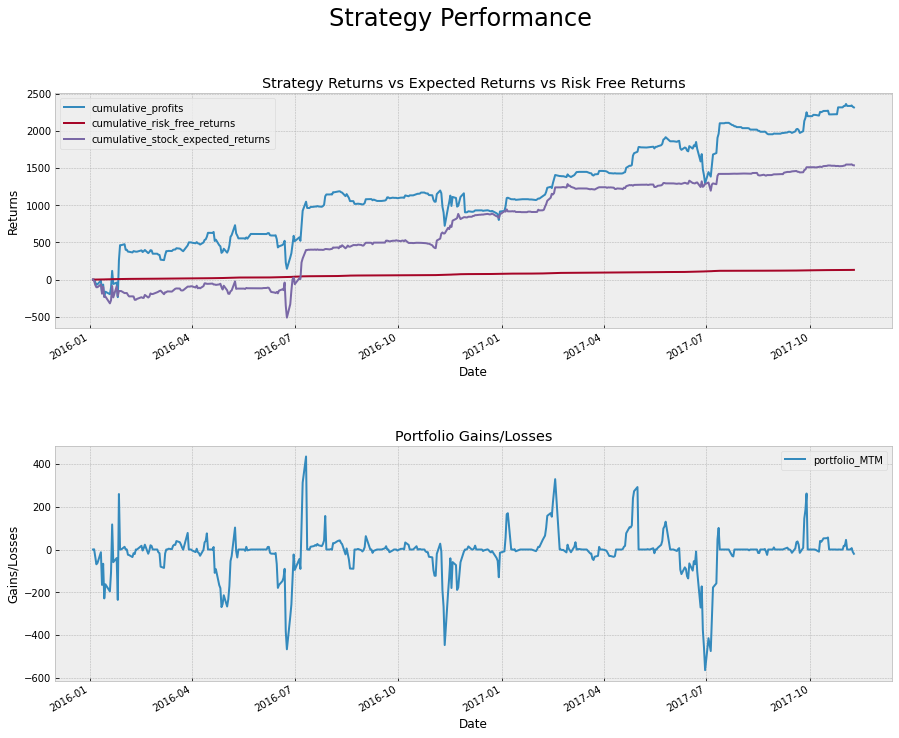

Average Portfolio Size: 3406.2464712153524, Maximum drawdown = -564.7199999999999


In [22]:
fig, (ax1, ax2) = plt.subplots(2)

evaluation[['cumulative_profits','cumulative_risk_free_returns', 'cumulative_stock_expected_returns']].plot(figsize=(15,12), ax = ax1)
ax1.set_title("Strategy Returns vs Expected Returns vs Risk Free Returns")
ax1.set_ylabel("Returns")

evaluation[['portfolio_MTM']].plot(figsize=(15,12), ax = ax2)
ax2.set_title("Portfolio Gains/Losses")
ax2.set_ylabel("Gains/Losses")

fig.suptitle("Strategy Performance",fontsize=24)
fig.subplots_adjust(hspace = 0.5)
plt.show()

print(f"Average Portfolio Size: {average_portfolio_value}, Maximum drawdown = {drawdown}")

In [23]:
plot_train_test_by_q(algorithm_name="DQN",
                     train_env=train_env,
                     test_env=test_env,
                     date_split='2016-01-01',
                     train_actions=train_actions,
                     train_rewards=train_rewards,
                     train_position_value=train_position_value,
                     train_profits=train_profits,
                     test_actions=test_actions,
                     test_rewards=test_rewards,
                     test_position_value=test_position_value,
                     test_profits=test_profits)


Gray: HOLD, Cyan: BUY, Magenta: SELL
Max Position Value: 2616.1499999999987
Min Position Value: -790.8700000000006
Last Action Taken: 1


In [24]:
# The reinforced trading advisor
#
# Better Model
# 1. State should consist of data with past history of min t_history instead of 0,0,0,0 (Jie Shen)
# 2. More Actions
#    - Buying more than 1 stock at each time period
#    - Not selling all stocks at each time period
# 3. More states
#     - Moving averages (Nirav)
#     - Momentum (rate of change of price) (Nirav)
#     - Daily Volume (Nirav)
# 4. Using returns as part of the state? (Done)
#
# Better rewards to represent reality
# 1. Negative reward for drawdown? (cost of funding/opportunity cost) (holding cost) (Nirav)
# 2. Negative reward for Transaction cost? (Nirav)
# 3. Not clipping rewwards (Jie Shen)
# 4. Rewarding/not rewarding volatilty (Jie Shen/Nirav)
#
# Better Evaluation
# 1. Compare it against the market S&P * beta? (Wei Cheng) (sharpe-ratio, risk-adjusted returns)
# 2. Maximum loss (drawdown) (Wei Cheng)
# 3. Maximum profit (Wei Cheng)
# 4. Test it with another company within the same sector and outside the sector (Wei Cheng)
# 5. Improve on the graph (returns vs S&P returns)
## Sharpe Ratio
# sharpe_ratio = (portfolio_returns - risk_free_rate) / sd(portfolio_returns - risk_free_rate)
# Main Wrapper for CLI (Jie Shen/Wei Cheng)